In [1]:
import pandas as pd
import xlrd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
np.set_printoptions(threshold=np.inf)
import time

In [2]:
dfOrig = pd.read_excel('historicalData.xlsx')

In [3]:
# Dictionary to store number of Regions each DC ships to
DCRegionPairs = {4: 30, 5: 30, 7: 12, 8: 18}

## Section 1: Sub-functions

In [4]:
#Testing purposes only
#targetVar = ['Nplus1CUBE','Nplus2CUBE']
targetVar = ['Nplus1CUBE']
testWeek = 248
DC=8
modelType = 'Global'

### Filter data by DC if Global model, scale features and target variables, separate data into train and test splits

In [5]:
# DC = distribution centre
# returns train and test dataframes
def createDataframes(modelType, DC, testWeek):
    df = dfOrig
    #Drop any rows with missing values
    df = df.dropna()
    #Remove holidays & sales
    #df = df.drop(list(df)[148:], axis=1)
    if modelType == 'Global':
        #Filter based on DC indicated
        df = df.loc[df['DC'] == DC]
        #Split into train and test set with last X weeks being test data
        return df[df['cumWW'] < testWeek], df[(df['cumWW'] >= testWeek)]
    
    elif modelType == 'Monolithic':
        #Don't filter by DC
        return df[df['cumWW'] < testWeek], df[(df['cumWW'] >= testWeek)]
        

    

   
    #return df[df['cumWW'] < testWeek], df[(df['cumWW'] >= testWeek)]

In [6]:
# identify columns to be scaled
# only has to be run once, not every week
def identifyScaledColumns(df):
    # identify binary columns
    boolColumns = [col for col in df if df[col].dropna().value_counts().index.isin([0,1]).all()]
    # add in columns to not be scaled, that are not part of feature set as already one hot encoded
    nonScaledColumns = ['cumWW', 'YYYY', 'WW', 'REGION_ID', 'DC'] + boolColumns
    #identify columns to be scaled
    scaledColumns =  [x for x in list(df) if x not in nonScaledColumns]
    return scaledColumns

In [7]:
# Return normalized training data and return training parameters to later re-use to transform test data
# has to be run every week as data needs to be re-scaled
# https://stackoverflow.com/questions/43675665/when-scale-the-data-why-the-train-dataset-use-fit-and-transform-but-the-te
def custom_scaler(train_df, test_df,targetVar):
    #identify columns to be scaled
    scaledColumns = identifyScaledColumns(train_df)
    # zero mean and unit variance for scaledColumns
    scaler = MinMaxScaler()
    #Find parameters using only train data
    scaler.fit(train_df[scaledColumns])
    #StandardScaler(copy=True, with_mean=True, with_std=True)
    #Create second scaler for just the target variables
    scaler_target = MinMaxScaler()
    scaler_target.fit(train_df[targetVar])
    
    # Use same parameters to scale both train and test data
    scaled_train = scaler.transform(train_df[scaledColumns])
    scaled_test = scaler.transform(test_df[scaledColumns])
    
    #Convert numpy array to dataframes
    scaled_train_df = pd.DataFrame(data=scaled_train, columns = train_df[scaledColumns].columns, index=train_df.index)
    scaled_test_df = pd.DataFrame(data=scaled_test, columns = test_df[scaledColumns].columns, index=test_df.index)
    
    #merge scaled columns with nonScaledColumns and re-order columns
    nonScaled_train_df = train_df.drop(scaledColumns, axis=1)
    nonScaled_test_df = test_df.drop(scaledColumns, axis=1)
    scaled_train_df_merged = (nonScaled_train_df.join(scaled_train_df)).reindex(train_df.columns, axis=1)
    scaled_test_df_merged = (nonScaled_test_df.join(scaled_test_df)).reindex(test_df.columns, axis=1)
    
    # return train_df with scaled columns and the scaler_target object
    return scaled_train_df_merged, scaled_test_df_merged, scaler_target

In [8]:
#Can't do randomized train/test split since temporal data
#Testing purposes
train_df, test_df = createDataframes(modelType,DC, testWeek)
scaled_train_df, scaled_test_df, scaler_target = custom_scaler(train_df, test_df,targetVar)

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [9]:
def train_test_split(scaled_train_df, scaled_test_df,targetVar):
    non_train_columns = ['Nplus1CUBE','Nplus2CUBE','cumWW', 'YYYY', 'WW', 'REGION_ID', 'DC']
    X_train = scaled_train_df.drop(non_train_columns,axis=1)
    X_val = scaled_test_df.drop(non_train_columns,axis=1)
    #Comment out above lines and uncomment out below lines to select a subset of training features
    #train_columns = ['Nminus50CUBE','Nminus51CUBE','Nminus2CUBE','Nminus1CUBE','CUBE','temperatureMin','tempMinNminus50Avg', 'tempMinNminus51Avg','rainDays','snowDays','inches']
    #X_train = scaled_train_df[train_columns]
    #X_val = scaled_test_df[train_columns]
    Y_train = scaled_train_df[targetVar]
    Y_val = scaled_test_df[targetVar]
    return X_train,Y_train,X_val,Y_val 

In [10]:
X_train,Y_train,X_val,Y_val = train_test_split(scaled_train_df, scaled_test_df,targetVar)

In [11]:
X_val

,NET_POS_CUBE,INV_CUBE,CUBE,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,W1,...,Nplus3 August Civic,Nplus3 Canada Day,Nplus3 Christmas Boxing Day,Nplus3 Family Day,Nplus3 Good Friday,Nplus3 Labour Day,Nplus3 New Year's,Nplus3 St. Jean Baptiste (PQ only),Nplus3 Thanksgiving,Nplus3 Victoria Day
22232,0.043720,0.099277,0.097496,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22235,0.067089,0.180508,0.135953,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22238,0.082686,0.211739,0.129303,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22241,0.013599,0.045294,0.022981,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22244,0.016199,0.051408,0.035853,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22247,0.052486,0.127397,0.089956,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22250,0.050207,0.131288,0.075232,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22253,0.263208,0.655319,0.438817,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22256,0.141395,0.344020,0.241865,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
22259,0.072004,0.145121,0.094707,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
Y_val

,Nplus1CUBE
22232,0.091263
22235,0.073007
22238,0.182278
22241,0.022749
22244,0.044796
22247,0.103243
22250,0.097506
22253,0.462867
22256,0.198054
22259,0.115149


## Section 2: Tensorflow
#### Model 1F is shown

In [13]:
import tensorflow as tf
from tensorflow.python.keras.layers import Dense, Input, Flatten, Dropout
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.models import optimizers
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras import backend as K
from tensorflow.python.keras.regularizers import l2
from tensorflow.python.keras.layers.normalization import BatchNormalization

In [14]:
def show_error(history):
    plt.plot(history.history['mean_squared_error'])
    plt.plot(history.history['val_mean_squared_error'])
    plt.title('model error')
    plt.ylabel('mean squared error')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [15]:
def show_loss(history):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [18]:
def fitModel(X_train,Y_train,X_val,Y_val):

    tf.reset_default_graph()
    try:
        del model
    except:
        pass
    K.clear_session()

    graph = tf.get_default_graph()

    # Create model: sigmoid, tanh, elu
    model = Sequential([
        Dense(8, activation='tanh', kernel_initializer='glorot_normal',kernel_regularizer=l2(0.01), input_shape=(X_train.shape[1],)),
        #Dropout(0.25),
        #Dense(4,kernel_regularizer=l2(0.01), activation='relu'),
        #Dropout(0.35),
        Dense(len(targetVar),kernel_regularizer=l2(0.01))
    ])
    model.summary()

    #https://keras.io/getting-started/sequential-model-guide/
    custom = optimizers.RMSprop(lr=0.0002, rho=0.9, epsilon=None, decay=0.0)
    model.compile(optimizer=custom, loss='mse', metrics=['mse'])

    hist = model.fit(X_train, Y_train, batch_size=64, epochs=20, validation_data=(X_val, Y_val))
    
    show_loss(hist)
    show_error(hist)
    
    return model

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3294 samples, validate on 918 samples
Epoch 1/20
3294/3294 [==============================] - 2s 486us/step - loss: 0.2218 - mean_squared_error: 0.0691 - val_loss: 0.2152 - val_mean_squared_error: 0.0713
Epoch 2/20
3294/3294 [==============================] - 0s 46us/step - loss: 0.1772 - mean_squared_error: 0.0411 - val_loss: 0.1741 - val_mean_squared_error: 0.0461
Epoch 3/20
3294/3294 [==============================] - 0s 42us/step - loss: 0.1456 - mean_squared_error: 0.0250 - val_loss: 0.1461 - val_mean_squared_error: 

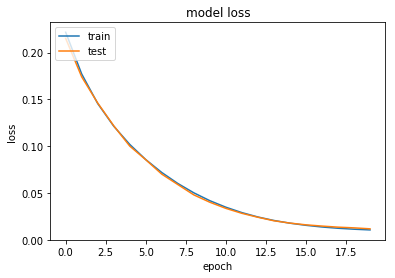

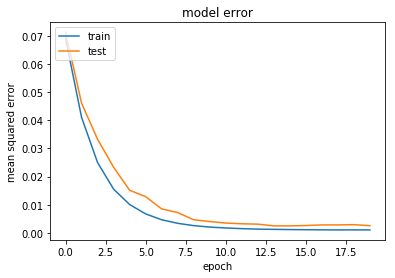

In [19]:
model = fitModel(X_train,Y_train,X_val,Y_val)

## Section 3: Make predictions

In [20]:
#Makes predictions based on size of X_val
# Returns 1x4 row vector: testWeek,DC, Aggregated Nplus1CUBE Predictions & Actual orAggregated Nplus2CUBE Predictions & Actual
def makeDCPredictions(testWeek, scaler_target, model, X_val, targetVar, test_df,DC):
    #print(model.predict(X_val))
    y_pred_df = pd.DataFrame(data=scaler_target.inverse_transform(model.predict(X_val)), index=test_df.index, columns=[s + 'Prediction' for s in targetVar])
    y_actual_df = test_df[targetVar]
    y_joined_df = (y_pred_df.join(y_actual_df)).reset_index()
    y_joined_df = y_joined_df.drop('index',1)
    
    DC_joined_df = y_joined_df.groupby(y_joined_df.index // DCRegionPairs[DC]).sum()
    DC_joined_df.insert(loc=0,column='DC',value = DC)
    weeks=np.arange(testWeek,testWeek+DC_joined_df.shape[0])
    DC_joined_df.insert(loc=0,column='testWeek',value =weeks)
    return DC_joined_df.loc[(DC_joined_df.DC == DC) & (DC_joined_df.testWeek == testWeek)]
    #return DC_joined_df

In [21]:
DC_joined_df=makeDCPredictions(testWeek, scaler_target, model, X_val, targetVar, test_df,DC)

In [22]:
DC_joined_df

,testWeek,DC,Nplus1CUBEPrediction,Nplus1CUBE
0,248,8,445473.03125,485248.742811


### Single Wrapper Function

In [23]:
def DCPrediction(modelType, testWeek, DC, targetVar):
    train_df, test_df = createDataframes(modelType, DC, testWeek)
    scaled_train_df, scaled_test_df, scaler_target = custom_scaler(train_df, test_df, targetVar)
    X_train,Y_train,X_val,Y_val = train_test_split(scaled_train_df, scaled_test_df,targetVar)
    model = fitModel(X_train,Y_train,X_val,Y_val)
    DC_joined_df = makeDCPredictions(testWeek, scaler_target, model, X_val, targetVar, test_df,DC)
    return DC_joined_df

### All 52 weeks and all DCs

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5460 samples, validate on 1560 samples
Epoch 1/20
5460/5460 [==============================] - 0s 83us/step - loss: 0.2227 - mean_squared_error: 0.0650 - val_loss: 0.1824 - val_mean_squared_error: 0.0369
Epoch 2/20
5460/5460 [==============================] - 0s 42us/step - loss: 0.1582 - mean_squared_error: 0.0250 - val_loss: 0.1416 - val_mean_squared_error: 0.0213
Epoch 3/20
5460/5460 [==============================] - 0s 39us/step - loss: 0.1196 - mean_squared_error: 0.0114 - val_loss: 0.1063 - val_mean_squared_error: 

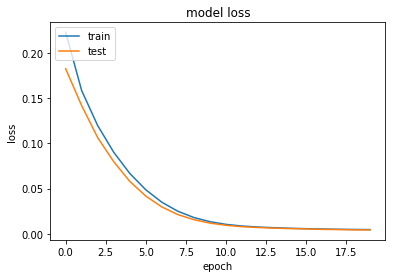

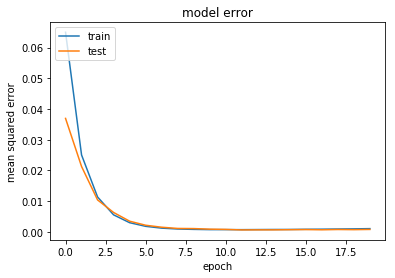

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5460 samples, validate on 1560 samples
Epoch 1/20
5460/5460 [==============================] - 0s 81us/step - loss: 0.3220 - mean_squared_error: 0.1630 - val_loss: 0.1910 - val_mean_squared_error: 0.0429
Epoch 2/20
5460/5460 [==============================] - 0s 47us/step - loss: 0.1663 - mean_squared_error: 0.0304 - val_loss: 0.1435 - val_mean_squared_error: 0.0202
Epoch 3/20
5460/5460 [==============================] - 0s 43us/step - loss: 0.1241 - mean_squared_error: 0.0127 - val_loss: 0.1095 - val_mean_squared_error: 

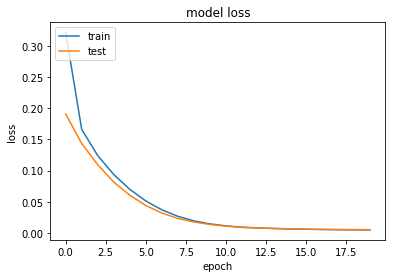

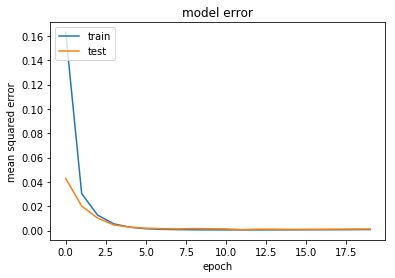

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2184 samples, validate on 624 samples
Epoch 1/20
2184/2184 [==============================] - 0s 148us/step - loss: 0.5366 - mean_squared_error: 0.3724 - val_loss: 0.4255 - val_mean_squared_error: 0.2654
Epoch 2/20
2184/2184 [==============================] - 0s 44us/step - loss: 0.3103 - mean_squared_error: 0.1539 - val_loss: 0.2618 - val_mean_squared_error: 0.1097
Epoch 3/20
2184/2184 [==============================] - 0s 40us/step - loss: 0.2281 - mean_squared_error: 0.0803 - val_loss: 0.2009 - val_mean_squared_error: 

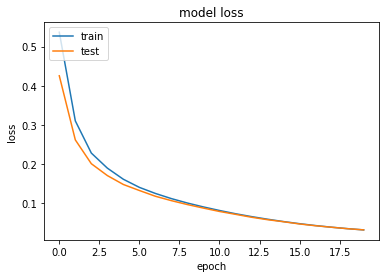

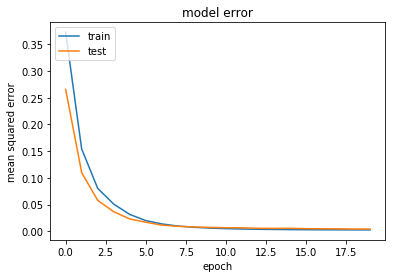

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3276 samples, validate on 936 samples
Epoch 1/20
3276/3276 [==============================] - 0s 110us/step - loss: 0.3883 - mean_squared_error: 0.2095 - val_loss: 0.3203 - val_mean_squared_error: 0.1470
Epoch 2/20
3276/3276 [==============================] - 0s 46us/step - loss: 0.2328 - mean_squared_error: 0.0657 - val_loss: 0.2399 - val_mean_squared_error: 0.0799
Epoch 3/20
3276/3276 [==============================] - 0s 42us/step - loss: 0.1917 - mean_squared_error: 0.0384 - val_loss: 0.2103 - val_mean_squared_error: 

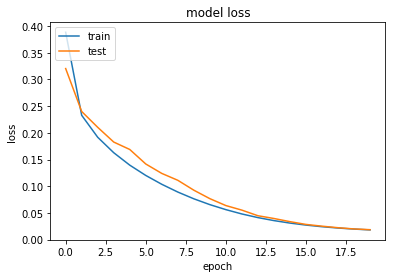

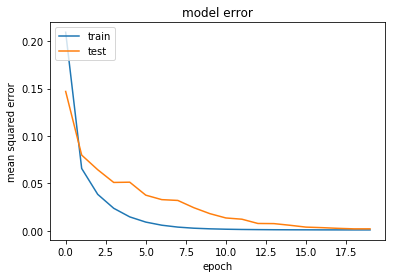

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5490 samples, validate on 1530 samples
Epoch 1/20
5490/5490 [==============================] - 0s 86us/step - loss: 0.1611 - mean_squared_error: 0.0214 - val_loss: 0.1388 - val_mean_squared_error: 0.0157
Epoch 2/20
5490/5490 [==============================] - 0s 41us/step - loss: 0.1203 - mean_squared_error: 0.0118 - val_loss: 0.1036 - val_mean_squared_error: 0.0091
Epoch 3/20
5490/5490 [==============================] - 0s 40us/step - loss: 0.0889 - mean_squared_error: 0.0067 - val_loss: 0.0760 - val_mean_squared_error: 

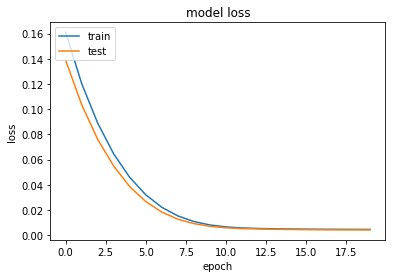

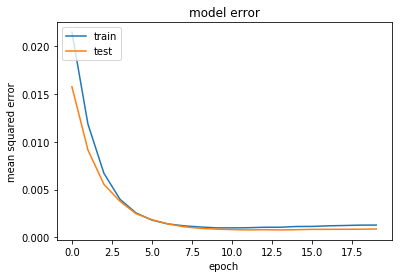

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5490 samples, validate on 1530 samples
Epoch 1/20
5490/5490 [==============================] - 0s 80us/step - loss: 0.2930 - mean_squared_error: 0.1308 - val_loss: 0.1943 - val_mean_squared_error: 0.0429
Epoch 2/20
5490/5490 [==============================] - 0s 44us/step - loss: 0.1729 - mean_squared_error: 0.0339 - val_loss: 0.1485 - val_mean_squared_error: 0.0219
Epoch 3/20
5490/5490 [==============================] - 0s 40us/step - loss: 0.1303 - mean_squared_error: 0.0155 - val_loss: 0.1148 - val_mean_squared_error: 

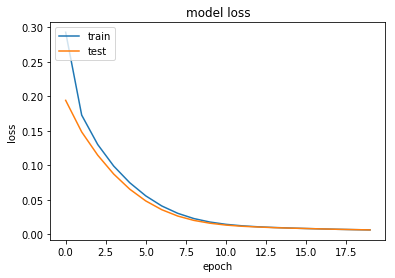

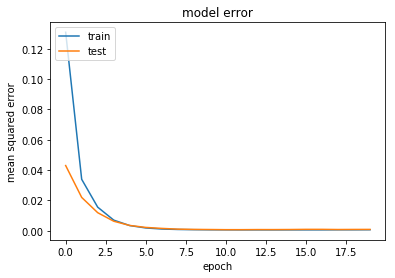

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2196 samples, validate on 612 samples
Epoch 1/20
2196/2196 [==============================] - 0s 138us/step - loss: 0.3729 - mean_squared_error: 0.2095 - val_loss: 0.2508 - val_mean_squared_error: 0.0915
Epoch 2/20
2196/2196 [==============================] - 0s 46us/step - loss: 0.2225 - mean_squared_error: 0.0674 - val_loss: 0.1902 - val_mean_squared_error: 0.0402
Epoch 3/20
2196/2196 [==============================] - 0s 40us/step - loss: 0.1839 - mean_squared_error: 0.0389 - val_loss: 0.1699 - val_mean_squared_error: 

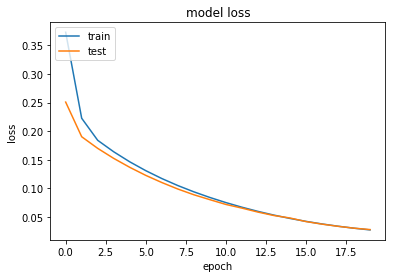

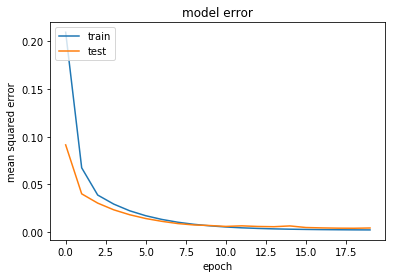

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3294 samples, validate on 918 samples
Epoch 1/20
3294/3294 [==============================] - 0s 109us/step - loss: 0.2601 - mean_squared_error: 0.0865 - val_loss: 0.2404 - val_mean_squared_error: 0.0736
Epoch 2/20
3294/3294 [==============================] - 0s 41us/step - loss: 0.2068 - mean_squared_error: 0.0462 - val_loss: 0.1991 - val_mean_squared_error: 0.0452
Epoch 3/20
3294/3294 [==============================] - 0s 41us/step - loss: 0.1735 - mean_squared_error: 0.0261 - val_loss: 0.1712 - val_mean_squared_error: 

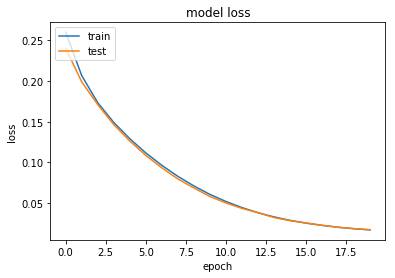

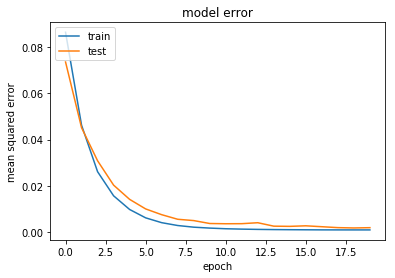

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5520 samples, validate on 1500 samples
Epoch 1/20
5520/5520 [==============================] - 0s 79us/step - loss: 0.2267 - mean_squared_error: 0.0683 - val_loss: 0.1942 - val_mean_squared_error: 0.0498
Epoch 2/20
5520/5520 [==============================] - 0s 41us/step - loss: 0.1572 - mean_squared_error: 0.0258 - val_loss: 0.1395 - val_mean_squared_error: 0.0215
Epoch 3/20
5520/5520 [==============================] - 0s 38us/step - loss: 0.1183 - mean_squared_error: 0.0123 - val_loss: 0.1050 - val_mean_squared_error: 

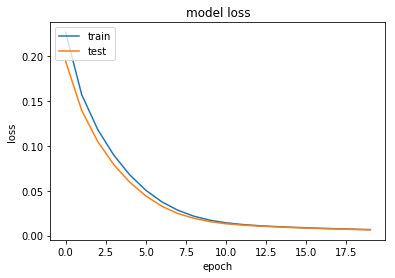

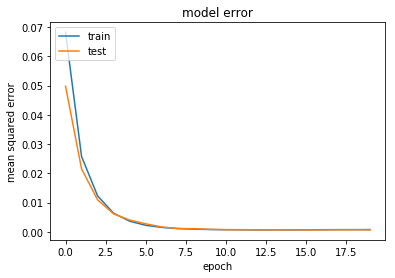

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5520 samples, validate on 1500 samples
Epoch 1/20
5520/5520 [==============================] - 0s 78us/step - loss: 0.1950 - mean_squared_error: 0.0440 - val_loss: 0.1666 - val_mean_squared_error: 0.0302
Epoch 2/20
5520/5520 [==============================] - 0s 41us/step - loss: 0.1459 - mean_squared_error: 0.0224 - val_loss: 0.1285 - val_mean_squared_error: 0.0183
Epoch 3/20
5520/5520 [==============================] - 0s 38us/step - loss: 0.1100 - mean_squared_error: 0.0117 - val_loss: 0.0983 - val_mean_squared_error: 

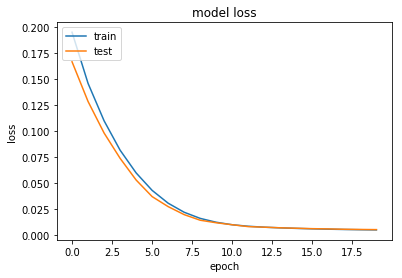

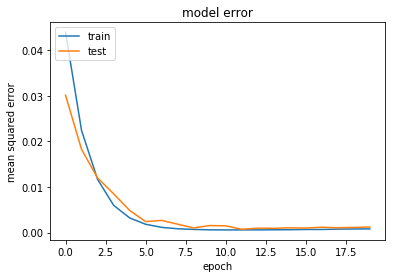

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2208 samples, validate on 600 samples
Epoch 1/20
2208/2208 [==============================] - 0s 146us/step - loss: 0.4495 - mean_squared_error: 0.2862 - val_loss: 0.2823 - val_mean_squared_error: 0.1230
Epoch 2/20
2208/2208 [==============================] - 0s 49us/step - loss: 0.2708 - mean_squared_error: 0.1153 - val_loss: 0.2520 - val_mean_squared_error: 0.1008
Epoch 3/20
2208/2208 [==============================] - 0s 42us/step - loss: 0.2135 - mean_squared_error: 0.0667 - val_loss: 0.2284 - val_mean_squared_error: 

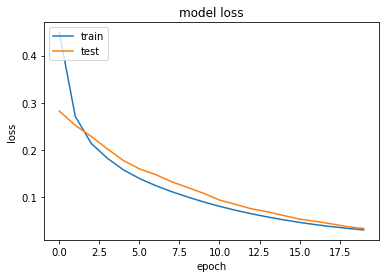

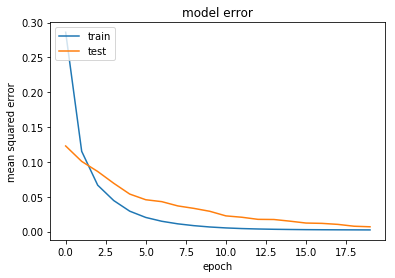

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3312 samples, validate on 900 samples
Epoch 1/20
3312/3312 [==============================] - 0s 109us/step - loss: 0.2180 - mean_squared_error: 0.0589 - val_loss: 0.2120 - val_mean_squared_error: 0.0624
Epoch 2/20
3312/3312 [==============================] - 0s 37us/step - loss: 0.1781 - mean_squared_error: 0.0369 - val_loss: 0.1735 - val_mean_squared_error: 0.0412
Epoch 3/20
3312/3312 [==============================] - 0s 38us/step - loss: 0.1473 - mean_squared_error: 0.0230 - val_loss: 0.1459 - val_mean_squared_error: 

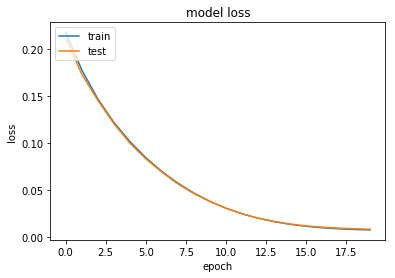

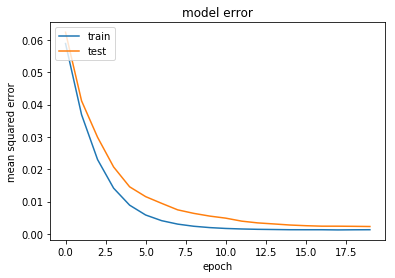

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5550 samples, validate on 1470 samples
Epoch 1/20
5550/5550 [==============================] - 0s 79us/step - loss: 0.3111 - mean_squared_error: 0.1463 - val_loss: 0.2234 - val_mean_squared_error: 0.0689
Epoch 2/20
5550/5550 [==============================] - 0s 44us/step - loss: 0.1810 - mean_squared_error: 0.0373 - val_loss: 0.1664 - val_mean_squared_error: 0.0340
Epoch 3/20
5550/5550 [==============================] - 0s 38us/step - loss: 0.1370 - mean_squared_error: 0.0158 - val_loss: 0.1261 - val_mean_squared_error: 

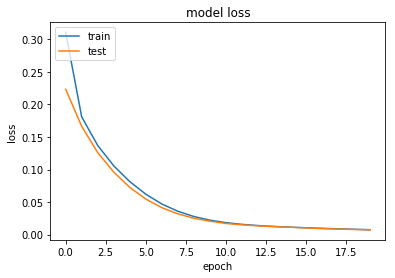

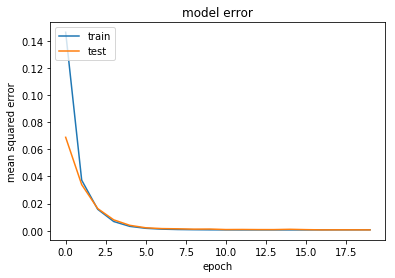

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5550 samples, validate on 1470 samples
Epoch 1/20
5550/5550 [==============================] - 0s 80us/step - loss: 0.1853 - mean_squared_error: 0.0316 - val_loss: 0.1665 - val_mean_squared_error: 0.0281
Epoch 2/20
5550/5550 [==============================] - 0s 38us/step - loss: 0.1404 - mean_squared_error: 0.0158 - val_loss: 0.1273 - val_mean_squared_error: 0.0164
Epoch 3/20
5550/5550 [==============================] - 0s 39us/step - loss: 0.1075 - mean_squared_error: 0.0087 - val_loss: 0.0965 - val_mean_squared_error: 

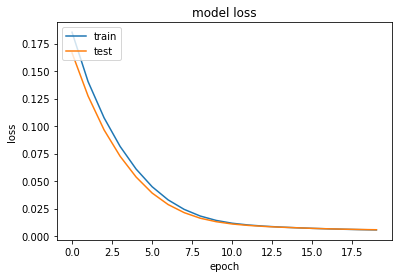

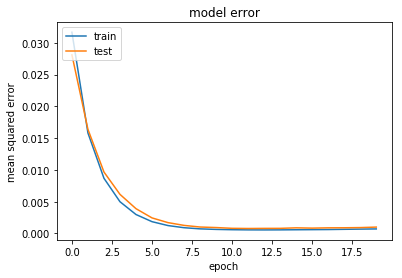

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2220 samples, validate on 588 samples
Epoch 1/20
2220/2220 [==============================] - 0s 162us/step - loss: 0.2743 - mean_squared_error: 0.0992 - val_loss: 0.2508 - val_mean_squared_error: 0.0808
Epoch 2/20
2220/2220 [==============================] - 0s 46us/step - loss: 0.2368 - mean_squared_error: 0.0713 - val_loss: 0.2223 - val_mean_squared_error: 0.0615
Epoch 3/20
2220/2220 [==============================] - 0s 46us/step - loss: 0.2102 - mean_squared_error: 0.0538 - val_loss: 0.1975 - val_mean_squared_error: 

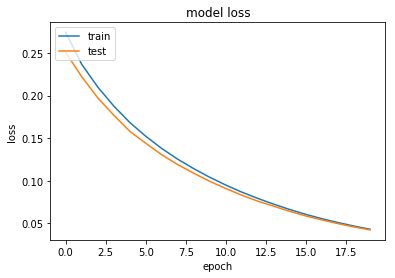

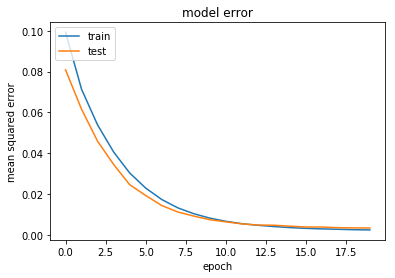

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3330 samples, validate on 882 samples
Epoch 1/20
3330/3330 [==============================] - 0s 112us/step - loss: 0.3306 - mean_squared_error: 0.1747 - val_loss: 0.2239 - val_mean_squared_error: 0.0733
Epoch 2/20
3330/3330 [==============================] - 0s 43us/step - loss: 0.1914 - mean_squared_error: 0.0470 - val_loss: 0.1690 - val_mean_squared_error: 0.0317
Epoch 3/20
3330/3330 [==============================] - 0s 38us/step - loss: 0.1544 - mean_squared_error: 0.0241 - val_loss: 0.1412 - val_mean_squared_error: 

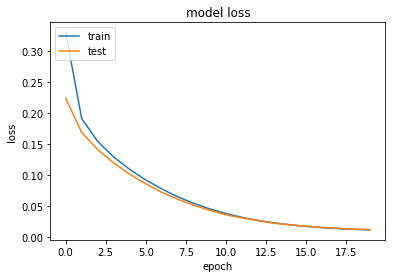

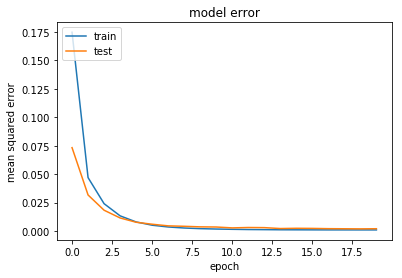

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5580 samples, validate on 1440 samples
Epoch 1/20
5580/5580 [==============================] - 0s 79us/step - loss: 0.2598 - mean_squared_error: 0.0975 - val_loss: 0.1988 - val_mean_squared_error: 0.0480
Epoch 2/20
5580/5580 [==============================] - 0s 40us/step - loss: 0.1869 - mean_squared_error: 0.0469 - val_loss: 0.1543 - val_mean_squared_error: 0.0254
Epoch 3/20
5580/5580 [==============================] - 0s 38us/step - loss: 0.1391 - mean_squared_error: 0.0209 - val_loss: 0.1218 - val_mean_squared_error: 

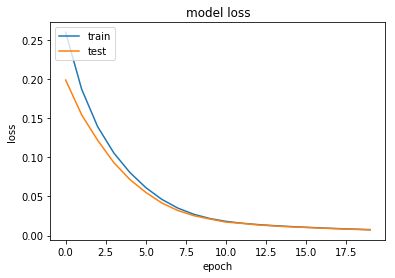

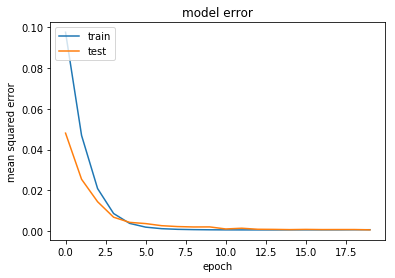

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5580 samples, validate on 1440 samples
Epoch 1/20
5580/5580 [==============================] - 0s 85us/step - loss: 0.2550 - mean_squared_error: 0.0794 - val_loss: 0.2184 - val_mean_squared_error: 0.0542
Epoch 2/20
5580/5580 [==============================] - 0s 42us/step - loss: 0.1821 - mean_squared_error: 0.0292 - val_loss: 0.1649 - val_mean_squared_error: 0.0240
Epoch 3/20
5580/5580 [==============================] - 0s 38us/step - loss: 0.1415 - mean_squared_error: 0.0123 - val_loss: 0.1375 - val_mean_squared_error: 

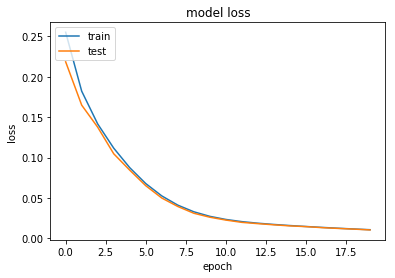

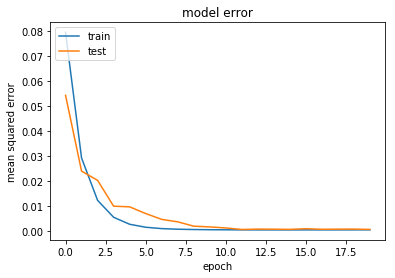

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2232 samples, validate on 576 samples
Epoch 1/20
2232/2232 [==============================] - 0s 139us/step - loss: 0.2555 - mean_squared_error: 0.1022 - val_loss: 0.2111 - val_mean_squared_error: 0.0642
Epoch 2/20
2232/2232 [==============================] - 0s 42us/step - loss: 0.1970 - mean_squared_error: 0.0558 - val_loss: 0.1783 - val_mean_squared_error: 0.0432
Epoch 3/20
2232/2232 [==============================] - 0s 38us/step - loss: 0.1688 - mean_squared_error: 0.0393 - val_loss: 0.1546 - val_mean_squared_error: 

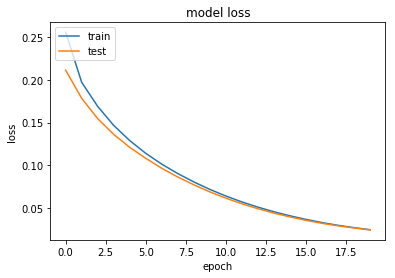

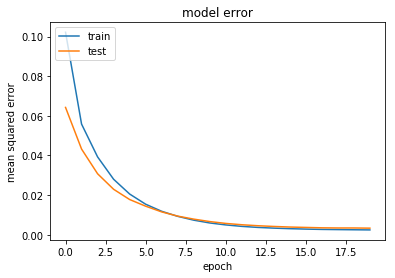

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3348 samples, validate on 864 samples
Epoch 1/20
3348/3348 [==============================] - 0s 103us/step - loss: 0.2421 - mean_squared_error: 0.0877 - val_loss: 0.1912 - val_mean_squared_error: 0.0443
Epoch 2/20
3348/3348 [==============================] - 0s 46us/step - loss: 0.1815 - mean_squared_error: 0.0419 - val_loss: 0.1578 - val_mean_squared_error: 0.0259
Epoch 3/20
3348/3348 [==============================] - 0s 44us/step - loss: 0.1496 - mean_squared_error: 0.0249 - val_loss: 0.1331 - val_mean_squared_error: 

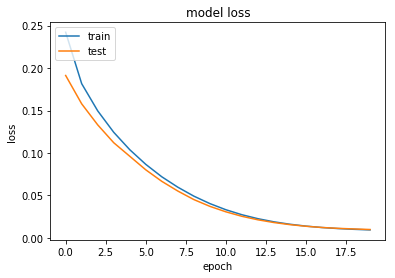

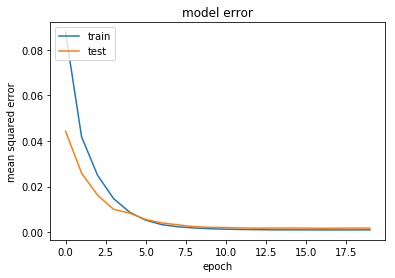

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5610 samples, validate on 1410 samples
Epoch 1/20
5610/5610 [==============================] - 0s 77us/step - loss: 0.2662 - mean_squared_error: 0.0945 - val_loss: 0.2238 - val_mean_squared_error: 0.0625
Epoch 2/20
5610/5610 [==============================] - 0s 38us/step - loss: 0.1876 - mean_squared_error: 0.0370 - val_loss: 0.1694 - val_mean_squared_error: 0.0300
Epoch 3/20
5610/5610 [==============================] - 0s 38us/step - loss: 0.1445 - mean_squared_error: 0.0162 - val_loss: 0.1301 - val_mean_squared_error: 

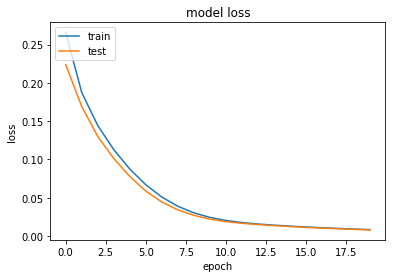

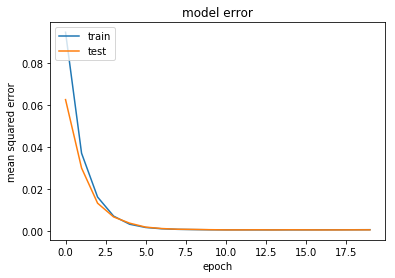

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5610 samples, validate on 1410 samples
Epoch 1/20
5610/5610 [==============================] - 0s 79us/step - loss: 0.1691 - mean_squared_error: 0.0259 - val_loss: 0.1434 - val_mean_squared_error: 0.0176
Epoch 2/20
5610/5610 [==============================] - 0s 42us/step - loss: 0.1229 - mean_squared_error: 0.0124 - val_loss: 0.1046 - val_mean_squared_error: 0.0091
Epoch 3/20
5610/5610 [==============================] - 0s 38us/step - loss: 0.0887 - mean_squared_error: 0.0061 - val_loss: 0.0751 - val_mean_squared_error: 

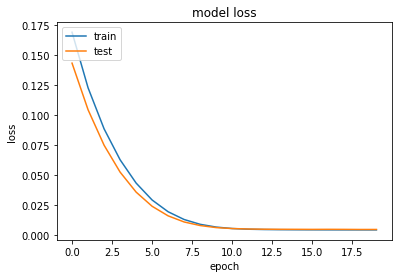

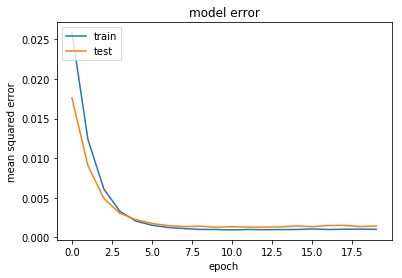

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2244 samples, validate on 564 samples
Epoch 1/20
2244/2244 [==============================] - 0s 133us/step - loss: 0.2157 - mean_squared_error: 0.0604 - val_loss: 0.2458 - val_mean_squared_error: 0.0968
Epoch 2/20
2244/2244 [==============================] - 0s 44us/step - loss: 0.1807 - mean_squared_error: 0.0368 - val_loss: 0.2220 - val_mean_squared_error: 0.0839
Epoch 3/20
2244/2244 [==============================] - 0s 41us/step - loss: 0.1574 - mean_squared_error: 0.0245 - val_loss: 0.1916 - val_mean_squared_error: 

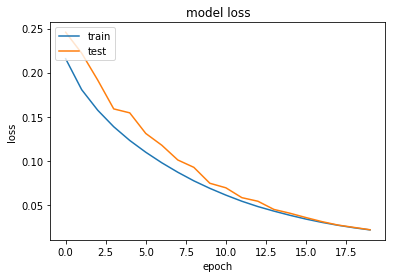

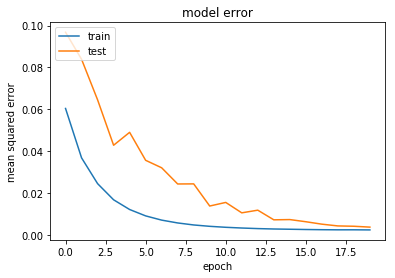

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3366 samples, validate on 846 samples
Epoch 1/20
3366/3366 [==============================] - 0s 97us/step - loss: 0.2170 - mean_squared_error: 0.0674 - val_loss: 0.2021 - val_mean_squared_error: 0.0603
Epoch 2/20
3366/3366 [==============================] - 0s 43us/step - loss: 0.1728 - mean_squared_error: 0.0379 - val_loss: 0.1618 - val_mean_squared_error: 0.0343
Epoch 3/20
3366/3366 [==============================] - 0s 38us/step - loss: 0.1411 - mean_squared_error: 0.0205 - val_loss: 0.1313 - val_mean_squared_error: 0

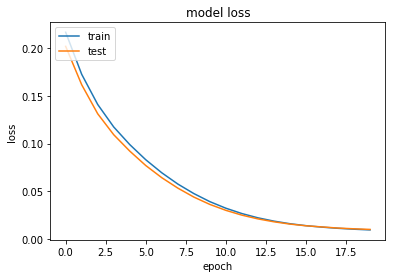

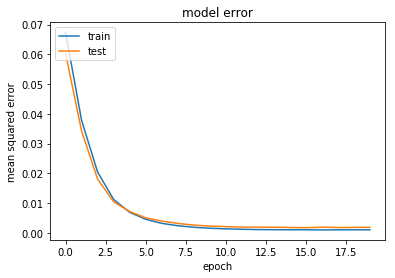

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5640 samples, validate on 1380 samples
Epoch 1/20
5640/5640 [==============================] - 0s 82us/step - loss: 0.2215 - mean_squared_error: 0.0641 - val_loss: 0.1950 - val_mean_squared_error: 0.0511
Epoch 2/20
5640/5640 [==============================] - 0s 42us/step - loss: 0.1514 - mean_squared_error: 0.0211 - val_loss: 0.1437 - val_mean_squared_error: 0.0273
Epoch 3/20
5640/5640 [==============================] - 0s 39us/step - loss: 0.1135 - mean_squared_error: 0.0097 - val_loss: 0.1036 - val_mean_squared_error: 

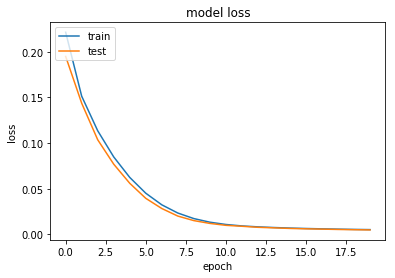

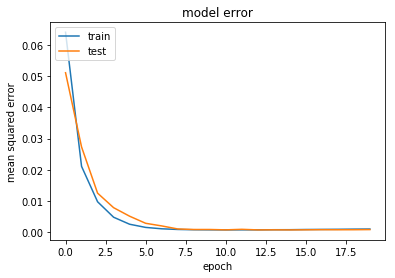

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5640 samples, validate on 1380 samples
Epoch 1/20
5640/5640 [==============================] - 0s 82us/step - loss: 0.2368 - mean_squared_error: 0.0680 - val_loss: 0.1977 - val_mean_squared_error: 0.0407
Epoch 2/20
5640/5640 [==============================] - 0s 39us/step - loss: 0.1755 - mean_squared_error: 0.0294 - val_loss: 0.1527 - val_mean_squared_error: 0.0182
Epoch 3/20
5640/5640 [==============================] - 0s 39us/step - loss: 0.1356 - mean_squared_error: 0.0120 - val_loss: 0.1211 - val_mean_squared_error: 

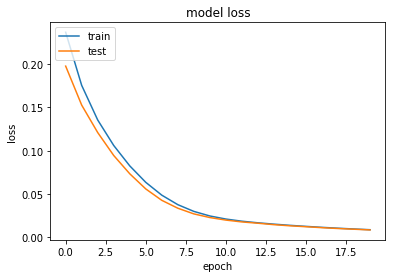

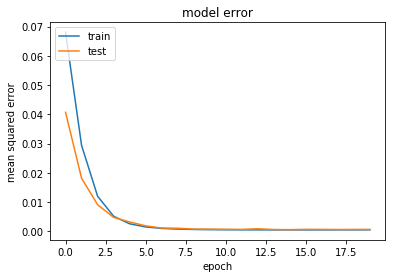

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2256 samples, validate on 552 samples
Epoch 1/20
2256/2256 [==============================] - 0s 135us/step - loss: 0.2213 - mean_squared_error: 0.0619 - val_loss: 0.1994 - val_mean_squared_error: 0.0467
Epoch 2/20
2256/2256 [==============================] - 0s 47us/step - loss: 0.1891 - mean_squared_error: 0.0418 - val_loss: 0.1735 - val_mean_squared_error: 0.0322
Epoch 3/20
2256/2256 [==============================] - 0s 44us/step - loss: 0.1643 - mean_squared_error: 0.0284 - val_loss: 0.1536 - val_mean_squared_error: 

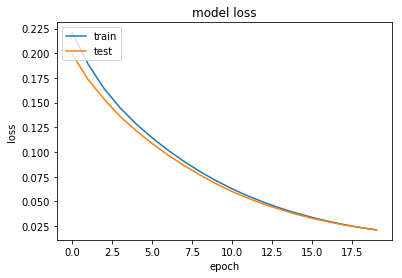

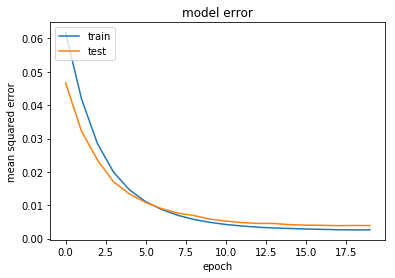

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3384 samples, validate on 828 samples
Epoch 1/20
3384/3384 [==============================] - 0s 106us/step - loss: 0.2840 - mean_squared_error: 0.1187 - val_loss: 0.2347 - val_mean_squared_error: 0.0765
Epoch 2/20
3384/3384 [==============================] - 0s 46us/step - loss: 0.2002 - mean_squared_error: 0.0496 - val_loss: 0.2194 - val_mean_squared_error: 0.0768
Epoch 3/20
3384/3384 [==============================] - 0s 43us/step - loss: 0.1665 - mean_squared_error: 0.0317 - val_loss: 0.1843 - val_mean_squared_error: 

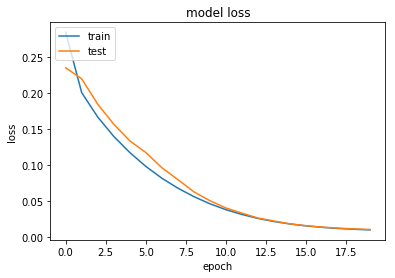

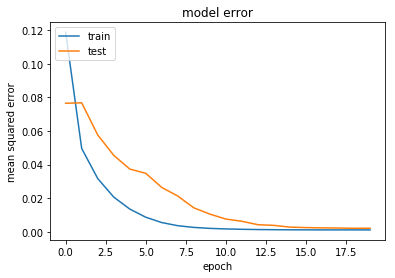

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5670 samples, validate on 1350 samples
Epoch 1/20
5670/5670 [==============================] - 0s 81us/step - loss: 0.3605 - mean_squared_error: 0.1990 - val_loss: 0.2381 - val_mean_squared_error: 0.0860
Epoch 2/20
5670/5670 [==============================] - 0s 44us/step - loss: 0.1733 - mean_squared_error: 0.0340 - val_loss: 0.1563 - val_mean_squared_error: 0.0308
Epoch 3/20
5670/5670 [==============================] - 0s 44us/step - loss: 0.1275 - mean_squared_error: 0.0153 - val_loss: 0.1173 - val_mean_squared_error: 

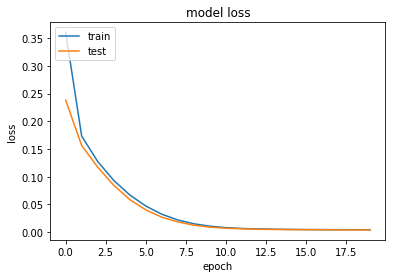

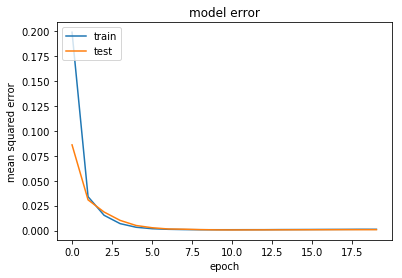

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5670 samples, validate on 1350 samples
Epoch 1/20
5670/5670 [==============================] - 0s 84us/step - loss: 0.1802 - mean_squared_error: 0.0327 - val_loss: 0.1523 - val_mean_squared_error: 0.0210
Epoch 2/20
5670/5670 [==============================] - 0s 41us/step - loss: 0.1313 - mean_squared_error: 0.0145 - val_loss: 0.1126 - val_mean_squared_error: 0.0103
Epoch 3/20
5670/5670 [==============================] - 0s 39us/step - loss: 0.0967 - mean_squared_error: 0.0072 - val_loss: 0.0827 - val_mean_squared_error: 

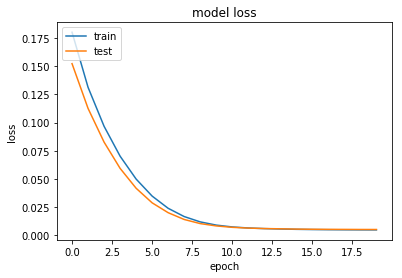

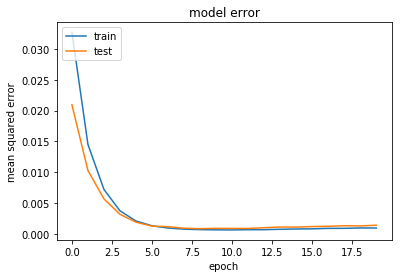

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2268 samples, validate on 540 samples
Epoch 1/20
2268/2268 [==============================] - 0s 133us/step - loss: 0.2542 - mean_squared_error: 0.0898 - val_loss: 0.2969 - val_mean_squared_error: 0.1391
Epoch 2/20
2268/2268 [==============================] - 0s 40us/step - loss: 0.2115 - mean_squared_error: 0.0593 - val_loss: 0.2408 - val_mean_squared_error: 0.0944
Epoch 3/20
2268/2268 [==============================] - 0s 37us/step - loss: 0.1824 - mean_squared_error: 0.0414 - val_loss: 0.2066 - val_mean_squared_error: 

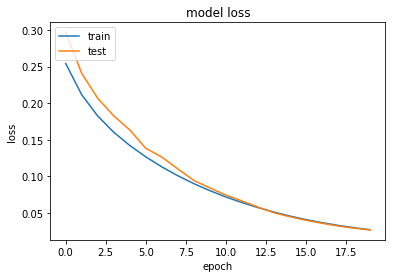

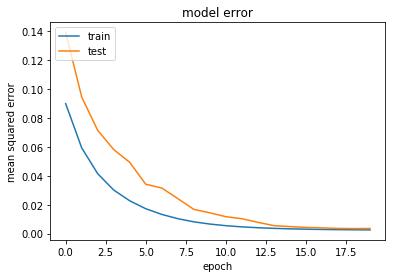

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3402 samples, validate on 810 samples
Epoch 1/20
3402/3402 [==============================] - 0s 100us/step - loss: 0.2974 - mean_squared_error: 0.1314 - val_loss: 0.2499 - val_mean_squared_error: 0.0916
Epoch 2/20
3402/3402 [==============================] - 0s 41us/step - loss: 0.2103 - mean_squared_error: 0.0592 - val_loss: 0.1916 - val_mean_squared_error: 0.0483
Epoch 3/20
3402/3402 [==============================] - 0s 37us/step - loss: 0.1690 - mean_squared_error: 0.0329 - val_loss: 0.1589 - val_mean_squared_error: 

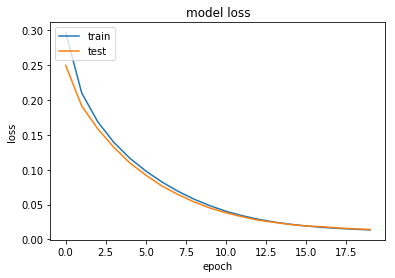

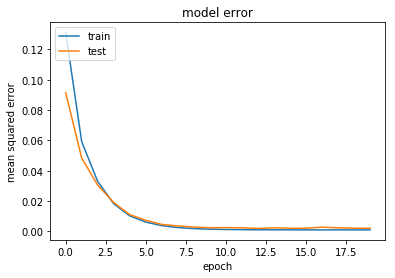

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5700 samples, validate on 1320 samples
Epoch 1/20
5700/5700 [==============================] - 0s 80us/step - loss: 0.2246 - mean_squared_error: 0.0534 - val_loss: 0.2162 - val_mean_squared_error: 0.0578
Epoch 2/20
5700/5700 [==============================] - 0s 41us/step - loss: 0.1698 - mean_squared_error: 0.0236 - val_loss: 0.1641 - val_mean_squared_error: 0.0308
Epoch 3/20
5700/5700 [==============================] - 0s 40us/step - loss: 0.1316 - mean_squared_error: 0.0106 - val_loss: 0.1240 - val_mean_squared_error: 

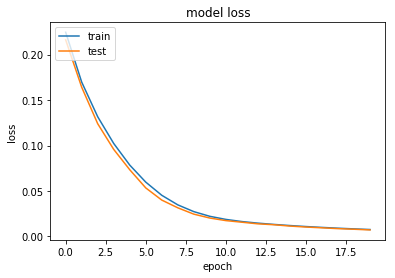

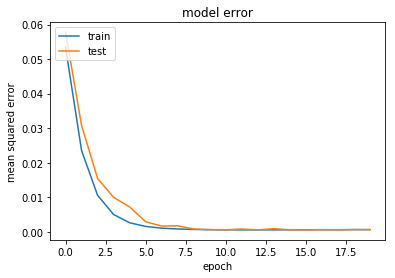

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5700 samples, validate on 1320 samples
Epoch 1/20
5700/5700 [==============================] - 0s 79us/step - loss: 0.2214 - mean_squared_error: 0.0518 - val_loss: 0.1943 - val_mean_squared_error: 0.0383
Epoch 2/20
5700/5700 [==============================] - 0s 44us/step - loss: 0.1654 - mean_squared_error: 0.0225 - val_loss: 0.1482 - val_mean_squared_error: 0.0190
Epoch 3/20
5700/5700 [==============================] - 0s 41us/step - loss: 0.1266 - mean_squared_error: 0.0102 - val_loss: 0.1121 - val_mean_squared_error: 

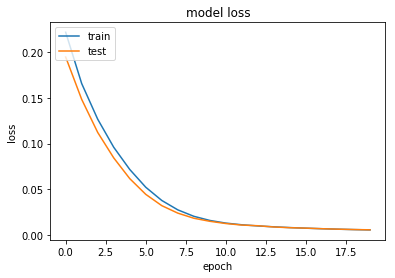

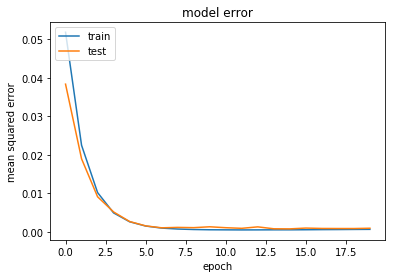

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2280 samples, validate on 528 samples
Epoch 1/20
2280/2280 [==============================] - 0s 135us/step - loss: 0.2951 - mean_squared_error: 0.1183 - val_loss: 0.2785 - val_mean_squared_error: 0.1076
Epoch 2/20
2280/2280 [==============================] - 0s 44us/step - loss: 0.2312 - mean_squared_error: 0.0654 - val_loss: 0.2275 - val_mean_squared_error: 0.0673
Epoch 3/20
2280/2280 [==============================] - 0s 41us/step - loss: 0.1990 - mean_squared_error: 0.0439 - val_loss: 0.1991 - val_mean_squared_error: 

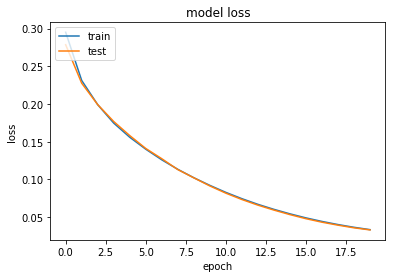

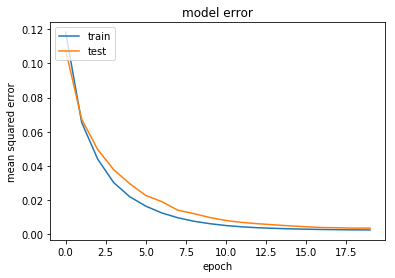

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3420 samples, validate on 792 samples
Epoch 1/20
3420/3420 [==============================] - 0s 103us/step - loss: 0.1996 - mean_squared_error: 0.0503 - val_loss: 0.1698 - val_mean_squared_error: 0.0302
Epoch 2/20
3420/3420 [==============================] - 0s 45us/step - loss: 0.1594 - mean_squared_error: 0.0283 - val_loss: 0.1418 - val_mean_squared_error: 0.0197
Epoch 3/20
3420/3420 [==============================] - 0s 44us/step - loss: 0.1314 - mean_squared_error: 0.0175 - val_loss: 0.1196 - val_mean_squared_error: 

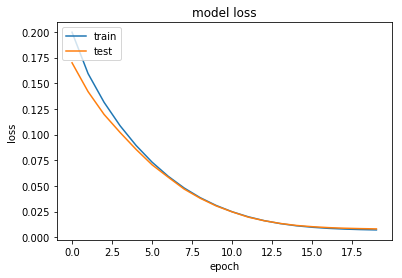

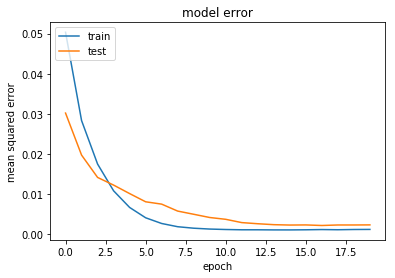

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5730 samples, validate on 1290 samples
Epoch 1/20
5730/5730 [==============================] - 1s 90us/step - loss: 0.2163 - mean_squared_error: 0.0654 - val_loss: 0.2007 - val_mean_squared_error: 0.0642
Epoch 2/20
5730/5730 [==============================] - 0s 40us/step - loss: 0.1549 - mean_squared_error: 0.0309 - val_loss: 0.1496 - val_mean_squared_error: 0.0382
Epoch 3/20
5730/5730 [==============================] - 0s 46us/step - loss: 0.1138 - mean_squared_error: 0.0137 - val_loss: 0.1050 - val_mean_squared_error: 

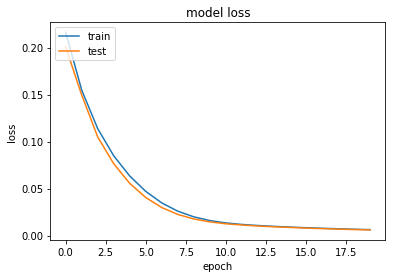

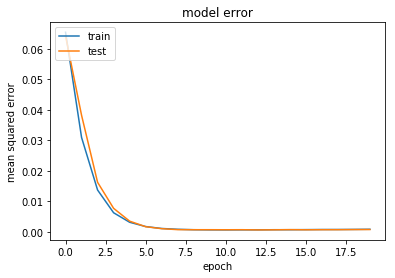

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5730 samples, validate on 1290 samples
Epoch 1/20
5730/5730 [==============================] - 0s 79us/step - loss: 0.2166 - mean_squared_error: 0.0657 - val_loss: 0.1883 - val_mean_squared_error: 0.0516
Epoch 2/20
5730/5730 [==============================] - 0s 47us/step - loss: 0.1561 - mean_squared_error: 0.0321 - val_loss: 0.1389 - val_mean_squared_error: 0.0275
Epoch 3/20
5730/5730 [==============================] - 0s 42us/step - loss: 0.1156 - mean_squared_error: 0.0160 - val_loss: 0.1041 - val_mean_squared_error: 

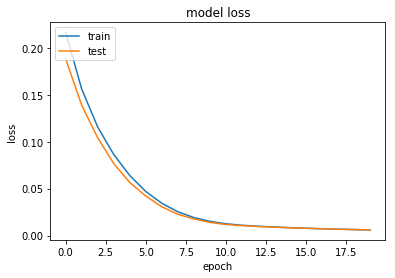

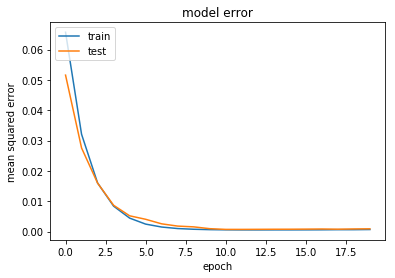

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2292 samples, validate on 516 samples
Epoch 1/20
2292/2292 [==============================] - 0s 126us/step - loss: 0.2539 - mean_squared_error: 0.0984 - val_loss: 0.2267 - val_mean_squared_error: 0.0763
Epoch 2/20
2292/2292 [==============================] - ETA: 0s - loss: 0.1859 - mean_squared_error: 0.03 - 0s 44us/step - loss: 0.1807 - mean_squared_error: 0.0354 - val_loss: 0.1784 - val_mean_squared_error: 0.0387
Epoch 3/20
2292/2292 [==============================] - 0s 43us/step - loss: 0.1598 - mean_squared_error: 

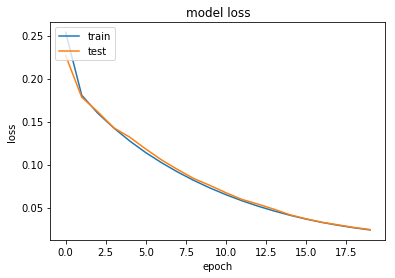

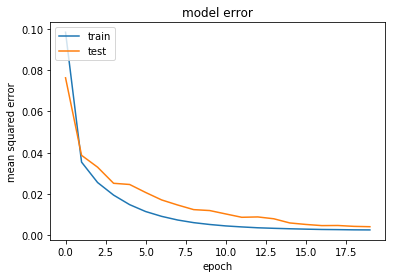

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3438 samples, validate on 774 samples
Epoch 1/20
3438/3438 [==============================] - 0s 99us/step - loss: 0.2997 - mean_squared_error: 0.1247 - val_loss: 0.2609 - val_mean_squared_error: 0.0929
Epoch 2/20
3438/3438 [==============================] - 0s 44us/step - loss: 0.2207 - mean_squared_error: 0.0594 - val_loss: 0.2022 - val_mean_squared_error: 0.0480
Epoch 3/20
3438/3438 [==============================] - 0s 37us/step - loss: 0.1789 - mean_squared_error: 0.0317 - val_loss: 0.1672 - val_mean_squared_error: 0

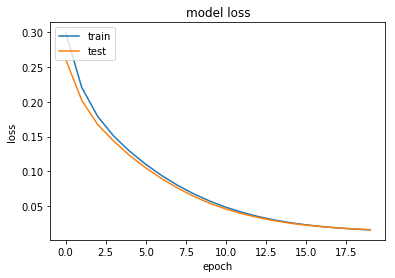

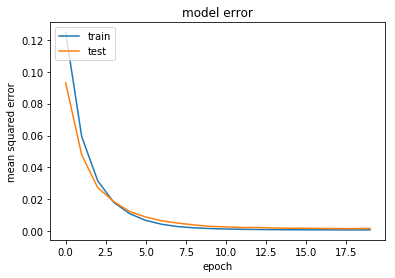

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5760 samples, validate on 1260 samples
Epoch 1/20
5760/5760 [==============================] - 0s 81us/step - loss: 0.1599 - mean_squared_error: 0.0202 - val_loss: 0.1332 - val_mean_squared_error: 0.0106
Epoch 2/20
5760/5760 [==============================] - 0s 43us/step - loss: 0.1161 - mean_squared_error: 0.0089 - val_loss: 0.0981 - val_mean_squared_error: 0.0059
Epoch 3/20
5760/5760 [==============================] - 0s 41us/step - loss: 0.0837 - mean_squared_error: 0.0046 - val_loss: 0.0702 - val_mean_squared_error: 

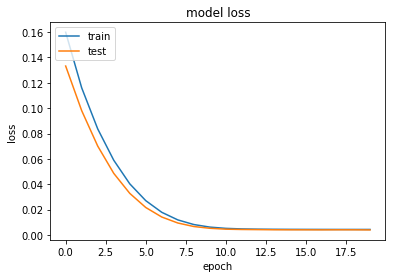

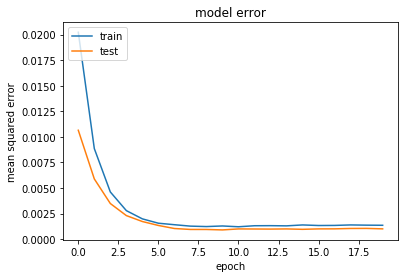

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5760 samples, validate on 1260 samples
Epoch 1/20
5760/5760 [==============================] - 0s 76us/step - loss: 0.3286 - mean_squared_error: 0.1528 - val_loss: 0.2495 - val_mean_squared_error: 0.0836
Epoch 2/20
5760/5760 [==============================] - 0s 41us/step - loss: 0.1997 - mean_squared_error: 0.0449 - val_loss: 0.1903 - val_mean_squared_error: 0.0473
Epoch 3/20
5760/5760 [==============================] - 0s 40us/step - loss: 0.1518 - mean_squared_error: 0.0205 - val_loss: 0.1433 - val_mean_squared_error: 

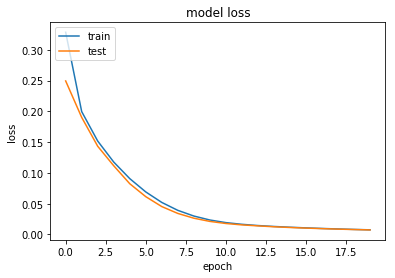

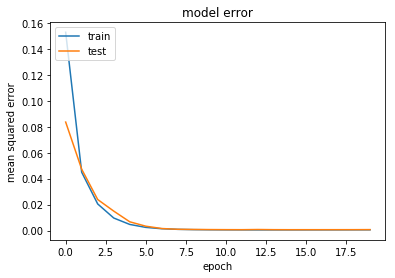

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2304 samples, validate on 504 samples
Epoch 1/20
2304/2304 [==============================] - 0s 139us/step - loss: 0.3284 - mean_squared_error: 0.1547 - val_loss: 0.2718 - val_mean_squared_error: 0.1032
Epoch 2/20
2304/2304 [==============================] - 0s 46us/step - loss: 0.2637 - mean_squared_error: 0.0996 - val_loss: 0.2295 - val_mean_squared_error: 0.0700
Epoch 3/20
2304/2304 [==============================] - 0s 43us/step - loss: 0.2183 - mean_squared_error: 0.0633 - val_loss: 0.1970 - val_mean_squared_error: 

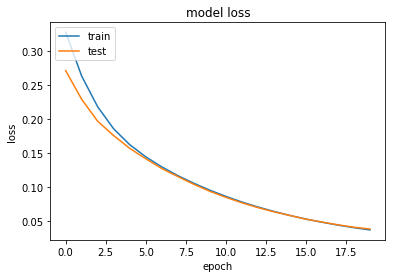

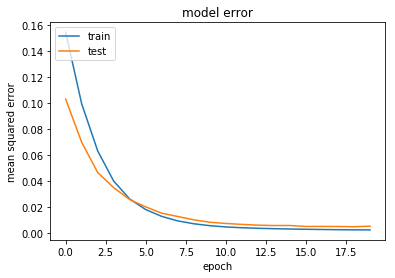

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3456 samples, validate on 756 samples
Epoch 1/20
3456/3456 [==============================] - 0s 100us/step - loss: 0.2256 - mean_squared_error: 0.0602 - val_loss: 0.2484 - val_mean_squared_error: 0.0913
Epoch 2/20
3456/3456 [==============================] - 0s 45us/step - loss: 0.1822 - mean_squared_error: 0.0328 - val_loss: 0.2032 - val_mean_squared_error: 0.0619
Epoch 3/20
3456/3456 [==============================] - 0s 37us/step - loss: 0.1534 - mean_squared_error: 0.0197 - val_loss: 0.1695 - val_mean_squared_error: 

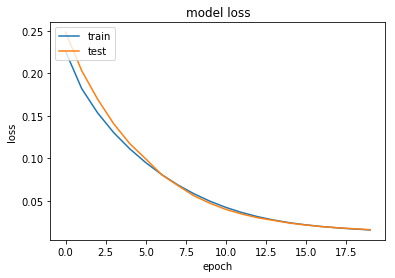

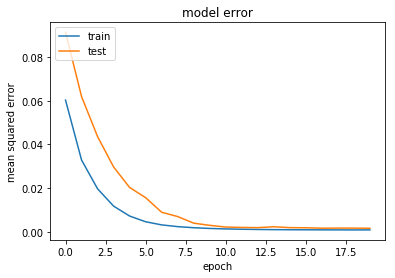

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5790 samples, validate on 1230 samples
Epoch 1/20
5790/5790 [==============================] - 0s 78us/step - loss: 0.1870 - mean_squared_error: 0.0378 - val_loss: 0.1808 - val_mean_squared_error: 0.0468
Epoch 2/20
5790/5790 [==============================] - 0s 37us/step - loss: 0.1381 - mean_squared_error: 0.0179 - val_loss: 0.1330 - val_mean_squared_error: 0.0265
Epoch 3/20
5790/5790 [==============================] - 0s 39us/step - loss: 0.1029 - mean_squared_error: 0.0088 - val_loss: 0.0960 - val_mean_squared_error: 

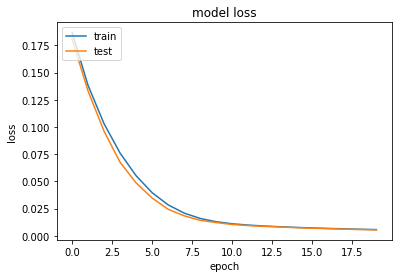

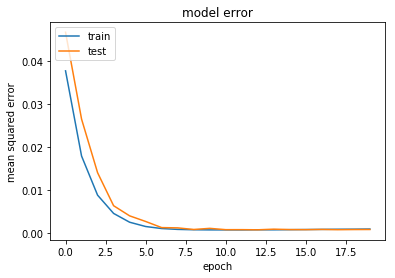

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5790 samples, validate on 1230 samples
Epoch 1/20
5790/5790 [==============================] - 0s 81us/step - loss: 0.2527 - mean_squared_error: 0.0797 - val_loss: 0.2095 - val_mean_squared_error: 0.0480
Epoch 2/20
5790/5790 [==============================] - 0s 40us/step - loss: 0.1794 - mean_squared_error: 0.0295 - val_loss: 0.1589 - val_mean_squared_error: 0.0212
Epoch 3/20
5790/5790 [==============================] - 0s 41us/step - loss: 0.1381 - mean_squared_error: 0.0126 - val_loss: 0.1234 - val_mean_squared_error: 

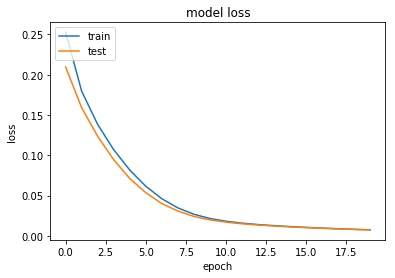

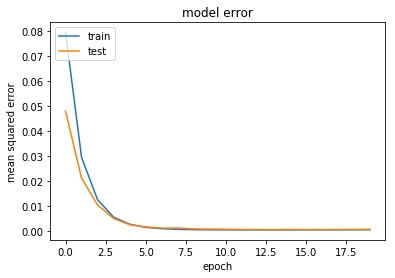

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2316 samples, validate on 492 samples
Epoch 1/20
2316/2316 [==============================] - 0s 127us/step - loss: 0.2299 - mean_squared_error: 0.0635 - val_loss: 0.2768 - val_mean_squared_error: 0.1170
Epoch 2/20
2316/2316 [==============================] - 0s 49us/step - loss: 0.2006 - mean_squared_error: 0.0461 - val_loss: 0.2440 - val_mean_squared_error: 0.0954
Epoch 3/20
2316/2316 [==============================] - 0s 45us/step - loss: 0.1779 - mean_squared_error: 0.0346 - val_loss: 0.2110 - val_mean_squared_error: 

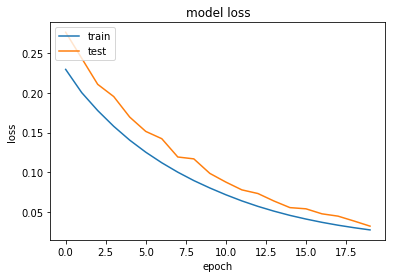

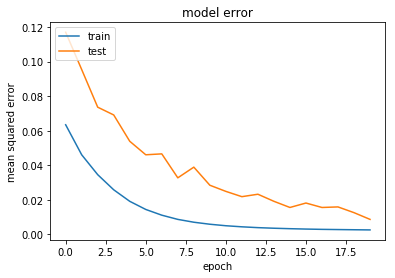

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3474 samples, validate on 738 samples
Epoch 1/20
3474/3474 [==============================] - 0s 114us/step - loss: 0.2718 - mean_squared_error: 0.1037 - val_loss: 0.2406 - val_mean_squared_error: 0.0806
Epoch 2/20
3474/3474 [==============================] - 0s 51us/step - loss: 0.2040 - mean_squared_error: 0.0512 - val_loss: 0.1883 - val_mean_squared_error: 0.0435
Epoch 3/20
3474/3474 [==============================] - 0s 40us/step - loss: 0.1632 - mean_squared_error: 0.0259 - val_loss: 0.1518 - val_mean_squared_error: 

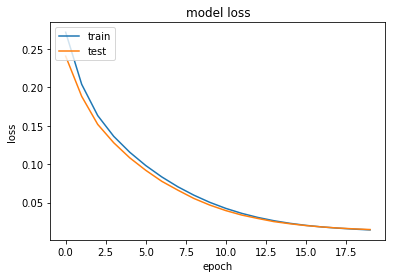

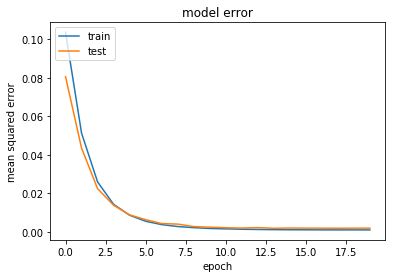

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5820 samples, validate on 1200 samples
Epoch 1/20
5820/5820 [==============================] - 0s 77us/step - loss: 0.1795 - mean_squared_error: 0.0359 - val_loss: 0.1513 - val_mean_squared_error: 0.0223
Epoch 2/20
5820/5820 [==============================] - 0s 41us/step - loss: 0.1310 - mean_squared_error: 0.0157 - val_loss: 0.1129 - val_mean_squared_error: 0.0113
Epoch 3/20
5820/5820 [==============================] - 0s 41us/step - loss: 0.0967 - mean_squared_error: 0.0076 - val_loss: 0.0831 - val_mean_squared_error: 

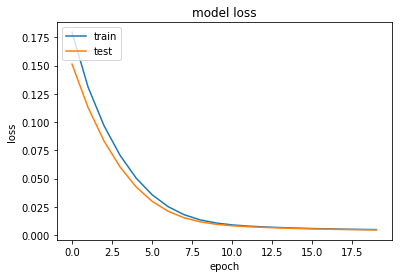

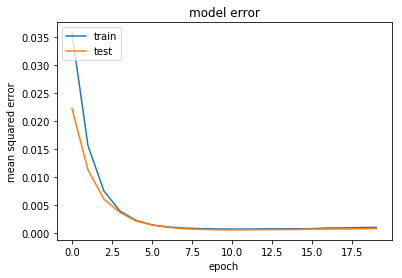

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5820 samples, validate on 1200 samples
Epoch 1/20
5820/5820 [==============================] - 0s 77us/step - loss: 0.2449 - mean_squared_error: 0.0813 - val_loss: 0.1923 - val_mean_squared_error: 0.0398
Epoch 2/20
5820/5820 [==============================] - 0s 44us/step - loss: 0.1771 - mean_squared_error: 0.0357 - val_loss: 0.1471 - val_mean_squared_error: 0.0172
Epoch 3/20
5820/5820 [==============================] - 0s 44us/step - loss: 0.1321 - mean_squared_error: 0.0138 - val_loss: 0.1145 - val_mean_squared_error: 

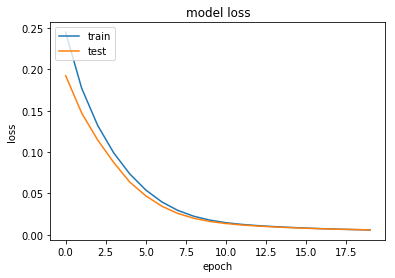

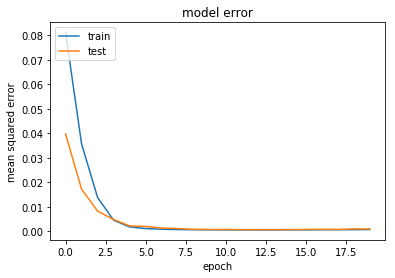

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2328 samples, validate on 480 samples
Epoch 1/20
2328/2328 [==============================] - 0s 128us/step - loss: 0.2875 - mean_squared_error: 0.1157 - val_loss: 0.2560 - val_mean_squared_error: 0.0898
Epoch 2/20
2328/2328 [==============================] - 0s 49us/step - loss: 0.2308 - mean_squared_error: 0.0694 - val_loss: 0.2144 - val_mean_squared_error: 0.0583
Epoch 3/20
2328/2328 [==============================] - 0s 42us/step - loss: 0.1981 - mean_squared_error: 0.0471 - val_loss: 0.1867 - val_mean_squared_error: 

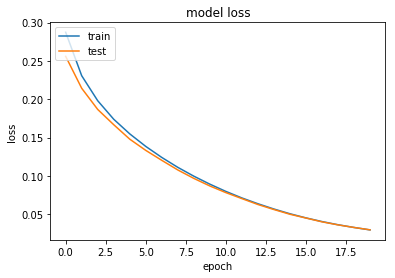

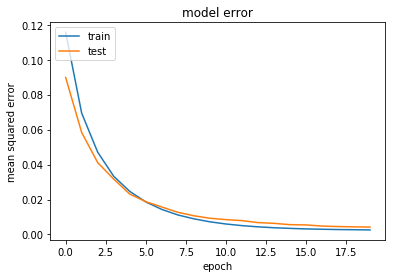

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3492 samples, validate on 720 samples
Epoch 1/20
3492/3492 [==============================] - 0s 99us/step - loss: 0.1807 - mean_squared_error: 0.0326 - val_loss: 0.1855 - val_mean_squared_error: 0.0481
Epoch 2/20
3492/3492 [==============================] - 0s 44us/step - loss: 0.1473 - mean_squared_error: 0.0193 - val_loss: 0.1499 - val_mean_squared_error: 0.0316
Epoch 3/20
3492/3492 [==============================] - 0s 42us/step - loss: 0.1212 - mean_squared_error: 0.0116 - val_loss: 0.1223 - val_mean_squared_error: 0

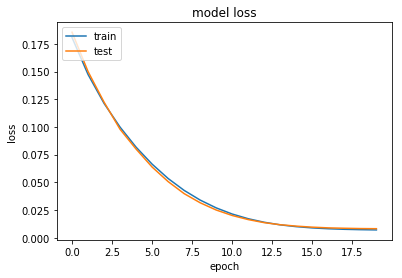

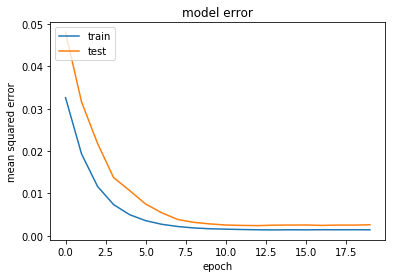

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5850 samples, validate on 1170 samples
Epoch 1/20
5850/5850 [==============================] - 0s 80us/step - loss: 0.2372 - mean_squared_error: 0.0768 - val_loss: 0.2195 - val_mean_squared_error: 0.0727
Epoch 2/20
5850/5850 [==============================] - 0s 46us/step - loss: 0.1680 - mean_squared_error: 0.0336 - val_loss: 0.1659 - val_mean_squared_error: 0.0441
Epoch 3/20
5850/5850 [==============================] - 0s 40us/step - loss: 0.1253 - mean_squared_error: 0.0151 - val_loss: 0.1316 - val_mean_squared_error: 

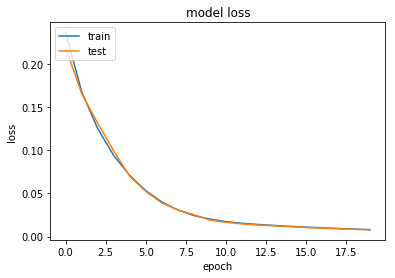

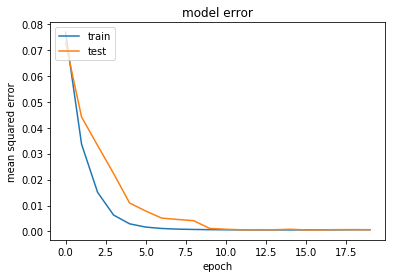

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5850 samples, validate on 1170 samples
Epoch 1/20
5850/5850 [==============================] - 0s 74us/step - loss: 0.2008 - mean_squared_error: 0.0462 - val_loss: 0.1807 - val_mean_squared_error: 0.0391
Epoch 2/20
5850/5850 [==============================] - 0s 44us/step - loss: 0.1480 - mean_squared_error: 0.0187 - val_loss: 0.1354 - val_mean_squared_error: 0.0189
Epoch 3/20
5850/5850 [==============================] - 0s 41us/step - loss: 0.1122 - mean_squared_error: 0.0077 - val_loss: 0.1041 - val_mean_squared_error: 

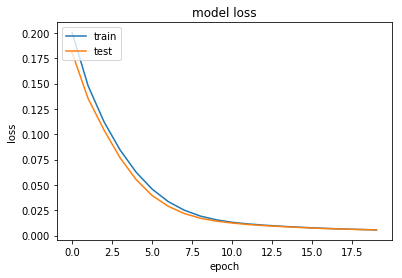

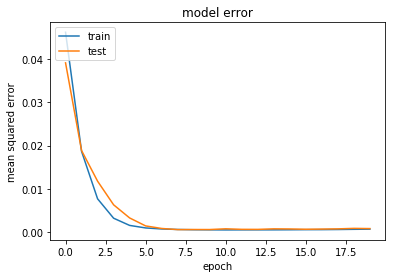

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2340 samples, validate on 468 samples
Epoch 1/20
2340/2340 [==============================] - 0s 133us/step - loss: 0.2416 - mean_squared_error: 0.0840 - val_loss: 0.2137 - val_mean_squared_error: 0.0626
Epoch 2/20
2340/2340 [==============================] - 0s 46us/step - loss: 0.2010 - mean_squared_error: 0.0554 - val_loss: 0.1812 - val_mean_squared_error: 0.0415
Epoch 3/20
2340/2340 [==============================] - 0s 40us/step - loss: 0.1719 - mean_squared_error: 0.0375 - val_loss: 0.1562 - val_mean_squared_error: 

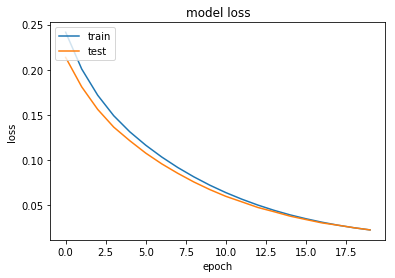

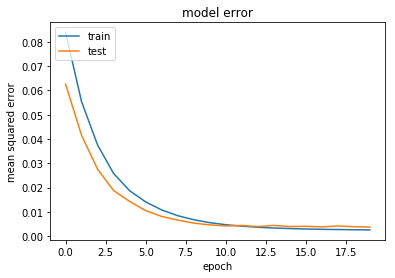

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3510 samples, validate on 702 samples
Epoch 1/20
3510/3510 [==============================] - 0s 101us/step - loss: 0.2468 - mean_squared_error: 0.0872 - val_loss: 0.2436 - val_mean_squared_error: 0.0925
Epoch 2/20
3510/3510 [==============================] - 0s 39us/step - loss: 0.2002 - mean_squared_error: 0.0567 - val_loss: 0.2134 - val_mean_squared_error: 0.0779
Epoch 3/20
3510/3510 [==============================] - 0s 38us/step - loss: 0.1661 - mean_squared_error: 0.0379 - val_loss: 0.1900 - val_mean_squared_error: 

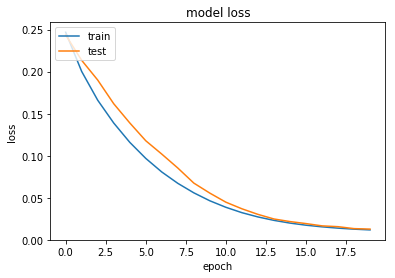

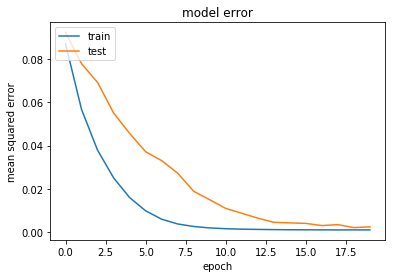

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5880 samples, validate on 1140 samples
Epoch 1/20
5880/5880 [==============================] - 0s 76us/step - loss: 0.1807 - mean_squared_error: 0.0293 - val_loss: 0.1713 - val_mean_squared_error: 0.0373
Epoch 2/20
5880/5880 [==============================] - 0s 42us/step - loss: 0.1327 - mean_squared_error: 0.0143 - val_loss: 0.1308 - val_mean_squared_error: 0.0276
Epoch 3/20
5880/5880 [==============================] - 0s 40us/step - loss: 0.0974 - mean_squared_error: 0.0076 - val_loss: 0.0936 - val_mean_squared_error: 

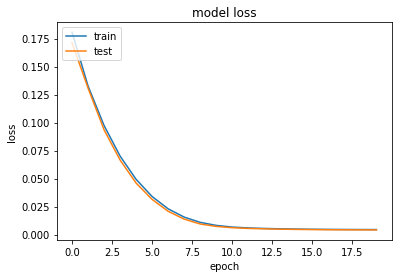

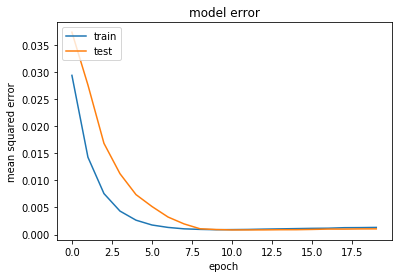

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5880 samples, validate on 1140 samples
Epoch 1/20
5880/5880 [==============================] - 0s 75us/step - loss: 0.2601 - mean_squared_error: 0.1017 - val_loss: 0.1932 - val_mean_squared_error: 0.0477
Epoch 2/20
5880/5880 [==============================] - 0s 39us/step - loss: 0.1571 - mean_squared_error: 0.0258 - val_loss: 0.1403 - val_mean_squared_error: 0.0234
Epoch 3/20
5880/5880 [==============================] - 0s 38us/step - loss: 0.1148 - mean_squared_error: 0.0114 - val_loss: 0.1042 - val_mean_squared_error: 

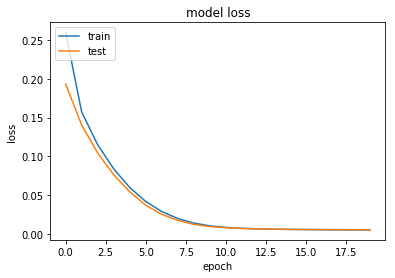

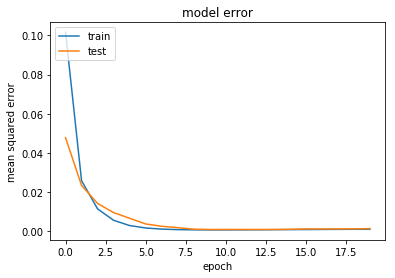

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2352 samples, validate on 456 samples
Epoch 1/20
2352/2352 [==============================] - 0s 132us/step - loss: 0.2174 - mean_squared_error: 0.0688 - val_loss: 0.1912 - val_mean_squared_error: 0.0496
Epoch 2/20
2352/2352 [==============================] - 0s 43us/step - loss: 0.1784 - mean_squared_error: 0.0429 - val_loss: 0.1757 - val_mean_squared_error: 0.0466
Epoch 3/20
2352/2352 [==============================] - 0s 37us/step - loss: 0.1568 - mean_squared_error: 0.0336 - val_loss: 0.1569 - val_mean_squared_error: 

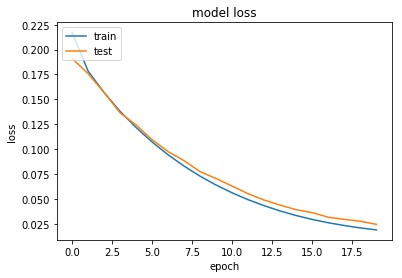

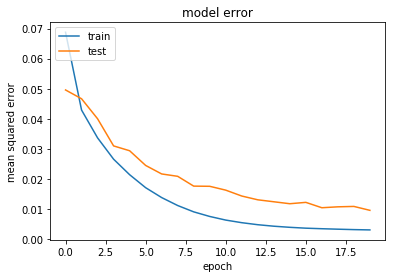

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3528 samples, validate on 684 samples
Epoch 1/20
3528/3528 [==============================] - 0s 104us/step - loss: 0.2469 - mean_squared_error: 0.0855 - val_loss: 0.1968 - val_mean_squared_error: 0.0444
Epoch 2/20
3528/3528 [==============================] - 0s 41us/step - loss: 0.1861 - mean_squared_error: 0.0416 - val_loss: 0.1588 - val_mean_squared_error: 0.0229
Epoch 3/20
3528/3528 [==============================] - 0s 38us/step - loss: 0.1510 - mean_squared_error: 0.0231 - val_loss: 0.1347 - val_mean_squared_error: 

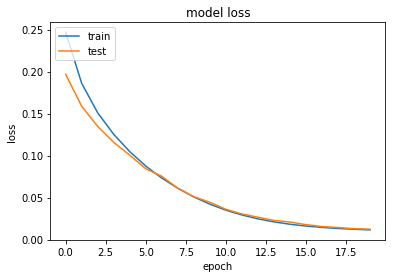

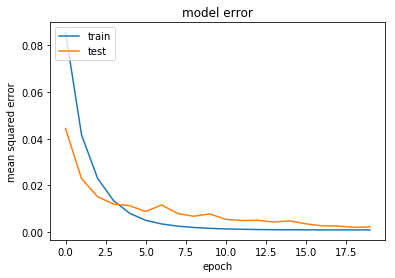

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5910 samples, validate on 1110 samples
Epoch 1/20
5910/5910 [==============================] - 0s 74us/step - loss: 0.2692 - mean_squared_error: 0.0929 - val_loss: 0.2378 - val_mean_squared_error: 0.0740
Epoch 2/20
5910/5910 [==============================] - 0s 45us/step - loss: 0.1889 - mean_squared_error: 0.0373 - val_loss: 0.1756 - val_mean_squared_error: 0.0369
Epoch 3/20
5910/5910 [==============================] - 0s 37us/step - loss: 0.1435 - mean_squared_error: 0.0172 - val_loss: 0.1353 - val_mean_squared_error: 

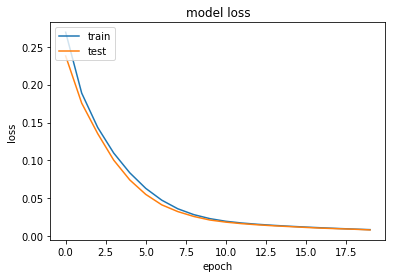

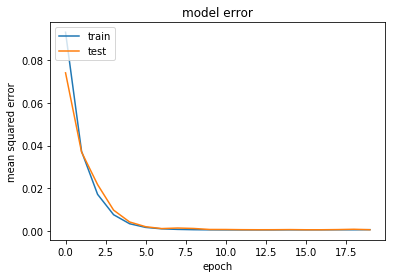

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5910 samples, validate on 1110 samples
Epoch 1/20
5910/5910 [==============================] - 0s 76us/step - loss: 0.2234 - mean_squared_error: 0.0631 - val_loss: 0.1837 - val_mean_squared_error: 0.0375
Epoch 2/20
5910/5910 [==============================] - 0s 45us/step - loss: 0.1609 - mean_squared_error: 0.0280 - val_loss: 0.1419 - val_mean_squared_error: 0.0226
Epoch 3/20
5910/5910 [==============================] - 0s 38us/step - loss: 0.1185 - mean_squared_error: 0.0117 - val_loss: 0.1082 - val_mean_squared_error: 

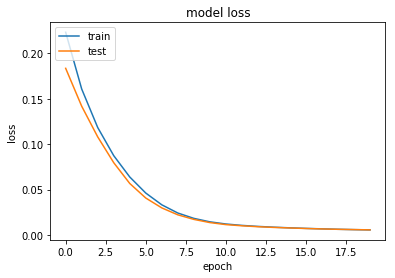

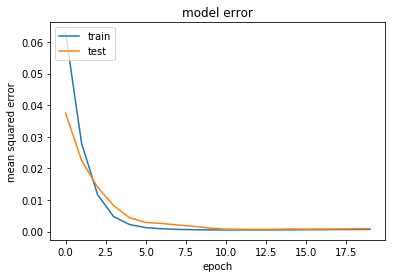

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2364 samples, validate on 444 samples
Epoch 1/20
2364/2364 [==============================] - 0s 141us/step - loss: 0.2943 - mean_squared_error: 0.1258 - val_loss: 0.2671 - val_mean_squared_error: 0.1035
Epoch 2/20
2364/2364 [==============================] - 0s 52us/step - loss: 0.2152 - mean_squared_error: 0.0566 - val_loss: 0.2688 - val_mean_squared_error: 0.1156
Epoch 3/20
2364/2364 [==============================] - 0s 37us/step - loss: 0.1895 - mean_squared_error: 0.0417 - val_loss: 0.2380 - val_mean_squared_error: 

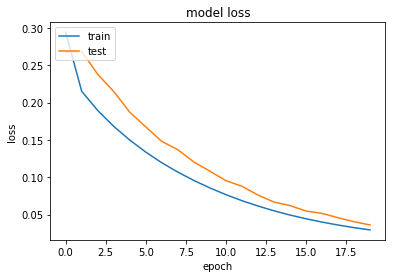

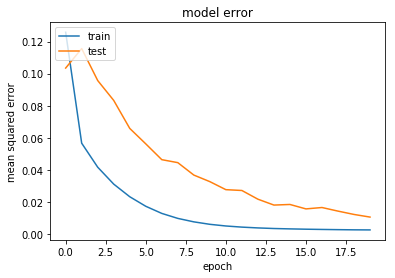

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3546 samples, validate on 666 samples
Epoch 1/20
3546/3546 [==============================] - 0s 101us/step - loss: 0.2118 - mean_squared_error: 0.0493 - val_loss: 0.2066 - val_mean_squared_error: 0.0539
Epoch 2/20
3546/3546 [==============================] - 0s 47us/step - loss: 0.1687 - mean_squared_error: 0.0248 - val_loss: 0.1796 - val_mean_squared_error: 0.0449
Epoch 3/20
3546/3546 [==============================] - 0s 41us/step - loss: 0.1413 - mean_squared_error: 0.0153 - val_loss: 0.1461 - val_mean_squared_error: 

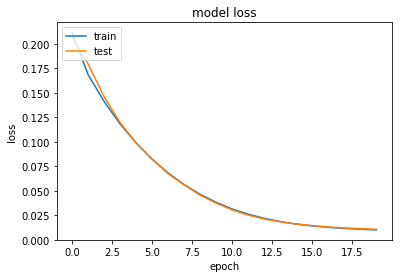

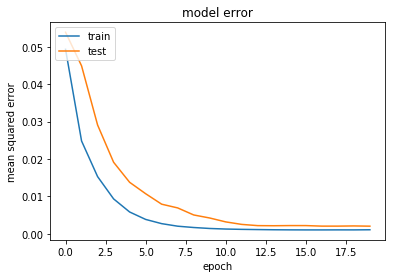

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5940 samples, validate on 1080 samples
Epoch 1/20
5940/5940 [==============================] - 0s 80us/step - loss: 0.2621 - mean_squared_error: 0.0920 - val_loss: 0.2124 - val_mean_squared_error: 0.0552
Epoch 2/20
5940/5940 [==============================] - 0s 44us/step - loss: 0.1831 - mean_squared_error: 0.0386 - val_loss: 0.1610 - val_mean_squared_error: 0.0294
Epoch 3/20
5940/5940 [==============================] - 0s 41us/step - loss: 0.1356 - mean_squared_error: 0.0165 - val_loss: 0.1220 - val_mean_squared_error: 

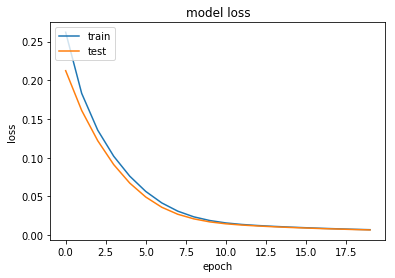

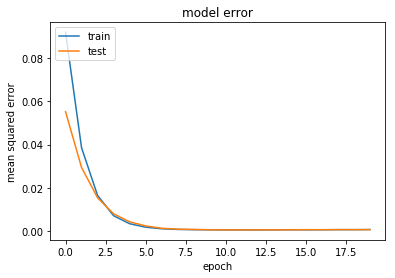

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5940 samples, validate on 1080 samples
Epoch 1/20
5940/5940 [==============================] - 0s 71us/step - loss: 0.2058 - mean_squared_error: 0.0533 - val_loss: 0.1846 - val_mean_squared_error: 0.0483
Epoch 2/20
5940/5940 [==============================] - 0s 37us/step - loss: 0.1488 - mean_squared_error: 0.0268 - val_loss: 0.1388 - val_mean_squared_error: 0.0308
Epoch 3/20
5940/5940 [==============================] - 0s 37us/step - loss: 0.1088 - mean_squared_error: 0.0130 - val_loss: 0.1051 - val_mean_squared_error: 

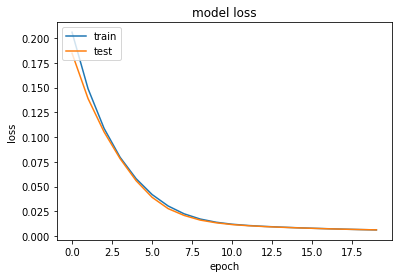

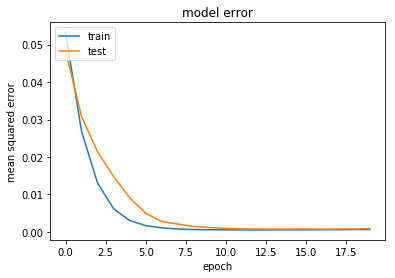

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2376 samples, validate on 432 samples
Epoch 1/20
2376/2376 [==============================] - 0s 128us/step - loss: 0.2787 - mean_squared_error: 0.1107 - val_loss: 0.3348 - val_mean_squared_error: 0.1723
Epoch 2/20
2376/2376 [==============================] - 0s 42us/step - loss: 0.2296 - mean_squared_error: 0.0717 - val_loss: 0.2863 - val_mean_squared_error: 0.1335
Epoch 3/20
2376/2376 [==============================] - 0s 41us/step - loss: 0.1973 - mean_squared_error: 0.0491 - val_loss: 0.2600 - val_mean_squared_error: 

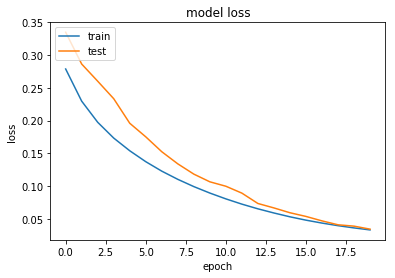

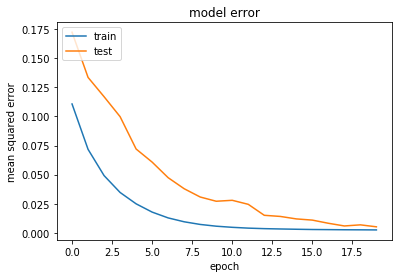

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3564 samples, validate on 648 samples
Epoch 1/20
3564/3564 [==============================] - 0s 101us/step - loss: 0.3927 - mean_squared_error: 0.2189 - val_loss: 0.2381 - val_mean_squared_error: 0.0703
Epoch 2/20
3564/3564 [==============================] - 0s 42us/step - loss: 0.2285 - mean_squared_error: 0.0676 - val_loss: 0.1834 - val_mean_squared_error: 0.0302
Epoch 3/20
3564/3564 [==============================] - 0s 41us/step - loss: 0.1859 - mean_squared_error: 0.0401 - val_loss: 0.1569 - val_mean_squared_error: 

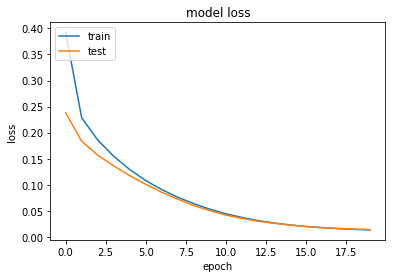

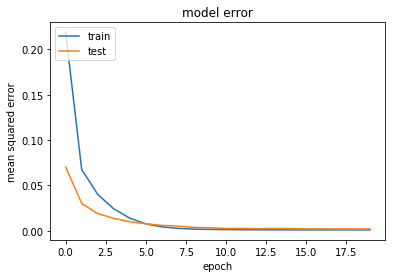

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5970 samples, validate on 1050 samples
Epoch 1/20
5970/5970 [==============================] - 0s 77us/step - loss: 0.2358 - mean_squared_error: 0.0724 - val_loss: 0.1808 - val_mean_squared_error: 0.0308
Epoch 2/20
5970/5970 [==============================] - 0s 49us/step - loss: 0.1717 - mean_squared_error: 0.0340 - val_loss: 0.1433 - val_mean_squared_error: 0.0184
Epoch 3/20
5970/5970 [==============================] - 0s 41us/step - loss: 0.1274 - mean_squared_error: 0.0144 - val_loss: 0.1116 - val_mean_squared_error: 

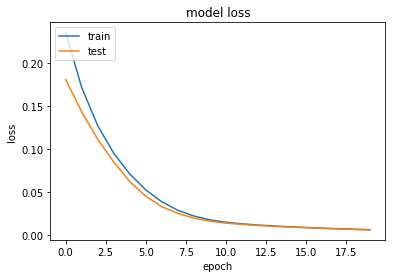

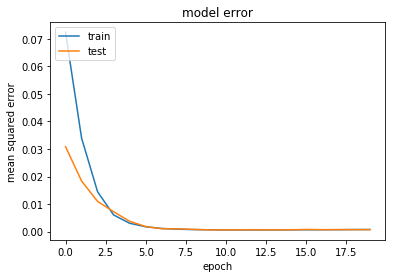

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5970 samples, validate on 1050 samples
Epoch 1/20
5970/5970 [==============================] - 0s 78us/step - loss: 0.1826 - mean_squared_error: 0.0337 - val_loss: 0.1861 - val_mean_squared_error: 0.0526
Epoch 2/20
5970/5970 [==============================] - 0s 44us/step - loss: 0.1354 - mean_squared_error: 0.0158 - val_loss: 0.1371 - val_mean_squared_error: 0.0316
Epoch 3/20
5970/5970 [==============================] - 0s 40us/step - loss: 0.1004 - mean_squared_error: 0.0075 - val_loss: 0.0987 - val_mean_squared_error: 

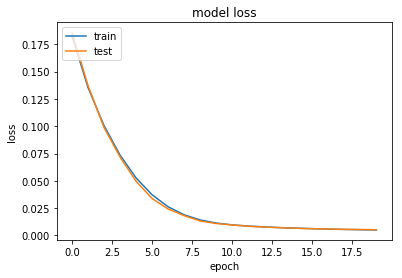

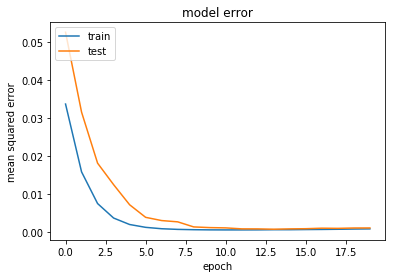

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2388 samples, validate on 420 samples
Epoch 1/20
2388/2388 [==============================] - 0s 161us/step - loss: 0.2549 - mean_squared_error: 0.0771 - val_loss: 0.4642 - val_mean_squared_error: 0.2920
Epoch 2/20
2388/2388 [==============================] - 0s 47us/step - loss: 0.2192 - mean_squared_error: 0.0517 - val_loss: 0.4257 - val_mean_squared_error: 0.2633
Epoch 3/20
2388/2388 [==============================] - 0s 43us/step - loss: 0.1935 - mean_squared_error: 0.0359 - val_loss: 0.3895 - val_mean_squared_error: 

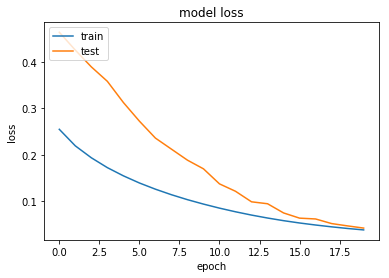

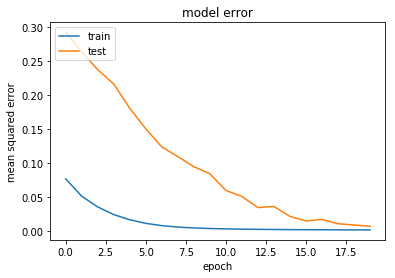

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3582 samples, validate on 630 samples
Epoch 1/20
3582/3582 [==============================] - 0s 102us/step - loss: 0.2300 - mean_squared_error: 0.0707 - val_loss: 0.2066 - val_mean_squared_error: 0.0564
Epoch 2/20
3582/3582 [==============================] - 0s 41us/step - loss: 0.1755 - mean_squared_error: 0.0338 - val_loss: 0.1645 - val_mean_squared_error: 0.0317
Epoch 3/20
3582/3582 [==============================] - 0s 37us/step - loss: 0.1440 - mean_squared_error: 0.0195 - val_loss: 0.1348 - val_mean_squared_error: 

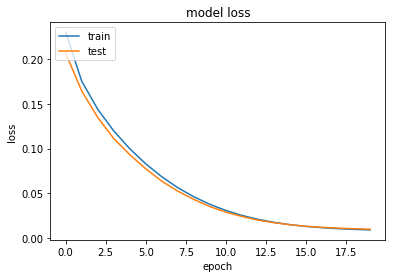

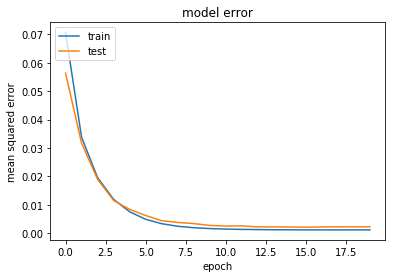

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6000 samples, validate on 1020 samples
Epoch 1/20
6000/6000 [==============================] - 0s 73us/step - loss: 0.2014 - mean_squared_error: 0.0517 - val_loss: 0.1802 - val_mean_squared_error: 0.0455
Epoch 2/20
6000/6000 [==============================] - 0s 44us/step - loss: 0.1460 - mean_squared_error: 0.0253 - val_loss: 0.1366 - val_mean_squared_error: 0.0297
Epoch 3/20
6000/6000 [==============================] - 0s 46us/step - loss: 0.1059 - mean_squared_error: 0.0119 - val_loss: 0.1005 - val_mean_squared_error: 

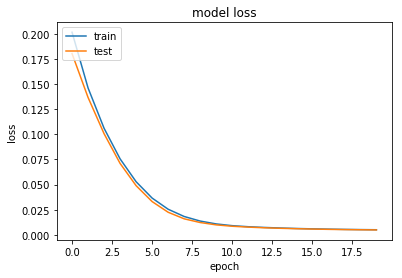

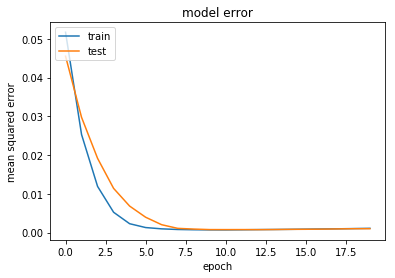

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6000 samples, validate on 1020 samples
Epoch 1/20
6000/6000 [==============================] - 0s 75us/step - loss: 0.1906 - mean_squared_error: 0.0406 - val_loss: 0.1681 - val_mean_squared_error: 0.0332
Epoch 2/20
6000/6000 [==============================] - 0s 42us/step - loss: 0.1365 - mean_squared_error: 0.0158 - val_loss: 0.1221 - val_mean_squared_error: 0.0156
Epoch 3/20
6000/6000 [==============================] - 0s 37us/step - loss: 0.1003 - mean_squared_error: 0.0066 - val_loss: 0.0888 - val_mean_squared_error: 

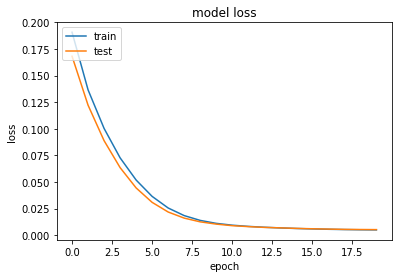

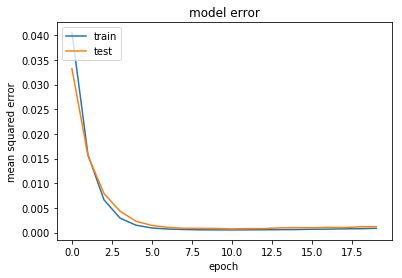

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2400 samples, validate on 408 samples
Epoch 1/20
2400/2400 [==============================] - 0s 130us/step - loss: 0.2069 - mean_squared_error: 0.0500 - val_loss: 0.2104 - val_mean_squared_error: 0.0597
Epoch 2/20
2400/2400 [==============================] - 0s 43us/step - loss: 0.1742 - mean_squared_error: 0.0290 - val_loss: 0.1801 - val_mean_squared_error: 0.0408
Epoch 3/20
2400/2400 [==============================] - 0s 43us/step - loss: 0.1538 - mean_squared_error: 0.0200 - val_loss: 0.1577 - val_mean_squared_error: 

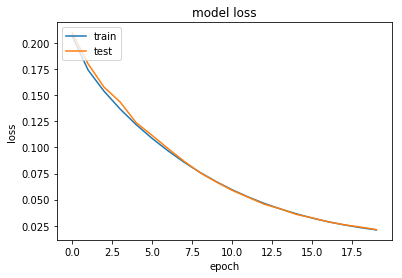

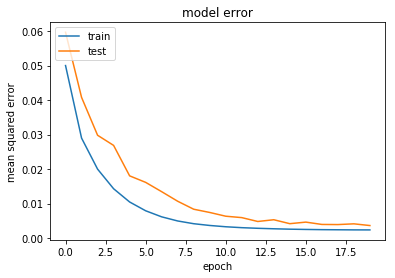

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3600 samples, validate on 612 samples
Epoch 1/20
3600/3600 [==============================] - 0s 104us/step - loss: 0.2147 - mean_squared_error: 0.0558 - val_loss: 0.1887 - val_mean_squared_error: 0.0387
Epoch 2/20
3600/3600 [==============================] - 0s 44us/step - loss: 0.1695 - mean_squared_error: 0.0278 - val_loss: 0.1592 - val_mean_squared_error: 0.0263
Epoch 3/20
3600/3600 [==============================] - 0s 44us/step - loss: 0.1406 - mean_squared_error: 0.0158 - val_loss: 0.1339 - val_mean_squared_error: 

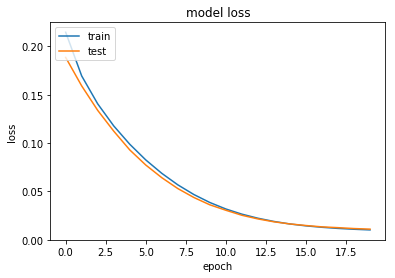

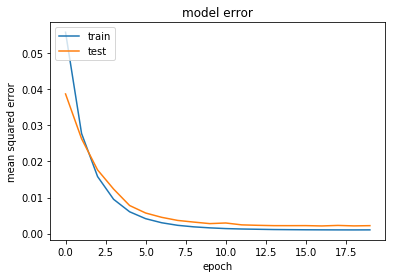

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6030 samples, validate on 990 samples
Epoch 1/20
6030/6030 [==============================] - 0s 73us/step - loss: 0.2321 - mean_squared_error: 0.0809 - val_loss: 0.1706 - val_mean_squared_error: 0.0336
Epoch 2/20
6030/6030 [==============================] - 0s 40us/step - loss: 0.1434 - mean_squared_error: 0.0206 - val_loss: 0.1214 - val_mean_squared_error: 0.0133
Epoch 3/20
6030/6030 [==============================] - 0s 39us/step - loss: 0.1047 - mean_squared_error: 0.0096 - val_loss: 0.0893 - val_mean_squared_error: 0

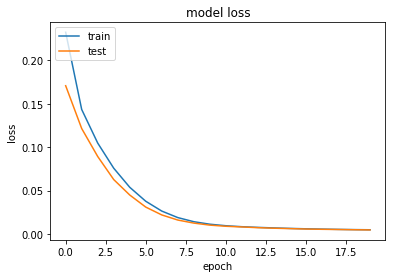

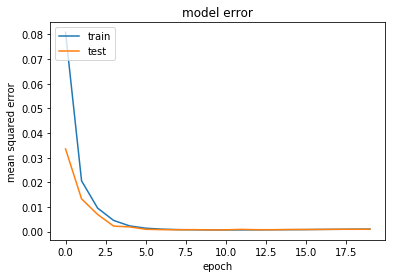

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6030 samples, validate on 990 samples
Epoch 1/20
6030/6030 [==============================] - 0s 75us/step - loss: 0.2170 - mean_squared_error: 0.0628 - val_loss: 0.1842 - val_mean_squared_error: 0.0438
Epoch 2/20
6030/6030 [==============================] - 0s 41us/step - loss: 0.1529 - mean_squared_error: 0.0254 - val_loss: 0.1340 - val_mean_squared_error: 0.0198
Epoch 3/20
6030/6030 [==============================] - 0s 40us/step - loss: 0.1133 - mean_squared_error: 0.0114 - val_loss: 0.0985 - val_mean_squared_error: 0

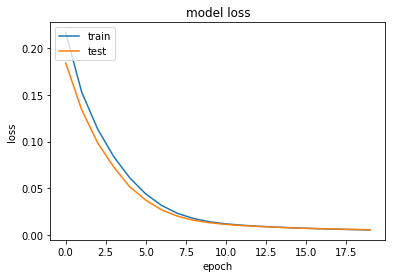

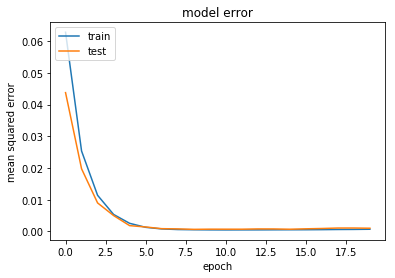

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2412 samples, validate on 396 samples
Epoch 1/20
2412/2412 [==============================] - 0s 124us/step - loss: 0.3473 - mean_squared_error: 0.1700 - val_loss: 0.2652 - val_mean_squared_error: 0.0925
Epoch 2/20
2412/2412 [==============================] - 0s 43us/step - loss: 0.2491 - mean_squared_error: 0.0809 - val_loss: 0.2376 - val_mean_squared_error: 0.0742
Epoch 3/20
2412/2412 [==============================] - 0s 41us/step - loss: 0.2162 - mean_squared_error: 0.0574 - val_loss: 0.2086 - val_mean_squared_error: 

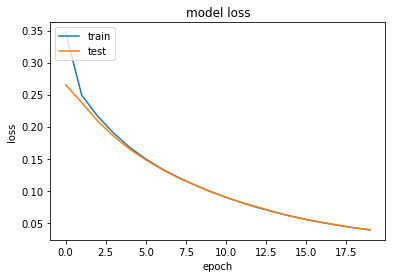

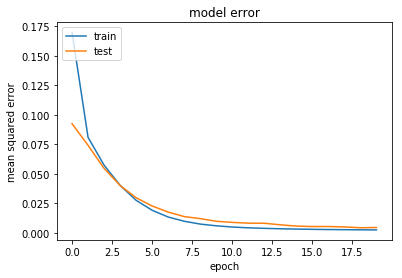

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3618 samples, validate on 594 samples
Epoch 1/20
3618/3618 [==============================] - 0s 99us/step - loss: 0.2220 - mean_squared_error: 0.0725 - val_loss: 0.1932 - val_mean_squared_error: 0.0535
Epoch 2/20
3618/3618 [==============================] - 0s 42us/step - loss: 0.1704 - mean_squared_error: 0.0399 - val_loss: 0.1568 - val_mean_squared_error: 0.0355
Epoch 3/20
3618/3618 [==============================] - 0s 38us/step - loss: 0.1371 - mean_squared_error: 0.0242 - val_loss: 0.1257 - val_mean_squared_error: 0

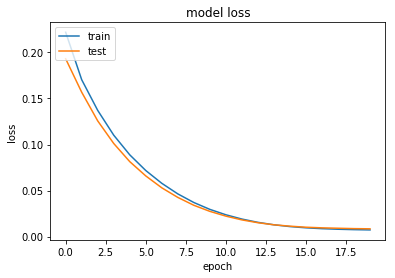

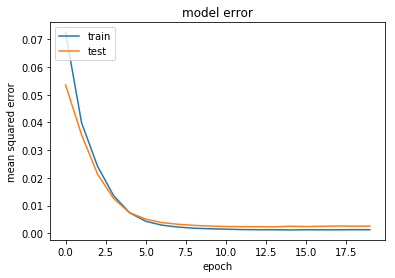

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6060 samples, validate on 960 samples
Epoch 1/20
6060/6060 [==============================] - 0s 78us/step - loss: 0.2324 - mean_squared_error: 0.0757 - val_loss: 0.1781 - val_mean_squared_error: 0.0339
Epoch 2/20
6060/6060 [==============================] - 0s 40us/step - loss: 0.1511 - mean_squared_error: 0.0204 - val_loss: 0.1333 - val_mean_squared_error: 0.0165
Epoch 3/20
6060/6060 [==============================] - 0s 37us/step - loss: 0.1121 - mean_squared_error: 0.0085 - val_loss: 0.0995 - val_mean_squared_error: 0

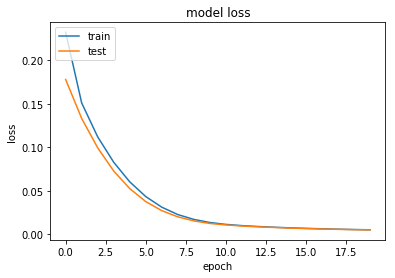

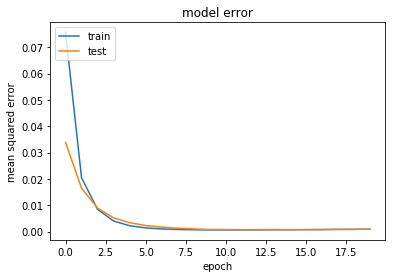

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6060 samples, validate on 960 samples
Epoch 1/20
6060/6060 [==============================] - 0s 79us/step - loss: 0.2152 - mean_squared_error: 0.0572 - val_loss: 0.1995 - val_mean_squared_error: 0.0542
Epoch 2/20
6060/6060 [==============================] - 0s 39us/step - loss: 0.1603 - mean_squared_error: 0.0273 - val_loss: 0.1455 - val_mean_squared_error: 0.0251
Epoch 3/20
6060/6060 [==============================] - 0s 36us/step - loss: 0.1219 - mean_squared_error: 0.0135 - val_loss: 0.1074 - val_mean_squared_error: 0

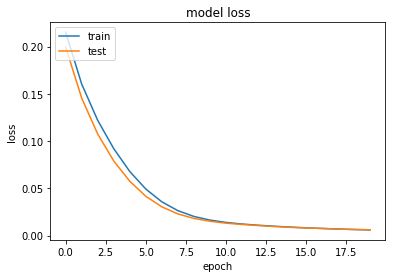

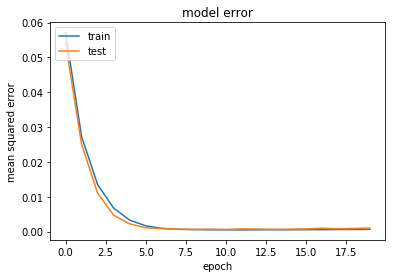

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2424 samples, validate on 384 samples
Epoch 1/20
2424/2424 [==============================] - 0s 123us/step - loss: 0.4564 - mean_squared_error: 0.2813 - val_loss: 0.2944 - val_mean_squared_error: 0.1237
Epoch 2/20
2424/2424 [==============================] - 0s 41us/step - loss: 0.2723 - mean_squared_error: 0.1062 - val_loss: 0.2947 - val_mean_squared_error: 0.1338
Epoch 3/20
2424/2424 [==============================] - 0s 38us/step - loss: 0.2197 - mean_squared_error: 0.0639 - val_loss: 0.2615 - val_mean_squared_error: 

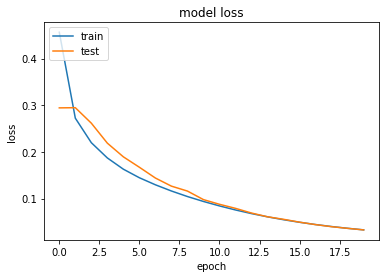

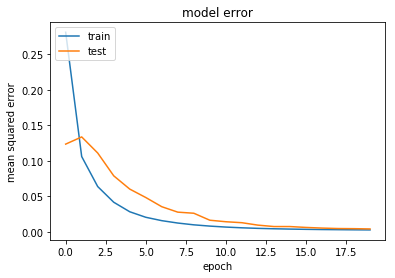

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3636 samples, validate on 576 samples
Epoch 1/20
3636/3636 [==============================] - 0s 97us/step - loss: 0.1817 - mean_squared_error: 0.0298 - val_loss: 0.1714 - val_mean_squared_error: 0.0312
Epoch 2/20
3636/3636 [==============================] - 0s 43us/step - loss: 0.1467 - mean_squared_error: 0.0168 - val_loss: 0.1412 - val_mean_squared_error: 0.0217
Epoch 3/20
3636/3636 [==============================] - 0s 42us/step - loss: 0.1205 - mean_squared_error: 0.0105 - val_loss: 0.1149 - val_mean_squared_error: 0

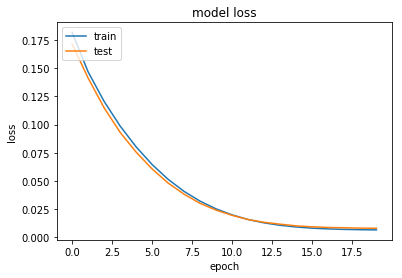

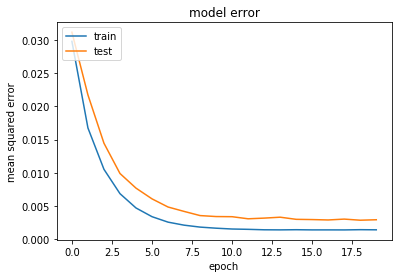

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6090 samples, validate on 930 samples
Epoch 1/20
6090/6090 [==============================] - 0s 72us/step - loss: 0.2306 - mean_squared_error: 0.0604 - val_loss: 0.2215 - val_mean_squared_error: 0.0655
Epoch 2/20
6090/6090 [==============================] - 0s 40us/step - loss: 0.1680 - mean_squared_error: 0.0254 - val_loss: 0.1629 - val_mean_squared_error: 0.0341
Epoch 3/20
6090/6090 [==============================] - 0s 38us/step - loss: 0.1259 - mean_squared_error: 0.0102 - val_loss: 0.1218 - val_mean_squared_error: 0

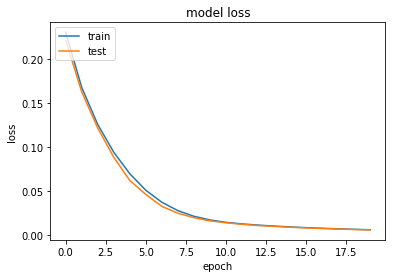

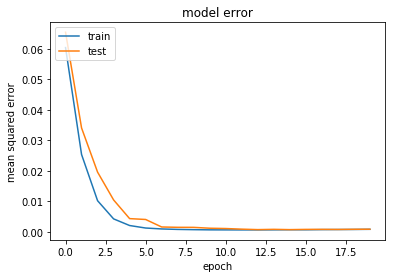

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6090 samples, validate on 930 samples
Epoch 1/20
6090/6090 [==============================] - 0s 72us/step - loss: 0.3054 - mean_squared_error: 0.1513 - val_loss: 0.2018 - val_mean_squared_error: 0.0598
Epoch 2/20
6090/6090 [==============================] - 0s 39us/step - loss: 0.1549 - mean_squared_error: 0.0270 - val_loss: 0.1322 - val_mean_squared_error: 0.0190
Epoch 3/20
6090/6090 [==============================] - 0s 36us/step - loss: 0.1102 - mean_squared_error: 0.0107 - val_loss: 0.0949 - val_mean_squared_error: 0

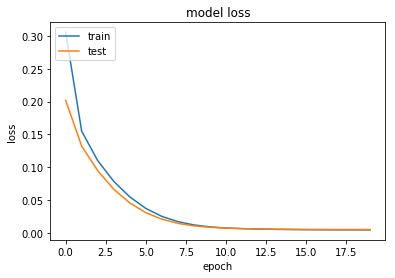

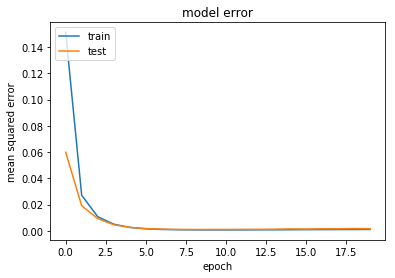

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2436 samples, validate on 372 samples
Epoch 1/20
2436/2436 [==============================] - 0s 123us/step - loss: 0.2376 - mean_squared_error: 0.0655 - val_loss: 0.2276 - val_mean_squared_error: 0.0629
Epoch 2/20
2436/2436 [==============================] - 0s 45us/step - loss: 0.2027 - mean_squared_error: 0.0440 - val_loss: 0.1980 - val_mean_squared_error: 0.0460
Epoch 3/20
2436/2436 [==============================] - 0s 42us/step - loss: 0.1780 - mean_squared_error: 0.0318 - val_loss: 0.1763 - val_mean_squared_error: 

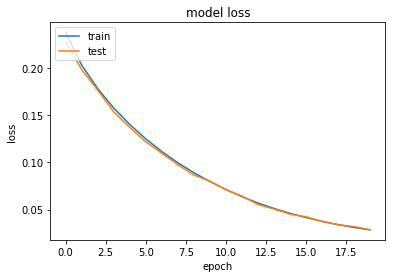

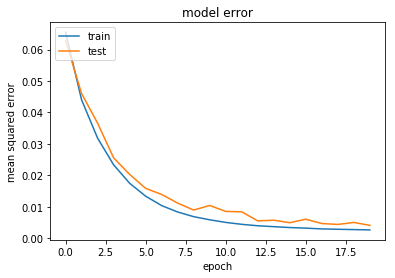

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3654 samples, validate on 558 samples
Epoch 1/20
3654/3654 [==============================] - 0s 100us/step - loss: 0.2102 - mean_squared_error: 0.0528 - val_loss: 0.1982 - val_mean_squared_error: 0.0508
Epoch 2/20
3654/3654 [==============================] - 0s 43us/step - loss: 0.1691 - mean_squared_error: 0.0305 - val_loss: 0.1613 - val_mean_squared_error: 0.0322
Epoch 3/20
3654/3654 [==============================] - 0s 37us/step - loss: 0.1395 - mean_squared_error: 0.0188 - val_loss: 0.1338 - val_mean_squared_error: 

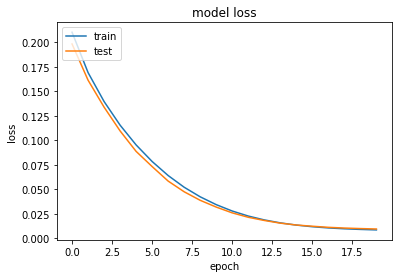

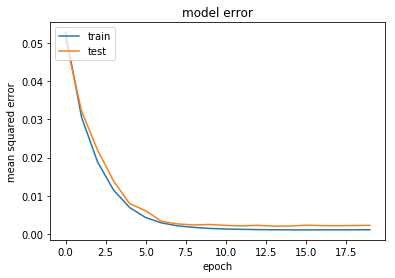

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6120 samples, validate on 900 samples
Epoch 1/20
6120/6120 [==============================] - 0s 70us/step - loss: 0.2269 - mean_squared_error: 0.0723 - val_loss: 0.1942 - val_mean_squared_error: 0.0536
Epoch 2/20
6120/6120 [==============================] - 0s 39us/step - loss: 0.1529 - mean_squared_error: 0.0259 - val_loss: 0.1376 - val_mean_squared_error: 0.0243
Epoch 3/20
6120/6120 [==============================] - 0s 37us/step - loss: 0.1116 - mean_squared_error: 0.0112 - val_loss: 0.0981 - val_mean_squared_error: 0

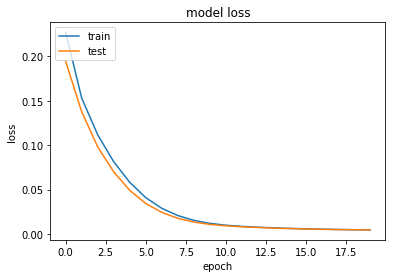

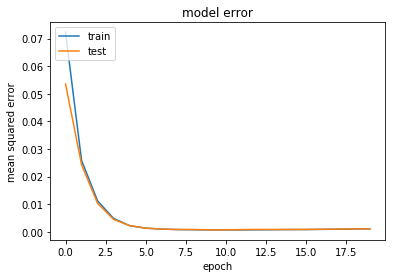

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6120 samples, validate on 900 samples
Epoch 1/20
6120/6120 [==============================] - 0s 73us/step - loss: 0.2898 - mean_squared_error: 0.1279 - val_loss: 0.1912 - val_mean_squared_error: 0.0415
Epoch 2/20
6120/6120 [==============================] - 0s 43us/step - loss: 0.1893 - mean_squared_error: 0.0518 - val_loss: 0.1477 - val_mean_squared_error: 0.0227
Epoch 3/20
6120/6120 [==============================] - 0s 41us/step - loss: 0.1364 - mean_squared_error: 0.0235 - val_loss: 0.1127 - val_mean_squared_error: 0

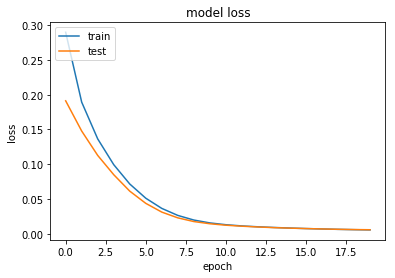

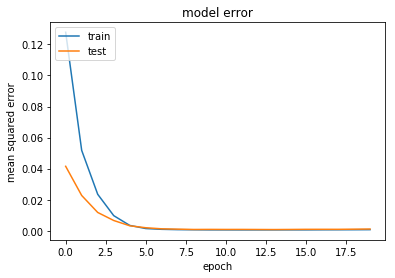

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2448 samples, validate on 360 samples
Epoch 1/20
2448/2448 [==============================] - 0s 123us/step - loss: 0.3440 - mean_squared_error: 0.1755 - val_loss: 0.2441 - val_mean_squared_error: 0.0797
Epoch 2/20
2448/2448 [==============================] - 0s 40us/step - loss: 0.2177 - mean_squared_error: 0.0575 - val_loss: 0.2141 - val_mean_squared_error: 0.0587
Epoch 3/20
2448/2448 [==============================] - 0s 39us/step - loss: 0.1875 - mean_squared_error: 0.0368 - val_loss: 0.1851 - val_mean_squared_error: 

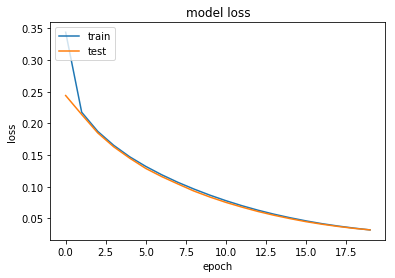

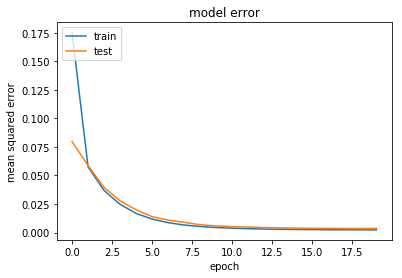

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3672 samples, validate on 540 samples
Epoch 1/20
3672/3672 [==============================] - 0s 97us/step - loss: 0.2435 - mean_squared_error: 0.0804 - val_loss: 0.3312 - val_mean_squared_error: 0.1772
Epoch 2/20
3672/3672 [==============================] - 0s 41us/step - loss: 0.1923 - mean_squared_error: 0.0464 - val_loss: 0.2613 - val_mean_squared_error: 0.1238
Epoch 3/20
3672/3672 [==============================] - 0s 40us/step - loss: 0.1572 - mean_squared_error: 0.0275 - val_loss: 0.2122 - val_mean_squared_error: 0

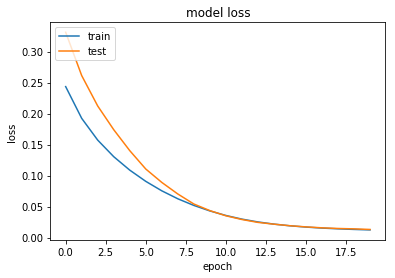

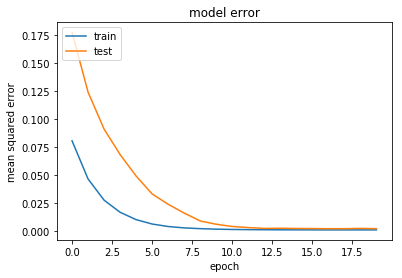

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6150 samples, validate on 870 samples
Epoch 1/20
6150/6150 [==============================] - 0s 77us/step - loss: 0.2136 - mean_squared_error: 0.0638 - val_loss: 0.1718 - val_mean_squared_error: 0.0370
Epoch 2/20
6150/6150 [==============================] - 0s 43us/step - loss: 0.1356 - mean_squared_error: 0.0159 - val_loss: 0.1182 - val_mean_squared_error: 0.0141
Epoch 3/20
6150/6150 [==============================] - 0s 40us/step - loss: 0.0969 - mean_squared_error: 0.0067 - val_loss: 0.0835 - val_mean_squared_error: 0

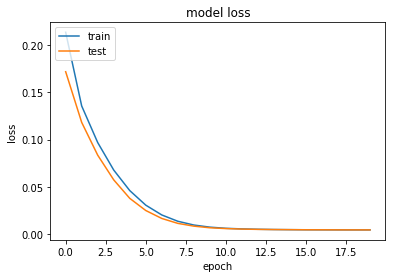

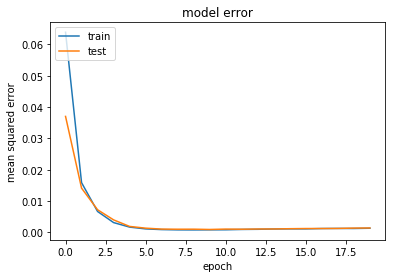

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6150 samples, validate on 870 samples
Epoch 1/20
6150/6150 [==============================] - 0s 76us/step - loss: 0.2062 - mean_squared_error: 0.0509 - val_loss: 0.1816 - val_mean_squared_error: 0.0402
Epoch 2/20
6150/6150 [==============================] - 0s 38us/step - loss: 0.1482 - mean_squared_error: 0.0204 - val_loss: 0.1331 - val_mean_squared_error: 0.0192
Epoch 3/20
6150/6150 [==============================] - 0s 36us/step - loss: 0.1090 - mean_squared_error: 0.0082 - val_loss: 0.0941 - val_mean_squared_error: 0

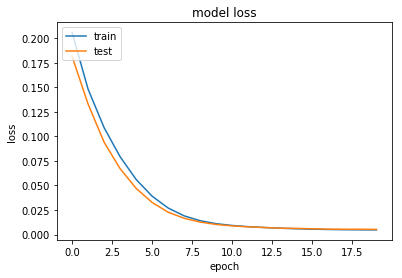

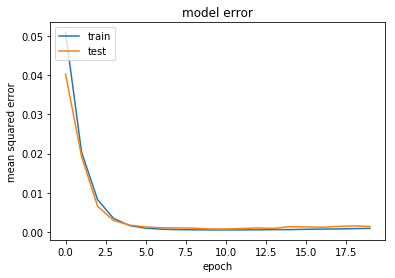

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2460 samples, validate on 348 samples
Epoch 1/20
2460/2460 [==============================] - 0s 131us/step - loss: 0.3394 - mean_squared_error: 0.1698 - val_loss: 0.2798 - val_mean_squared_error: 0.1153
Epoch 2/20
2460/2460 [==============================] - 0s 42us/step - loss: 0.2415 - mean_squared_error: 0.0817 - val_loss: 0.2236 - val_mean_squared_error: 0.0690
Epoch 3/20
2460/2460 [==============================] - 0s 36us/step - loss: 0.2057 - mean_squared_error: 0.0559 - val_loss: 0.1893 - val_mean_squared_error: 

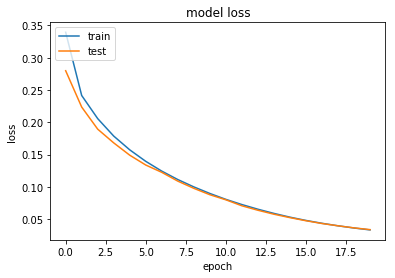

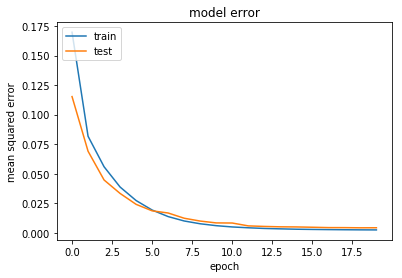

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3690 samples, validate on 522 samples
Epoch 1/20
3690/3690 [==============================] - 0s 105us/step - loss: 0.1953 - mean_squared_error: 0.0376 - val_loss: 0.1793 - val_mean_squared_error: 0.0324
Epoch 2/20
3690/3690 [==============================] - 0s 42us/step - loss: 0.1601 - mean_squared_error: 0.0229 - val_loss: 0.1498 - val_mean_squared_error: 0.0225
Epoch 3/20
3690/3690 [==============================] - 0s 37us/step - loss: 0.1328 - mean_squared_error: 0.0146 - val_loss: 0.1254 - val_mean_squared_error: 

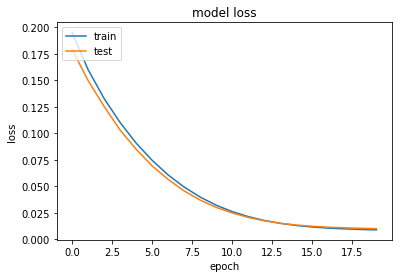

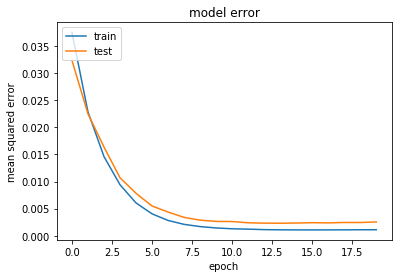

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6180 samples, validate on 840 samples
Epoch 1/20
6180/6180 [==============================] - 0s 72us/step - loss: 0.2208 - mean_squared_error: 0.0658 - val_loss: 0.1774 - val_mean_squared_error: 0.0355
Epoch 2/20
6180/6180 [==============================] - 0s 37us/step - loss: 0.1500 - mean_squared_error: 0.0214 - val_loss: 0.1319 - val_mean_squared_error: 0.0170
Epoch 3/20
6180/6180 [==============================] - 0s 36us/step - loss: 0.1111 - mean_squared_error: 0.0090 - val_loss: 0.0980 - val_mean_squared_error: 0

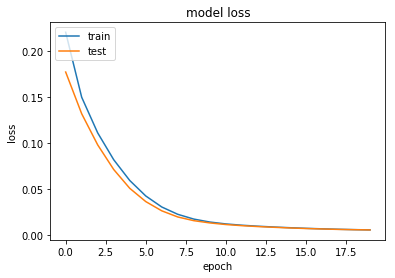

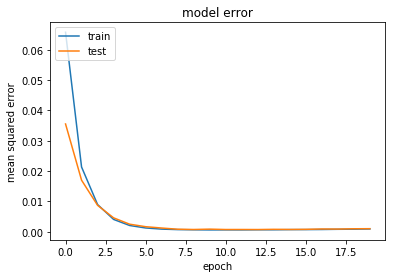

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6180 samples, validate on 840 samples
Epoch 1/20
6180/6180 [==============================] - 0s 73us/step - loss: 0.1892 - mean_squared_error: 0.0366 - val_loss: 0.1716 - val_mean_squared_error: 0.0359
Epoch 2/20
6180/6180 [==============================] - 0s 36us/step - loss: 0.1353 - mean_squared_error: 0.0150 - val_loss: 0.1197 - val_mean_squared_error: 0.0147
Epoch 3/20
6180/6180 [==============================] - 0s 36us/step - loss: 0.0982 - mean_squared_error: 0.0070 - val_loss: 0.0842 - val_mean_squared_error: 0

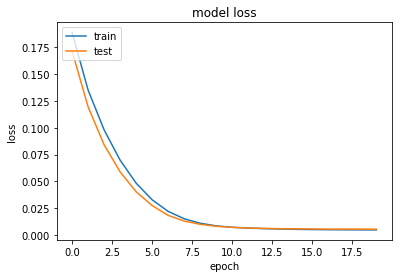

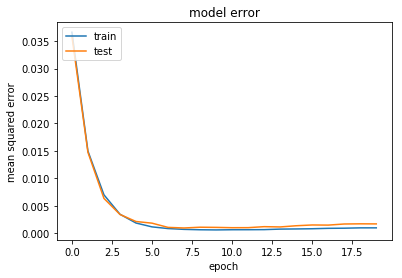

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2472 samples, validate on 336 samples
Epoch 1/20
2472/2472 [==============================] - 0s 130us/step - loss: 0.3080 - mean_squared_error: 0.1406 - val_loss: 0.2229 - val_mean_squared_error: 0.0618
Epoch 2/20
2472/2472 [==============================] - 0s 50us/step - loss: 0.2096 - mean_squared_error: 0.0545 - val_loss: 0.2107 - val_mean_squared_error: 0.0622
Epoch 3/20
2472/2472 [==============================] - 0s 46us/step - loss: 0.1782 - mean_squared_error: 0.0359 - val_loss: 0.1918 - val_mean_squared_error: 

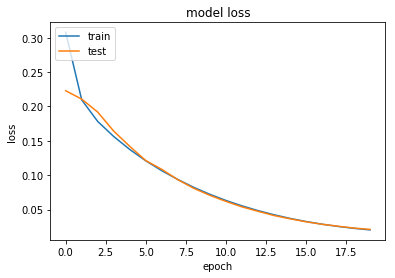

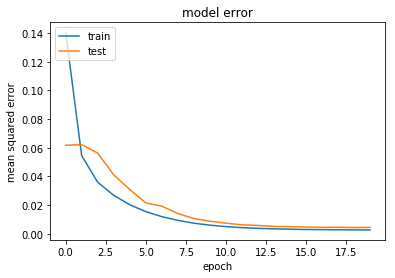

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3708 samples, validate on 504 samples
Epoch 1/20
3708/3708 [==============================] - 0s 102us/step - loss: 0.2036 - mean_squared_error: 0.0513 - val_loss: 0.1892 - val_mean_squared_error: 0.0477
Epoch 2/20
3708/3708 [==============================] - 0s 37us/step - loss: 0.1628 - mean_squared_error: 0.0309 - val_loss: 0.1531 - val_mean_squared_error: 0.0308
Epoch 3/20
3708/3708 [==============================] - 0s 37us/step - loss: 0.1325 - mean_squared_error: 0.0192 - val_loss: 0.1236 - val_mean_squared_error: 

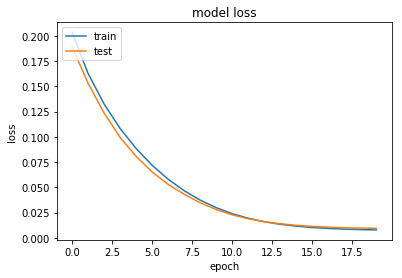

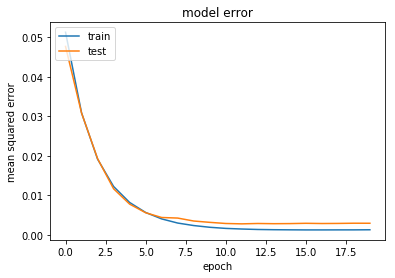

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6210 samples, validate on 810 samples
Epoch 1/20
6210/6210 [==============================] - 0s 73us/step - loss: 0.1996 - mean_squared_error: 0.0440 - val_loss: 0.2078 - val_mean_squared_error: 0.0670
Epoch 2/20
6210/6210 [==============================] - 0s 40us/step - loss: 0.1463 - mean_squared_error: 0.0195 - val_loss: 0.1408 - val_mean_squared_error: 0.0283
Epoch 3/20
6210/6210 [==============================] - 0s 38us/step - loss: 0.1091 - mean_squared_error: 0.0094 - val_loss: 0.1019 - val_mean_squared_error: 0

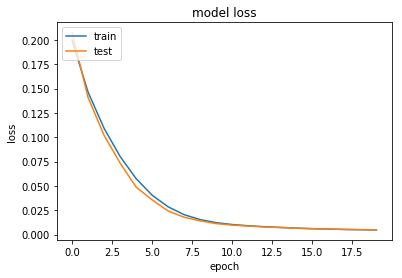

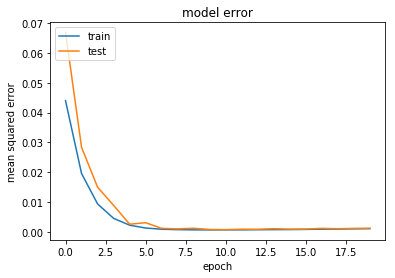

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6210 samples, validate on 810 samples
Epoch 1/20
6210/6210 [==============================] - 0s 74us/step - loss: 0.2109 - mean_squared_error: 0.0611 - val_loss: 0.2193 - val_mean_squared_error: 0.0839
Epoch 2/20
6210/6210 [==============================] - 0s 41us/step - loss: 0.1445 - mean_squared_error: 0.0226 - val_loss: 0.1698 - val_mean_squared_error: 0.0619
Epoch 3/20
6210/6210 [==============================] - 0s 37us/step - loss: 0.1047 - mean_squared_error: 0.0098 - val_loss: 0.1057 - val_mean_squared_error: 0

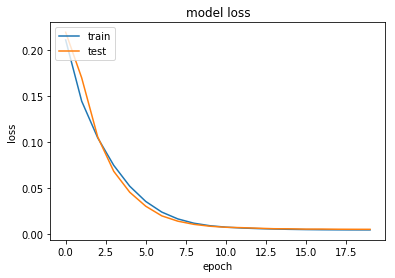

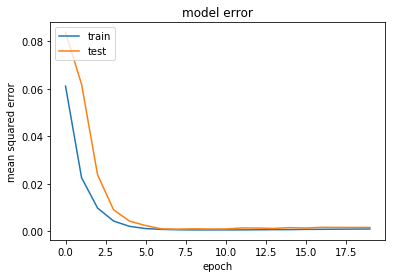

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2484 samples, validate on 324 samples
Epoch 1/20
2484/2484 [==============================] - 0s 127us/step - loss: 0.2323 - mean_squared_error: 0.0726 - val_loss: 0.2051 - val_mean_squared_error: 0.0520
Epoch 2/20
2484/2484 [==============================] - 0s 42us/step - loss: 0.1755 - mean_squared_error: 0.0289 - val_loss: 0.1705 - val_mean_squared_error: 0.0309
Epoch 3/20
2484/2484 [==============================] - 0s 37us/step - loss: 0.1524 - mean_squared_error: 0.0193 - val_loss: 0.1480 - val_mean_squared_error: 

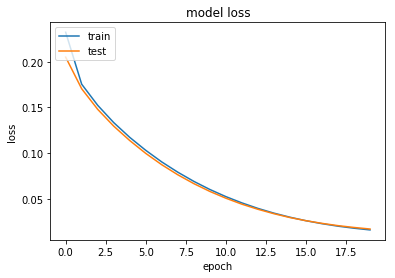

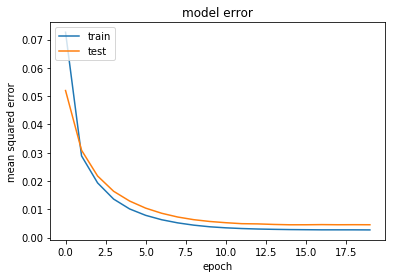

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3726 samples, validate on 486 samples
Epoch 1/20
3726/3726 [==============================] - 0s 96us/step - loss: 0.3399 - mean_squared_error: 0.1640 - val_loss: 0.3190 - val_mean_squared_error: 0.1492
Epoch 2/20
3726/3726 [==============================] - 0s 41us/step - loss: 0.2259 - mean_squared_error: 0.0621 - val_loss: 0.2469 - val_mean_squared_error: 0.0901
Epoch 3/20
3726/3726 [==============================] - 0s 40us/step - loss: 0.1835 - mean_squared_error: 0.0335 - val_loss: 0.1872 - val_mean_squared_error: 0

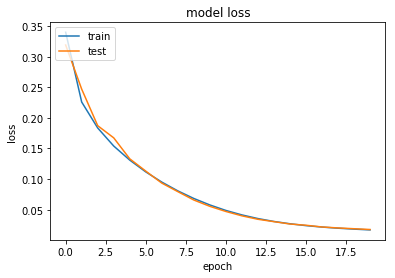

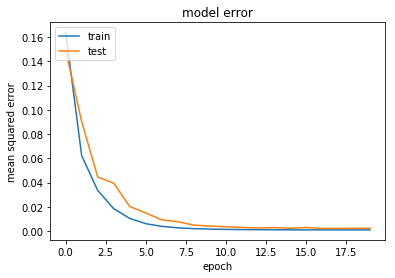

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6240 samples, validate on 780 samples
Epoch 1/20
6240/6240 [==============================] - 0s 74us/step - loss: 0.2287 - mean_squared_error: 0.0664 - val_loss: 0.2552 - val_mean_squared_error: 0.1064
Epoch 2/20
6240/6240 [==============================] - 0s 44us/step - loss: 0.1607 - mean_squared_error: 0.0251 - val_loss: 0.1764 - val_mean_squared_error: 0.0544
Epoch 3/20
6240/6240 [==============================] - 0s 42us/step - loss: 0.1194 - mean_squared_error: 0.0104 - val_loss: 0.1186 - val_mean_squared_error: 0

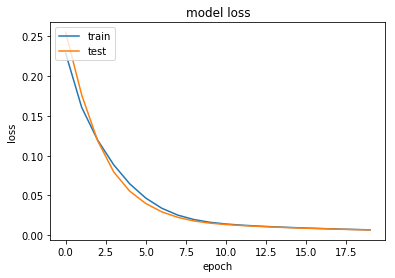

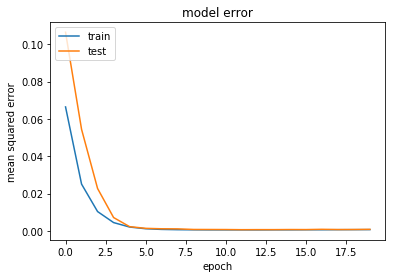

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6240 samples, validate on 780 samples
Epoch 1/20
6240/6240 [==============================] - 0s 74us/step - loss: 0.3338 - mean_squared_error: 0.1609 - val_loss: 0.2435 - val_mean_squared_error: 0.0809
Epoch 2/20
6240/6240 [==============================] - 0s 42us/step - loss: 0.1964 - mean_squared_error: 0.0451 - val_loss: 0.1765 - val_mean_squared_error: 0.0372
Epoch 3/20
6240/6240 [==============================] - 0s 38us/step - loss: 0.1447 - mean_squared_error: 0.0171 - val_loss: 0.1333 - val_mean_squared_error: 0

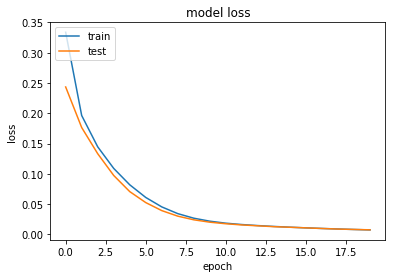

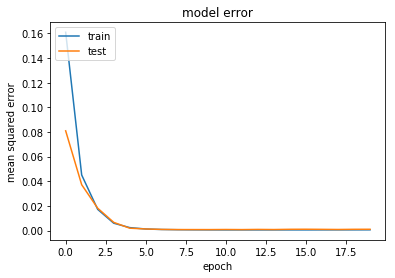

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2496 samples, validate on 312 samples
Epoch 1/20
2496/2496 [==============================] - 0s 134us/step - loss: 0.2877 - mean_squared_error: 0.1278 - val_loss: 0.3027 - val_mean_squared_error: 0.1480
Epoch 2/20
2496/2496 [==============================] - 0s 39us/step - loss: 0.2087 - mean_squared_error: 0.0591 - val_loss: 0.2179 - val_mean_squared_error: 0.0738
Epoch 3/20
2496/2496 [==============================] - 0s 38us/step - loss: 0.1743 - mean_squared_error: 0.0354 - val_loss: 0.1821 - val_mean_squared_error: 

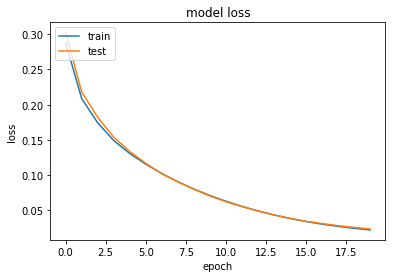

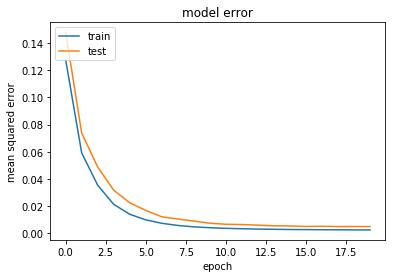

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3744 samples, validate on 468 samples
Epoch 1/20
3744/3744 [==============================] - 0s 103us/step - loss: 0.1888 - mean_squared_error: 0.0293 - val_loss: 0.1756 - val_mean_squared_error: 0.0280
Epoch 2/20
3744/3744 [==============================] - 0s 43us/step - loss: 0.1562 - mean_squared_error: 0.0188 - val_loss: 0.1449 - val_mean_squared_error: 0.0179
Epoch 3/20
3744/3744 [==============================] - 0s 44us/step - loss: 0.1296 - mean_squared_error: 0.0121 - val_loss: 0.1202 - val_mean_squared_error: 

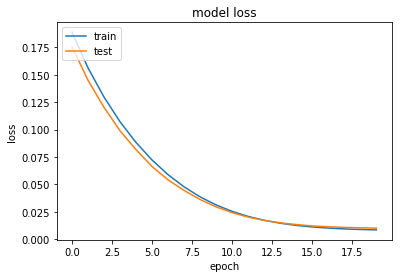

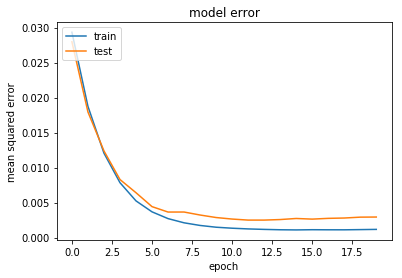

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6270 samples, validate on 750 samples
Epoch 1/20
6270/6270 [==============================] - 0s 72us/step - loss: 0.2212 - mean_squared_error: 0.0654 - val_loss: 0.1875 - val_mean_squared_error: 0.0462
Epoch 2/20
6270/6270 [==============================] - 0s 44us/step - loss: 0.1578 - mean_squared_error: 0.0300 - val_loss: 0.1346 - val_mean_squared_error: 0.0205
Epoch 3/20
6270/6270 [==============================] - 0s 39us/step - loss: 0.1142 - mean_squared_error: 0.0131 - val_loss: 0.0982 - val_mean_squared_error: 0

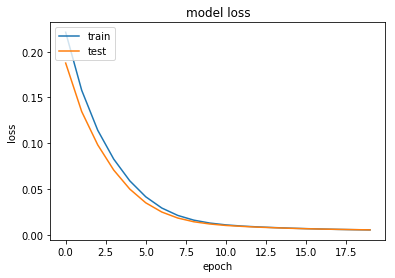

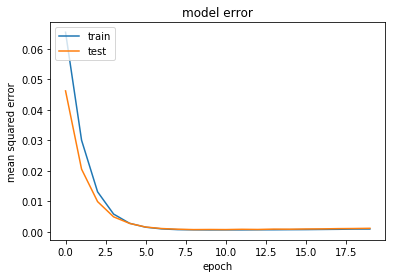

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6270 samples, validate on 750 samples
Epoch 1/20
6270/6270 [==============================] - 0s 75us/step - loss: 0.2530 - mean_squared_error: 0.0936 - val_loss: 0.2037 - val_mean_squared_error: 0.0593
Epoch 2/20
6270/6270 [==============================] - 0s 43us/step - loss: 0.1606 - mean_squared_error: 0.0308 - val_loss: 0.1389 - val_mean_squared_error: 0.0237
Epoch 3/20
6270/6270 [==============================] - 0s 38us/step - loss: 0.1149 - mean_squared_error: 0.0132 - val_loss: 0.0988 - val_mean_squared_error: 0

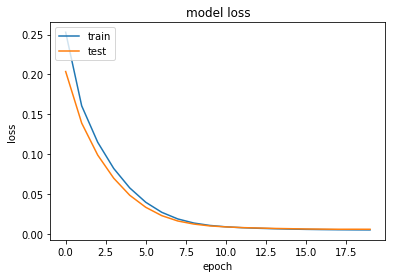

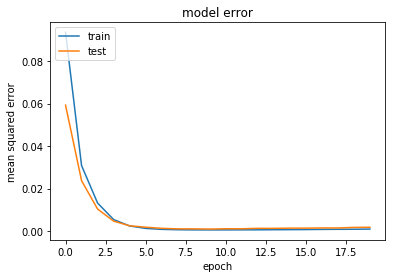

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2508 samples, validate on 300 samples
Epoch 1/20
2508/2508 [==============================] - 0s 140us/step - loss: 0.4871 - mean_squared_error: 0.3157 - val_loss: 0.2665 - val_mean_squared_error: 0.0986
Epoch 2/20
2508/2508 [==============================] - 0s 49us/step - loss: 0.2729 - mean_squared_error: 0.1088 - val_loss: 0.2654 - val_mean_squared_error: 0.1057
Epoch 3/20
2508/2508 [==============================] - 0s 43us/step - loss: 0.2201 - mean_squared_error: 0.0647 - val_loss: 0.2264 - val_mean_squared_error: 

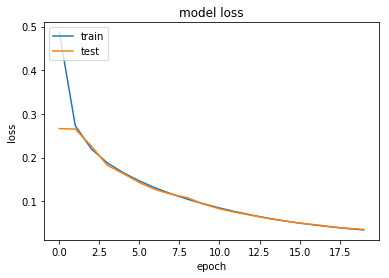

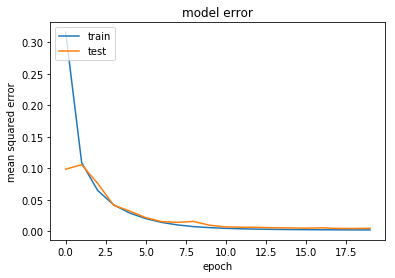

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3762 samples, validate on 450 samples
Epoch 1/20
3762/3762 [==============================] - 0s 103us/step - loss: 0.2875 - mean_squared_error: 0.1216 - val_loss: 0.2432 - val_mean_squared_error: 0.0852
Epoch 2/20
3762/3762 [==============================] - 0s 45us/step - loss: 0.2173 - mean_squared_error: 0.0667 - val_loss: 0.1985 - val_mean_squared_error: 0.0558
Epoch 3/20
3762/3762 [==============================] - 0s 42us/step - loss: 0.1748 - mean_squared_error: 0.0396 - val_loss: 0.1642 - val_mean_squared_error: 

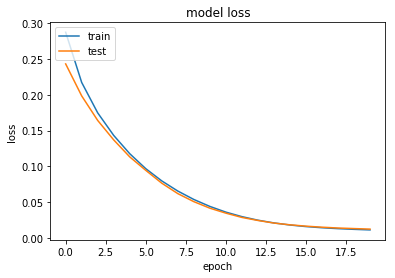

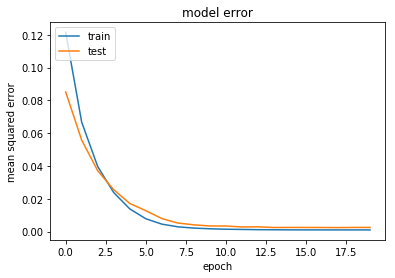

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6300 samples, validate on 720 samples
Epoch 1/20
6300/6300 [==============================] - 0s 73us/step - loss: 0.1973 - mean_squared_error: 0.0422 - val_loss: 0.1704 - val_mean_squared_error: 0.0312
Epoch 2/20
6300/6300 [==============================] - 0s 45us/step - loss: 0.1401 - mean_squared_error: 0.0158 - val_loss: 0.1216 - val_mean_squared_error: 0.0124
Epoch 3/20
6300/6300 [==============================] - 0s 38us/step - loss: 0.1024 - mean_squared_error: 0.0068 - val_loss: 0.0873 - val_mean_squared_error: 0

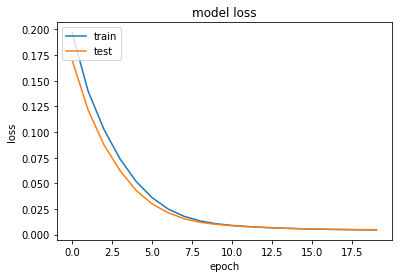

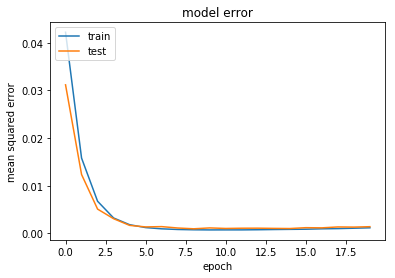

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6300 samples, validate on 720 samples
Epoch 1/20
6300/6300 [==============================] - 0s 74us/step - loss: 0.1855 - mean_squared_error: 0.0348 - val_loss: 0.1565 - val_mean_squared_error: 0.0225
Epoch 2/20
6300/6300 [==============================] - 0s 42us/step - loss: 0.1290 - mean_squared_error: 0.0109 - val_loss: 0.1114 - val_mean_squared_error: 0.0094
Epoch 3/20
6300/6300 [==============================] - 0s 40us/step - loss: 0.0921 - mean_squared_error: 0.0044 - val_loss: 0.0778 - val_mean_squared_error: 0

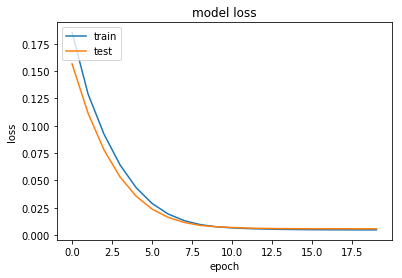

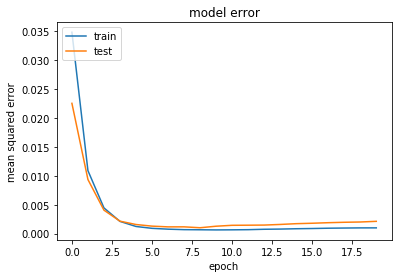

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2520 samples, validate on 288 samples
Epoch 1/20
2520/2520 [==============================] - 0s 119us/step - loss: 0.3921 - mean_squared_error: 0.2144 - val_loss: 0.3030 - val_mean_squared_error: 0.1297
Epoch 2/20
2520/2520 [==============================] - 0s 41us/step - loss: 0.2399 - mean_squared_error: 0.0715 - val_loss: 0.2262 - val_mean_squared_error: 0.0633
Epoch 3/20
2520/2520 [==============================] - 0s 39us/step - loss: 0.2047 - mean_squared_error: 0.0472 - val_loss: 0.1971 - val_mean_squared_error: 

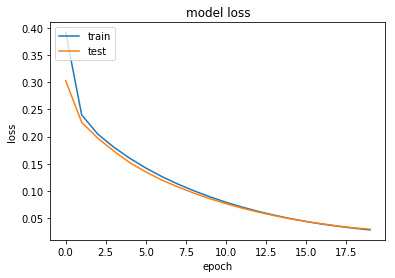

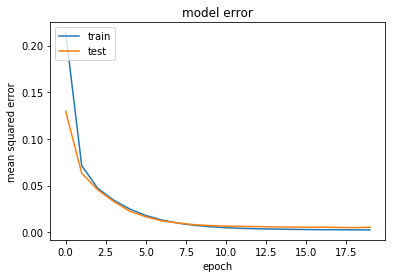

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3780 samples, validate on 432 samples
Epoch 1/20
3780/3780 [==============================] - 0s 93us/step - loss: 0.2043 - mean_squared_error: 0.0501 - val_loss: 0.1862 - val_mean_squared_error: 0.0419
Epoch 2/20
3780/3780 [==============================] - 0s 47us/step - loss: 0.1561 - mean_squared_error: 0.0209 - val_loss: 0.1514 - val_mean_squared_error: 0.0261
Epoch 3/20
3780/3780 [==============================] - 0s 42us/step - loss: 0.1279 - mean_squared_error: 0.0115 - val_loss: 0.1266 - val_mean_squared_error: 0

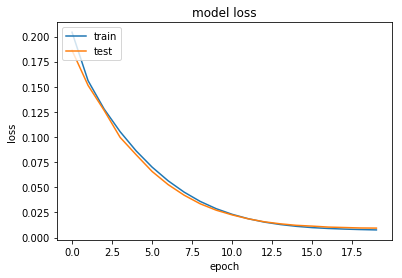

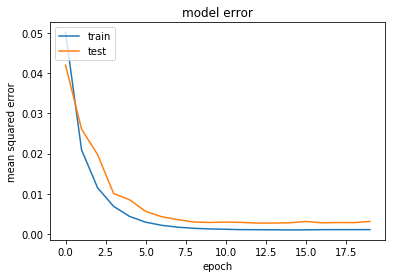

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6330 samples, validate on 690 samples
Epoch 1/20
6330/6330 [==============================] - 0s 72us/step - loss: 0.3376 - mean_squared_error: 0.1692 - val_loss: 0.1940 - val_mean_squared_error: 0.0365
Epoch 2/20
6330/6330 [==============================] - 0s 41us/step - loss: 0.1910 - mean_squared_error: 0.0461 - val_loss: 0.1506 - val_mean_squared_error: 0.0188
Epoch 3/20
6330/6330 [==============================] - 0s 40us/step - loss: 0.1379 - mean_squared_error: 0.0188 - val_loss: 0.1157 - val_mean_squared_error: 0

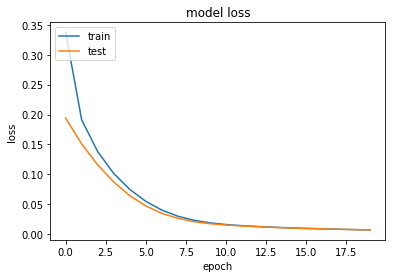

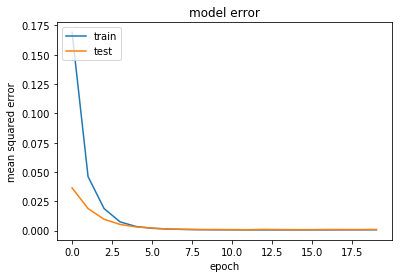

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6330 samples, validate on 690 samples
Epoch 1/20
6330/6330 [==============================] - 0s 72us/step - loss: 0.2257 - mean_squared_error: 0.0662 - val_loss: 0.1877 - val_mean_squared_error: 0.0417
Epoch 2/20
6330/6330 [==============================] - 0s 39us/step - loss: 0.1563 - mean_squared_error: 0.0240 - val_loss: 0.1360 - val_mean_squared_error: 0.0178
Epoch 3/20
6330/6330 [==============================] - 0s 38us/step - loss: 0.1152 - mean_squared_error: 0.0102 - val_loss: 0.0995 - val_mean_squared_error: 0

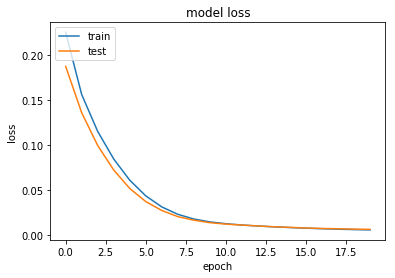

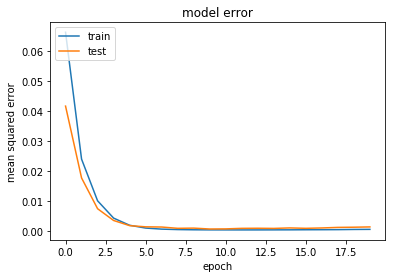

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2532 samples, validate on 276 samples
Epoch 1/20
2532/2532 [==============================] - 0s 132us/step - loss: 0.2171 - mean_squared_error: 0.0547 - val_loss: 0.2080 - val_mean_squared_error: 0.0527
Epoch 2/20
2532/2532 [==============================] - 0s 42us/step - loss: 0.1830 - mean_squared_error: 0.0341 - val_loss: 0.1809 - val_mean_squared_error: 0.0388
Epoch 3/20
2532/2532 [==============================] - 0s 42us/step - loss: 0.1600 - mean_squared_error: 0.0242 - val_loss: 0.1610 - val_mean_squared_error: 

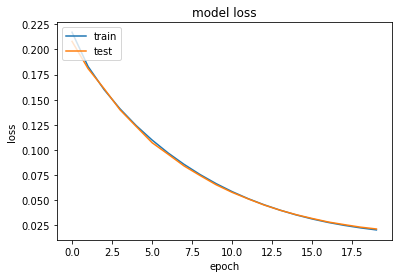

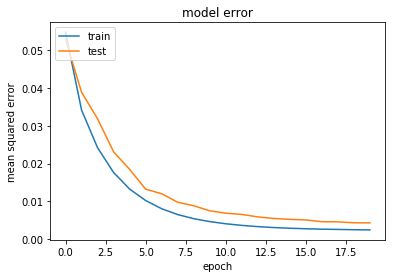

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3798 samples, validate on 414 samples
Epoch 1/20
3798/3798 [==============================] - 0s 104us/step - loss: 0.2409 - mean_squared_error: 0.0708 - val_loss: 0.2183 - val_mean_squared_error: 0.0568
Epoch 2/20
3798/3798 [==============================] - 0s 45us/step - loss: 0.1881 - mean_squared_error: 0.0345 - val_loss: 0.1729 - val_mean_squared_error: 0.0279
Epoch 3/20
3798/3798 [==============================] - 0s 48us/step - loss: 0.1539 - mean_squared_error: 0.0172 - val_loss: 0.1426 - val_mean_squared_error: 

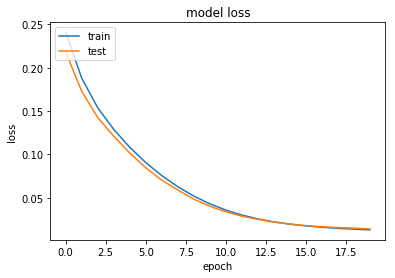

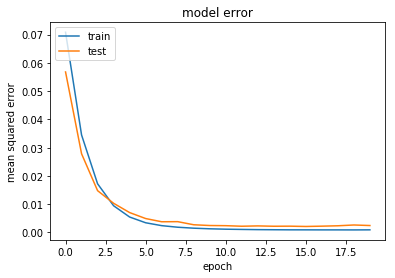

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6360 samples, validate on 660 samples
Epoch 1/20
6360/6360 [==============================] - 1s 79us/step - loss: 0.1925 - mean_squared_error: 0.0450 - val_loss: 0.1704 - val_mean_squared_error: 0.0408
Epoch 2/20
6360/6360 [==============================] - 0s 41us/step - loss: 0.1327 - mean_squared_error: 0.0188 - val_loss: 0.1249 - val_mean_squared_error: 0.0263
Epoch 3/20
6360/6360 [==============================] - 0s 39us/step - loss: 0.0948 - mean_squared_error: 0.0094 - val_loss: 0.0915 - val_mean_squared_error: 0

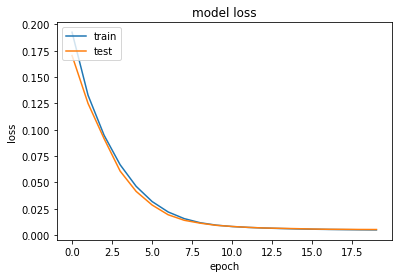

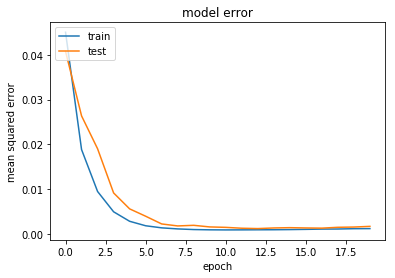

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6360 samples, validate on 660 samples
Epoch 1/20
6360/6360 [==============================] - 0s 71us/step - loss: 0.1784 - mean_squared_error: 0.0352 - val_loss: 0.1488 - val_mean_squared_error: 0.0234
Epoch 2/20
6360/6360 [==============================] - 0s 40us/step - loss: 0.1251 - mean_squared_error: 0.0153 - val_loss: 0.1064 - val_mean_squared_error: 0.0120
Epoch 3/20
6360/6360 [==============================] - 0s 38us/step - loss: 0.0879 - mean_squared_error: 0.0069 - val_loss: 0.0740 - val_mean_squared_error: 0

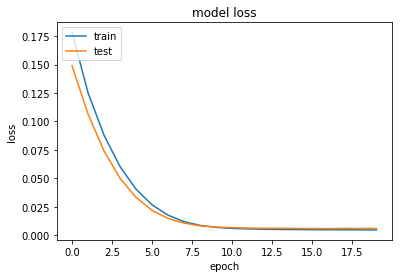

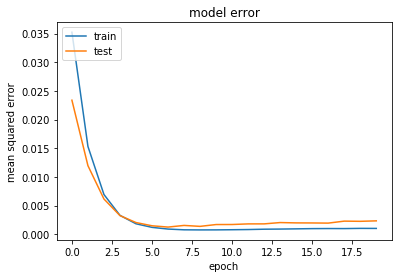

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2544 samples, validate on 264 samples
Epoch 1/20
2544/2544 [==============================] - 0s 140us/step - loss: 0.3546 - mean_squared_error: 0.1938 - val_loss: 0.3179 - val_mean_squared_error: 0.1624
Epoch 2/20
2544/2544 [==============================] - 0s 42us/step - loss: 0.2383 - mean_squared_error: 0.0878 - val_loss: 0.2275 - val_mean_squared_error: 0.0825
Epoch 3/20
2544/2544 [==============================] - 0s 39us/step - loss: 0.1960 - mean_squared_error: 0.0561 - val_loss: 0.1889 - val_mean_squared_error: 

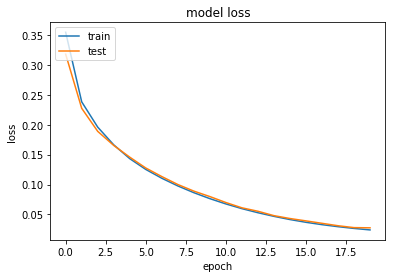

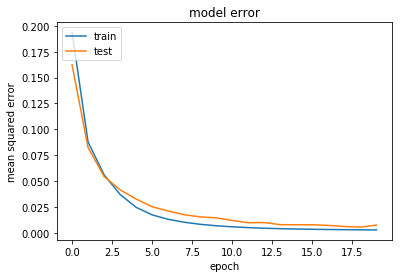

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3816 samples, validate on 396 samples
Epoch 1/20
3816/3816 [==============================] - 0s 92us/step - loss: 0.3792 - mean_squared_error: 0.2012 - val_loss: 0.2793 - val_mean_squared_error: 0.1077
Epoch 2/20
3816/3816 [==============================] - 0s 42us/step - loss: 0.2599 - mean_squared_error: 0.0946 - val_loss: 0.2153 - val_mean_squared_error: 0.0567
Epoch 3/20
3816/3816 [==============================] - 0s 37us/step - loss: 0.2045 - mean_squared_error: 0.0525 - val_loss: 0.1781 - val_mean_squared_error: 0

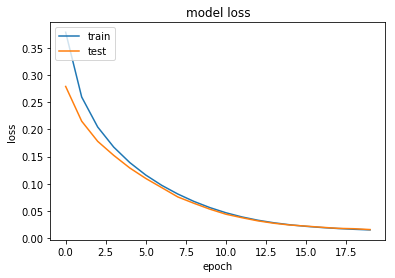

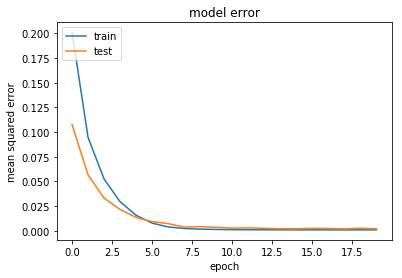

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6390 samples, validate on 630 samples
Epoch 1/20
6390/6390 [==============================] - 0s 77us/step - loss: 0.2380 - mean_squared_error: 0.0632 - val_loss: 0.2050 - val_mean_squared_error: 0.0428
Epoch 2/20
6390/6390 [==============================] - 0s 38us/step - loss: 0.1711 - mean_squared_error: 0.0219 - val_loss: 0.1507 - val_mean_squared_error: 0.0151
Epoch 3/20
6390/6390 [==============================] - 0s 38us/step - loss: 0.1298 - mean_squared_error: 0.0076 - val_loss: 0.1129 - val_mean_squared_error: 0

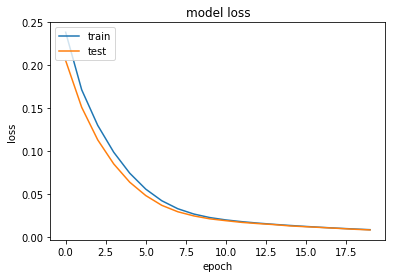

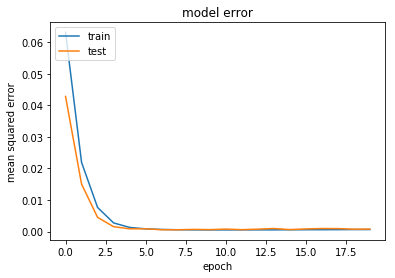

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6390 samples, validate on 630 samples
Epoch 1/20
6390/6390 [==============================] - 0s 75us/step - loss: 0.1486 - mean_squared_error: 0.0182 - val_loss: 0.1284 - val_mean_squared_error: 0.0170
Epoch 2/20
6390/6390 [==============================] - 0s 43us/step - loss: 0.1037 - mean_squared_error: 0.0085 - val_loss: 0.0886 - val_mean_squared_error: 0.0088
Epoch 3/20
6390/6390 [==============================] - 0s 42us/step - loss: 0.0707 - mean_squared_error: 0.0040 - val_loss: 0.0601 - val_mean_squared_error: 0

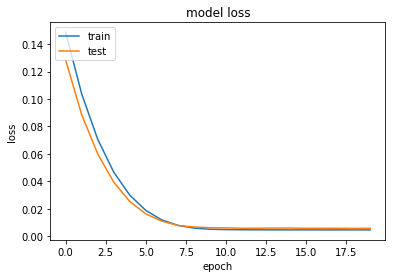

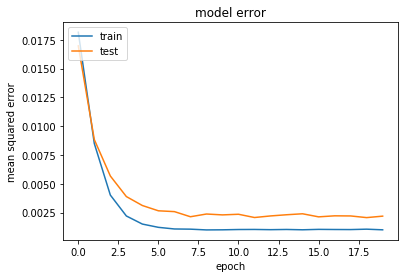

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2556 samples, validate on 252 samples
Epoch 1/20
2556/2556 [==============================] - 0s 119us/step - loss: 0.2521 - mean_squared_error: 0.0984 - val_loss: 0.2327 - val_mean_squared_error: 0.0857
Epoch 2/20
2556/2556 [==============================] - 0s 46us/step - loss: 0.2034 - mean_squared_error: 0.0624 - val_loss: 0.1981 - val_mean_squared_error: 0.0635
Epoch 3/20
2556/2556 [==============================] - 0s 37us/step - loss: 0.1714 - mean_squared_error: 0.0425 - val_loss: 0.1661 - val_mean_squared_error: 

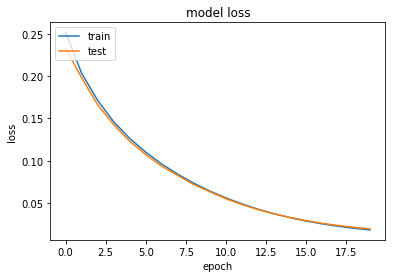

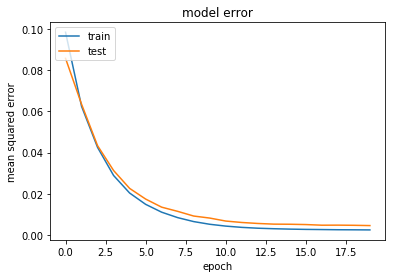

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3834 samples, validate on 378 samples
Epoch 1/20
3834/3834 [==============================] - 0s 96us/step - loss: 0.2395 - mean_squared_error: 0.0777 - val_loss: 0.2274 - val_mean_squared_error: 0.0759
Epoch 2/20
3834/3834 [==============================] - 0s 40us/step - loss: 0.1871 - mean_squared_error: 0.0448 - val_loss: 0.1771 - val_mean_squared_error: 0.0441
Epoch 3/20
3834/3834 [==============================] - 0s 37us/step - loss: 0.1494 - mean_squared_error: 0.0251 - val_loss: 0.1378 - val_mean_squared_error: 0

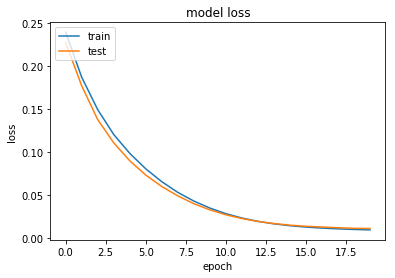

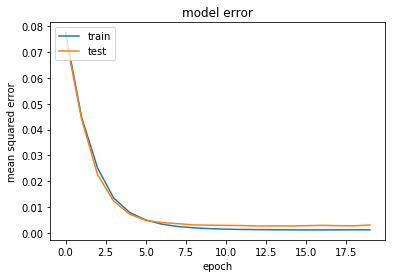

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6420 samples, validate on 600 samples
Epoch 1/20
6420/6420 [==============================] - 0s 73us/step - loss: 0.2568 - mean_squared_error: 0.0848 - val_loss: 0.1962 - val_mean_squared_error: 0.0369
Epoch 2/20
6420/6420 [==============================] - 0s 39us/step - loss: 0.1785 - mean_squared_error: 0.0318 - val_loss: 0.1501 - val_mean_squared_error: 0.0166
Epoch 3/20
6420/6420 [==============================] - 0s 37us/step - loss: 0.1321 - mean_squared_error: 0.0116 - val_loss: 0.1140 - val_mean_squared_error: 0

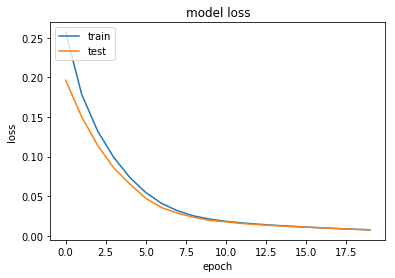

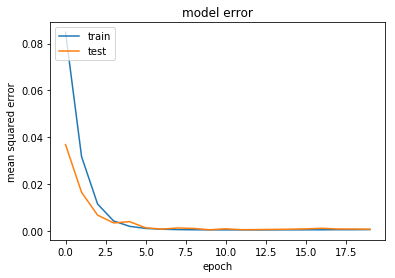

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6420 samples, validate on 600 samples
Epoch 1/20
6420/6420 [==============================] - 0s 72us/step - loss: 0.2185 - mean_squared_error: 0.0646 - val_loss: 0.1899 - val_mean_squared_error: 0.0513
Epoch 2/20
6420/6420 [==============================] - 0s 40us/step - loss: 0.1467 - mean_squared_error: 0.0225 - val_loss: 0.1316 - val_mean_squared_error: 0.0218
Epoch 3/20
6420/6420 [==============================] - 0s 39us/step - loss: 0.1060 - mean_squared_error: 0.0094 - val_loss: 0.0937 - val_mean_squared_error: 0

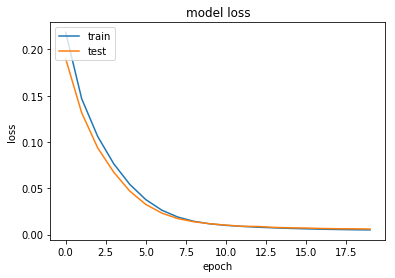

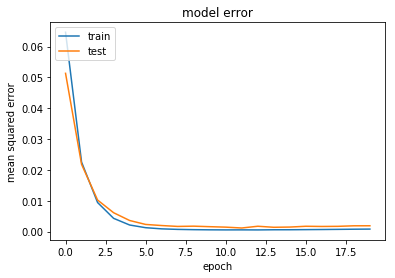

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2568 samples, validate on 240 samples
Epoch 1/20
2568/2568 [==============================] - 0s 134us/step - loss: 0.2093 - mean_squared_error: 0.0515 - val_loss: 0.2019 - val_mean_squared_error: 0.0513
Epoch 2/20
2568/2568 [==============================] - 0s 43us/step - loss: 0.1802 - mean_squared_error: 0.0357 - val_loss: 0.1753 - val_mean_squared_error: 0.0373
Epoch 3/20
2568/2568 [==============================] - 0s 40us/step - loss: 0.1583 - mean_squared_error: 0.0263 - val_loss: 0.1531 - val_mean_squared_error: 

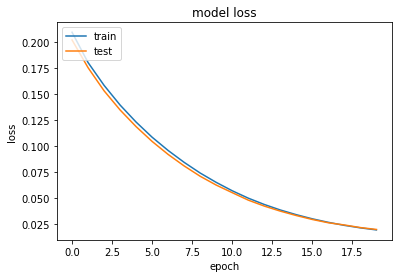

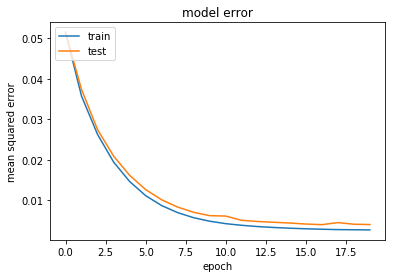

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3852 samples, validate on 360 samples
Epoch 1/20
3852/3852 [==============================] - 0s 94us/step - loss: 0.2362 - mean_squared_error: 0.0779 - val_loss: 0.2240 - val_mean_squared_error: 0.0744
Epoch 2/20
3852/3852 [==============================] - 0s 47us/step - loss: 0.1766 - mean_squared_error: 0.0352 - val_loss: 0.1676 - val_mean_squared_error: 0.0350
Epoch 3/20
3852/3852 [==============================] - 0s 39us/step - loss: 0.1421 - mean_squared_error: 0.0180 - val_loss: 0.1324 - val_mean_squared_error: 0

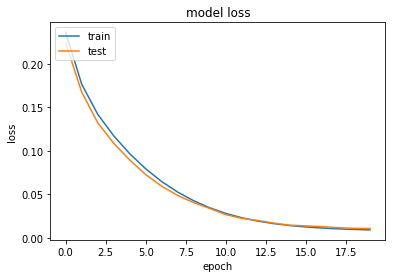

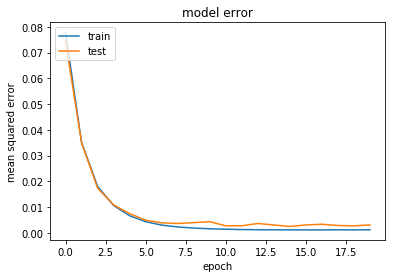

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6450 samples, validate on 570 samples
Epoch 1/20
6450/6450 [==============================] - 0s 77us/step - loss: 0.1874 - mean_squared_error: 0.0417 - val_loss: 0.1551 - val_mean_squared_error: 0.0255
Epoch 2/20
6450/6450 [==============================] - 0s 39us/step - loss: 0.1325 - mean_squared_error: 0.0174 - val_loss: 0.1119 - val_mean_squared_error: 0.0113
Epoch 3/20
6450/6450 [==============================] - 0s 38us/step - loss: 0.0947 - mean_squared_error: 0.0071 - val_loss: 0.0804 - val_mean_squared_error: 0

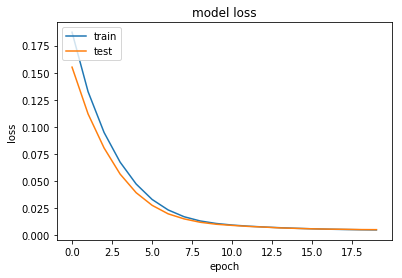

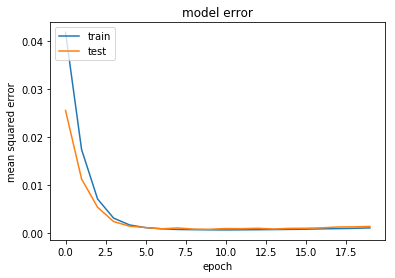

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6450 samples, validate on 570 samples
Epoch 1/20
6450/6450 [==============================] - 0s 74us/step - loss: 0.1747 - mean_squared_error: 0.0288 - val_loss: 0.1545 - val_mean_squared_error: 0.0271
Epoch 2/20
6450/6450 [==============================] - 0s 43us/step - loss: 0.1246 - mean_squared_error: 0.0132 - val_loss: 0.1087 - val_mean_squared_error: 0.0131
Epoch 3/20
6450/6450 [==============================] - 0s 38us/step - loss: 0.0877 - mean_squared_error: 0.0058 - val_loss: 0.0749 - val_mean_squared_error: 0

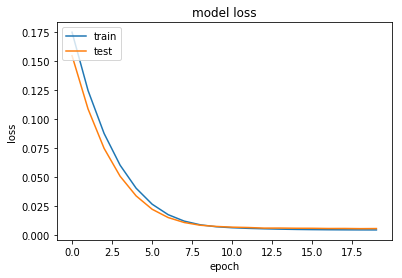

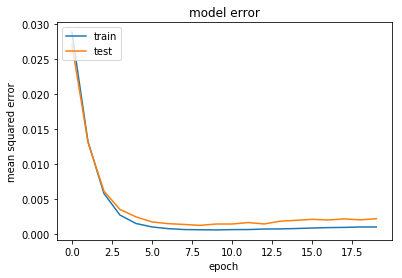

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2580 samples, validate on 228 samples
Epoch 1/20
2580/2580 [==============================] - 0s 123us/step - loss: 0.2563 - mean_squared_error: 0.0856 - val_loss: 0.2281 - val_mean_squared_error: 0.0636
Epoch 2/20
2580/2580 [==============================] - 0s 57us/step - loss: 0.2066 - mean_squared_error: 0.0478 - val_loss: 0.1943 - val_mean_squared_error: 0.0415
Epoch 3/20
2580/2580 [==============================] - 0s 53us/step - loss: 0.1789 - mean_squared_error: 0.0316 - val_loss: 0.1664 - val_mean_squared_error: 

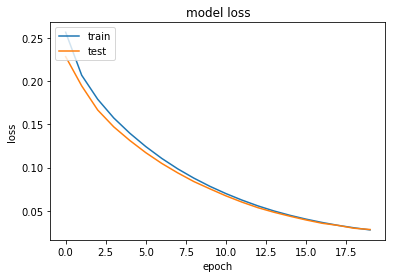

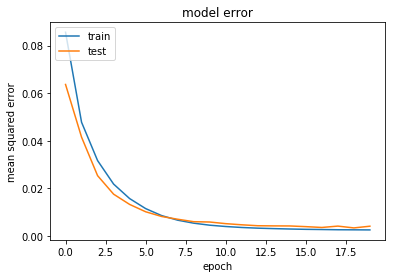

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3870 samples, validate on 342 samples
Epoch 1/20
3870/3870 [==============================] - 0s 96us/step - loss: 0.2002 - mean_squared_error: 0.0406 - val_loss: 0.2087 - val_mean_squared_error: 0.0598
Epoch 2/20
3870/3870 [==============================] - 0s 39us/step - loss: 0.1589 - mean_squared_error: 0.0201 - val_loss: 0.1598 - val_mean_squared_error: 0.0315
Epoch 3/20
3870/3870 [==============================] - 0s 44us/step - loss: 0.1303 - mean_squared_error: 0.0118 - val_loss: 0.1269 - val_mean_squared_error: 0

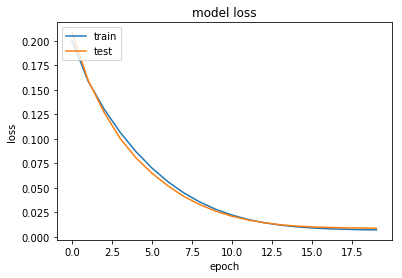

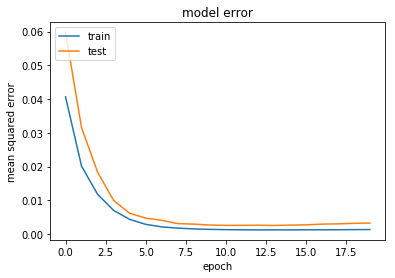

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6480 samples, validate on 540 samples
Epoch 1/20
6480/6480 [==============================] - 0s 75us/step - loss: 0.2102 - mean_squared_error: 0.0523 - val_loss: 0.1826 - val_mean_squared_error: 0.0403
Epoch 2/20
6480/6480 [==============================] - 0s 38us/step - loss: 0.1470 - mean_squared_error: 0.0198 - val_loss: 0.1259 - val_mean_squared_error: 0.0140
Epoch 3/20
6480/6480 [==============================] - 0s 40us/step - loss: 0.1060 - mean_squared_error: 0.0081 - val_loss: 0.0899 - val_mean_squared_error: 0

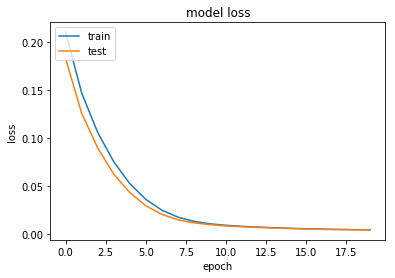

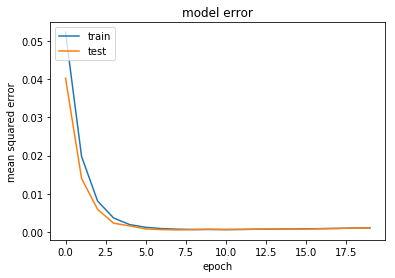

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6480 samples, validate on 540 samples
Epoch 1/20
6480/6480 [==============================] - 0s 72us/step - loss: 0.2150 - mean_squared_error: 0.0525 - val_loss: 0.1766 - val_mean_squared_error: 0.0280
Epoch 2/20
6480/6480 [==============================] - 0s 42us/step - loss: 0.1519 - mean_squared_error: 0.0173 - val_loss: 0.1289 - val_mean_squared_error: 0.0089
Epoch 3/20
6480/6480 [==============================] - 0s 39us/step - loss: 0.1127 - mean_squared_error: 0.0068 - val_loss: 0.0952 - val_mean_squared_error: 0

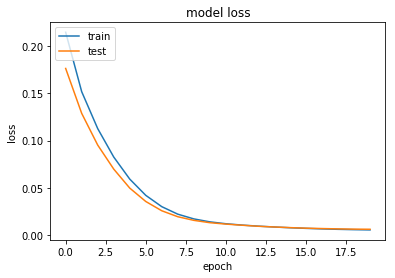

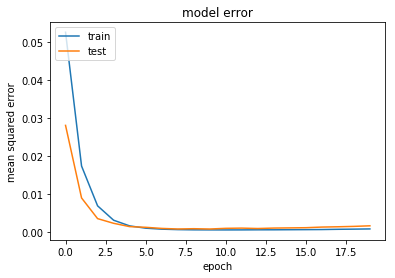

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2592 samples, validate on 216 samples
Epoch 1/20
2592/2592 [==============================] - 0s 120us/step - loss: 0.7478 - mean_squared_error: 0.5860 - val_loss: 0.4839 - val_mean_squared_error: 0.3259
Epoch 2/20
2592/2592 [==============================] - 0s 48us/step - loss: 0.3662 - mean_squared_error: 0.2120 - val_loss: 0.2217 - val_mean_squared_error: 0.0717
Epoch 3/20
2592/2592 [==============================] - 0s 41us/step - loss: 0.2225 - mean_squared_error: 0.0771 - val_loss: 0.1735 - val_mean_squared_error: 

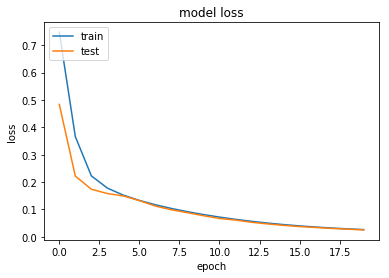

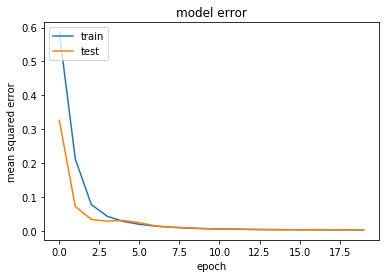

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3888 samples, validate on 324 samples
Epoch 1/20
3888/3888 [==============================] - 0s 94us/step - loss: 0.2362 - mean_squared_error: 0.0833 - val_loss: 0.2375 - val_mean_squared_error: 0.0951
Epoch 2/20
3888/3888 [==============================] - 0s 45us/step - loss: 0.1801 - mean_squared_error: 0.0470 - val_loss: 0.1815 - val_mean_squared_error: 0.0579
Epoch 3/20
3888/3888 [==============================] - 0s 41us/step - loss: 0.1423 - mean_squared_error: 0.0275 - val_loss: 0.1387 - val_mean_squared_error: 0

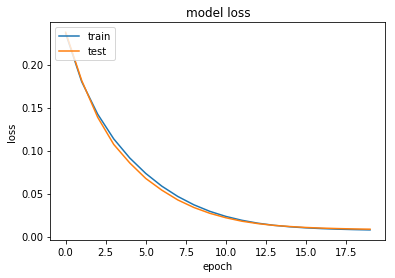

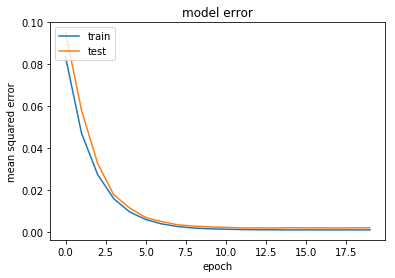

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6510 samples, validate on 510 samples
Epoch 1/20
6510/6510 [==============================] - 0s 73us/step - loss: 0.3012 - mean_squared_error: 0.1363 - val_loss: 0.2150 - val_mean_squared_error: 0.0633
Epoch 2/20
6510/6510 [==============================] - 0s 39us/step - loss: 0.1709 - mean_squared_error: 0.0332 - val_loss: 0.1430 - val_mean_squared_error: 0.0194
Epoch 3/20
6510/6510 [==============================] - 0s 37us/step - loss: 0.1239 - mean_squared_error: 0.0135 - val_loss: 0.1068 - val_mean_squared_error: 0

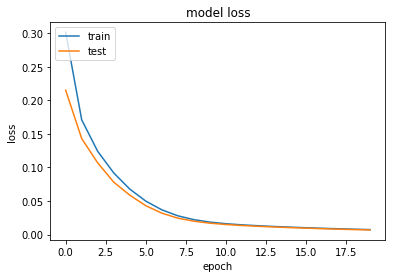

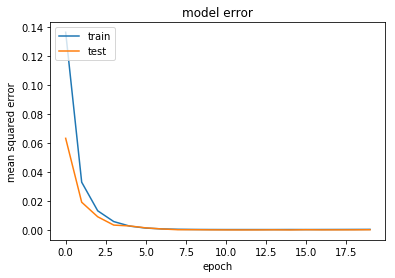

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6510 samples, validate on 510 samples
Epoch 1/20
6510/6510 [==============================] - 0s 72us/step - loss: 0.2080 - mean_squared_error: 0.0561 - val_loss: 0.1632 - val_mean_squared_error: 0.0273
Epoch 2/20
6510/6510 [==============================] - 0s 38us/step - loss: 0.1421 - mean_squared_error: 0.0211 - val_loss: 0.1216 - val_mean_squared_error: 0.0155
Epoch 3/20
6510/6510 [==============================] - 0s 39us/step - loss: 0.1023 - mean_squared_error: 0.0096 - val_loss: 0.0872 - val_mean_squared_error: 0

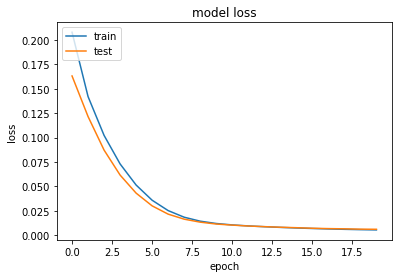

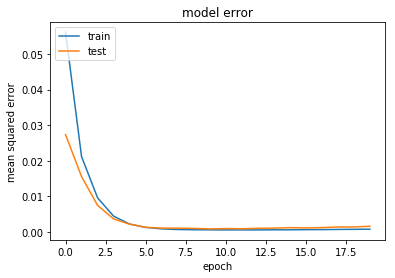

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2604 samples, validate on 204 samples
Epoch 1/20
2604/2604 [==============================] - 0s 116us/step - loss: 0.2376 - mean_squared_error: 0.0699 - val_loss: 0.2002 - val_mean_squared_error: 0.0388
Epoch 2/20
2604/2604 [==============================] - 0s 40us/step - loss: 0.1993 - mean_squared_error: 0.0433 - val_loss: 0.1748 - val_mean_squared_error: 0.0247
Epoch 3/20
2604/2604 [==============================] - 0s 37us/step - loss: 0.1734 - mean_squared_error: 0.0289 - val_loss: 0.1534 - val_mean_squared_error: 

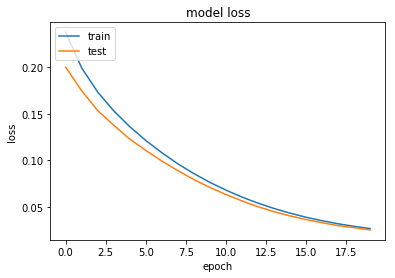

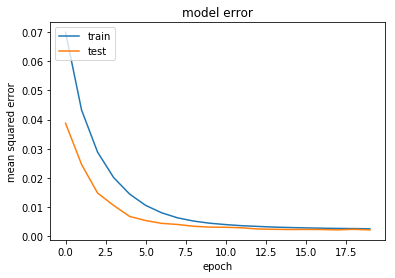

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3906 samples, validate on 306 samples
Epoch 1/20
3906/3906 [==============================] - 0s 95us/step - loss: 0.2665 - mean_squared_error: 0.0952 - val_loss: 0.2116 - val_mean_squared_error: 0.0494
Epoch 2/20
3906/3906 [==============================] - 0s 40us/step - loss: 0.2012 - mean_squared_error: 0.0472 - val_loss: 0.1715 - val_mean_squared_error: 0.0262
Epoch 3/20
3906/3906 [==============================] - 0s 36us/step - loss: 0.1630 - mean_squared_error: 0.0259 - val_loss: 0.1424 - val_mean_squared_error: 0

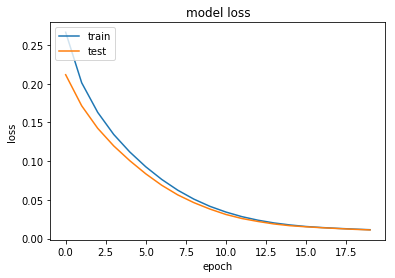

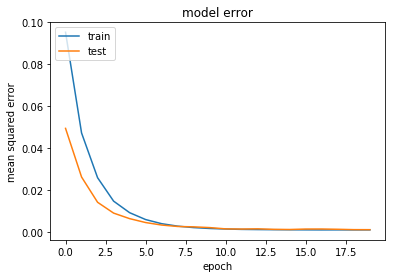

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6540 samples, validate on 480 samples
Epoch 1/20
6540/6540 [==============================] - 0s 72us/step - loss: 0.2115 - mean_squared_error: 0.0586 - val_loss: 0.1955 - val_mean_squared_error: 0.0597
Epoch 2/20
6540/6540 [==============================] - 0s 44us/step - loss: 0.1474 - mean_squared_error: 0.0266 - val_loss: 0.1315 - val_mean_squared_error: 0.0256
Epoch 3/20
6540/6540 [==============================] - 0s 39us/step - loss: 0.1046 - mean_squared_error: 0.0120 - val_loss: 0.0906 - val_mean_squared_error: 0

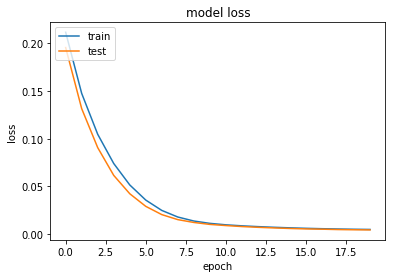

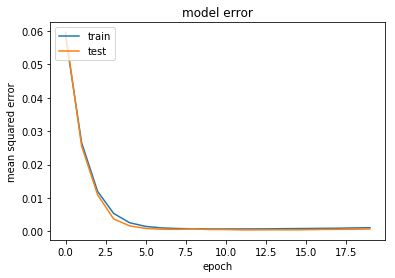

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6540 samples, validate on 480 samples
Epoch 1/20
6540/6540 [==============================] - 0s 72us/step - loss: 0.1912 - mean_squared_error: 0.0421 - val_loss: 0.1774 - val_mean_squared_error: 0.0441
Epoch 2/20
6540/6540 [==============================] - 0s 39us/step - loss: 0.1349 - mean_squared_error: 0.0165 - val_loss: 0.1211 - val_mean_squared_error: 0.0179
Epoch 3/20
6540/6540 [==============================] - 0s 37us/step - loss: 0.0962 - mean_squared_error: 0.0068 - val_loss: 0.0823 - val_mean_squared_error: 0

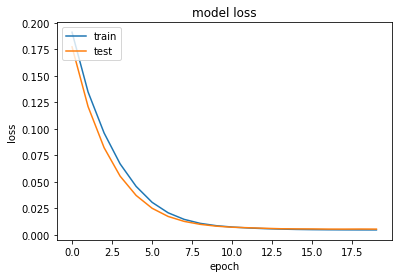

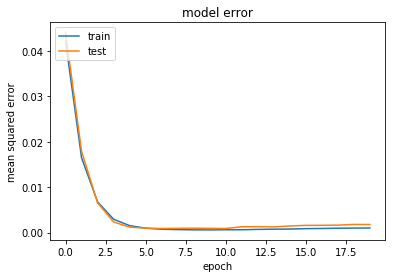

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2616 samples, validate on 192 samples
Epoch 1/20
2616/2616 [==============================] - 0s 124us/step - loss: 0.3030 - mean_squared_error: 0.1365 - val_loss: 0.2214 - val_mean_squared_error: 0.0607
Epoch 2/20
2616/2616 [==============================] - 0s 41us/step - loss: 0.2076 - mean_squared_error: 0.0527 - val_loss: 0.1991 - val_mean_squared_error: 0.0503
Epoch 3/20
2616/2616 [==============================] - 0s 38us/step - loss: 0.1756 - mean_squared_error: 0.0326 - val_loss: 0.1686 - val_mean_squared_error: 

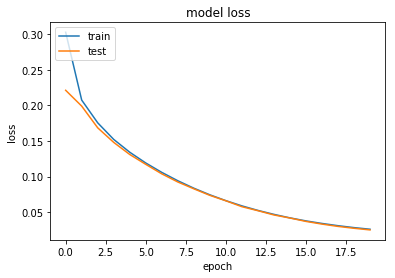

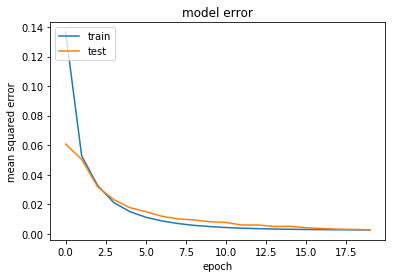

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3924 samples, validate on 288 samples
Epoch 1/20
3924/3924 [==============================] - 0s 93us/step - loss: 0.4220 - mean_squared_error: 0.2457 - val_loss: 0.2948 - val_mean_squared_error: 0.1242
Epoch 2/20
3924/3924 [==============================] - 0s 44us/step - loss: 0.2395 - mean_squared_error: 0.0753 - val_loss: 0.2199 - val_mean_squared_error: 0.0628
Epoch 3/20
3924/3924 [==============================] - 0s 39us/step - loss: 0.1878 - mean_squared_error: 0.0376 - val_loss: 0.1751 - val_mean_squared_error: 0

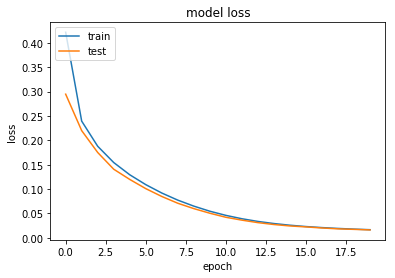

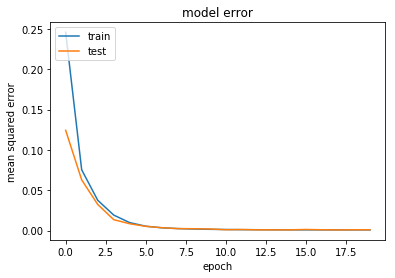

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6570 samples, validate on 450 samples
Epoch 1/20
6570/6570 [==============================] - 0s 72us/step - loss: 0.2444 - mean_squared_error: 0.0752 - val_loss: 0.1907 - val_mean_squared_error: 0.0347
Epoch 2/20
6570/6570 [==============================] - 0s 39us/step - loss: 0.1668 - mean_squared_error: 0.0243 - val_loss: 0.1407 - val_mean_squared_error: 0.0122
Epoch 3/20
6570/6570 [==============================] - 0s 35us/step - loss: 0.1239 - mean_squared_error: 0.0092 - val_loss: 0.1058 - val_mean_squared_error: 0

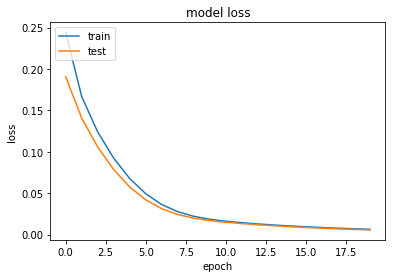

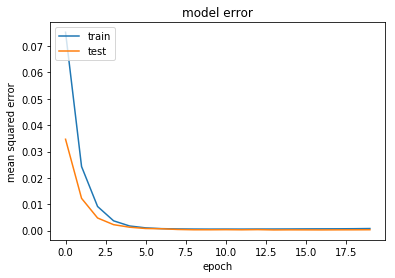

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6570 samples, validate on 450 samples
Epoch 1/20
6570/6570 [==============================] - 0s 69us/step - loss: 0.2402 - mean_squared_error: 0.0732 - val_loss: 0.1856 - val_mean_squared_error: 0.0328
Epoch 2/20
6570/6570 [==============================] - 0s 39us/step - loss: 0.1618 - mean_squared_error: 0.0234 - val_loss: 0.1372 - val_mean_squared_error: 0.0135
Epoch 3/20
6570/6570 [==============================] - 0s 36us/step - loss: 0.1195 - mean_squared_error: 0.0098 - val_loss: 0.1037 - val_mean_squared_error: 0

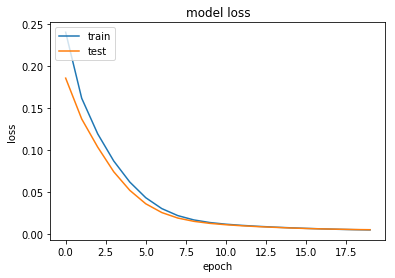

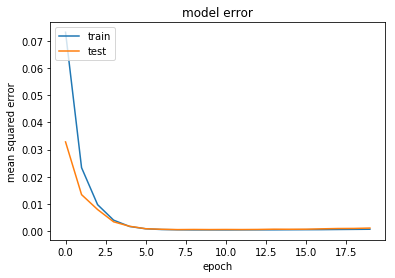

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2628 samples, validate on 180 samples
Epoch 1/20
2628/2628 [==============================] - 0s 120us/step - loss: 0.2094 - mean_squared_error: 0.0469 - val_loss: 0.2064 - val_mean_squared_error: 0.0512
Epoch 2/20
2628/2628 [==============================] - 0s 44us/step - loss: 0.1788 - mean_squared_error: 0.0301 - val_loss: 0.1780 - val_mean_squared_error: 0.0361
Epoch 3/20
2628/2628 [==============================] - 0s 38us/step - loss: 0.1571 - mean_squared_error: 0.0214 - val_loss: 0.1556 - val_mean_squared_error: 

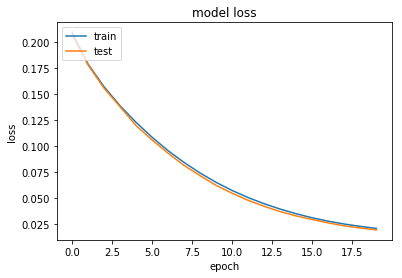

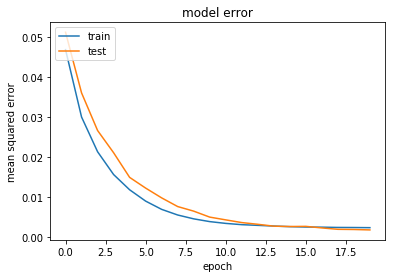

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3942 samples, validate on 270 samples
Epoch 1/20
3942/3942 [==============================] - 0s 85us/step - loss: 0.2226 - mean_squared_error: 0.0631 - val_loss: 0.1906 - val_mean_squared_error: 0.0409
Epoch 2/20
3942/3942 [==============================] - 0s 42us/step - loss: 0.1667 - mean_squared_error: 0.0263 - val_loss: 0.1499 - val_mean_squared_error: 0.0194
Epoch 3/20
3942/3942 [==============================] - 0s 38us/step - loss: 0.1339 - mean_squared_error: 0.0128 - val_loss: 0.1208 - val_mean_squared_error: 0

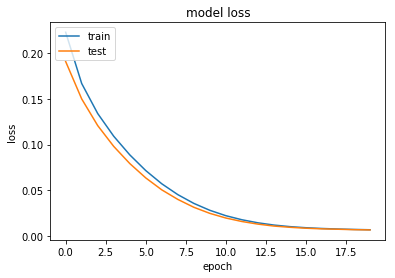

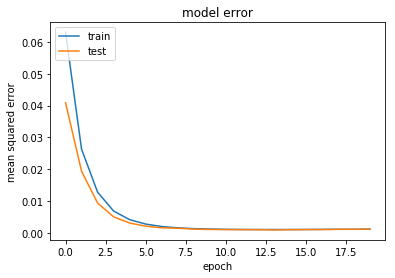

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6600 samples, validate on 420 samples
Epoch 1/20
6600/6600 [==============================] - 0s 69us/step - loss: 0.2199 - mean_squared_error: 0.0633 - val_loss: 0.2027 - val_mean_squared_error: 0.0620
Epoch 2/20
6600/6600 [==============================] - 0s 39us/step - loss: 0.1492 - mean_squared_error: 0.0236 - val_loss: 0.1339 - val_mean_squared_error: 0.0235
Epoch 3/20
6600/6600 [==============================] - 0s 37us/step - loss: 0.1063 - mean_squared_error: 0.0095 - val_loss: 0.0920 - val_mean_squared_error: 0

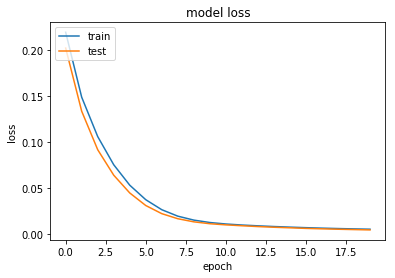

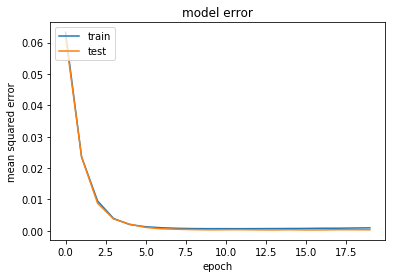

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6600 samples, validate on 420 samples
Epoch 1/20
6600/6600 [==============================] - 0s 73us/step - loss: 0.2268 - mean_squared_error: 0.0685 - val_loss: 0.1685 - val_mean_squared_error: 0.0239
Epoch 2/20
6600/6600 [==============================] - 0s 40us/step - loss: 0.1599 - mean_squared_error: 0.0286 - val_loss: 0.1303 - val_mean_squared_error: 0.0124
Epoch 3/20
6600/6600 [==============================] - 0s 38us/step - loss: 0.1160 - mean_squared_error: 0.0109 - val_loss: 0.0975 - val_mean_squared_error: 0

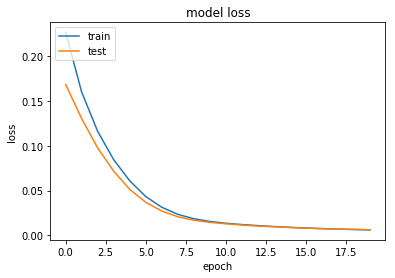

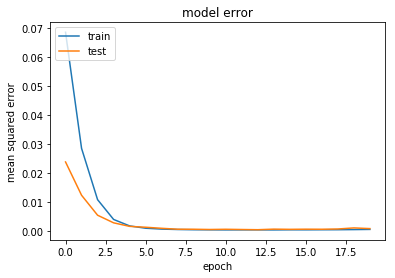

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2640 samples, validate on 168 samples
Epoch 1/20
2640/2640 [==============================] - 0s 116us/step - loss: 0.2753 - mean_squared_error: 0.1147 - val_loss: 0.2112 - val_mean_squared_error: 0.0568
Epoch 2/20
2640/2640 [==============================] - 0s 38us/step - loss: 0.2107 - mean_squared_error: 0.0618 - val_loss: 0.1700 - val_mean_squared_error: 0.0271
Epoch 3/20
2640/2640 [==============================] - 0s 43us/step - loss: 0.1749 - mean_squared_error: 0.0376 - val_loss: 0.1468 - val_mean_squared_error: 

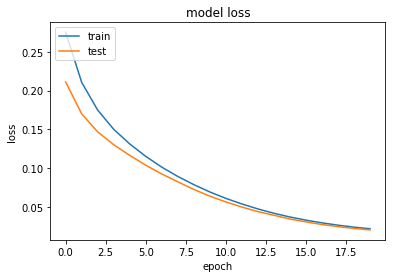

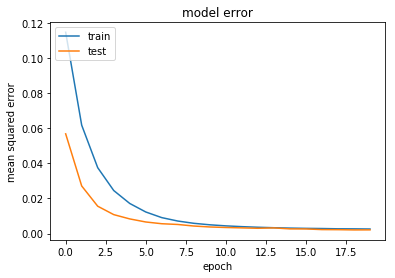

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3960 samples, validate on 252 samples
Epoch 1/20
3960/3960 [==============================] - 0s 93us/step - loss: 0.2784 - mean_squared_error: 0.1166 - val_loss: 0.2134 - val_mean_squared_error: 0.0592
Epoch 2/20
3960/3960 [==============================] - 0s 39us/step - loss: 0.1869 - mean_squared_error: 0.0412 - val_loss: 0.1669 - val_mean_squared_error: 0.0302
Epoch 3/20
3960/3960 [==============================] - 0s 37us/step - loss: 0.1520 - mean_squared_error: 0.0239 - val_loss: 0.1369 - val_mean_squared_error: 0

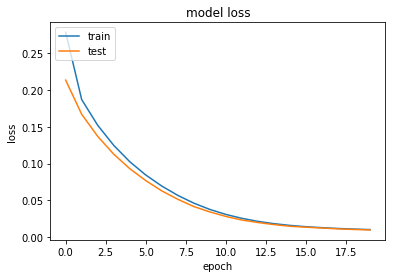

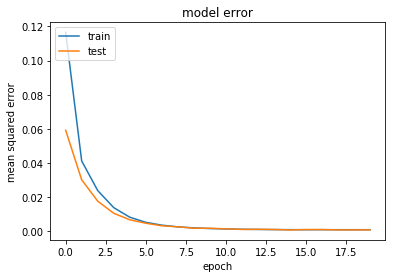

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6630 samples, validate on 390 samples
Epoch 1/20
6630/6630 [==============================] - 0s 68us/step - loss: 0.2354 - mean_squared_error: 0.0715 - val_loss: 0.1969 - val_mean_squared_error: 0.0479
Epoch 2/20
6630/6630 [==============================] - 0s 38us/step - loss: 0.1657 - mean_squared_error: 0.0309 - val_loss: 0.1413 - val_mean_squared_error: 0.0208
Epoch 3/20
6630/6630 [==============================] - 0s 36us/step - loss: 0.1196 - mean_squared_error: 0.0126 - val_loss: 0.1011 - val_mean_squared_error: 0

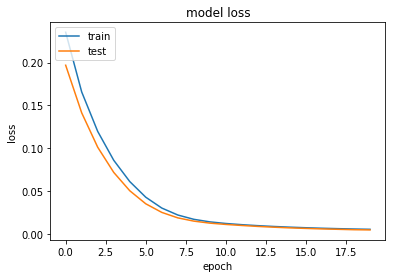

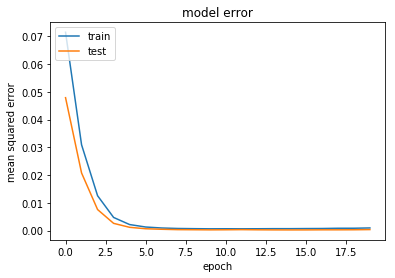

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6630 samples, validate on 390 samples
Epoch 1/20
6630/6630 [==============================] - 0s 69us/step - loss: 0.3299 - mean_squared_error: 0.1748 - val_loss: 0.2063 - val_mean_squared_error: 0.0645
Epoch 2/20
6630/6630 [==============================] - 0s 41us/step - loss: 0.1530 - mean_squared_error: 0.0265 - val_loss: 0.1248 - val_mean_squared_error: 0.0141
Epoch 3/20
6630/6630 [==============================] - 0s 37us/step - loss: 0.1060 - mean_squared_error: 0.0097 - val_loss: 0.0886 - val_mean_squared_error: 0

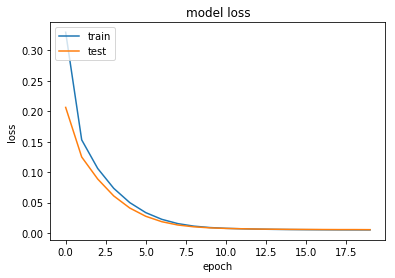

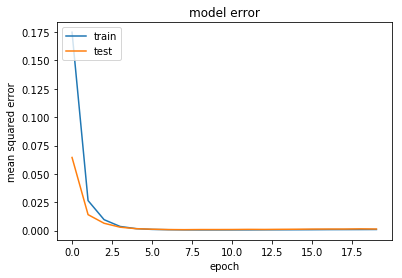

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2652 samples, validate on 156 samples
Epoch 1/20
2652/2652 [==============================] - 0s 122us/step - loss: 0.2501 - mean_squared_error: 0.0763 - val_loss: 0.2158 - val_mean_squared_error: 0.0489
Epoch 2/20
2652/2652 [==============================] - 0s 46us/step - loss: 0.2096 - mean_squared_error: 0.0485 - val_loss: 0.1923 - val_mean_squared_error: 0.0376
Epoch 3/20
2652/2652 [==============================] - 0s 40us/step - loss: 0.1812 - mean_squared_error: 0.0325 - val_loss: 0.1709 - val_mean_squared_error: 

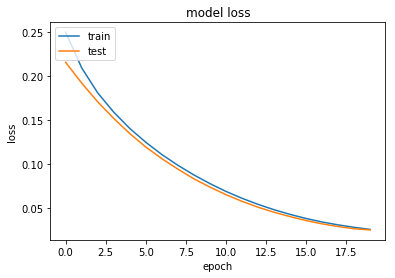

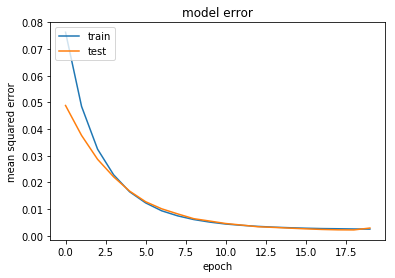

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3978 samples, validate on 234 samples
Epoch 1/20
3978/3978 [==============================] - 0s 93us/step - loss: 0.2436 - mean_squared_error: 0.0882 - val_loss: 0.1969 - val_mean_squared_error: 0.0513
Epoch 2/20
3978/3978 [==============================] - 0s 40us/step - loss: 0.1722 - mean_squared_error: 0.0359 - val_loss: 0.1621 - val_mean_squared_error: 0.0356
Epoch 3/20
3978/3978 [==============================] - 0s 37us/step - loss: 0.1368 - mean_squared_error: 0.0193 - val_loss: 0.1281 - val_mean_squared_error: 0

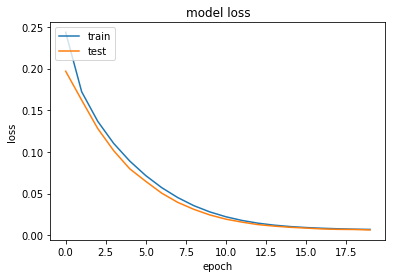

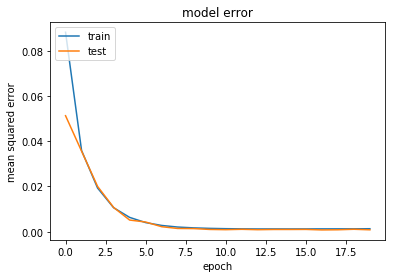

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6660 samples, validate on 360 samples
Epoch 1/20
6660/6660 [==============================] - 1s 77us/step - loss: 0.2295 - mean_squared_error: 0.0675 - val_loss: 0.1865 - val_mean_squared_error: 0.0403
Epoch 2/20
6660/6660 [==============================] - 0s 39us/step - loss: 0.1607 - mean_squared_error: 0.0289 - val_loss: 0.1351 - val_mean_squared_error: 0.0181
Epoch 3/20
6660/6660 [==============================] - 0s 35us/step - loss: 0.1164 - mean_squared_error: 0.0126 - val_loss: 0.0987 - val_mean_squared_error: 0

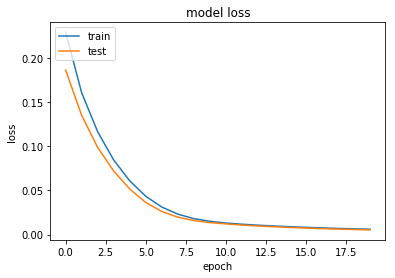

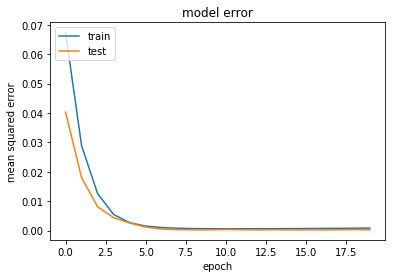

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6660 samples, validate on 360 samples
Epoch 1/20
6660/6660 [==============================] - 0s 67us/step - loss: 0.2020 - mean_squared_error: 0.0541 - val_loss: 0.1665 - val_mean_squared_error: 0.0352
Epoch 2/20
6660/6660 [==============================] - 0s 40us/step - loss: 0.1390 - mean_squared_error: 0.0227 - val_loss: 0.1157 - val_mean_squared_error: 0.0147
Epoch 3/20
6660/6660 [==============================] - 0s 36us/step - loss: 0.0971 - mean_squared_error: 0.0096 - val_loss: 0.0806 - val_mean_squared_error: 0

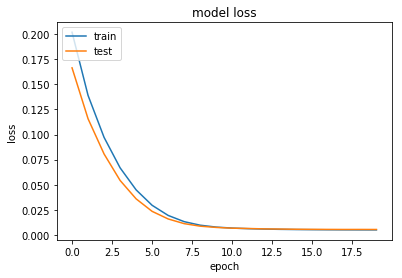

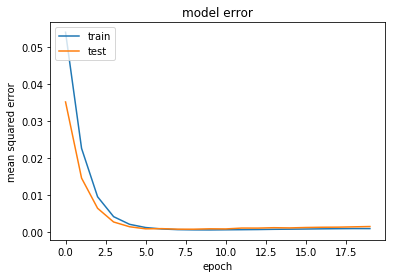

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2664 samples, validate on 144 samples
Epoch 1/20
2664/2664 [==============================] - 0s 110us/step - loss: 0.2761 - mean_squared_error: 0.1106 - val_loss: 0.2420 - val_mean_squared_error: 0.0817
Epoch 2/20
2664/2664 [==============================] - 0s 39us/step - loss: 0.2179 - mean_squared_error: 0.0624 - val_loss: 0.2011 - val_mean_squared_error: 0.0508
Epoch 3/20
2664/2664 [==============================] - 0s 39us/step - loss: 0.1827 - mean_squared_error: 0.0375 - val_loss: 0.1733 - val_mean_squared_error: 

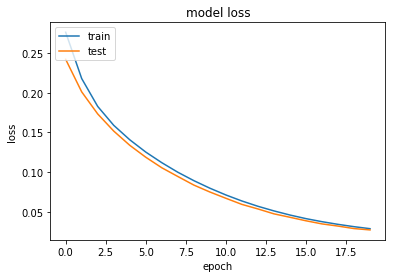

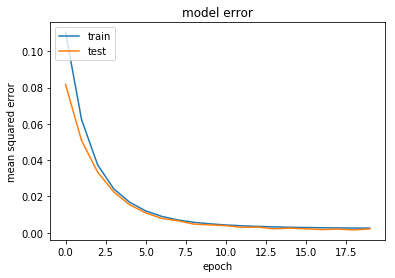

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3996 samples, validate on 216 samples
Epoch 1/20
3996/3996 [==============================] - 0s 85us/step - loss: 0.2141 - mean_squared_error: 0.0591 - val_loss: 0.1834 - val_mean_squared_error: 0.0394
Epoch 2/20
3996/3996 [==============================] - 0s 42us/step - loss: 0.1662 - mean_squared_error: 0.0321 - val_loss: 0.1466 - val_mean_squared_error: 0.0225
Epoch 3/20
3996/3996 [==============================] - 0s 36us/step - loss: 0.1321 - mean_squared_error: 0.0173 - val_loss: 0.1186 - val_mean_squared_error: 0

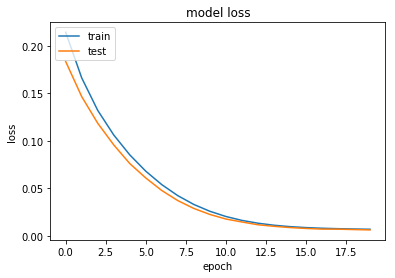

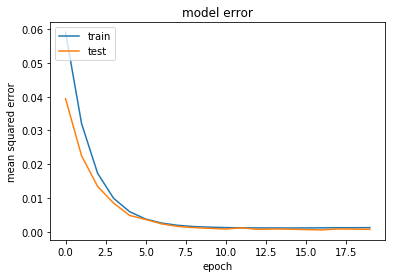

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6690 samples, validate on 330 samples
Epoch 1/20
6690/6690 [==============================] - 0s 70us/step - loss: 0.2586 - mean_squared_error: 0.1052 - val_loss: 0.2119 - val_mean_squared_error: 0.0734
Epoch 2/20
6690/6690 [==============================] - 0s 42us/step - loss: 0.1496 - mean_squared_error: 0.0260 - val_loss: 0.1351 - val_mean_squared_error: 0.0268
Epoch 3/20
6690/6690 [==============================] - 0s 38us/step - loss: 0.1054 - mean_squared_error: 0.0110 - val_loss: 0.0877 - val_mean_squared_error: 0

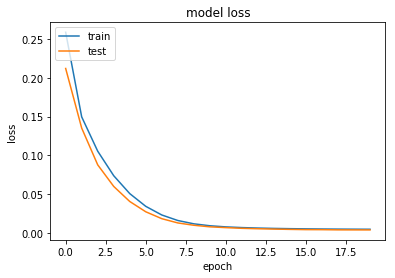

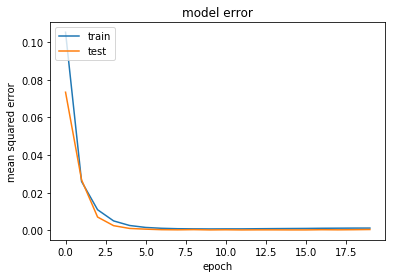

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6690 samples, validate on 330 samples
Epoch 1/20
6690/6690 [==============================] - 0s 72us/step - loss: 0.1929 - mean_squared_error: 0.0443 - val_loss: 0.1697 - val_mean_squared_error: 0.0373
Epoch 2/20
6690/6690 [==============================] - 0s 40us/step - loss: 0.1345 - mean_squared_error: 0.0171 - val_loss: 0.1191 - val_mean_squared_error: 0.0169
Epoch 3/20
6690/6690 [==============================] - 0s 35us/step - loss: 0.0954 - mean_squared_error: 0.0070 - val_loss: 0.0831 - val_mean_squared_error: 0

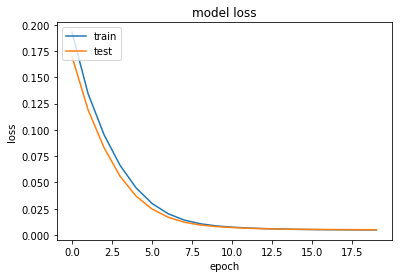

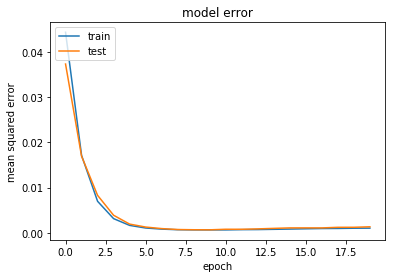

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2676 samples, validate on 132 samples
Epoch 1/20
2676/2676 [==============================] - 0s 125us/step - loss: 0.2368 - mean_squared_error: 0.0706 - val_loss: 0.2267 - val_mean_squared_error: 0.0672
Epoch 2/20
2676/2676 [==============================] - 0s 41us/step - loss: 0.1957 - mean_squared_error: 0.0423 - val_loss: 0.1953 - val_mean_squared_error: 0.0483
Epoch 3/20
2676/2676 [==============================] - 0s 39us/step - loss: 0.1682 - mean_squared_error: 0.0273 - val_loss: 0.1705 - val_mean_squared_error: 

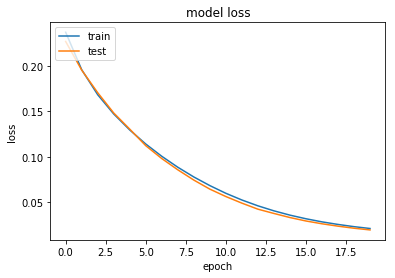

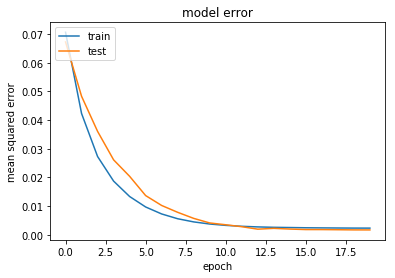

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4014 samples, validate on 198 samples
Epoch 1/20
4014/4014 [==============================] - 0s 91us/step - loss: 0.2159 - mean_squared_error: 0.0508 - val_loss: 0.1827 - val_mean_squared_error: 0.0269
Epoch 2/20
4014/4014 [==============================] - 0s 41us/step - loss: 0.1739 - mean_squared_error: 0.0270 - val_loss: 0.1533 - val_mean_squared_error: 0.0157
Epoch 3/20
4014/4014 [==============================] - 0s 36us/step - loss: 0.1425 - mean_squared_error: 0.0139 - val_loss: 0.1285 - val_mean_squared_error: 0

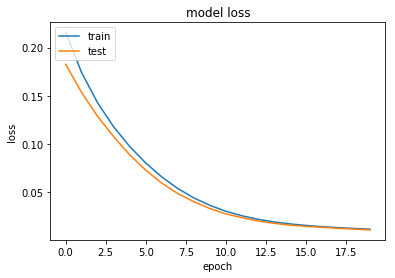

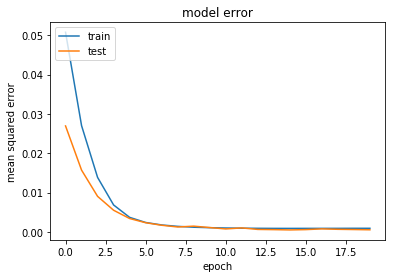

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6720 samples, validate on 300 samples
Epoch 1/20
6720/6720 [==============================] - 0s 67us/step - loss: 0.1565 - mean_squared_error: 0.0267 - val_loss: 0.1226 - val_mean_squared_error: 0.0097
Epoch 2/20
6720/6720 [==============================] - 0s 42us/step - loss: 0.1057 - mean_squared_error: 0.0085 - val_loss: 0.0857 - val_mean_squared_error: 0.0040
Epoch 3/20
6720/6720 [==============================] - 0s 37us/step - loss: 0.0718 - mean_squared_error: 0.0035 - val_loss: 0.0574 - val_mean_squared_error: 0

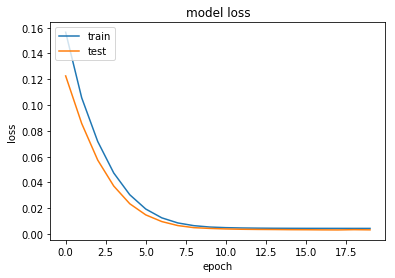

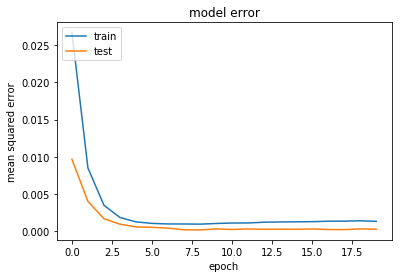

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6720 samples, validate on 300 samples
Epoch 1/20
6720/6720 [==============================] - 0s 69us/step - loss: 0.2094 - mean_squared_error: 0.0598 - val_loss: 0.1667 - val_mean_squared_error: 0.0337
Epoch 2/20
6720/6720 [==============================] - 0s 42us/step - loss: 0.1430 - mean_squared_error: 0.0250 - val_loss: 0.1172 - val_mean_squared_error: 0.0140
Epoch 3/20
6720/6720 [==============================] - 0s 36us/step - loss: 0.0992 - mean_squared_error: 0.0095 - val_loss: 0.0823 - val_mean_squared_error: 0

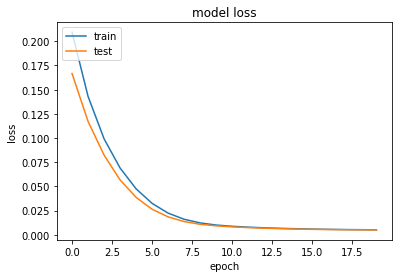

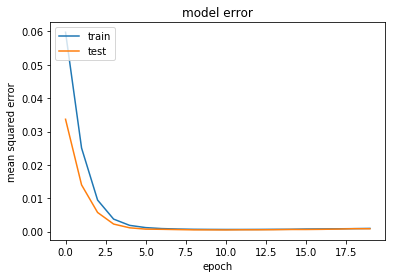

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2688 samples, validate on 120 samples
Epoch 1/20
2688/2688 [==============================] - 0s 116us/step - loss: 0.6513 - mean_squared_error: 0.4785 - val_loss: 0.4476 - val_mean_squared_error: 0.2787
Epoch 2/20
2688/2688 [==============================] - 0s 43us/step - loss: 0.3310 - mean_squared_error: 0.1663 - val_loss: 0.2351 - val_mean_squared_error: 0.0752
Epoch 3/20
2688/2688 [==============================] - 0s 35us/step - loss: 0.2307 - mean_squared_error: 0.0759 - val_loss: 0.1939 - val_mean_squared_error: 

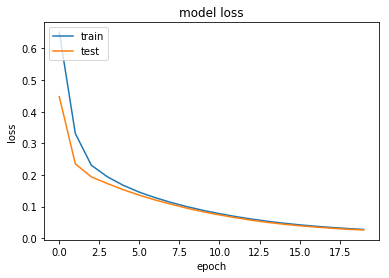

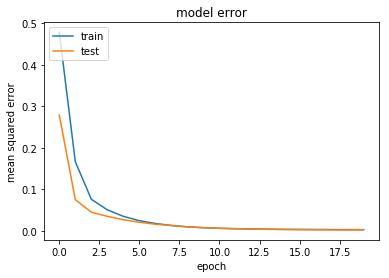

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4032 samples, validate on 180 samples
Epoch 1/20
4032/4032 [==============================] - 0s 94us/step - loss: 0.2247 - mean_squared_error: 0.0618 - val_loss: 0.1936 - val_mean_squared_error: 0.0414
Epoch 2/20
4032/4032 [==============================] - 0s 40us/step - loss: 0.1771 - mean_squared_error: 0.0349 - val_loss: 0.1577 - val_mean_squared_error: 0.0256
Epoch 3/20
4032/4032 [==============================] - 0s 42us/step - loss: 0.1435 - mean_squared_error: 0.0208 - val_loss: 0.1264 - val_mean_squared_error: 0

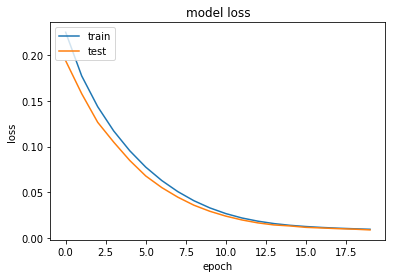

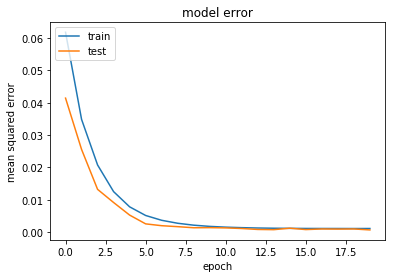

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6750 samples, validate on 270 samples
Epoch 1/20
6750/6750 [==============================] - 0s 70us/step - loss: 0.2435 - mean_squared_error: 0.0836 - val_loss: 0.2165 - val_mean_squared_error: 0.0702
Epoch 2/20
6750/6750 [==============================] - 0s 39us/step - loss: 0.1594 - mean_squared_error: 0.0267 - val_loss: 0.1496 - val_mean_squared_error: 0.0311
Epoch 3/20
6750/6750 [==============================] - 0s 37us/step - loss: 0.1153 - mean_squared_error: 0.0102 - val_loss: 0.1003 - val_mean_squared_error: 0

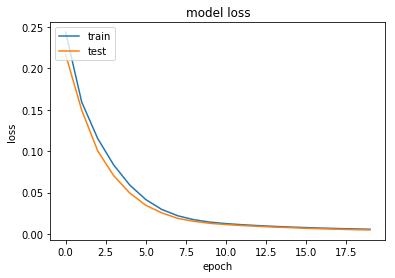

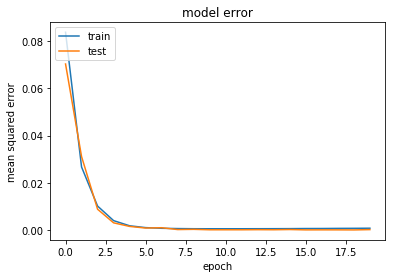

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6750 samples, validate on 270 samples
Epoch 1/20
6750/6750 [==============================] - 0s 67us/step - loss: 0.2078 - mean_squared_error: 0.0681 - val_loss: 0.1459 - val_mean_squared_error: 0.0236
Epoch 2/20
6750/6750 [==============================] - 0s 38us/step - loss: 0.1245 - mean_squared_error: 0.0183 - val_loss: 0.0994 - val_mean_squared_error: 0.0090
Epoch 3/20
6750/6750 [==============================] - 0s 37us/step - loss: 0.0834 - mean_squared_error: 0.0069 - val_loss: 0.0668 - val_mean_squared_error: 0

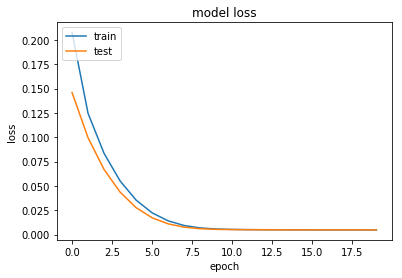

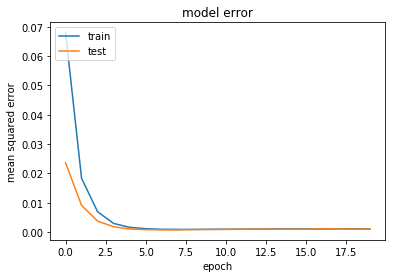

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2700 samples, validate on 108 samples
Epoch 1/20
2700/2700 [==============================] - 0s 113us/step - loss: 0.2777 - mean_squared_error: 0.1231 - val_loss: 0.2062 - val_mean_squared_error: 0.0588
Epoch 2/20
2700/2700 [==============================] - 0s 38us/step - loss: 0.2071 - mean_squared_error: 0.0662 - val_loss: 0.1805 - val_mean_squared_error: 0.0466
Epoch 3/20
2700/2700 [==============================] - 0s 36us/step - loss: 0.1716 - mean_squared_error: 0.0440 - val_loss: 0.1526 - val_mean_squared_error: 

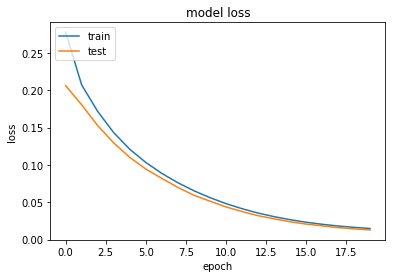

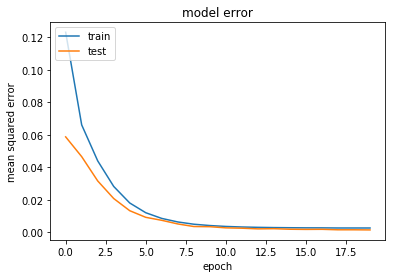

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4050 samples, validate on 162 samples
Epoch 1/20
4050/4050 [==============================] - 0s 93us/step - loss: 0.2884 - mean_squared_error: 0.1156 - val_loss: 0.2402 - val_mean_squared_error: 0.0749
Epoch 2/20
4050/4050 [==============================] - 0s 39us/step - loss: 0.2169 - mean_squared_error: 0.0589 - val_loss: 0.1977 - val_mean_squared_error: 0.0474
Epoch 3/20
4050/4050 [==============================] - 0s 35us/step - loss: 0.1775 - mean_squared_error: 0.0346 - val_loss: 0.1650 - val_mean_squared_error: 0

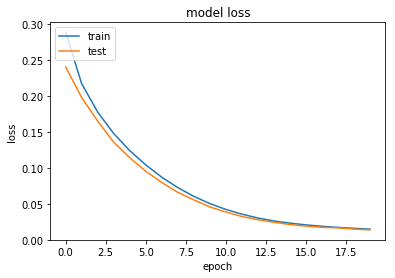

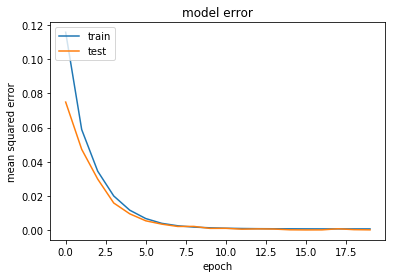

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6780 samples, validate on 240 samples
Epoch 1/20
6780/6780 [==============================] - 0s 66us/step - loss: 0.1792 - mean_squared_error: 0.0331 - val_loss: 0.1578 - val_mean_squared_error: 0.0292
Epoch 2/20
6780/6780 [==============================] - 0s 38us/step - loss: 0.1242 - mean_squared_error: 0.0118 - val_loss: 0.1098 - val_mean_squared_error: 0.0135
Epoch 3/20
6780/6780 [==============================] - 0s 37us/step - loss: 0.0866 - mean_squared_error: 0.0047 - val_loss: 0.0746 - val_mean_squared_error: 0

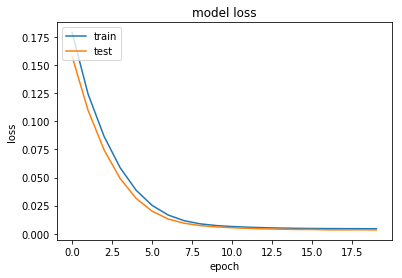

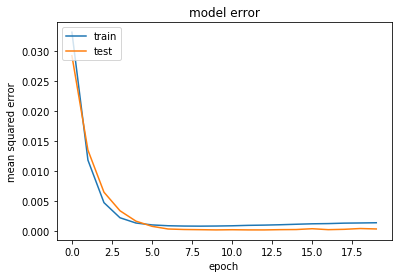

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6780 samples, validate on 240 samples
Epoch 1/20
6780/6780 [==============================] - 0s 66us/step - loss: 0.2537 - mean_squared_error: 0.0859 - val_loss: 0.1795 - val_mean_squared_error: 0.0255
Epoch 2/20
6780/6780 [==============================] - 0s 41us/step - loss: 0.1604 - mean_squared_error: 0.0213 - val_loss: 0.1327 - val_mean_squared_error: 0.0088
Epoch 3/20
6780/6780 [==============================] - 0s 36us/step - loss: 0.1184 - mean_squared_error: 0.0087 - val_loss: 0.0992 - val_mean_squared_error: 0

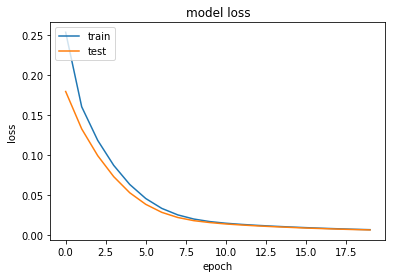

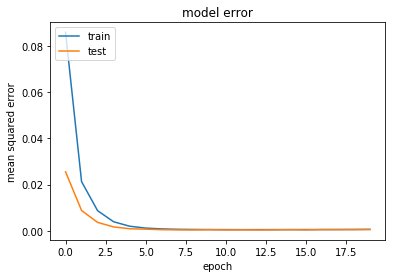

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2712 samples, validate on 96 samples
Epoch 1/20
2712/2712 [==============================] - 0s 124us/step - loss: 0.2490 - mean_squared_error: 0.0818 - val_loss: 0.1885 - val_mean_squared_error: 0.0273
Epoch 2/20
2712/2712 [==============================] - 0s 43us/step - loss: 0.2078 - mean_squared_error: 0.0521 - val_loss: 0.1678 - val_mean_squared_error: 0.0179
Epoch 3/20
2712/2712 [==============================] - 0s 42us/step - loss: 0.1807 - mean_squared_error: 0.0361 - val_loss: 0.1525 - val_mean_squared_error: 0

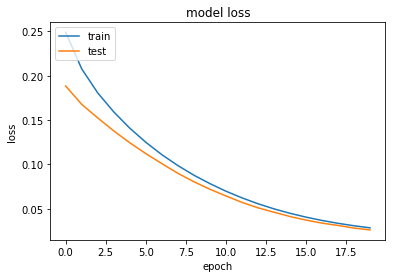

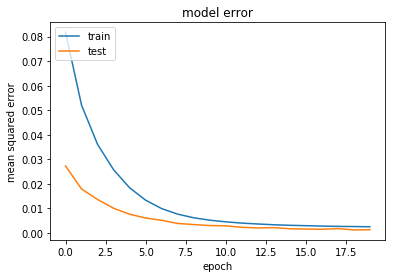

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4068 samples, validate on 144 samples
Epoch 1/20
4068/4068 [==============================] - 0s 88us/step - loss: 0.2340 - mean_squared_error: 0.0727 - val_loss: 0.1818 - val_mean_squared_error: 0.0292
Epoch 2/20
4068/4068 [==============================] - 0s 43us/step - loss: 0.1782 - mean_squared_error: 0.0342 - val_loss: 0.1546 - val_mean_squared_error: 0.0197
Epoch 3/20
4068/4068 [==============================] - 0s 38us/step - loss: 0.1462 - mean_squared_error: 0.0199 - val_loss: 0.1309 - val_mean_squared_error: 0

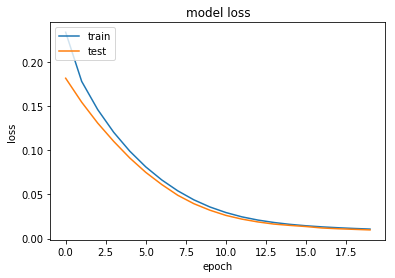

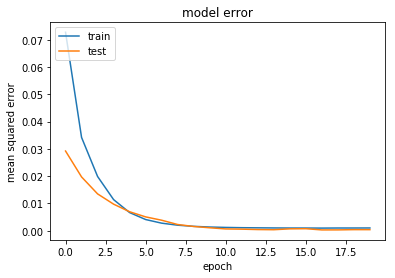

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6810 samples, validate on 210 samples
Epoch 1/20
6810/6810 [==============================] - 0s 70us/step - loss: 0.1828 - mean_squared_error: 0.0418 - val_loss: 0.1628 - val_mean_squared_error: 0.0395
Epoch 2/20
6810/6810 [==============================] - 0s 40us/step - loss: 0.1269 - mean_squared_error: 0.0193 - val_loss: 0.1072 - val_mean_squared_error: 0.0149
Epoch 3/20
6810/6810 [==============================] - 0s 35us/step - loss: 0.0878 - mean_squared_error: 0.0088 - val_loss: 0.0725 - val_mean_squared_error: 0

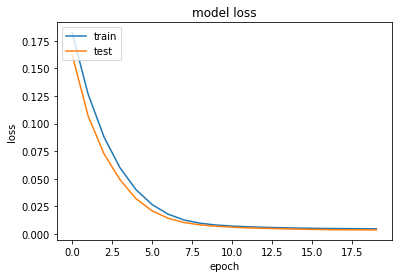

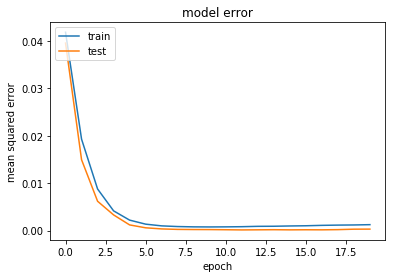

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6810 samples, validate on 210 samples
Epoch 1/20
6810/6810 [==============================] - 0s 67us/step - loss: 0.2437 - mean_squared_error: 0.0823 - val_loss: 0.1992 - val_mean_squared_error: 0.0525
Epoch 2/20
6810/6810 [==============================] - 0s 37us/step - loss: 0.1595 - mean_squared_error: 0.0269 - val_loss: 0.1423 - val_mean_squared_error: 0.0241
Epoch 3/20
6810/6810 [==============================] - 0s 38us/step - loss: 0.1148 - mean_squared_error: 0.0100 - val_loss: 0.0992 - val_mean_squared_error: 0

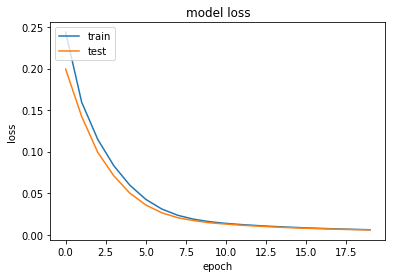

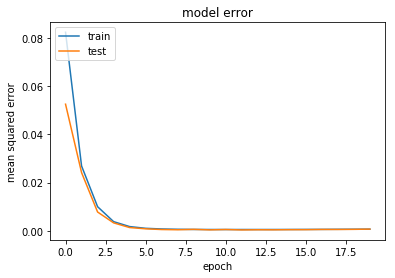

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2724 samples, validate on 84 samples
Epoch 1/20
2724/2724 [==============================] - 0s 115us/step - loss: 0.5409 - mean_squared_error: 0.3666 - val_loss: 0.3316 - val_mean_squared_error: 0.1608
Epoch 2/20
2724/2724 [==============================] - 0s 43us/step - loss: 0.2850 - mean_squared_error: 0.1184 - val_loss: 0.2366 - val_mean_squared_error: 0.0750
Epoch 3/20
2724/2724 [==============================] - 0s 39us/step - loss: 0.2275 - mean_squared_error: 0.0708 - val_loss: 0.2080 - val_mean_squared_error: 0

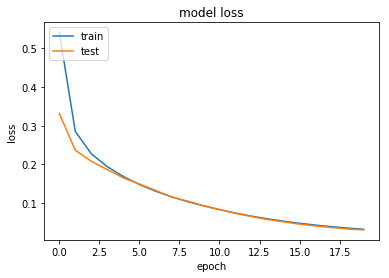

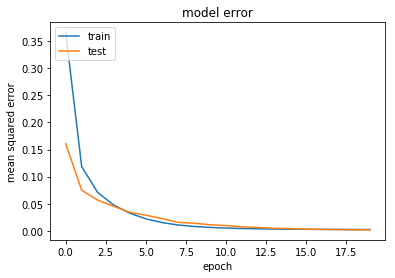

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4086 samples, validate on 126 samples
Epoch 1/20
4086/4086 [==============================] - 0s 92us/step - loss: 0.3041 - mean_squared_error: 0.1400 - val_loss: 0.2022 - val_mean_squared_error: 0.0465
Epoch 2/20
4086/4086 [==============================] - 0s 44us/step - loss: 0.1927 - mean_squared_error: 0.0456 - val_loss: 0.1709 - val_mean_squared_error: 0.0330
Epoch 3/20
4086/4086 [==============================] - 0s 41us/step - loss: 0.1519 - mean_squared_error: 0.0230 - val_loss: 0.1423 - val_mean_squared_error: 0

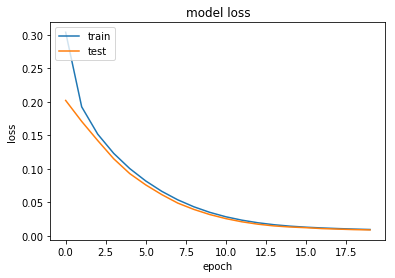

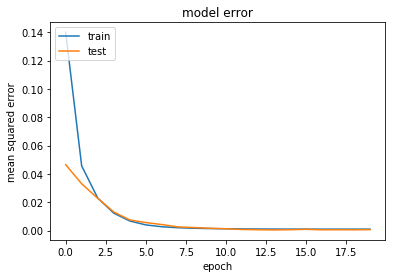

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6840 samples, validate on 180 samples
Epoch 1/20
6840/6840 [==============================] - 0s 70us/step - loss: 0.2068 - mean_squared_error: 0.0576 - val_loss: 0.1661 - val_mean_squared_error: 0.0336
Epoch 2/20
6840/6840 [==============================] - 0s 38us/step - loss: 0.1355 - mean_squared_error: 0.0187 - val_loss: 0.1171 - val_mean_squared_error: 0.0160
Epoch 3/20
6840/6840 [==============================] - 0s 37us/step - loss: 0.0948 - mean_squared_error: 0.0075 - val_loss: 0.0804 - val_mean_squared_error: 0

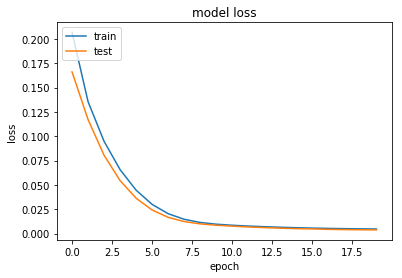

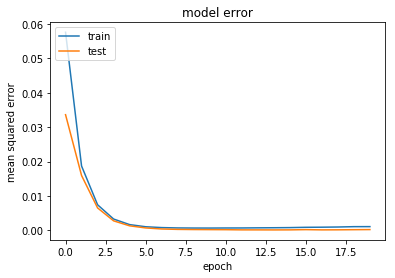

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6840 samples, validate on 180 samples
Epoch 1/20
6840/6840 [==============================] - 0s 66us/step - loss: 0.2278 - mean_squared_error: 0.0723 - val_loss: 0.1804 - val_mean_squared_error: 0.0385
Epoch 2/20
6840/6840 [==============================] - 0s 39us/step - loss: 0.1515 - mean_squared_error: 0.0234 - val_loss: 0.1265 - val_mean_squared_error: 0.0128
Epoch 3/20
6840/6840 [==============================] - 0s 35us/step - loss: 0.1079 - mean_squared_error: 0.0081 - val_loss: 0.0908 - val_mean_squared_error: 0

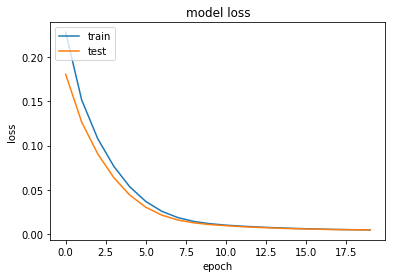

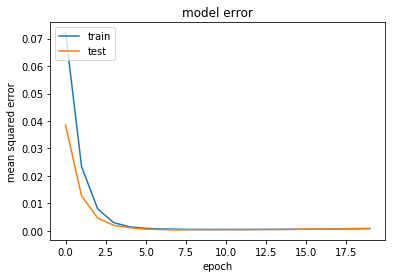

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2736 samples, validate on 72 samples
Epoch 1/20
2736/2736 [==============================] - 0s 122us/step - loss: 0.2912 - mean_squared_error: 0.1303 - val_loss: 0.1854 - val_mean_squared_error: 0.0304
Epoch 2/20
2736/2736 [==============================] - 0s 43us/step - loss: 0.1990 - mean_squared_error: 0.0502 - val_loss: 0.1738 - val_mean_squared_error: 0.0317
Epoch 3/20
2736/2736 [==============================] - 0s 38us/step - loss: 0.1709 - mean_squared_error: 0.0353 - val_loss: 0.1515 - val_mean_squared_error: 0

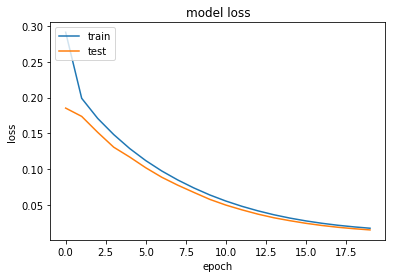

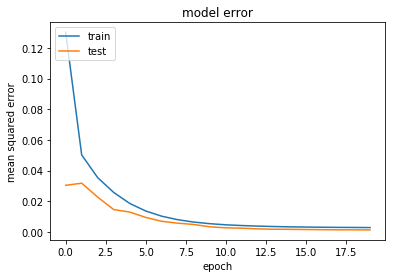

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4104 samples, validate on 108 samples
Epoch 1/20
4104/4104 [==============================] - 0s 87us/step - loss: 0.2917 - mean_squared_error: 0.1188 - val_loss: 0.2279 - val_mean_squared_error: 0.0633
Epoch 2/20
4104/4104 [==============================] - 0s 38us/step - loss: 0.2083 - mean_squared_error: 0.0519 - val_loss: 0.1772 - val_mean_squared_error: 0.0298
Epoch 3/20
4104/4104 [==============================] - 0s 35us/step - loss: 0.1655 - mean_squared_error: 0.0267 - val_loss: 0.1412 - val_mean_squared_error: 0

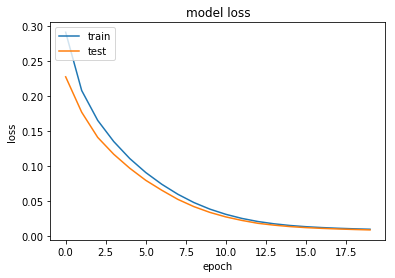

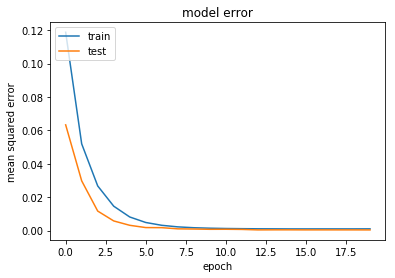

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6870 samples, validate on 150 samples
Epoch 1/20
6870/6870 [==============================] - 0s 66us/step - loss: 0.1888 - mean_squared_error: 0.0410 - val_loss: 0.1737 - val_mean_squared_error: 0.0451
Epoch 2/20
6870/6870 [==============================] - 0s 38us/step - loss: 0.1269 - mean_squared_error: 0.0151 - val_loss: 0.1180 - val_mean_squared_error: 0.0226
Epoch 3/20
6870/6870 [==============================] - 0s 36us/step - loss: 0.0879 - mean_squared_error: 0.0066 - val_loss: 0.0791 - val_mean_squared_error: 0

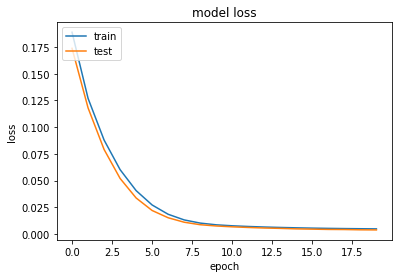

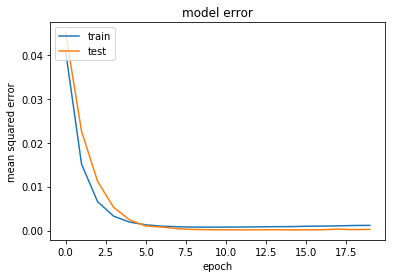

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6870 samples, validate on 150 samples
Epoch 1/20
6870/6870 [==============================] - 0s 68us/step - loss: 0.2062 - mean_squared_error: 0.0552 - val_loss: 0.1856 - val_mean_squared_error: 0.0503
Epoch 2/20
6870/6870 [==============================] - 0s 42us/step - loss: 0.1375 - mean_squared_error: 0.0174 - val_loss: 0.1193 - val_mean_squared_error: 0.0147
Epoch 3/20
6870/6870 [==============================] - 0s 36us/step - loss: 0.0961 - mean_squared_error: 0.0059 - val_loss: 0.0804 - val_mean_squared_error: 0

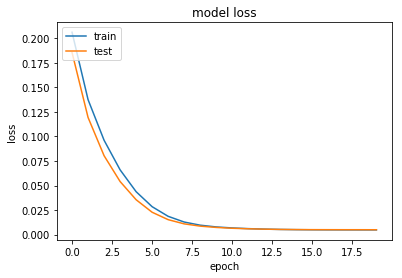

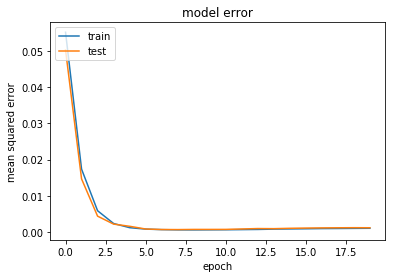

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2748 samples, validate on 60 samples
Epoch 1/20
2748/2748 [==============================] - 0s 124us/step - loss: 0.2721 - mean_squared_error: 0.1036 - val_loss: 0.1994 - val_mean_squared_error: 0.0362
Epoch 2/20
2748/2748 [==============================] - 0s 44us/step - loss: 0.2055 - mean_squared_error: 0.0475 - val_loss: 0.1780 - val_mean_squared_error: 0.0257
Epoch 3/20
2748/2748 [==============================] - 0s 47us/step - loss: 0.1747 - mean_squared_error: 0.0280 - val_loss: 0.1622 - val_mean_squared_error: 0

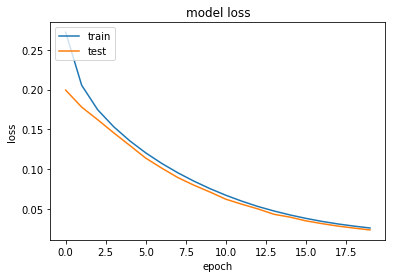

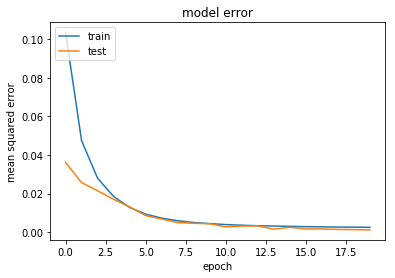

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4122 samples, validate on 90 samples
Epoch 1/20
4122/4122 [==============================] - 0s 84us/step - loss: 0.1993 - mean_squared_error: 0.0394 - val_loss: 0.1831 - val_mean_squared_error: 0.0346
Epoch 2/20
4122/4122 [==============================] - 0s 40us/step - loss: 0.1591 - mean_squared_error: 0.0208 - val_loss: 0.1472 - val_mean_squared_error: 0.0198
Epoch 3/20
4122/4122 [==============================] - 0s 34us/step - loss: 0.1290 - mean_squared_error: 0.0115 - val_loss: 0.1173 - val_mean_squared_error: 0.

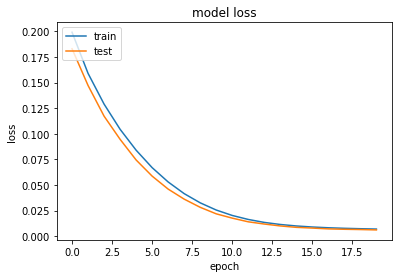

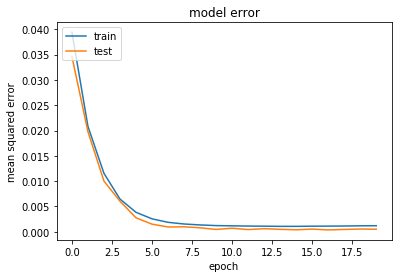

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6900 samples, validate on 120 samples
Epoch 1/20
6900/6900 [==============================] - 1s 73us/step - loss: 0.2516 - mean_squared_error: 0.0886 - val_loss: 0.2132 - val_mean_squared_error: 0.0660
Epoch 2/20
6900/6900 [==============================] - 0s 40us/step - loss: 0.1616 - mean_squared_error: 0.0299 - val_loss: 0.1429 - val_mean_squared_error: 0.0266
Epoch 3/20
6900/6900 [==============================] - 0s 38us/step - loss: 0.1151 - mean_squared_error: 0.0128 - val_loss: 0.0999 - val_mean_squared_error: 0

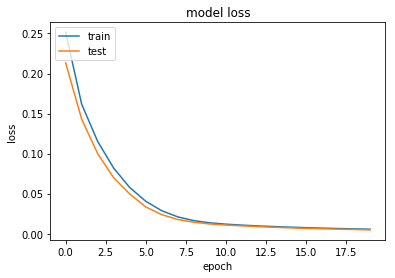

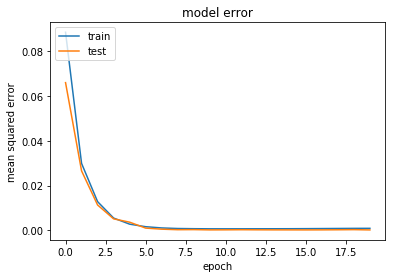

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6900 samples, validate on 120 samples
Epoch 1/20
6900/6900 [==============================] - 0s 69us/step - loss: 0.2499 - mean_squared_error: 0.0820 - val_loss: 0.2944 - val_mean_squared_error: 0.1402
Epoch 2/20
6900/6900 [==============================] - 0s 40us/step - loss: 0.1743 - mean_squared_error: 0.0331 - val_loss: 0.1825 - val_mean_squared_error: 0.0547
Epoch 3/20
6900/6900 [==============================] - 0s 38us/step - loss: 0.1286 - mean_squared_error: 0.0138 - val_loss: 0.1154 - val_mean_squared_error: 0

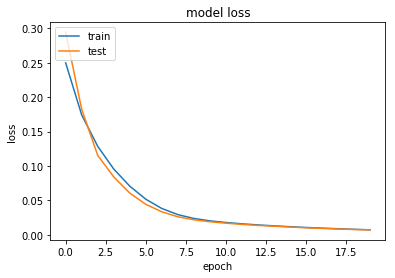

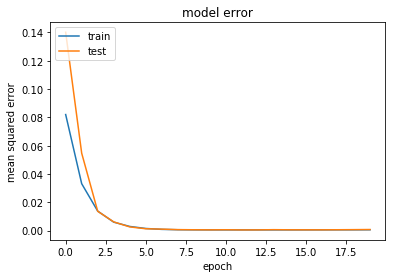

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2760 samples, validate on 48 samples
Epoch 1/20
2760/2760 [==============================] - 0s 113us/step - loss: 0.2222 - mean_squared_error: 0.0598 - val_loss: 0.1884 - val_mean_squared_error: 0.0344
Epoch 2/20
2760/2760 [==============================] - 0s 41us/step - loss: 0.1886 - mean_squared_error: 0.0415 - val_loss: 0.1656 - val_mean_squared_error: 0.0260
Epoch 3/20
2760/2760 [==============================] - 0s 40us/step - loss: 0.1633 - mean_squared_error: 0.0303 - val_loss: 0.1432 - val_mean_squared_error: 0

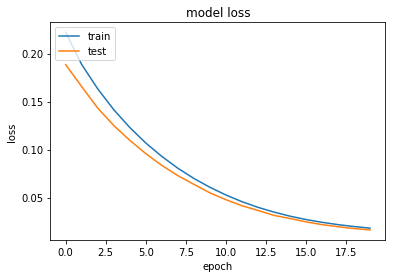

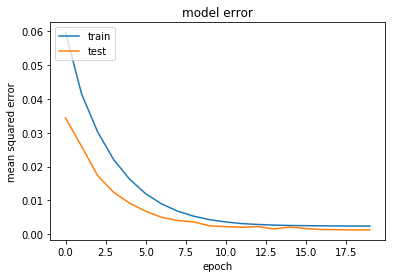

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4140 samples, validate on 72 samples
Epoch 1/20
4140/4140 [==============================] - 0s 84us/step - loss: 0.2229 - mean_squared_error: 0.0683 - val_loss: 0.1711 - val_mean_squared_error: 0.0261
Epoch 2/20
4140/4140 [==============================] - 0s 38us/step - loss: 0.1689 - mean_squared_error: 0.0333 - val_loss: 0.1413 - val_mean_squared_error: 0.0153
Epoch 3/20
4140/4140 [==============================] - 0s 37us/step - loss: 0.1365 - mean_squared_error: 0.0195 - val_loss: 0.1171 - val_mean_squared_error: 0.

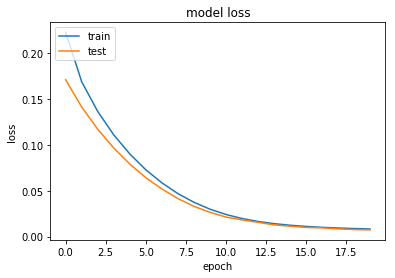

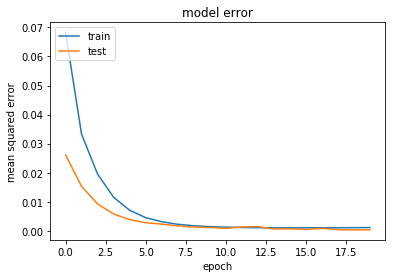

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6930 samples, validate on 90 samples
Epoch 1/20
6930/6930 [==============================] - 0s 67us/step - loss: 0.3310 - mean_squared_error: 0.1553 - val_loss: 0.1857 - val_mean_squared_error: 0.0229
Epoch 2/20
6930/6930 [==============================] - 0s 39us/step - loss: 0.1830 - mean_squared_error: 0.0347 - val_loss: 0.1425 - val_mean_squared_error: 0.0095
Epoch 3/20
6930/6930 [==============================] - 0s 36us/step - loss: 0.1310 - mean_squared_error: 0.0128 - val_loss: 0.1057 - val_mean_squared_error: 0.

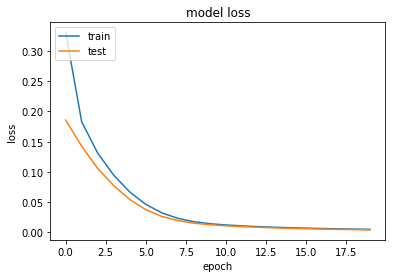

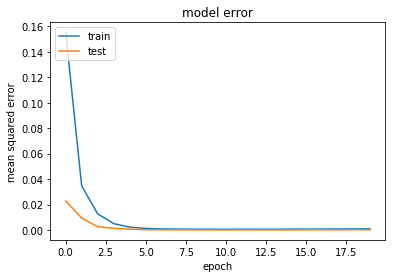

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6930 samples, validate on 90 samples
Epoch 1/20
6930/6930 [==============================] - 0s 69us/step - loss: 0.2681 - mean_squared_error: 0.1069 - val_loss: 0.1895 - val_mean_squared_error: 0.0417
Epoch 2/20
6930/6930 [==============================] - 0s 39us/step - loss: 0.1686 - mean_squared_error: 0.0340 - val_loss: 0.1370 - val_mean_squared_error: 0.0160
Epoch 3/20
6930/6930 [==============================] - 0s 36us/step - loss: 0.1209 - mean_squared_error: 0.0129 - val_loss: 0.1000 - val_mean_squared_error: 0.

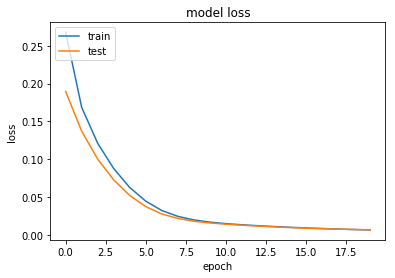

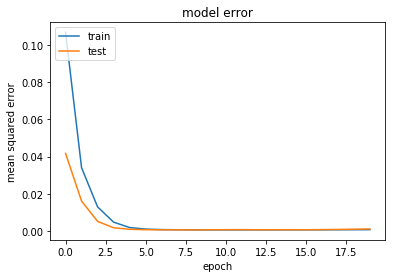

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2772 samples, validate on 36 samples
Epoch 1/20
2772/2772 [==============================] - 0s 115us/step - loss: 0.3433 - mean_squared_error: 0.1827 - val_loss: 0.2525 - val_mean_squared_error: 0.0982
Epoch 2/20
2772/2772 [==============================] - 0s 42us/step - loss: 0.2652 - mean_squared_error: 0.1164 - val_loss: 0.2084 - val_mean_squared_error: 0.0656
Epoch 3/20
2772/2772 [==============================] - 0s 38us/step - loss: 0.2139 - mean_squared_error: 0.0765 - val_loss: 0.1713 - val_mean_squared_error: 0

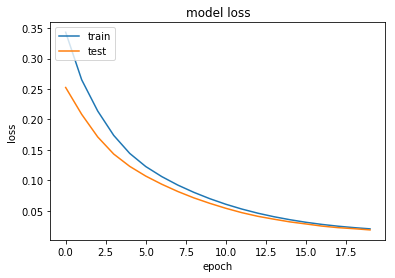

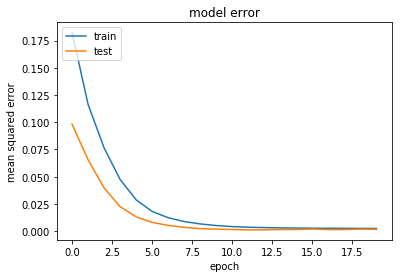

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4158 samples, validate on 54 samples
Epoch 1/20
4158/4158 [==============================] - 0s 88us/step - loss: 0.2034 - mean_squared_error: 0.0490 - val_loss: 0.1562 - val_mean_squared_error: 0.0130
Epoch 2/20
4158/4158 [==============================] - 0s 38us/step - loss: 0.1555 - mean_squared_error: 0.0229 - val_loss: 0.1301 - val_mean_squared_error: 0.0083
Epoch 3/20
4158/4158 [==============================] - 0s 36us/step - loss: 0.1255 - mean_squared_error: 0.0136 - val_loss: 0.1075 - val_mean_squared_error: 0.

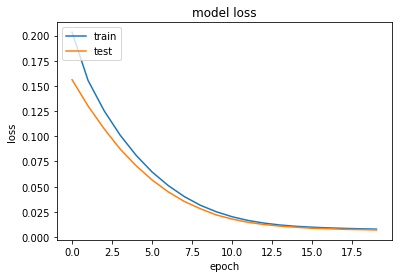

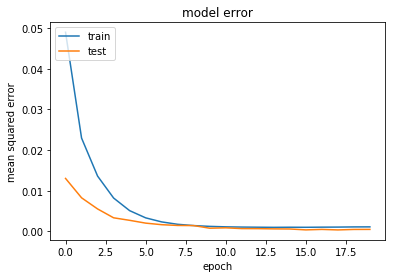

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6960 samples, validate on 60 samples
Epoch 1/20
6960/6960 [==============================] - 0s 68us/step - loss: 0.1870 - mean_squared_error: 0.0360 - val_loss: 0.1744 - val_mean_squared_error: 0.0417
Epoch 2/20
6960/6960 [==============================] - 0s 39us/step - loss: 0.1303 - mean_squared_error: 0.0142 - val_loss: 0.1213 - val_mean_squared_error: 0.0216
Epoch 3/20
6960/6960 [==============================] - 0s 34us/step - loss: 0.0912 - mean_squared_error: 0.0059 - val_loss: 0.0784 - val_mean_squared_error: 0.

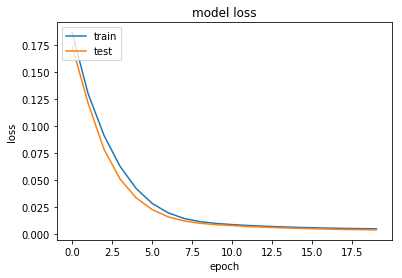

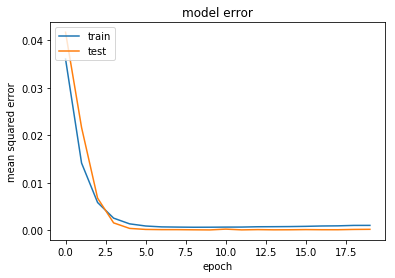

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6960 samples, validate on 60 samples
Epoch 1/20
6960/6960 [==============================] - 0s 68us/step - loss: 0.1765 - mean_squared_error: 0.0364 - val_loss: 0.1385 - val_mean_squared_error: 0.0178
Epoch 2/20
6960/6960 [==============================] - 0s 39us/step - loss: 0.1140 - mean_squared_error: 0.0109 - val_loss: 0.0944 - val_mean_squared_error: 0.0083
Epoch 3/20
6960/6960 [==============================] - 0s 35us/step - loss: 0.0763 - mean_squared_error: 0.0047 - val_loss: 0.0623 - val_mean_squared_error: 0.

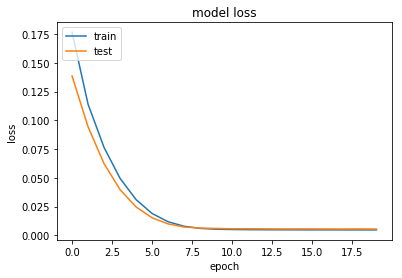

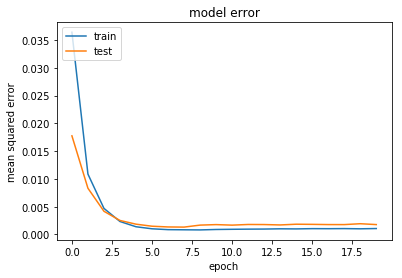

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2784 samples, validate on 24 samples
Epoch 1/20
2784/2784 [==============================] - 0s 118us/step - loss: 0.3279 - mean_squared_error: 0.1605 - val_loss: 0.3567 - val_mean_squared_error: 0.1953
Epoch 2/20
2784/2784 [==============================] - 0s 43us/step - loss: 0.2247 - mean_squared_error: 0.0690 - val_loss: 0.2441 - val_mean_squared_error: 0.0947
Epoch 3/20
2784/2784 [==============================] - 0s 37us/step - loss: 0.1927 - mean_squared_error: 0.0492 - val_loss: 0.2061 - val_mean_squared_error: 0

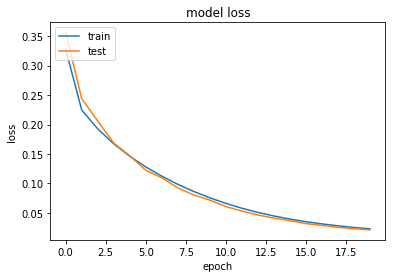

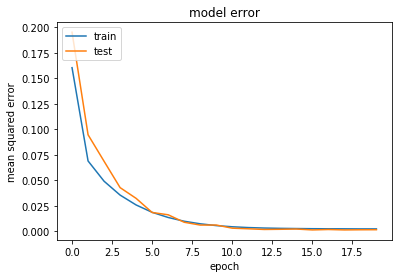

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4176 samples, validate on 36 samples
Epoch 1/20
4176/4176 [==============================] - 0s 101us/step - loss: 0.3494 - mean_squared_error: 0.1854 - val_loss: 0.2429 - val_mean_squared_error: 0.0880
Epoch 2/20
4176/4176 [==============================] - 0s 38us/step - loss: 0.2109 - mean_squared_error: 0.0651 - val_loss: 0.1923 - val_mean_squared_error: 0.0563
Epoch 3/20
4176/4176 [==============================] - 0s 40us/step - loss: 0.1592 - mean_squared_error: 0.0325 - val_loss: 0.1510 - val_mean_squared_error: 0

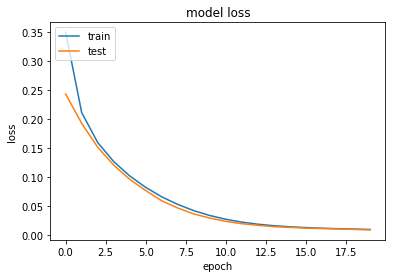

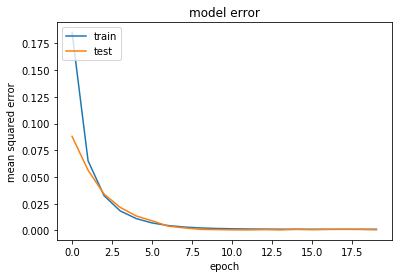

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6990 samples, validate on 30 samples
Epoch 1/20
6990/6990 [==============================] - 0s 68us/step - loss: 0.1936 - mean_squared_error: 0.0445 - val_loss: 0.1395 - val_mean_squared_error: 0.0083
Epoch 2/20
6990/6990 [==============================] - 0s 40us/step - loss: 0.1324 - mean_squared_error: 0.0175 - val_loss: 0.1027 - val_mean_squared_error: 0.0042
Epoch 3/20
6990/6990 [==============================] - 0s 37us/step - loss: 0.0912 - mean_squared_error: 0.0072 - val_loss: 0.0718 - val_mean_squared_error: 0.

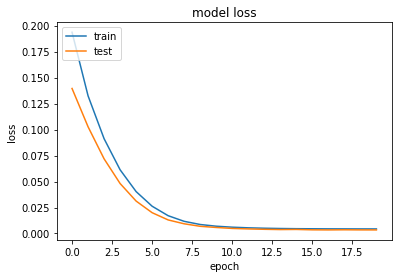

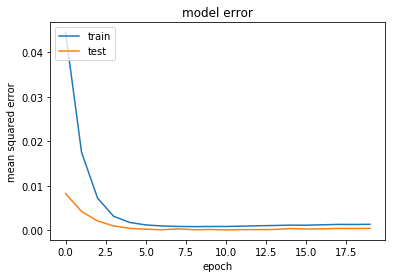

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6990 samples, validate on 30 samples
Epoch 1/20
6990/6990 [==============================] - 0s 68us/step - loss: 0.2056 - mean_squared_error: 0.0500 - val_loss: 0.1669 - val_mean_squared_error: 0.0276
Epoch 2/20
6990/6990 [==============================] - 0s 37us/step - loss: 0.1465 - mean_squared_error: 0.0223 - val_loss: 0.1168 - val_mean_squared_error: 0.0078
Epoch 3/20
6990/6990 [==============================] - 0s 36us/step - loss: 0.1048 - mean_squared_error: 0.0096 - val_loss: 0.0853 - val_mean_squared_error: 0.

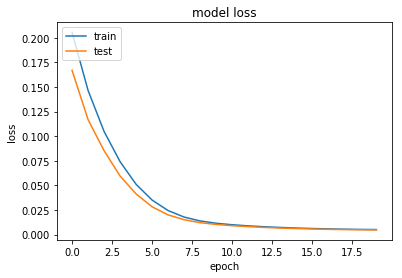

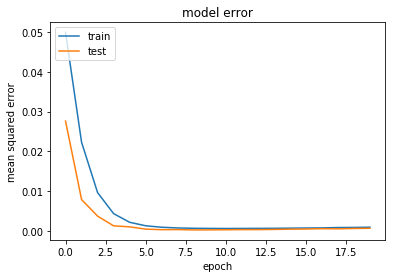

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2796 samples, validate on 12 samples
Epoch 1/20
2796/2796 [==============================] - 0s 117us/step - loss: 0.2596 - mean_squared_error: 0.0970 - val_loss: 0.2611 - val_mean_squared_error: 0.1060
Epoch 2/20
2796/2796 [==============================] - 0s 39us/step - loss: 0.2036 - mean_squared_error: 0.0551 - val_loss: 0.2114 - val_mean_squared_error: 0.0699
Epoch 3/20
2796/2796 [==============================] - 0s 39us/step - loss: 0.1678 - mean_squared_error: 0.0328 - val_loss: 0.1680 - val_mean_squared_error: 0

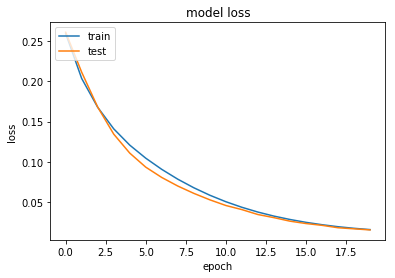

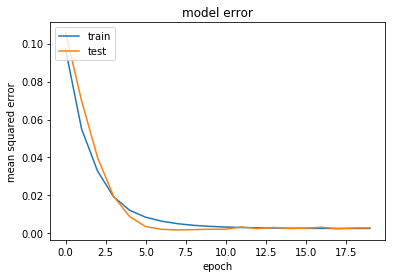

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4194 samples, validate on 18 samples
Epoch 1/20
4194/4194 [==============================] - 0s 86us/step - loss: 0.2267 - mean_squared_error: 0.0520 - val_loss: 0.1744 - val_mean_squared_error: 0.0105
Epoch 2/20
4194/4194 [==============================] - 0s 45us/step - loss: 0.1828 - mean_squared_error: 0.0290 - val_loss: 0.1503 - val_mean_squared_error: 0.0068
Epoch 3/20
4194/4194 [==============================] - 0s 41us/step - loss: 0.1502 - mean_squared_error: 0.0165 - val_loss: 0.1274 - val_mean_squared_error: 0.

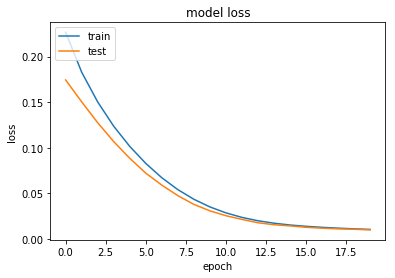

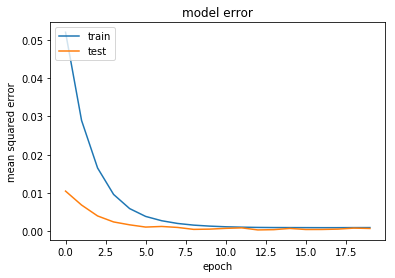

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5460 samples, validate on 1560 samples
Epoch 1/20
5460/5460 [==============================] - 0s 82us/step - loss: 0.2154 - mean_squared_error: 0.0604 - val_loss: 0.1970 - val_mean_squared_error: 0.0561
Epoch 2/20
5460/5460 [==============================] - 0s 41us/step - loss: 0.1590 - mean_squared_error: 0.0310 - val_loss: 0.1440 - val_mean_squared_error: 0.0293
Epoch 3/20
5460/5460 [==============================] - 0s 40us/step - loss: 0.1191 - mean_squared_error: 0.0164 - val_loss: 0.1120 - val_mean_squared_error: 

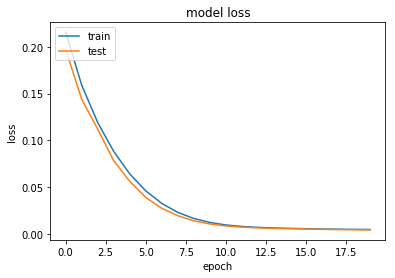

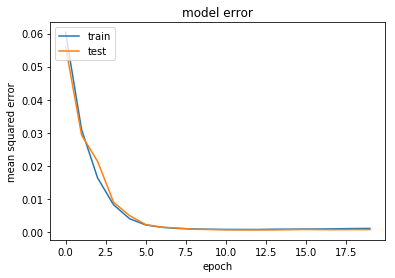

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5460 samples, validate on 1560 samples
Epoch 1/20
5460/5460 [==============================] - 0s 79us/step - loss: 0.1671 - mean_squared_error: 0.0240 - val_loss: 0.1610 - val_mean_squared_error: 0.0336
Epoch 2/20
5460/5460 [==============================] - 0s 42us/step - loss: 0.1253 - mean_squared_error: 0.0117 - val_loss: 0.1172 - val_mean_squared_error: 0.0174
Epoch 3/20
5460/5460 [==============================] - 0s 40us/step - loss: 0.0936 - mean_squared_error: 0.0058 - val_loss: 0.0854 - val_mean_squared_error: 

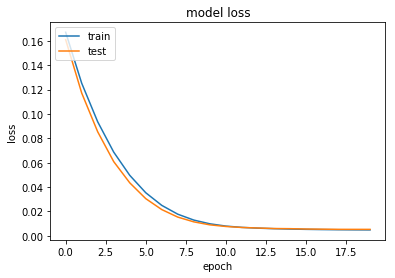

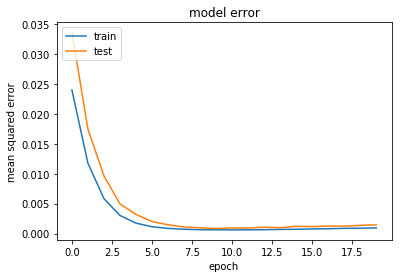

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2184 samples, validate on 624 samples
Epoch 1/20
2184/2184 [==============================] - 0s 142us/step - loss: 0.2604 - mean_squared_error: 0.1016 - val_loss: 0.1985 - val_mean_squared_error: 0.0453
Epoch 2/20
2184/2184 [==============================] - 0s 47us/step - loss: 0.1899 - mean_squared_error: 0.0419 - val_loss: 0.1687 - val_mean_squared_error: 0.0267
Epoch 3/20
2184/2184 [==============================] - 0s 44us/step - loss: 0.1640 - mean_squared_error: 0.0275 - val_loss: 0.1518 - val_mean_squared_error: 

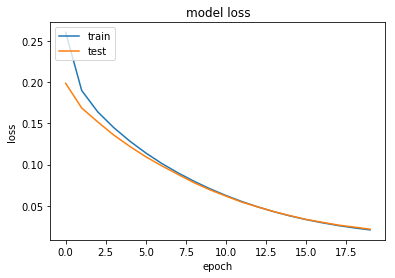

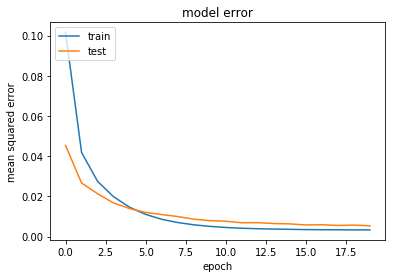

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3276 samples, validate on 936 samples
Epoch 1/20
3276/3276 [==============================] - 0s 105us/step - loss: 0.1864 - mean_squared_error: 0.0331 - val_loss: 0.2001 - val_mean_squared_error: 0.0565
Epoch 2/20
3276/3276 [==============================] - 0s 41us/step - loss: 0.1544 - mean_squared_error: 0.0193 - val_loss: 0.1697 - val_mean_squared_error: 0.0437
Epoch 3/20
3276/3276 [==============================] - 0s 38us/step - loss: 0.1300 - mean_squared_error: 0.0122 - val_loss: 0.1411 - val_mean_squared_error: 

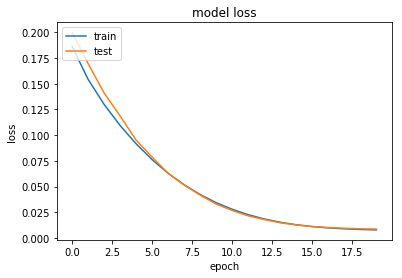

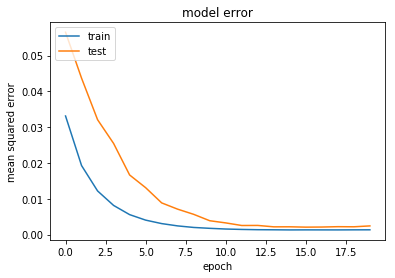

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5490 samples, validate on 1530 samples
Epoch 1/20
5490/5490 [==============================] - 0s 86us/step - loss: 0.2328 - mean_squared_error: 0.0627 - val_loss: 0.2042 - val_mean_squared_error: 0.0459
Epoch 2/20
5490/5490 [==============================] - 0s 43us/step - loss: 0.1708 - mean_squared_error: 0.0246 - val_loss: 0.1596 - val_mean_squared_error: 0.0259
Epoch 3/20
5490/5490 [==============================] - 0s 38us/step - loss: 0.1332 - mean_squared_error: 0.0116 - val_loss: 0.1239 - val_mean_squared_error: 

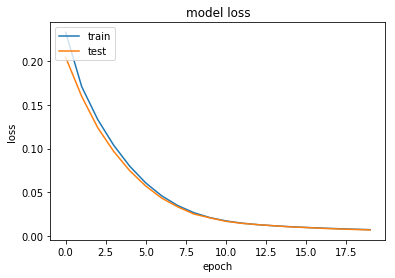

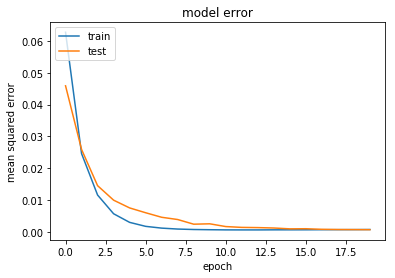

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5490 samples, validate on 1530 samples
Epoch 1/20
5490/5490 [==============================] - 0s 90us/step - loss: 0.3235 - mean_squared_error: 0.1564 - val_loss: 0.2653 - val_mean_squared_error: 0.1081
Epoch 2/20
5490/5490 [==============================] - 0s 45us/step - loss: 0.1970 - mean_squared_error: 0.0499 - val_loss: 0.1949 - val_mean_squared_error: 0.0583
Epoch 3/20
5490/5490 [==============================] - 0s 41us/step - loss: 0.1480 - mean_squared_error: 0.0218 - val_loss: 0.1480 - val_mean_squared_error: 

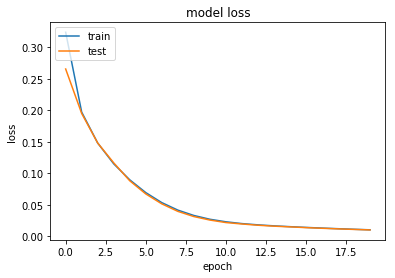

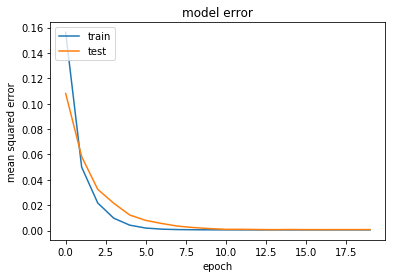

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2196 samples, validate on 612 samples
Epoch 1/20
2196/2196 [==============================] - 0s 144us/step - loss: 0.1898 - mean_squared_error: 0.0336 - val_loss: 0.1783 - val_mean_squared_error: 0.0296
Epoch 2/20
2196/2196 [==============================] - 0s 47us/step - loss: 0.1670 - mean_squared_error: 0.0244 - val_loss: 0.1609 - val_mean_squared_error: 0.0250
Epoch 3/20
2196/2196 [==============================] - 0s 44us/step - loss: 0.1491 - mean_squared_error: 0.0190 - val_loss: 0.1455 - val_mean_squared_error: 

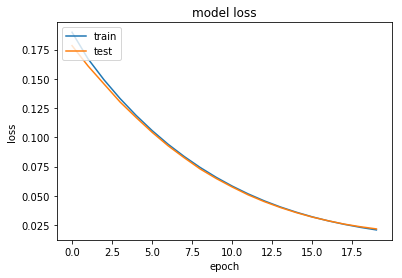

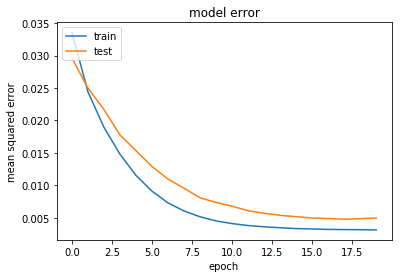

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3294 samples, validate on 918 samples
Epoch 1/20
3294/3294 [==============================] - 0s 116us/step - loss: 0.2304 - mean_squared_error: 0.0654 - val_loss: 0.1917 - val_mean_squared_error: 0.0350
Epoch 2/20
3294/3294 [==============================] - 0s 46us/step - loss: 0.1865 - mean_squared_error: 0.0371 - val_loss: 0.1640 - val_mean_squared_error: 0.0225
Epoch 3/20
3294/3294 [==============================] - 0s 45us/step - loss: 0.1569 - mean_squared_error: 0.0228 - val_loss: 0.1423 - val_mean_squared_error: 

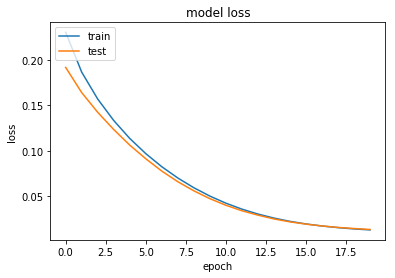

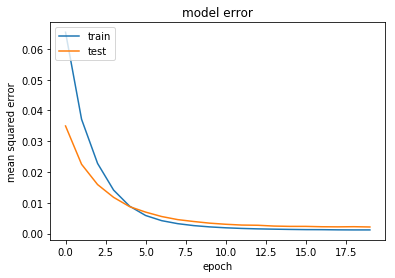

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5520 samples, validate on 1500 samples
Epoch 1/20
5520/5520 [==============================] - 0s 87us/step - loss: 0.2385 - mean_squared_error: 0.0711 - val_loss: 0.2621 - val_mean_squared_error: 0.1057
Epoch 2/20
5520/5520 [==============================] - 0s 42us/step - loss: 0.1750 - mean_squared_error: 0.0295 - val_loss: 0.1887 - val_mean_squared_error: 0.0545
Epoch 3/20
5520/5520 [==============================] - 0s 40us/step - loss: 0.1369 - mean_squared_error: 0.0136 - val_loss: 0.1403 - val_mean_squared_error: 

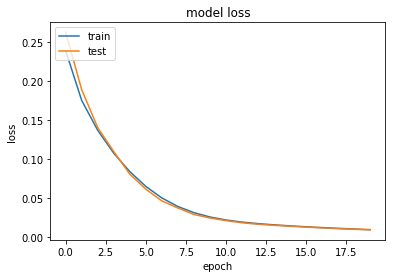

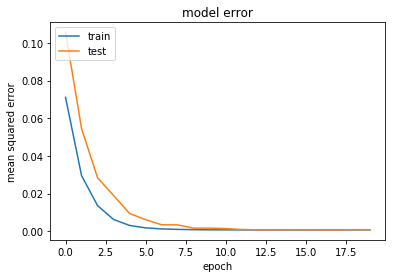

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5520 samples, validate on 1500 samples
Epoch 1/20
5520/5520 [==============================] - 0s 87us/step - loss: 0.2708 - mean_squared_error: 0.1114 - val_loss: 0.2084 - val_mean_squared_error: 0.0610
Epoch 2/20
5520/5520 [==============================] - 0s 48us/step - loss: 0.1720 - mean_squared_error: 0.0362 - val_loss: 0.1552 - val_mean_squared_error: 0.0312
Epoch 3/20
5520/5520 [==============================] - 0s 40us/step - loss: 0.1296 - mean_squared_error: 0.0168 - val_loss: 0.1177 - val_mean_squared_error: 

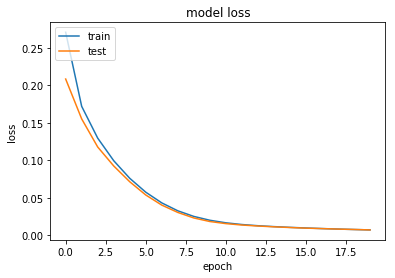

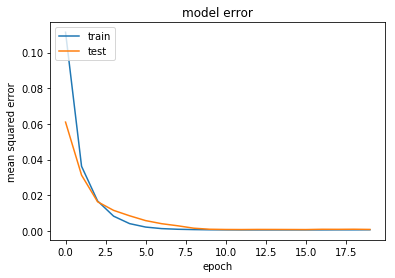

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2208 samples, validate on 600 samples
Epoch 1/20
2208/2208 [==============================] - 0s 145us/step - loss: 0.2291 - mean_squared_error: 0.0656 - val_loss: 0.2146 - val_mean_squared_error: 0.0570
Epoch 2/20
2208/2208 [==============================] - 0s 43us/step - loss: 0.1969 - mean_squared_error: 0.0444 - val_loss: 0.1898 - val_mean_squared_error: 0.0427
Epoch 3/20
2208/2208 [==============================] - 0s 42us/step - loss: 0.1748 - mean_squared_error: 0.0327 - val_loss: 0.1701 - val_mean_squared_error: 

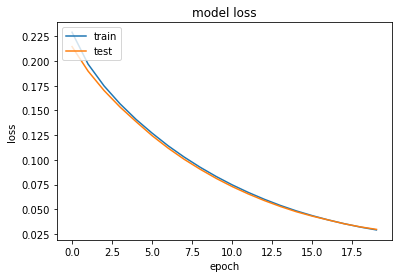

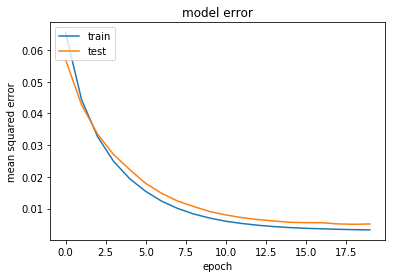

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3312 samples, validate on 900 samples
Epoch 1/20
3312/3312 [==============================] - 0s 107us/step - loss: 0.2184 - mean_squared_error: 0.0572 - val_loss: 0.2020 - val_mean_squared_error: 0.0494
Epoch 2/20
3312/3312 [==============================] - 0s 40us/step - loss: 0.1779 - mean_squared_error: 0.0331 - val_loss: 0.1697 - val_mean_squared_error: 0.0330
Epoch 3/20
3312/3312 [==============================] - 0s 38us/step - loss: 0.1497 - mean_squared_error: 0.0207 - val_loss: 0.1458 - val_mean_squared_error: 

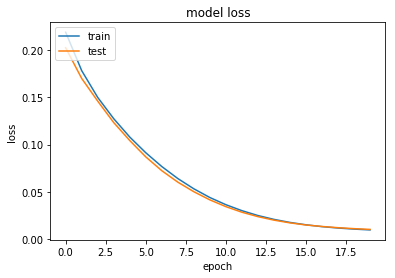

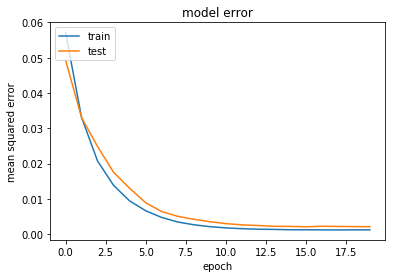

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5550 samples, validate on 1470 samples
Epoch 1/20
5550/5550 [==============================] - 0s 84us/step - loss: 0.3160 - mean_squared_error: 0.1406 - val_loss: 0.2325 - val_mean_squared_error: 0.0675
Epoch 2/20
5550/5550 [==============================] - 0s 39us/step - loss: 0.1818 - mean_squared_error: 0.0287 - val_loss: 0.1786 - val_mean_squared_error: 0.0380
Epoch 3/20
5550/5550 [==============================] - 0s 38us/step - loss: 0.1388 - mean_squared_error: 0.0109 - val_loss: 0.1399 - val_mean_squared_error: 

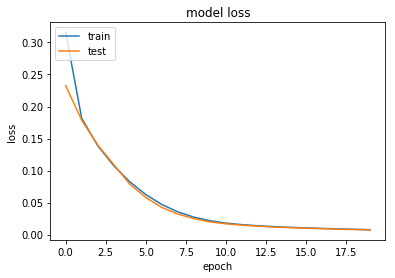

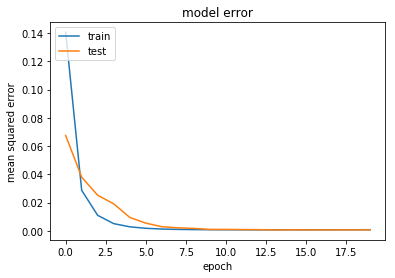

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5550 samples, validate on 1470 samples
Epoch 1/20
5550/5550 [==============================] - 0s 81us/step - loss: 0.2254 - mean_squared_error: 0.0647 - val_loss: 0.2005 - val_mean_squared_error: 0.0514
Epoch 2/20
5550/5550 [==============================] - 0s 39us/step - loss: 0.1640 - mean_squared_error: 0.0264 - val_loss: 0.1532 - val_mean_squared_error: 0.0276
Epoch 3/20
5550/5550 [==============================] - 0s 42us/step - loss: 0.1249 - mean_squared_error: 0.0111 - val_loss: 0.1173 - val_mean_squared_error: 

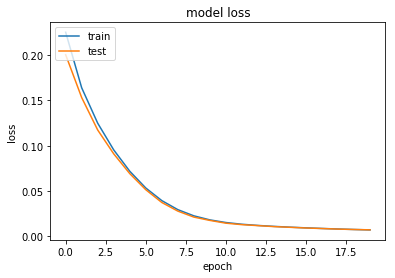

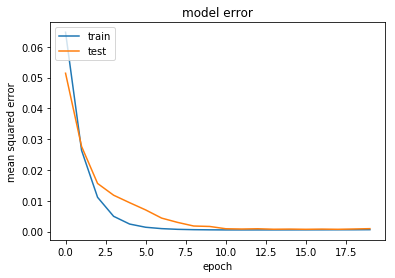

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2220 samples, validate on 588 samples
Epoch 1/20
2220/2220 [==============================] - 0s 130us/step - loss: 0.2499 - mean_squared_error: 0.0832 - val_loss: 0.2317 - val_mean_squared_error: 0.0702
Epoch 2/20
2220/2220 [==============================] - 0s 41us/step - loss: 0.2091 - mean_squared_error: 0.0522 - val_loss: 0.2055 - val_mean_squared_error: 0.0536
Epoch 3/20
2220/2220 [==============================] - 0s 45us/step - loss: 0.1823 - mean_squared_error: 0.0352 - val_loss: 0.1866 - val_mean_squared_error: 

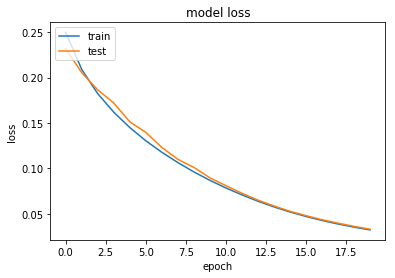

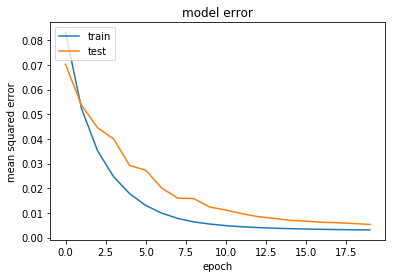

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3330 samples, validate on 882 samples
Epoch 1/20
3330/3330 [==============================] - 0s 105us/step - loss: 0.1963 - mean_squared_error: 0.0411 - val_loss: 0.1767 - val_mean_squared_error: 0.0319
Epoch 2/20
3330/3330 [==============================] - 0s 44us/step - loss: 0.1652 - mean_squared_error: 0.0290 - val_loss: 0.1519 - val_mean_squared_error: 0.0249
Epoch 3/20
3330/3330 [==============================] - 0s 46us/step - loss: 0.1395 - mean_squared_error: 0.0206 - val_loss: 0.1275 - val_mean_squared_error: 

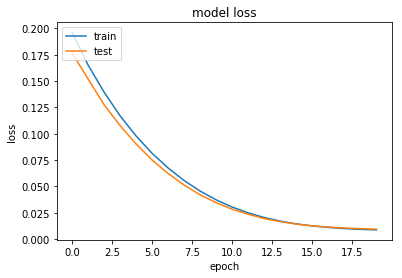

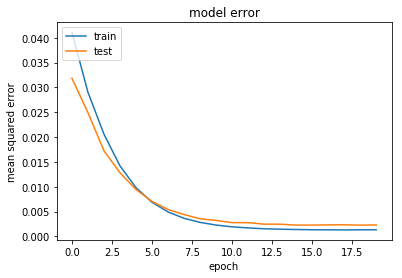

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5580 samples, validate on 1440 samples
Epoch 1/20
5580/5580 [==============================] - 0s 79us/step - loss: 0.2394 - mean_squared_error: 0.0733 - val_loss: 0.1999 - val_mean_squared_error: 0.0448
Epoch 2/20
5580/5580 [==============================] - 0s 45us/step - loss: 0.1749 - mean_squared_error: 0.0309 - val_loss: 0.1554 - val_mean_squared_error: 0.0230
Epoch 3/20
5580/5580 [==============================] - 0s 52us/step - loss: 0.1348 - mean_squared_error: 0.0137 - val_loss: 0.1216 - val_mean_squared_error: 

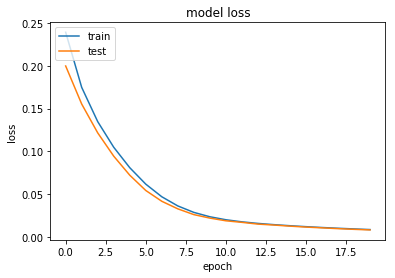

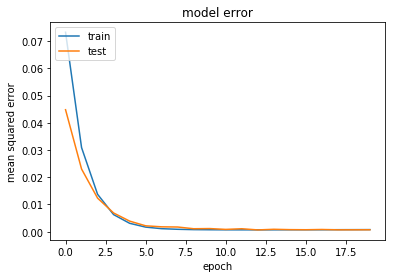

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5580 samples, validate on 1440 samples
Epoch 1/20
5580/5580 [==============================] - 1s 98us/step - loss: 0.2677 - mean_squared_error: 0.0960 - val_loss: 0.2242 - val_mean_squared_error: 0.0633
Epoch 2/20
5580/5580 [==============================] - 0s 58us/step - loss: 0.1908 - mean_squared_error: 0.0405 - val_loss: 0.1700 - val_mean_squared_error: 0.0311
Epoch 3/20
5580/5580 [==============================] - 0s 57us/step - loss: 0.1471 - mean_squared_error: 0.0193 - val_loss: 0.1337 - val_mean_squared_error: 

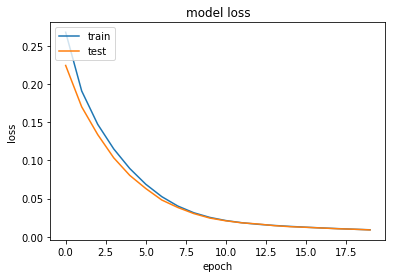

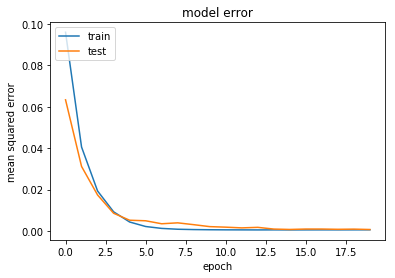

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2232 samples, validate on 576 samples
Epoch 1/20
2232/2232 [==============================] - 0s 134us/step - loss: 0.2107 - mean_squared_error: 0.0514 - val_loss: 0.1915 - val_mean_squared_error: 0.0392
Epoch 2/20
2232/2232 [==============================] - 0s 41us/step - loss: 0.1798 - mean_squared_error: 0.0336 - val_loss: 0.1712 - val_mean_squared_error: 0.0315
Epoch 3/20
2232/2232 [==============================] - 0s 41us/step - loss: 0.1579 - mean_squared_error: 0.0240 - val_loss: 0.1512 - val_mean_squared_error: 

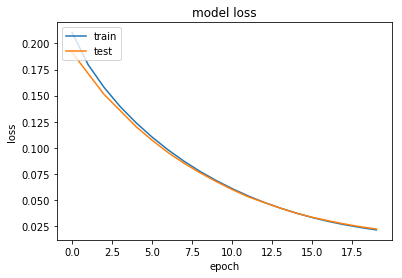

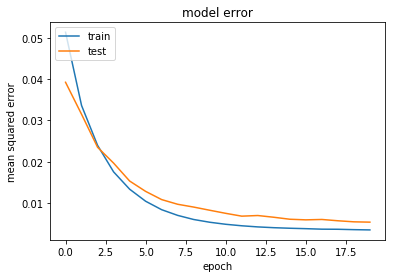

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3348 samples, validate on 864 samples
Epoch 1/20
3348/3348 [==============================] - 0s 101us/step - loss: 0.2822 - mean_squared_error: 0.1196 - val_loss: 0.2472 - val_mean_squared_error: 0.0921
Epoch 2/20
3348/3348 [==============================] - 0s 45us/step - loss: 0.2103 - mean_squared_error: 0.0622 - val_loss: 0.1886 - val_mean_squared_error: 0.0476
Epoch 3/20
3348/3348 [==============================] - 0s 41us/step - loss: 0.1692 - mean_squared_error: 0.0351 - val_loss: 0.1526 - val_mean_squared_error: 

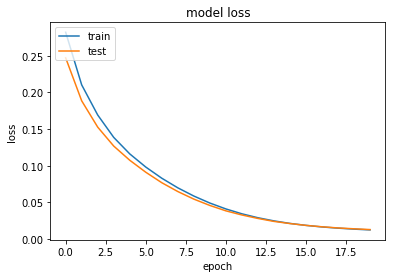

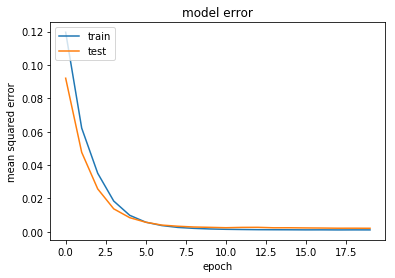

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5610 samples, validate on 1410 samples
Epoch 1/20
5610/5610 [==============================] - 0s 81us/step - loss: 0.2399 - mean_squared_error: 0.0756 - val_loss: 0.1962 - val_mean_squared_error: 0.0457
Epoch 2/20
5610/5610 [==============================] - 0s 42us/step - loss: 0.1640 - mean_squared_error: 0.0270 - val_loss: 0.1476 - val_mean_squared_error: 0.0243
Epoch 3/20
5610/5610 [==============================] - 0s 42us/step - loss: 0.1215 - mean_squared_error: 0.0110 - val_loss: 0.1107 - val_mean_squared_error: 

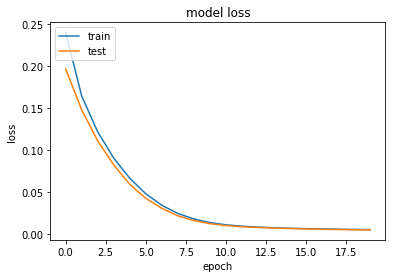

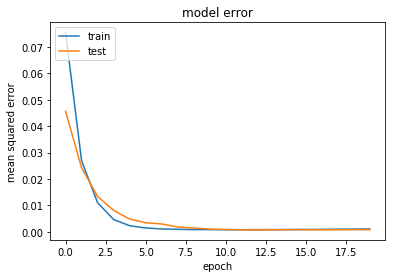

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5610 samples, validate on 1410 samples
Epoch 1/20
5610/5610 [==============================] - 0s 84us/step - loss: 0.2952 - mean_squared_error: 0.1254 - val_loss: 0.2135 - val_mean_squared_error: 0.0557
Epoch 2/20
5610/5610 [==============================] - 0s 42us/step - loss: 0.1861 - mean_squared_error: 0.0405 - val_loss: 0.1642 - val_mean_squared_error: 0.0310
Epoch 3/20
5610/5610 [==============================] - 0s 42us/step - loss: 0.1418 - mean_squared_error: 0.0206 - val_loss: 0.1288 - val_mean_squared_error: 

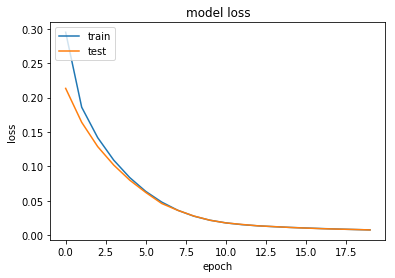

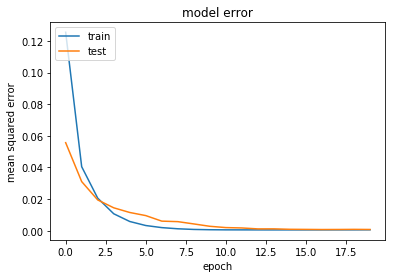

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2244 samples, validate on 564 samples
Epoch 1/20
2244/2244 [==============================] - 0s 151us/step - loss: 0.2349 - mean_squared_error: 0.0675 - val_loss: 0.2142 - val_mean_squared_error: 0.0530
Epoch 2/20
2244/2244 [==============================] - 0s 47us/step - loss: 0.2038 - mean_squared_error: 0.0477 - val_loss: 0.1941 - val_mean_squared_error: 0.0436
Epoch 3/20
2244/2244 [==============================] - 0s 46us/step - loss: 0.1811 - mean_squared_error: 0.0356 - val_loss: 0.1729 - val_mean_squared_error: 

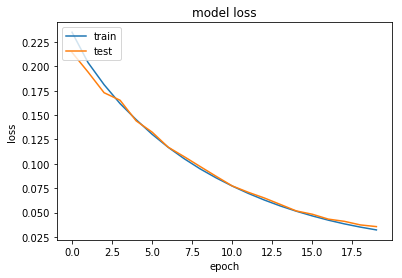

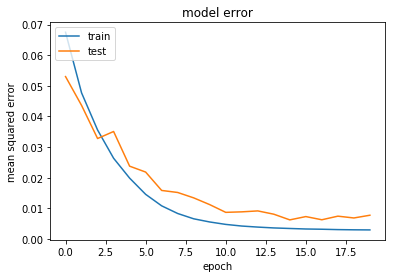

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3366 samples, validate on 846 samples
Epoch 1/20
3366/3366 [==============================] - 0s 106us/step - loss: 0.2521 - mean_squared_error: 0.0842 - val_loss: 0.2104 - val_mean_squared_error: 0.0497
Epoch 2/20
3366/3366 [==============================] - 0s 45us/step - loss: 0.1887 - mean_squared_error: 0.0351 - val_loss: 0.1750 - val_mean_squared_error: 0.0290
Epoch 3/20
3366/3366 [==============================] - 0s 43us/step - loss: 0.1587 - mean_squared_error: 0.0202 - val_loss: 0.1503 - val_mean_squared_error: 

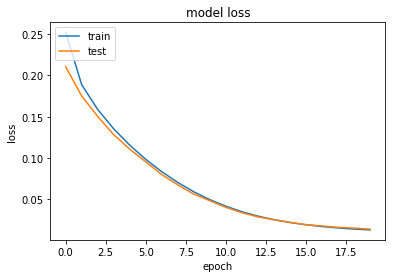

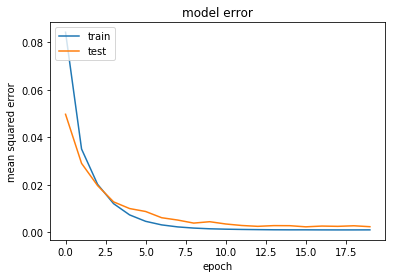

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5640 samples, validate on 1380 samples
Epoch 1/20
5640/5640 [==============================] - 0s 81us/step - loss: 0.2513 - mean_squared_error: 0.0810 - val_loss: 0.2080 - val_mean_squared_error: 0.0486
Epoch 2/20
5640/5640 [==============================] - 0s 42us/step - loss: 0.1801 - mean_squared_error: 0.0319 - val_loss: 0.1602 - val_mean_squared_error: 0.0242
Epoch 3/20
5640/5640 [==============================] - 0s 42us/step - loss: 0.1367 - mean_squared_error: 0.0127 - val_loss: 0.1314 - val_mean_squared_error: 

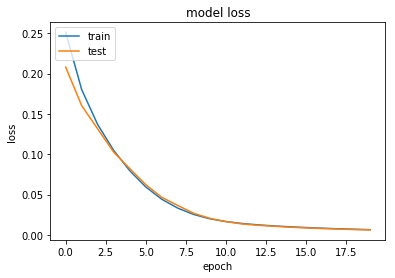

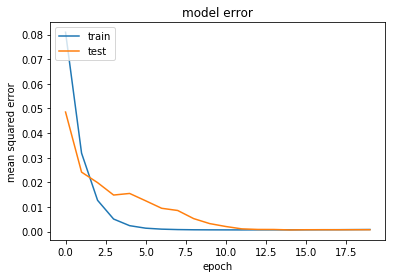

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5640 samples, validate on 1380 samples
Epoch 1/20
5640/5640 [==============================] - 0s 77us/step - loss: 0.1983 - mean_squared_error: 0.0360 - val_loss: 0.1753 - val_mean_squared_error: 0.0272
Epoch 2/20
5640/5640 [==============================] - 0s 39us/step - loss: 0.1512 - mean_squared_error: 0.0164 - val_loss: 0.1353 - val_mean_squared_error: 0.0144
Epoch 3/20
5640/5640 [==============================] - 0s 42us/step - loss: 0.1165 - mean_squared_error: 0.0081 - val_loss: 0.1048 - val_mean_squared_error: 

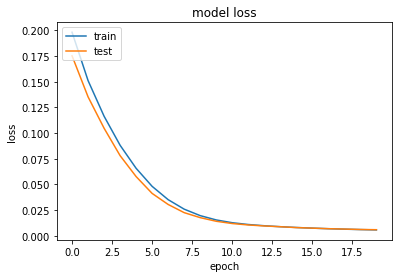

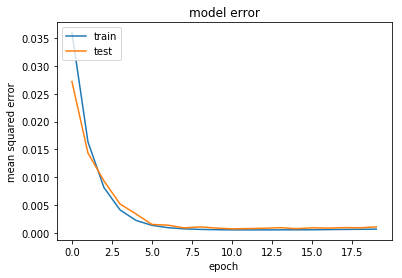

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2256 samples, validate on 552 samples
Epoch 1/20
2256/2256 [==============================] - 0s 147us/step - loss: 0.2204 - mean_squared_error: 0.0639 - val_loss: 0.2041 - val_mean_squared_error: 0.0537
Epoch 2/20
2256/2256 [==============================] - 0s 49us/step - loss: 0.1904 - mean_squared_error: 0.0450 - val_loss: 0.1809 - val_mean_squared_error: 0.0410
Epoch 3/20
2256/2256 [==============================] - 0s 47us/step - loss: 0.1683 - mean_squared_error: 0.0333 - val_loss: 0.1616 - val_mean_squared_error: 

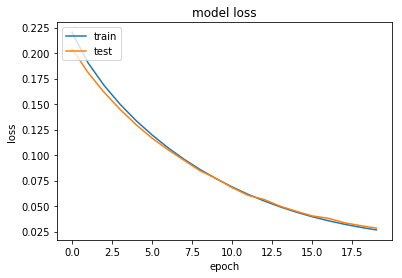

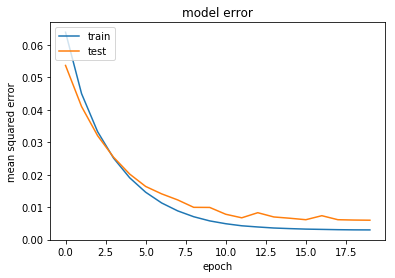

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3384 samples, validate on 828 samples
Epoch 1/20
3384/3384 [==============================] - 0s 105us/step - loss: 0.3007 - mean_squared_error: 0.1321 - val_loss: 0.2543 - val_mean_squared_error: 0.0927
Epoch 2/20
3384/3384 [==============================] - 0s 44us/step - loss: 0.2113 - mean_squared_error: 0.0568 - val_loss: 0.2231 - val_mean_squared_error: 0.0760
Epoch 3/20
3384/3384 [==============================] - 0s 41us/step - loss: 0.1745 - mean_squared_error: 0.0345 - val_loss: 0.1895 - val_mean_squared_error: 

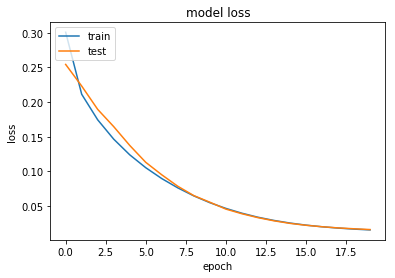

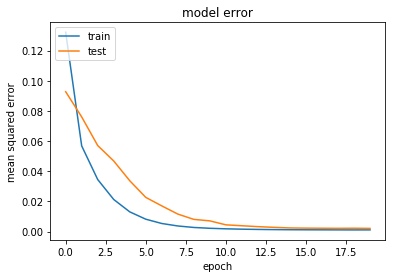

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5670 samples, validate on 1350 samples
Epoch 1/20
5670/5670 [==============================] - 0s 77us/step - loss: 0.2772 - mean_squared_error: 0.1154 - val_loss: 0.2064 - val_mean_squared_error: 0.0566
Epoch 2/20
5670/5670 [==============================] - 0s 45us/step - loss: 0.1773 - mean_squared_error: 0.0392 - val_loss: 0.1545 - val_mean_squared_error: 0.0286
Epoch 3/20
5670/5670 [==============================] - 0s 39us/step - loss: 0.1306 - mean_squared_error: 0.0164 - val_loss: 0.1194 - val_mean_squared_error: 

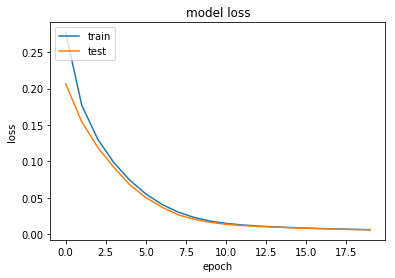

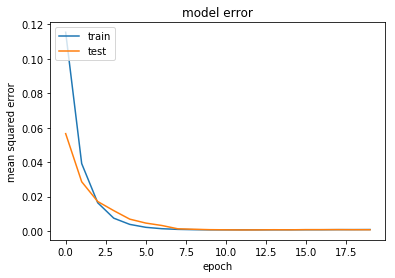

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5670 samples, validate on 1350 samples
Epoch 1/20
5670/5670 [==============================] - 0s 88us/step - loss: 0.2065 - mean_squared_error: 0.0606 - val_loss: 0.1753 - val_mean_squared_error: 0.0444
Epoch 2/20
5670/5670 [==============================] - 0s 43us/step - loss: 0.1482 - mean_squared_error: 0.0306 - val_loss: 0.1276 - val_mean_squared_error: 0.0231
Epoch 3/20
5670/5670 [==============================] - 0s 43us/step - loss: 0.1078 - mean_squared_error: 0.0150 - val_loss: 0.0938 - val_mean_squared_error: 

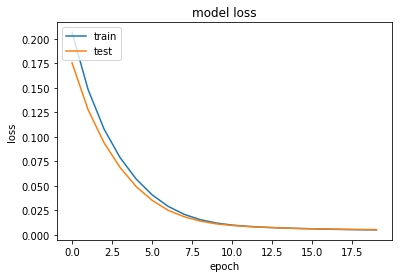

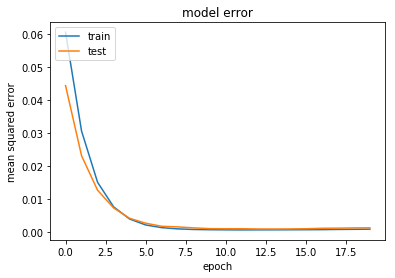

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2268 samples, validate on 540 samples
Epoch 1/20
2268/2268 [==============================] - 0s 129us/step - loss: 0.2876 - mean_squared_error: 0.1259 - val_loss: 0.2252 - val_mean_squared_error: 0.0696
Epoch 2/20
2268/2268 [==============================] - 0s 46us/step - loss: 0.2183 - mean_squared_error: 0.0682 - val_loss: 0.2087 - val_mean_squared_error: 0.0645
Epoch 3/20
2268/2268 [==============================] - 0s 40us/step - loss: 0.1877 - mean_squared_error: 0.0490 - val_loss: 0.1812 - val_mean_squared_error: 

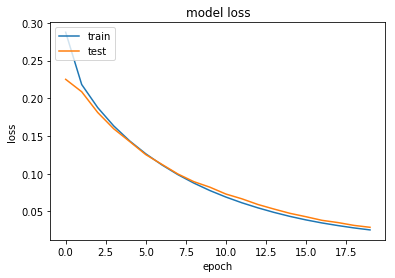

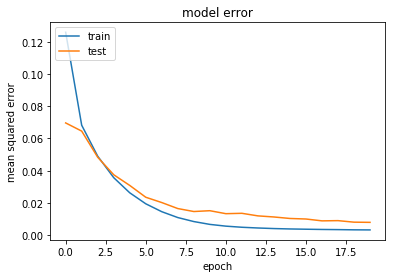

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3402 samples, validate on 810 samples
Epoch 1/20
3402/3402 [==============================] - 0s 108us/step - loss: 0.2722 - mean_squared_error: 0.0943 - val_loss: 0.2615 - val_mean_squared_error: 0.0908
Epoch 2/20
3402/3402 [==============================] - 0s 48us/step - loss: 0.2162 - mean_squared_error: 0.0521 - val_loss: 0.2136 - val_mean_squared_error: 0.0568
Epoch 3/20
3402/3402 [==============================] - 0s 41us/step - loss: 0.1823 - mean_squared_error: 0.0323 - val_loss: 0.1807 - val_mean_squared_error: 

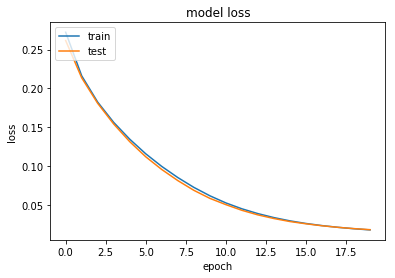

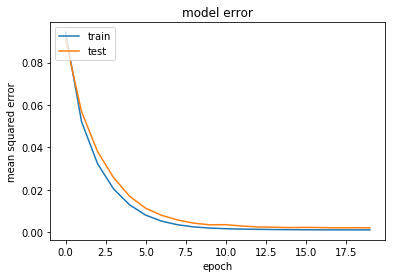

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5700 samples, validate on 1320 samples
Epoch 1/20
5700/5700 [==============================] - 0s 78us/step - loss: 0.1573 - mean_squared_error: 0.0235 - val_loss: 0.1424 - val_mean_squared_error: 0.0263
Epoch 2/20
5700/5700 [==============================] - 0s 41us/step - loss: 0.1139 - mean_squared_error: 0.0124 - val_loss: 0.1067 - val_mean_squared_error: 0.0196
Epoch 3/20
5700/5700 [==============================] - 0s 39us/step - loss: 0.0820 - mean_squared_error: 0.0071 - val_loss: 0.0748 - val_mean_squared_error: 

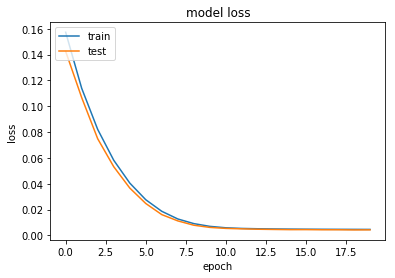

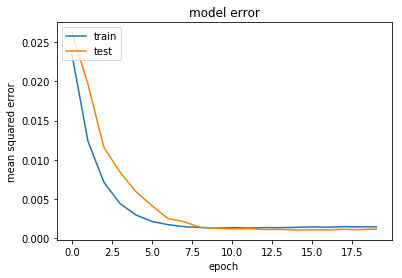

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5700 samples, validate on 1320 samples
Epoch 1/20
5700/5700 [==============================] - 0s 77us/step - loss: 0.2012 - mean_squared_error: 0.0549 - val_loss: 0.1641 - val_mean_squared_error: 0.0338
Epoch 2/20
5700/5700 [==============================] - 0s 44us/step - loss: 0.1449 - mean_squared_error: 0.0283 - val_loss: 0.1219 - val_mean_squared_error: 0.0191
Epoch 3/20
5700/5700 [==============================] - 0s 41us/step - loss: 0.1047 - mean_squared_error: 0.0138 - val_loss: 0.0885 - val_mean_squared_error: 

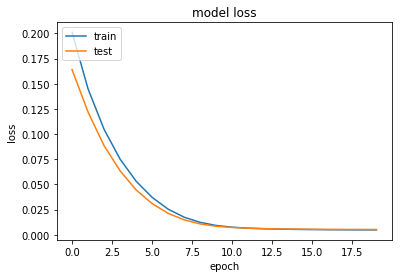

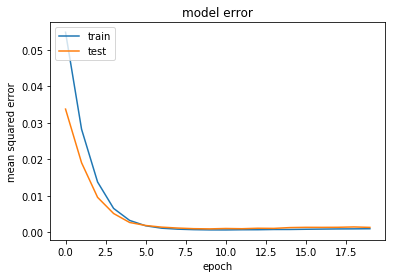

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2280 samples, validate on 528 samples
Epoch 1/20
2280/2280 [==============================] - 0s 131us/step - loss: 0.3630 - mean_squared_error: 0.1876 - val_loss: 0.2969 - val_mean_squared_error: 0.1258
Epoch 2/20
2280/2280 [==============================] - 0s 46us/step - loss: 0.2294 - mean_squared_error: 0.0630 - val_loss: 0.2170 - val_mean_squared_error: 0.0557
Epoch 3/20
2280/2280 [==============================] - 0s 43us/step - loss: 0.1973 - mean_squared_error: 0.0411 - val_loss: 0.1960 - val_mean_squared_error: 

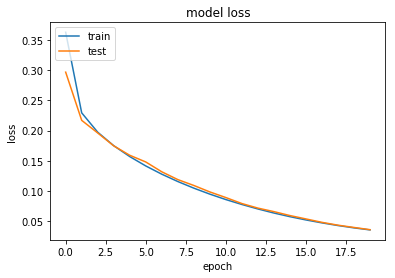

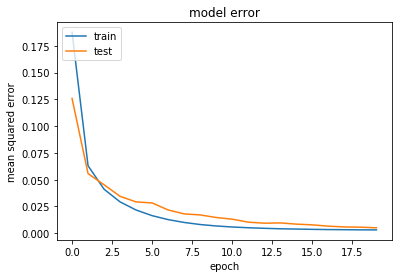

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3420 samples, validate on 792 samples
Epoch 1/20
3420/3420 [==============================] - 0s 117us/step - loss: 0.2678 - mean_squared_error: 0.1028 - val_loss: 0.2529 - val_mean_squared_error: 0.0951
Epoch 2/20
3420/3420 [==============================] - 0s 44us/step - loss: 0.1984 - mean_squared_error: 0.0478 - val_loss: 0.2189 - val_mean_squared_error: 0.0759
Epoch 3/20
3420/3420 [==============================] - 0s 50us/step - loss: 0.1652 - mean_squared_error: 0.0296 - val_loss: 0.1952 - val_mean_squared_error: 

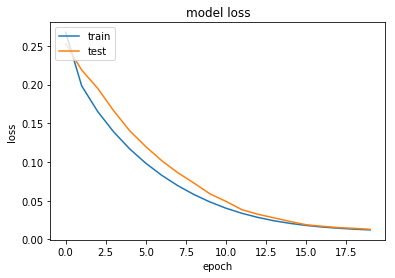

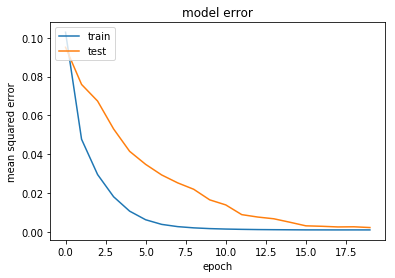

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5730 samples, validate on 1290 samples
Epoch 1/20
5730/5730 [==============================] - 1s 98us/step - loss: 0.1937 - mean_squared_error: 0.0392 - val_loss: 0.1829 - val_mean_squared_error: 0.0430
Epoch 2/20
5730/5730 [==============================] - 0s 57us/step - loss: 0.1434 - mean_squared_error: 0.0172 - val_loss: 0.1410 - val_mean_squared_error: 0.0287
Epoch 3/20
5730/5730 [==============================] - 0s 45us/step - loss: 0.1076 - mean_squared_error: 0.0080 - val_loss: 0.1096 - val_mean_squared_error: 

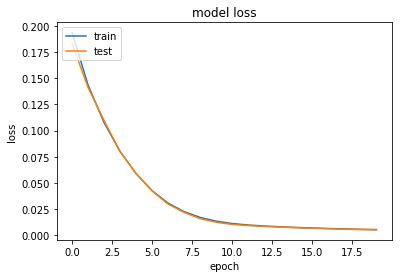

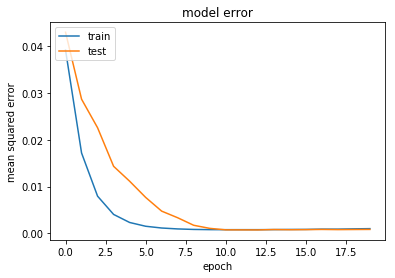

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5730 samples, validate on 1290 samples
Epoch 1/20
5730/5730 [==============================] - 0s 77us/step - loss: 0.2946 - mean_squared_error: 0.1303 - val_loss: 0.2088 - val_mean_squared_error: 0.0560
Epoch 2/20
5730/5730 [==============================] - 0s 41us/step - loss: 0.1881 - mean_squared_error: 0.0469 - val_loss: 0.1643 - val_mean_squared_error: 0.0351
Epoch 3/20
5730/5730 [==============================] - 0s 39us/step - loss: 0.1396 - mean_squared_error: 0.0217 - val_loss: 0.1290 - val_mean_squared_error: 

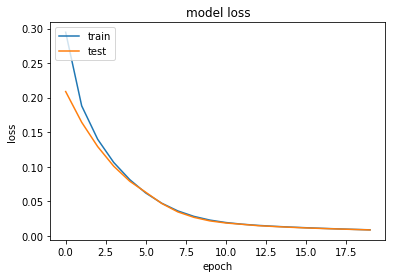

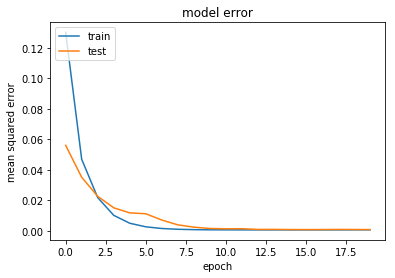

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2292 samples, validate on 516 samples
Epoch 1/20
2292/2292 [==============================] - 0s 131us/step - loss: 0.3328 - mean_squared_error: 0.1683 - val_loss: 0.2526 - val_mean_squared_error: 0.0933
Epoch 2/20
2292/2292 [==============================] - 0s 46us/step - loss: 0.2350 - mean_squared_error: 0.0806 - val_loss: 0.2304 - val_mean_squared_error: 0.0812
Epoch 3/20
2292/2292 [==============================] - 0s 38us/step - loss: 0.1984 - mean_squared_error: 0.0542 - val_loss: 0.2049 - val_mean_squared_error: 

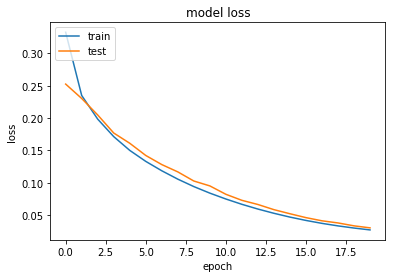

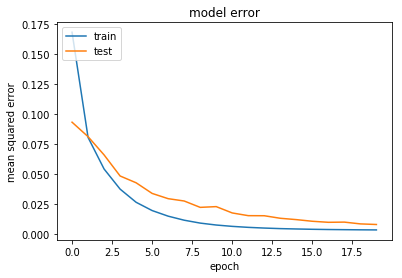

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3438 samples, validate on 774 samples
Epoch 1/20
3438/3438 [==============================] - 0s 107us/step - loss: 0.2157 - mean_squared_error: 0.0553 - val_loss: 0.2024 - val_mean_squared_error: 0.0511
Epoch 2/20
3438/3438 [==============================] - 0s 41us/step - loss: 0.1726 - mean_squared_error: 0.0295 - val_loss: 0.1649 - val_mean_squared_error: 0.0304
Epoch 3/20
3438/3438 [==============================] - 0s 41us/step - loss: 0.1428 - mean_squared_error: 0.0164 - val_loss: 0.1376 - val_mean_squared_error: 

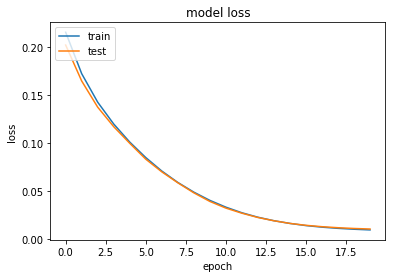

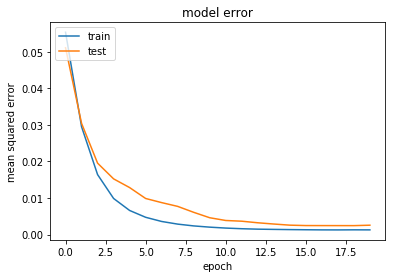

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5760 samples, validate on 1260 samples
Epoch 1/20
5760/5760 [==============================] - 0s 76us/step - loss: 0.2105 - mean_squared_error: 0.0580 - val_loss: 0.1643 - val_mean_squared_error: 0.0250
Epoch 2/20
5760/5760 [==============================] - 0s 44us/step - loss: 0.1402 - mean_squared_error: 0.0148 - val_loss: 0.1236 - val_mean_squared_error: 0.0124
Epoch 3/20
5760/5760 [==============================] - 0s 46us/step - loss: 0.1044 - mean_squared_error: 0.0064 - val_loss: 0.0912 - val_mean_squared_error: 

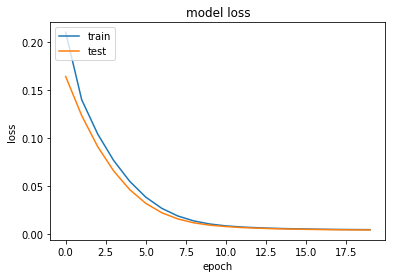

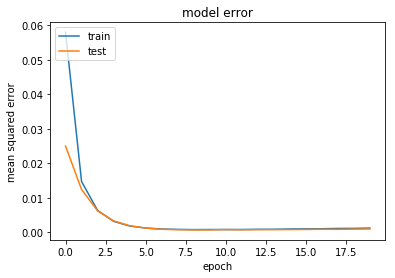

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5760 samples, validate on 1260 samples
Epoch 1/20
5760/5760 [==============================] - 0s 79us/step - loss: 0.4378 - mean_squared_error: 0.2715 - val_loss: 0.2294 - val_mean_squared_error: 0.0719
Epoch 2/20
5760/5760 [==============================] - 0s 42us/step - loss: 0.1991 - mean_squared_error: 0.0528 - val_loss: 0.1675 - val_mean_squared_error: 0.0330
Epoch 3/20
5760/5760 [==============================] - 0s 42us/step - loss: 0.1431 - mean_squared_error: 0.0204 - val_loss: 0.1279 - val_mean_squared_error: 

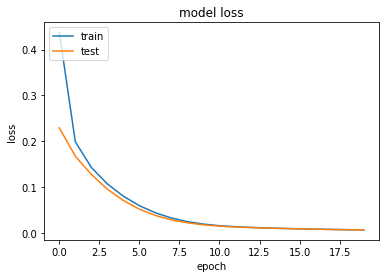

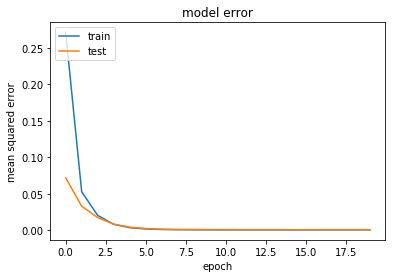

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2304 samples, validate on 504 samples
Epoch 1/20
2304/2304 [==============================] - 0s 134us/step - loss: 0.2918 - mean_squared_error: 0.1183 - val_loss: 0.2371 - val_mean_squared_error: 0.0688
Epoch 2/20
2304/2304 [==============================] - 0s 45us/step - loss: 0.2200 - mean_squared_error: 0.0567 - val_loss: 0.2086 - val_mean_squared_error: 0.0507
Epoch 3/20
2304/2304 [==============================] - 0s 46us/step - loss: 0.1946 - mean_squared_error: 0.0417 - val_loss: 0.1860 - val_mean_squared_error: 

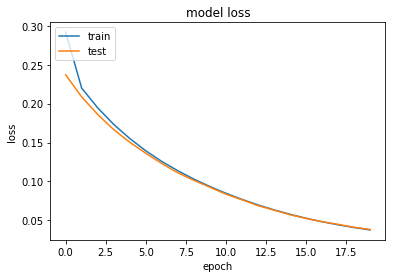

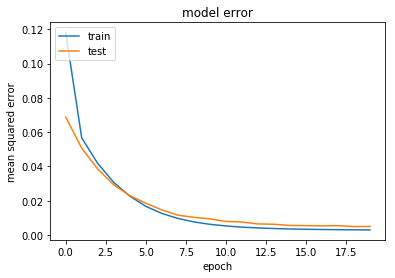

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3456 samples, validate on 756 samples
Epoch 1/20
3456/3456 [==============================] - 0s 110us/step - loss: 0.2392 - mean_squared_error: 0.0777 - val_loss: 0.2193 - val_mean_squared_error: 0.0657
Epoch 2/20
3456/3456 [==============================] - 0s 41us/step - loss: 0.1836 - mean_squared_error: 0.0376 - val_loss: 0.1819 - val_mean_squared_error: 0.0438
Epoch 3/20
3456/3456 [==============================] - 0s 42us/step - loss: 0.1517 - mean_squared_error: 0.0212 - val_loss: 0.1538 - val_mean_squared_error: 

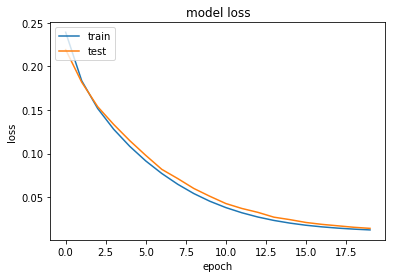

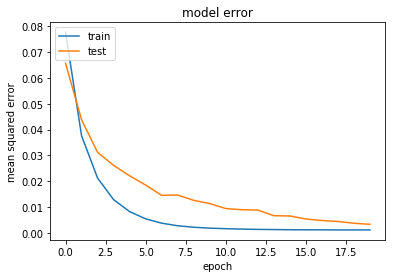

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5790 samples, validate on 1230 samples
Epoch 1/20
5790/5790 [==============================] - 0s 85us/step - loss: 0.2155 - mean_squared_error: 0.0653 - val_loss: 0.1633 - val_mean_squared_error: 0.0280
Epoch 2/20
5790/5790 [==============================] - 0s 39us/step - loss: 0.1417 - mean_squared_error: 0.0209 - val_loss: 0.1214 - val_mean_squared_error: 0.0149
Epoch 3/20
5790/5790 [==============================] - 0s 39us/step - loss: 0.1050 - mean_squared_error: 0.0111 - val_loss: 0.0895 - val_mean_squared_error: 

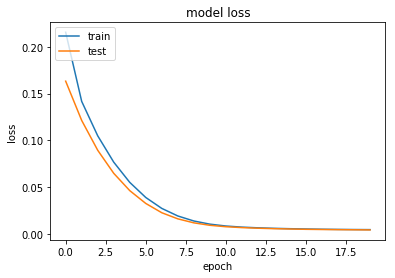

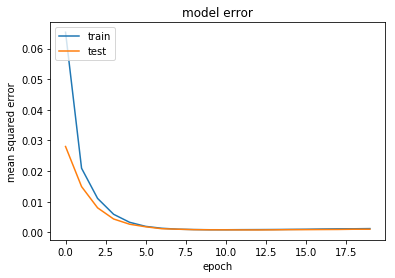

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5790 samples, validate on 1230 samples
Epoch 1/20
5790/5790 [==============================] - 0s 78us/step - loss: 0.2303 - mean_squared_error: 0.0749 - val_loss: 0.1973 - val_mean_squared_error: 0.0557
Epoch 2/20
5790/5790 [==============================] - 0s 43us/step - loss: 0.1505 - mean_squared_error: 0.0224 - val_loss: 0.1424 - val_mean_squared_error: 0.0280
Epoch 3/20
5790/5790 [==============================] - 0s 42us/step - loss: 0.1103 - mean_squared_error: 0.0090 - val_loss: 0.1055 - val_mean_squared_error: 

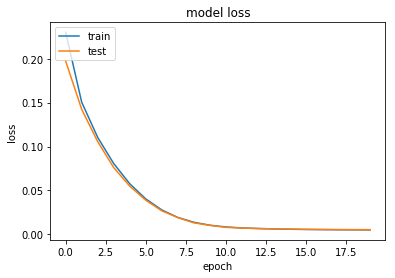

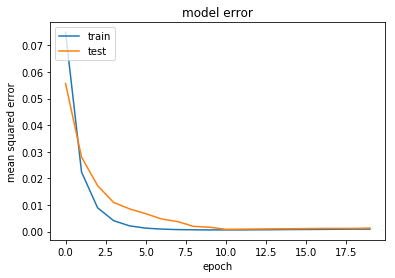

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2316 samples, validate on 492 samples
Epoch 1/20
2316/2316 [==============================] - 0s 161us/step - loss: 0.2309 - mean_squared_error: 0.0737 - val_loss: 0.1984 - val_mean_squared_error: 0.0478
Epoch 2/20
2316/2316 [==============================] - 0s 51us/step - loss: 0.1971 - mean_squared_error: 0.0520 - val_loss: 0.1751 - val_mean_squared_error: 0.0361
Epoch 3/20
2316/2316 [==============================] - 0s 40us/step - loss: 0.1714 - mean_squared_error: 0.0376 - val_loss: 0.1557 - val_mean_squared_error: 

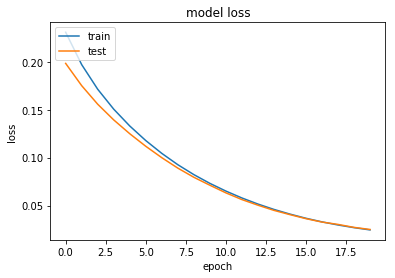

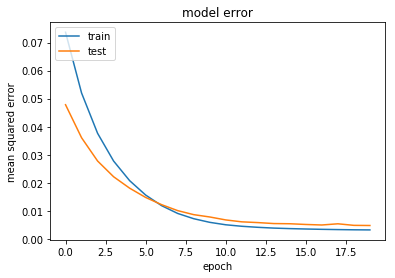

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3474 samples, validate on 738 samples
Epoch 1/20
3474/3474 [==============================] - 0s 104us/step - loss: 0.1796 - mean_squared_error: 0.0337 - val_loss: 0.1797 - val_mean_squared_error: 0.0445
Epoch 2/20
3474/3474 [==============================] - 0s 41us/step - loss: 0.1472 - mean_squared_error: 0.0212 - val_loss: 0.1462 - val_mean_squared_error: 0.0300
Epoch 3/20
3474/3474 [==============================] - 0s 42us/step - loss: 0.1222 - mean_squared_error: 0.0143 - val_loss: 0.1212 - val_mean_squared_error: 

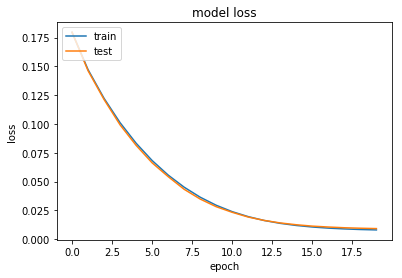

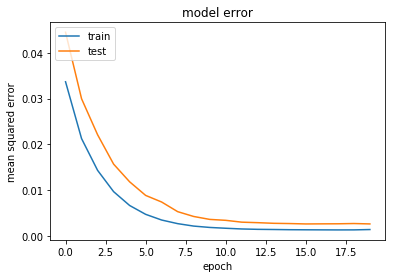

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5820 samples, validate on 1200 samples
Epoch 1/20
5820/5820 [==============================] - 0s 83us/step - loss: 0.2291 - mean_squared_error: 0.0642 - val_loss: 0.1969 - val_mean_squared_error: 0.0456
Epoch 2/20
5820/5820 [==============================] - 0s 42us/step - loss: 0.1643 - mean_squared_error: 0.0261 - val_loss: 0.1483 - val_mean_squared_error: 0.0233
Epoch 3/20
5820/5820 [==============================] - 0s 42us/step - loss: 0.1229 - mean_squared_error: 0.0105 - val_loss: 0.1091 - val_mean_squared_error: 

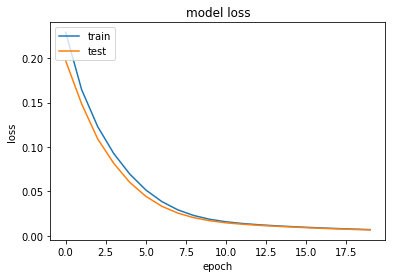

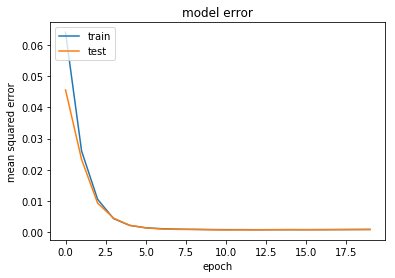

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5820 samples, validate on 1200 samples
Epoch 1/20
5820/5820 [==============================] - 0s 75us/step - loss: 0.2550 - mean_squared_error: 0.0912 - val_loss: 0.1944 - val_mean_squared_error: 0.0422
Epoch 2/20
5820/5820 [==============================] - 0s 40us/step - loss: 0.1671 - mean_squared_error: 0.0272 - val_loss: 0.1465 - val_mean_squared_error: 0.0195
Epoch 3/20
5820/5820 [==============================] - 0s 40us/step - loss: 0.1266 - mean_squared_error: 0.0120 - val_loss: 0.1113 - val_mean_squared_error: 

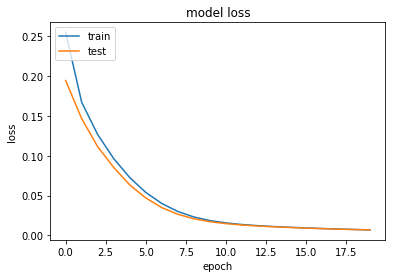

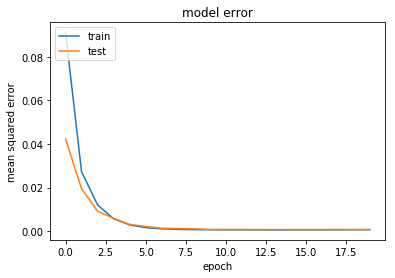

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2328 samples, validate on 480 samples
Epoch 1/20
2328/2328 [==============================] - 0s 136us/step - loss: 0.3032 - mean_squared_error: 0.1360 - val_loss: 0.2283 - val_mean_squared_error: 0.0664
Epoch 2/20
2328/2328 [==============================] - 0s 61us/step - loss: 0.2212 - mean_squared_error: 0.0641 - val_loss: 0.2031 - val_mean_squared_error: 0.0515
Epoch 3/20
2328/2328 [==============================] - 0s 41us/step - loss: 0.1906 - mean_squared_error: 0.0441 - val_loss: 0.1810 - val_mean_squared_error: 

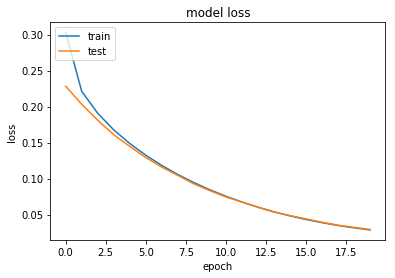

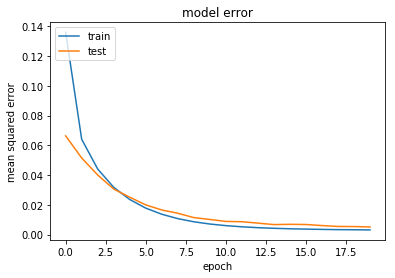

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3492 samples, validate on 720 samples
Epoch 1/20
3492/3492 [==============================] - 0s 100us/step - loss: 0.2188 - mean_squared_error: 0.0614 - val_loss: 0.2251 - val_mean_squared_error: 0.0768
Epoch 2/20
3492/3492 [==============================] - 0s 44us/step - loss: 0.1761 - mean_squared_error: 0.0362 - val_loss: 0.1859 - val_mean_squared_error: 0.0548
Epoch 3/20
3492/3492 [==============================] - 0s 39us/step - loss: 0.1460 - mean_squared_error: 0.0233 - val_loss: 0.1572 - val_mean_squared_error: 

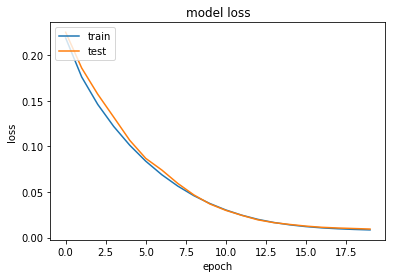

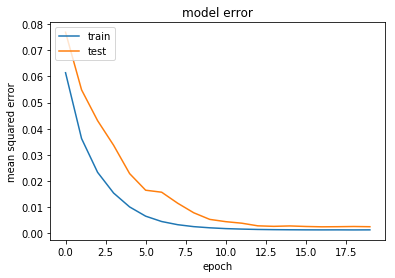

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5850 samples, validate on 1170 samples
Epoch 1/20
5850/5850 [==============================] - 0s 81us/step - loss: 0.2529 - mean_squared_error: 0.0773 - val_loss: 0.2311 - val_mean_squared_error: 0.0658
Epoch 2/20
5850/5850 [==============================] - 0s 41us/step - loss: 0.1829 - mean_squared_error: 0.0285 - val_loss: 0.1811 - val_mean_squared_error: 0.0383
Epoch 3/20
5850/5850 [==============================] - 0s 42us/step - loss: 0.1419 - mean_squared_error: 0.0109 - val_loss: 0.1404 - val_mean_squared_error: 

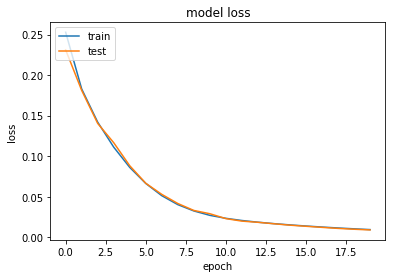

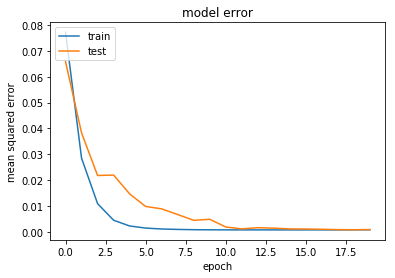

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5850 samples, validate on 1170 samples
Epoch 1/20
5850/5850 [==============================] - 0s 75us/step - loss: 0.1889 - mean_squared_error: 0.0406 - val_loss: 0.1661 - val_mean_squared_error: 0.0328
Epoch 2/20
5850/5850 [==============================] - 0s 44us/step - loss: 0.1355 - mean_squared_error: 0.0160 - val_loss: 0.1201 - val_mean_squared_error: 0.0145
Epoch 3/20
5850/5850 [==============================] - 0s 43us/step - loss: 0.0995 - mean_squared_error: 0.0066 - val_loss: 0.0884 - val_mean_squared_error: 

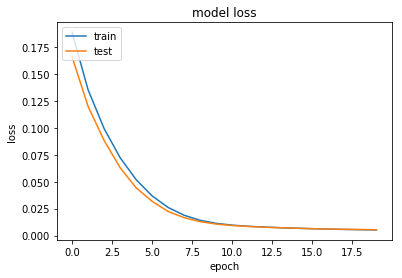

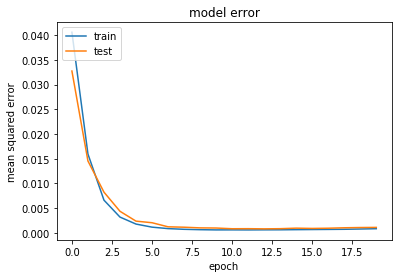

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2340 samples, validate on 468 samples
Epoch 1/20
2340/2340 [==============================] - 0s 129us/step - loss: 0.2339 - mean_squared_error: 0.0666 - val_loss: 0.2073 - val_mean_squared_error: 0.0468
Epoch 2/20
2340/2340 [==============================] - 0s 47us/step - loss: 0.1949 - mean_squared_error: 0.0401 - val_loss: 0.1791 - val_mean_squared_error: 0.0306
Epoch 3/20
2340/2340 [==============================] - 0s 46us/step - loss: 0.1702 - mean_squared_error: 0.0274 - val_loss: 0.1589 - val_mean_squared_error: 

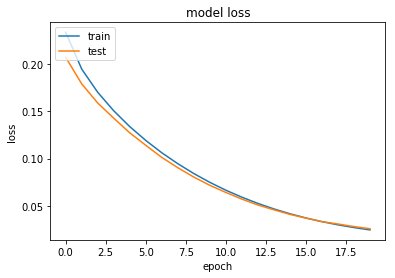

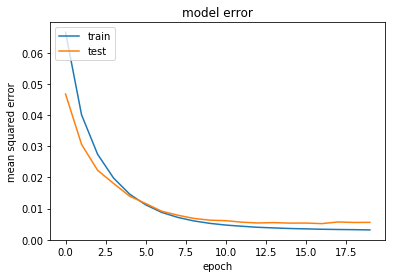

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3510 samples, validate on 702 samples
Epoch 1/20
3510/3510 [==============================] - 0s 96us/step - loss: 0.2327 - mean_squared_error: 0.0822 - val_loss: 0.1935 - val_mean_squared_error: 0.0516
Epoch 2/20
3510/3510 [==============================] - 0s 45us/step - loss: 0.1576 - mean_squared_error: 0.0246 - val_loss: 0.1464 - val_mean_squared_error: 0.0230
Epoch 3/20
3510/3510 [==============================] - 0s 40us/step - loss: 0.1282 - mean_squared_error: 0.0138 - val_loss: 0.1214 - val_mean_squared_error: 0

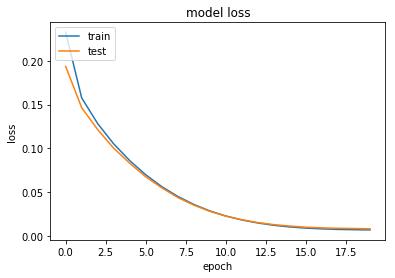

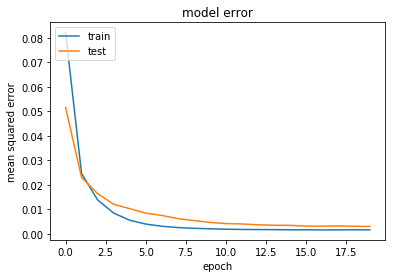

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5880 samples, validate on 1140 samples
Epoch 1/20
5880/5880 [==============================] - 0s 79us/step - loss: 0.1920 - mean_squared_error: 0.0410 - val_loss: 0.1614 - val_mean_squared_error: 0.0268
Epoch 2/20
5880/5880 [==============================] - 0s 42us/step - loss: 0.1371 - mean_squared_error: 0.0174 - val_loss: 0.1194 - val_mean_squared_error: 0.0144
Epoch 3/20
5880/5880 [==============================] - 0s 42us/step - loss: 0.1001 - mean_squared_error: 0.0082 - val_loss: 0.0880 - val_mean_squared_error: 

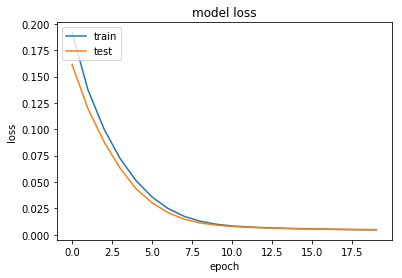

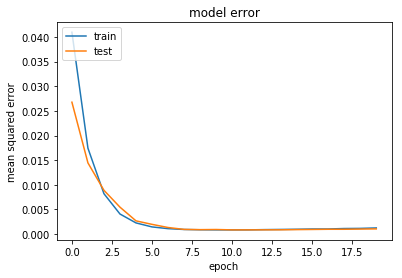

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5880 samples, validate on 1140 samples
Epoch 1/20
5880/5880 [==============================] - 0s 78us/step - loss: 0.1655 - mean_squared_error: 0.0226 - val_loss: 0.1473 - val_mean_squared_error: 0.0208
Epoch 2/20
5880/5880 [==============================] - 0s 42us/step - loss: 0.1224 - mean_squared_error: 0.0109 - val_loss: 0.1095 - val_mean_squared_error: 0.0128
Epoch 3/20
5880/5880 [==============================] - 0s 38us/step - loss: 0.0895 - mean_squared_error: 0.0058 - val_loss: 0.0792 - val_mean_squared_error: 

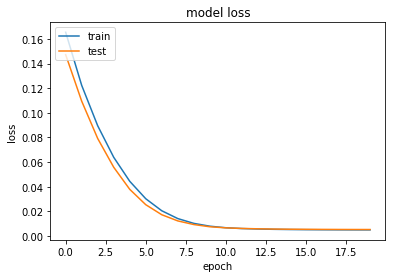

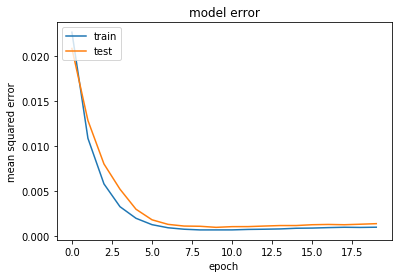

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2352 samples, validate on 456 samples
Epoch 1/20
2352/2352 [==============================] - 0s 128us/step - loss: 0.2040 - mean_squared_error: 0.0452 - val_loss: 0.1829 - val_mean_squared_error: 0.0310
Epoch 2/20
2352/2352 [==============================] - 0s 45us/step - loss: 0.1732 - mean_squared_error: 0.0275 - val_loss: 0.1620 - val_mean_squared_error: 0.0229
Epoch 3/20
2352/2352 [==============================] - 0s 40us/step - loss: 0.1536 - mean_squared_error: 0.0205 - val_loss: 0.1451 - val_mean_squared_error: 

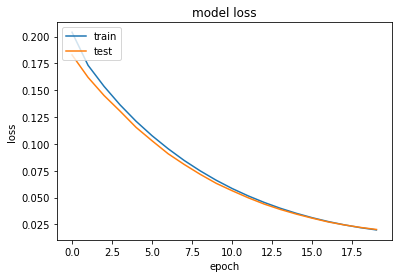

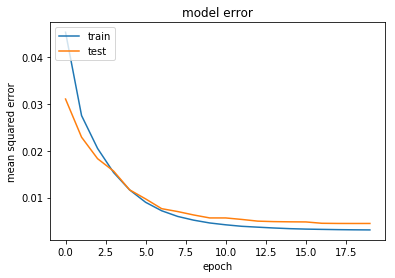

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3528 samples, validate on 684 samples
Epoch 1/20
3528/3528 [==============================] - 0s 101us/step - loss: 0.2343 - mean_squared_error: 0.0740 - val_loss: 0.2077 - val_mean_squared_error: 0.0557
Epoch 2/20
3528/3528 [==============================] - 0s 46us/step - loss: 0.1792 - mean_squared_error: 0.0352 - val_loss: 0.1762 - val_mean_squared_error: 0.0409
Epoch 3/20
3528/3528 [==============================] - 0s 41us/step - loss: 0.1499 - mean_squared_error: 0.0225 - val_loss: 0.1459 - val_mean_squared_error: 

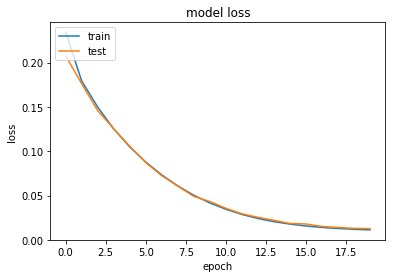

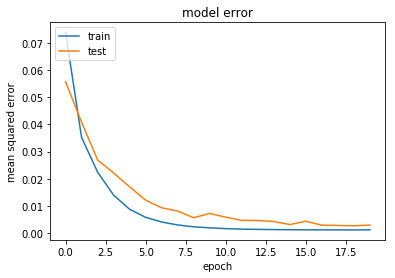

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5910 samples, validate on 1110 samples
Epoch 1/20
5910/5910 [==============================] - 0s 78us/step - loss: 0.3155 - mean_squared_error: 0.1599 - val_loss: 0.1885 - val_mean_squared_error: 0.0428
Epoch 2/20
5910/5910 [==============================] - 0s 40us/step - loss: 0.1562 - mean_squared_error: 0.0241 - val_loss: 0.1450 - val_mean_squared_error: 0.0272
Epoch 3/20
5910/5910 [==============================] - 0s 42us/step - loss: 0.1144 - mean_squared_error: 0.0100 - val_loss: 0.1054 - val_mean_squared_error: 

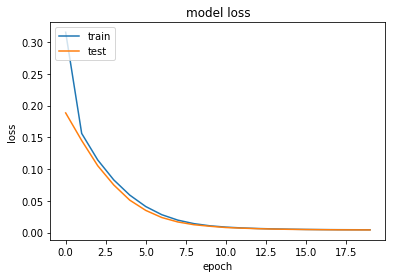

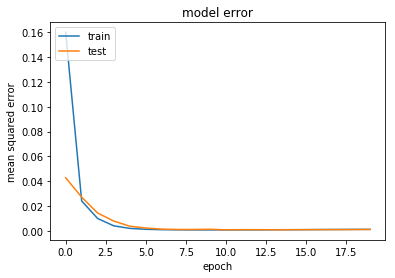

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5910 samples, validate on 1110 samples
Epoch 1/20
5910/5910 [==============================] - 0s 75us/step - loss: 0.1781 - mean_squared_error: 0.0379 - val_loss: 0.1435 - val_mean_squared_error: 0.0181
Epoch 2/20
5910/5910 [==============================] - 0s 40us/step - loss: 0.1245 - mean_squared_error: 0.0133 - val_loss: 0.1059 - val_mean_squared_error: 0.0088
Epoch 3/20
5910/5910 [==============================] - 0s 40us/step - loss: 0.0897 - mean_squared_error: 0.0056 - val_loss: 0.0763 - val_mean_squared_error: 

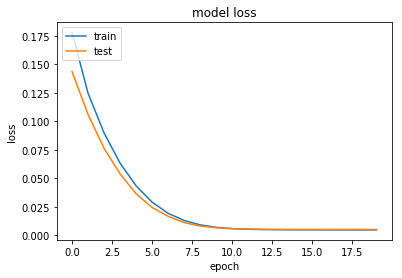

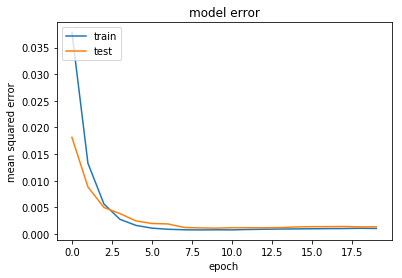

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2364 samples, validate on 444 samples
Epoch 1/20
2364/2364 [==============================] - 0s 144us/step - loss: 0.2422 - mean_squared_error: 0.0701 - val_loss: 0.2326 - val_mean_squared_error: 0.0676
Epoch 2/20
2364/2364 [==============================] - 0s 53us/step - loss: 0.2022 - mean_squared_error: 0.0435 - val_loss: 0.2074 - val_mean_squared_error: 0.0553
Epoch 3/20
2364/2364 [==============================] - 0s 44us/step - loss: 0.1749 - mean_squared_error: 0.0290 - val_loss: 0.1791 - val_mean_squared_error: 

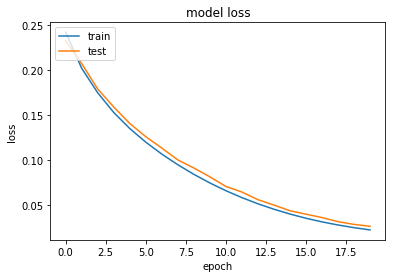

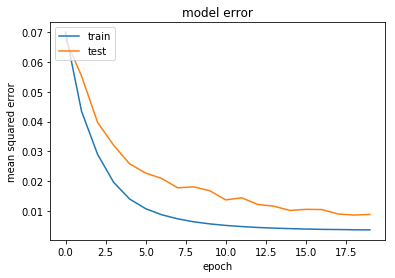

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3546 samples, validate on 666 samples
Epoch 1/20
3546/3546 [==============================] - 0s 109us/step - loss: 0.3152 - mean_squared_error: 0.1396 - val_loss: 0.3924 - val_mean_squared_error: 0.2236
Epoch 2/20
3546/3546 [==============================] - 0s 43us/step - loss: 0.2421 - mean_squared_error: 0.0797 - val_loss: 0.3130 - val_mean_squared_error: 0.1575
Epoch 3/20
3546/3546 [==============================] - 0s 41us/step - loss: 0.1975 - mean_squared_error: 0.0487 - val_loss: 0.2629 - val_mean_squared_error: 

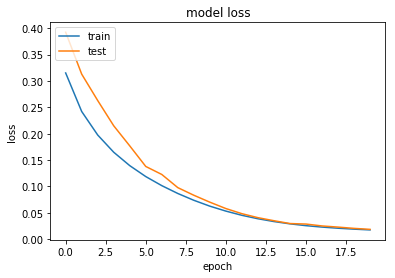

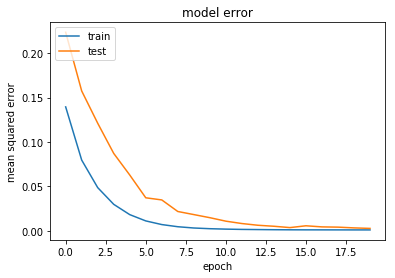

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5940 samples, validate on 1080 samples
Epoch 1/20
5940/5940 [==============================] - 0s 79us/step - loss: 0.2349 - mean_squared_error: 0.0655 - val_loss: 0.1939 - val_mean_squared_error: 0.0377
Epoch 2/20
5940/5940 [==============================] - 0s 40us/step - loss: 0.1701 - mean_squared_error: 0.0264 - val_loss: 0.1489 - val_mean_squared_error: 0.0181
Epoch 3/20
5940/5940 [==============================] - 0s 39us/step - loss: 0.1292 - mean_squared_error: 0.0107 - val_loss: 0.1144 - val_mean_squared_error: 

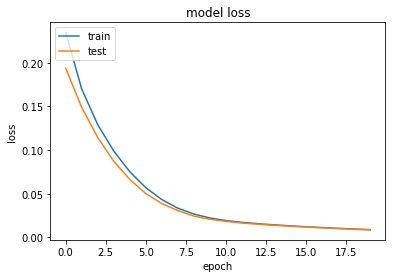

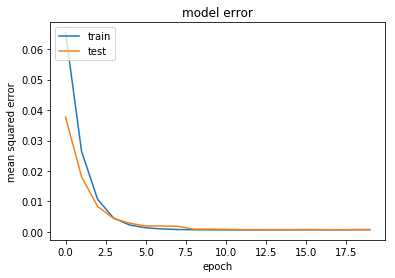

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5940 samples, validate on 1080 samples
Epoch 1/20
5940/5940 [==============================] - 0s 77us/step - loss: 0.2547 - mean_squared_error: 0.0839 - val_loss: 0.2510 - val_mean_squared_error: 0.0929
Epoch 2/20
5940/5940 [==============================] - 0s 40us/step - loss: 0.1805 - mean_squared_error: 0.0347 - val_loss: 0.1857 - val_mean_squared_error: 0.0526
Epoch 3/20
5940/5940 [==============================] - 0s 39us/step - loss: 0.1364 - mean_squared_error: 0.0156 - val_loss: 0.1375 - val_mean_squared_error: 

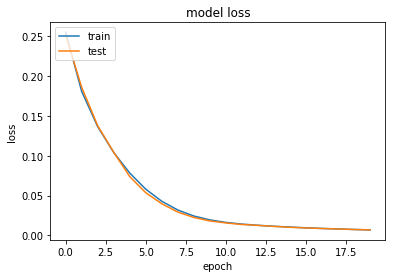

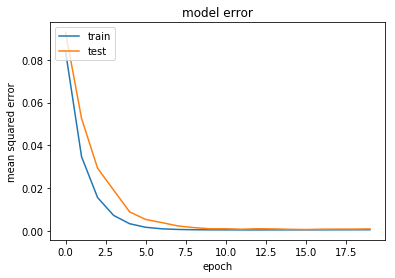

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2376 samples, validate on 432 samples
Epoch 1/20
2376/2376 [==============================] - 0s 131us/step - loss: 0.4175 - mean_squared_error: 0.2581 - val_loss: 0.2926 - val_mean_squared_error: 0.1376
Epoch 2/20
2376/2376 [==============================] - 0s 45us/step - loss: 0.2499 - mean_squared_error: 0.0993 - val_loss: 0.2060 - val_mean_squared_error: 0.0605
Epoch 3/20
2376/2376 [==============================] - 0s 42us/step - loss: 0.1987 - mean_squared_error: 0.0579 - val_loss: 0.1756 - val_mean_squared_error: 

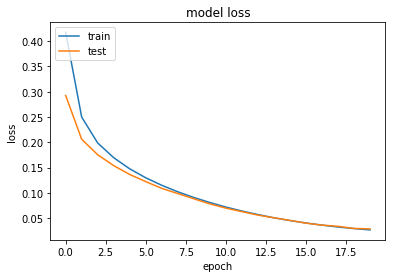

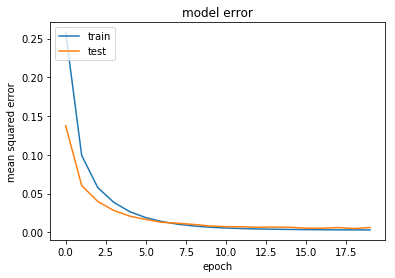

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3564 samples, validate on 648 samples
Epoch 1/20
3564/3564 [==============================] - 0s 101us/step - loss: 0.2477 - mean_squared_error: 0.0825 - val_loss: 0.2935 - val_mean_squared_error: 0.1365
Epoch 2/20
3564/3564 [==============================] - 0s 44us/step - loss: 0.1855 - mean_squared_error: 0.0368 - val_loss: 0.2306 - val_mean_squared_error: 0.0903
Epoch 3/20
3564/3564 [==============================] - 0s 38us/step - loss: 0.1547 - mean_squared_error: 0.0226 - val_loss: 0.1891 - val_mean_squared_error: 

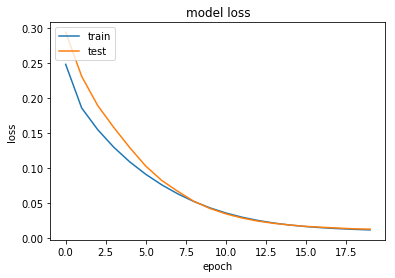

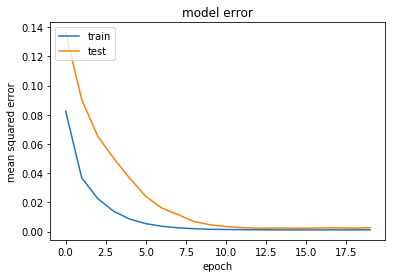

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5970 samples, validate on 1050 samples
Epoch 1/20
5970/5970 [==============================] - 0s 80us/step - loss: 0.2451 - mean_squared_error: 0.0803 - val_loss: 0.2069 - val_mean_squared_error: 0.0539
Epoch 2/20
5970/5970 [==============================] - 0s 41us/step - loss: 0.1707 - mean_squared_error: 0.0300 - val_loss: 0.1521 - val_mean_squared_error: 0.0243
Epoch 3/20
5970/5970 [==============================] - 0s 39us/step - loss: 0.1273 - mean_squared_error: 0.0121 - val_loss: 0.1127 - val_mean_squared_error: 

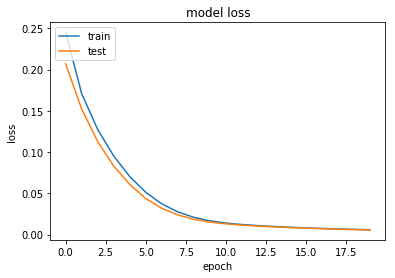

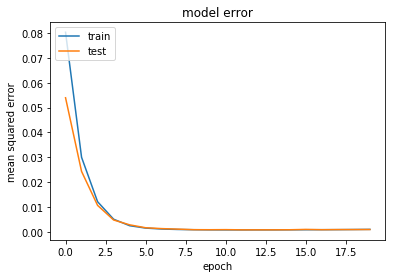

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 5970 samples, validate on 1050 samples
Epoch 1/20
5970/5970 [==============================] - 0s 78us/step - loss: 0.1902 - mean_squared_error: 0.0382 - val_loss: 0.1657 - val_mean_squared_error: 0.0291
Epoch 2/20
5970/5970 [==============================] - 0s 42us/step - loss: 0.1380 - mean_squared_error: 0.0157 - val_loss: 0.1217 - val_mean_squared_error: 0.0138
Epoch 3/20
5970/5970 [==============================] - 0s 41us/step - loss: 0.1018 - mean_squared_error: 0.0070 - val_loss: 0.0893 - val_mean_squared_error: 

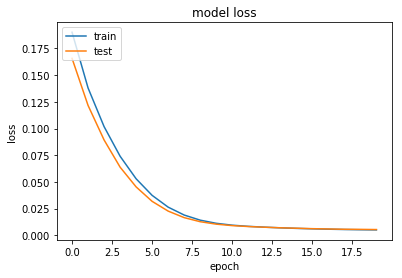

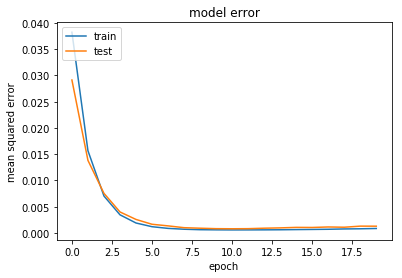

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2388 samples, validate on 420 samples
Epoch 1/20
2388/2388 [==============================] - 0s 130us/step - loss: 0.3544 - mean_squared_error: 0.2015 - val_loss: 0.3080 - val_mean_squared_error: 0.1603
Epoch 2/20
2388/2388 [==============================] - 0s 44us/step - loss: 0.2230 - mean_squared_error: 0.0802 - val_loss: 0.2032 - val_mean_squared_error: 0.0661
Epoch 3/20
2388/2388 [==============================] - 0s 41us/step - loss: 0.1713 - mean_squared_error: 0.0399 - val_loss: 0.1618 - val_mean_squared_error: 

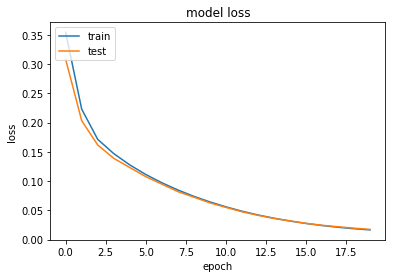

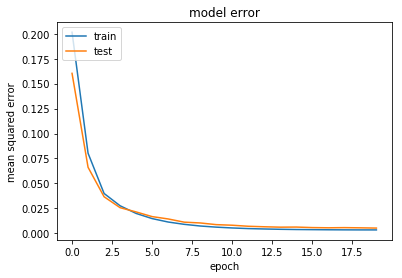

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3582 samples, validate on 630 samples
Epoch 1/20
3582/3582 [==============================] - 0s 97us/step - loss: 0.2480 - mean_squared_error: 0.0757 - val_loss: 0.2308 - val_mean_squared_error: 0.0670
Epoch 2/20
3582/3582 [==============================] - 0s 47us/step - loss: 0.1959 - mean_squared_error: 0.0402 - val_loss: 0.2010 - val_mean_squared_error: 0.0538
Epoch 3/20
3582/3582 [==============================] - 0s 42us/step - loss: 0.1634 - mean_squared_error: 0.0244 - val_loss: 0.1687 - val_mean_squared_error: 0

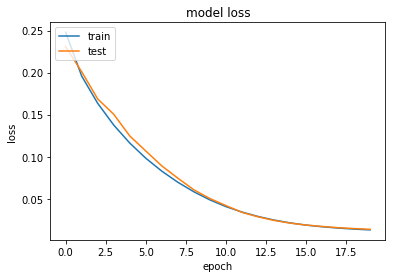

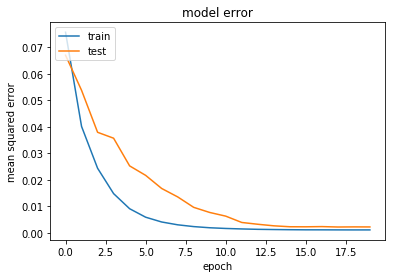

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6000 samples, validate on 1020 samples
Epoch 1/20
6000/6000 [==============================] - 0s 74us/step - loss: 0.3247 - mean_squared_error: 0.1652 - val_loss: 0.2265 - val_mean_squared_error: 0.0791
Epoch 2/20
6000/6000 [==============================] - 0s 41us/step - loss: 0.1677 - mean_squared_error: 0.0336 - val_loss: 0.1528 - val_mean_squared_error: 0.0322
Epoch 3/20
6000/6000 [==============================] - 0s 39us/step - loss: 0.1224 - mean_squared_error: 0.0144 - val_loss: 0.1127 - val_mean_squared_error: 

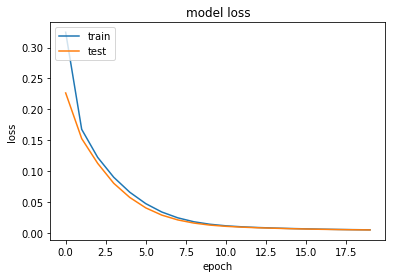

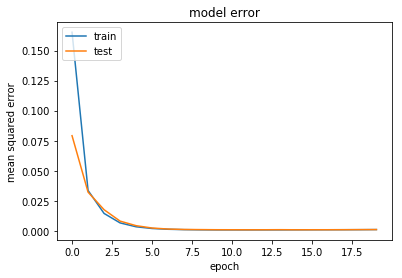

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6000 samples, validate on 1020 samples
Epoch 1/20
6000/6000 [==============================] - 0s 75us/step - loss: 0.1829 - mean_squared_error: 0.0396 - val_loss: 0.1501 - val_mean_squared_error: 0.0232
Epoch 2/20
6000/6000 [==============================] - 0s 40us/step - loss: 0.1286 - mean_squared_error: 0.0165 - val_loss: 0.1077 - val_mean_squared_error: 0.0104
Epoch 3/20
6000/6000 [==============================] - 0s 41us/step - loss: 0.0912 - mean_squared_error: 0.0070 - val_loss: 0.0765 - val_mean_squared_error: 

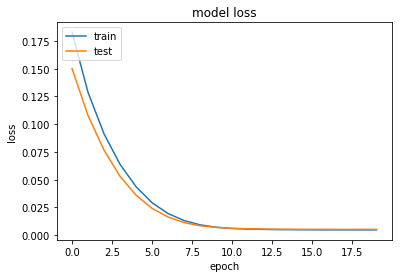

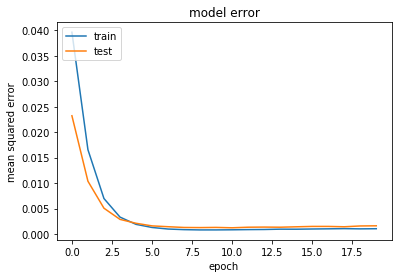

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2400 samples, validate on 408 samples
Epoch 1/20
2400/2400 [==============================] - 0s 131us/step - loss: 0.3081 - mean_squared_error: 0.1422 - val_loss: 0.2450 - val_mean_squared_error: 0.0840
Epoch 2/20
2400/2400 [==============================] - 0s 45us/step - loss: 0.2385 - mean_squared_error: 0.0819 - val_loss: 0.2016 - val_mean_squared_error: 0.0497
Epoch 3/20
2400/2400 [==============================] - 0s 40us/step - loss: 0.2018 - mean_squared_error: 0.0544 - val_loss: 0.1763 - val_mean_squared_error: 

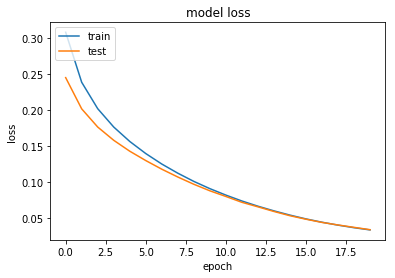

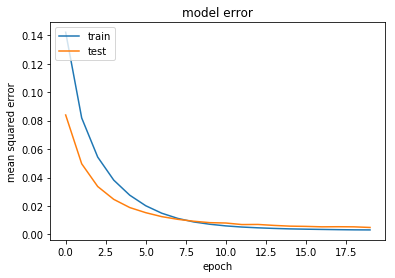

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3600 samples, validate on 612 samples
Epoch 1/20
3600/3600 [==============================] - 0s 98us/step - loss: 0.2058 - mean_squared_error: 0.0495 - val_loss: 0.1985 - val_mean_squared_error: 0.0524
Epoch 2/20
3600/3600 [==============================] - 0s 40us/step - loss: 0.1660 - mean_squared_error: 0.0289 - val_loss: 0.1643 - val_mean_squared_error: 0.0365
Epoch 3/20
3600/3600 [==============================] - 0s 41us/step - loss: 0.1367 - mean_squared_error: 0.0175 - val_loss: 0.1387 - val_mean_squared_error: 0

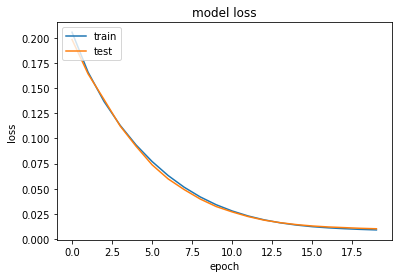

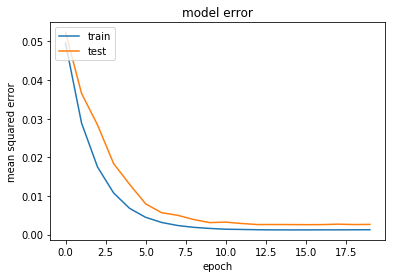

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6030 samples, validate on 990 samples
Epoch 1/20
6030/6030 [==============================] - 0s 77us/step - loss: 0.1968 - mean_squared_error: 0.0397 - val_loss: 0.1673 - val_mean_squared_error: 0.0252
Epoch 2/20
6030/6030 [==============================] - 0s 41us/step - loss: 0.1452 - mean_squared_error: 0.0169 - val_loss: 0.1255 - val_mean_squared_error: 0.0116
Epoch 3/20
6030/6030 [==============================] - 0s 43us/step - loss: 0.1083 - mean_squared_error: 0.0075 - val_loss: 0.0931 - val_mean_squared_error: 0

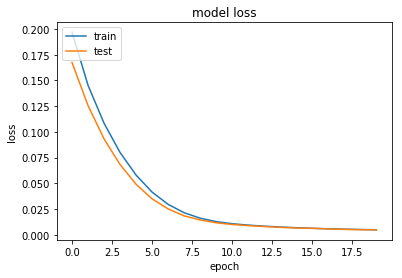

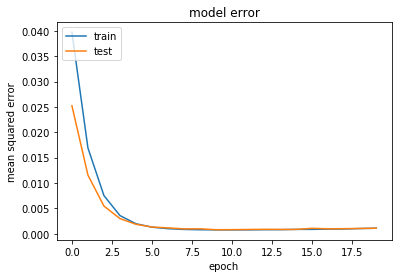

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6030 samples, validate on 990 samples
Epoch 1/20
6030/6030 [==============================] - 0s 76us/step - loss: 0.2324 - mean_squared_error: 0.0687 - val_loss: 0.1760 - val_mean_squared_error: 0.0259
Epoch 2/20
6030/6030 [==============================] - 0s 43us/step - loss: 0.1683 - mean_squared_error: 0.0314 - val_loss: 0.1371 - val_mean_squared_error: 0.0139
Epoch 3/20
6030/6030 [==============================] - 0s 39us/step - loss: 0.1242 - mean_squared_error: 0.0137 - val_loss: 0.1064 - val_mean_squared_error: 0

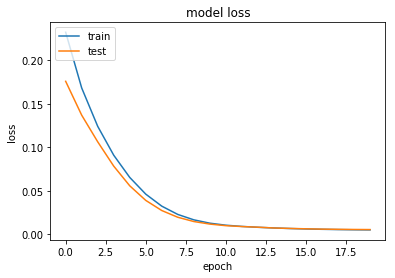

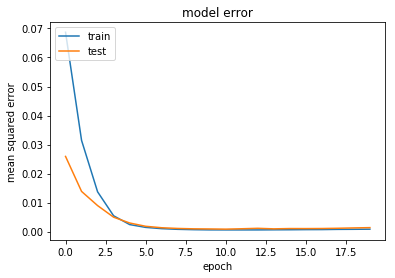

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2412 samples, validate on 396 samples
Epoch 1/20
2412/2412 [==============================] - 0s 123us/step - loss: 0.6445 - mean_squared_error: 0.4837 - val_loss: 0.7036 - val_mean_squared_error: 0.5462
Epoch 2/20
2412/2412 [==============================] - 0s 47us/step - loss: 0.3409 - mean_squared_error: 0.1868 - val_loss: 0.3845 - val_mean_squared_error: 0.2342
Epoch 3/20
2412/2412 [==============================] - 0s 48us/step - loss: 0.2267 - mean_squared_error: 0.0806 - val_loss: 0.2507 - val_mean_squared_error: 

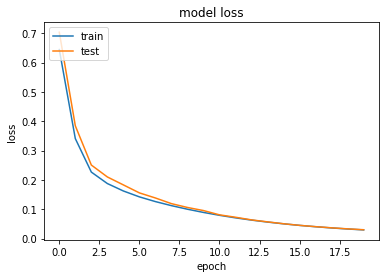

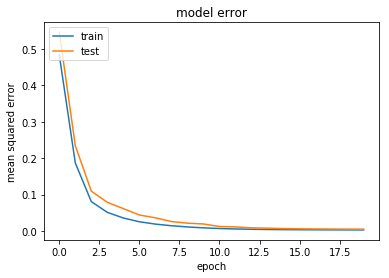

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3618 samples, validate on 594 samples
Epoch 1/20
3618/3618 [==============================] - 0s 97us/step - loss: 0.2139 - mean_squared_error: 0.0505 - val_loss: 0.1948 - val_mean_squared_error: 0.0414
Epoch 2/20
3618/3618 [==============================] - 0s 45us/step - loss: 0.1735 - mean_squared_error: 0.0291 - val_loss: 0.1612 - val_mean_squared_error: 0.0262
Epoch 3/20
3618/3618 [==============================] - 0s 44us/step - loss: 0.1441 - mean_squared_error: 0.0178 - val_loss: 0.1351 - val_mean_squared_error: 0

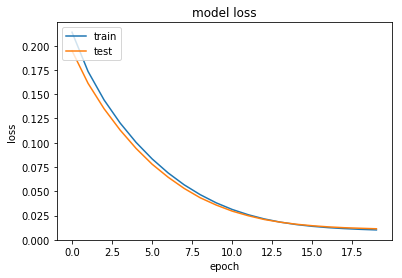

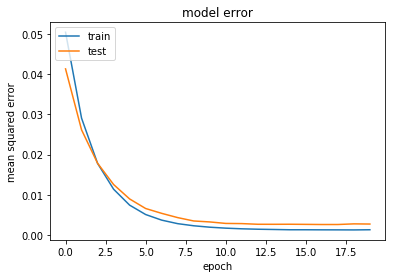

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6060 samples, validate on 960 samples
Epoch 1/20
6060/6060 [==============================] - 0s 75us/step - loss: 0.2012 - mean_squared_error: 0.0516 - val_loss: 0.1899 - val_mean_squared_error: 0.0550
Epoch 2/20
6060/6060 [==============================] - 0s 43us/step - loss: 0.1429 - mean_squared_error: 0.0221 - val_loss: 0.1310 - val_mean_squared_error: 0.0243
Epoch 3/20
6060/6060 [==============================] - 0s 39us/step - loss: 0.1041 - mean_squared_error: 0.0102 - val_loss: 0.0935 - val_mean_squared_error: 0

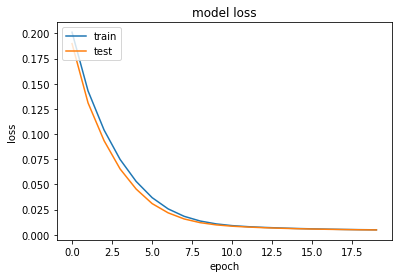

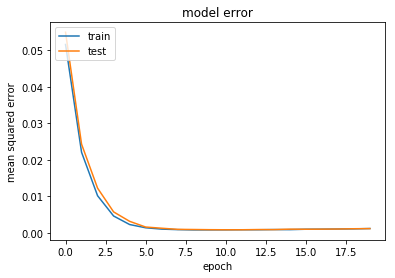

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6060 samples, validate on 960 samples
Epoch 1/20
6060/6060 [==============================] - 0s 81us/step - loss: 0.1974 - mean_squared_error: 0.0415 - val_loss: 0.1733 - val_mean_squared_error: 0.0318
Epoch 2/20
6060/6060 [==============================] - 0s 56us/step - loss: 0.1463 - mean_squared_error: 0.0184 - val_loss: 0.1299 - val_mean_squared_error: 0.0156
Epoch 3/20
6060/6060 [==============================] - 0s 48us/step - loss: 0.1096 - mean_squared_error: 0.0080 - val_loss: 0.0977 - val_mean_squared_error: 0

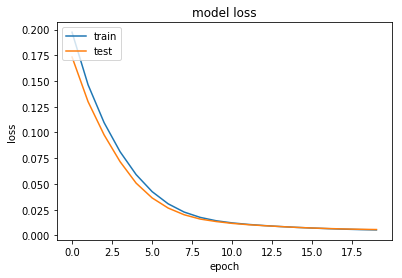

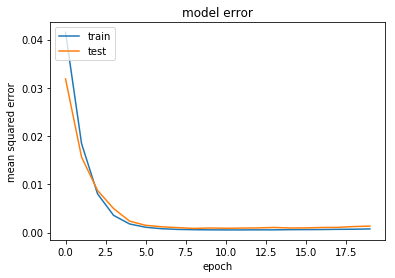

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2424 samples, validate on 384 samples
Epoch 1/20
2424/2424 [==============================] - 0s 152us/step - loss: 0.3095 - mean_squared_error: 0.1457 - val_loss: 0.2675 - val_mean_squared_error: 0.1101
Epoch 2/20
2424/2424 [==============================] - 0s 43us/step - loss: 0.2379 - mean_squared_error: 0.0862 - val_loss: 0.2417 - val_mean_squared_error: 0.0958
Epoch 3/20
2424/2424 [==============================] - 0s 39us/step - loss: 0.2005 - mean_squared_error: 0.0601 - val_loss: 0.2036 - val_mean_squared_error: 

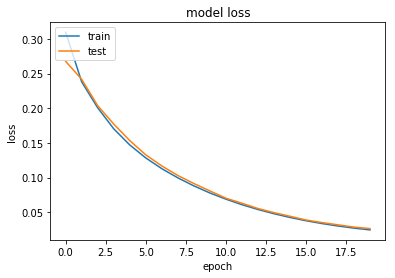

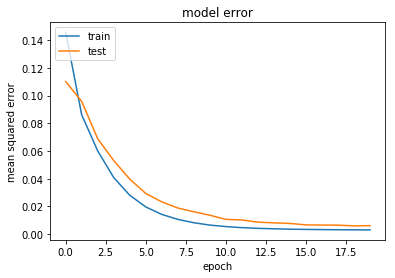

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3636 samples, validate on 576 samples
Epoch 1/20
3636/3636 [==============================] - 0s 94us/step - loss: 0.2218 - mean_squared_error: 0.0670 - val_loss: 0.1981 - val_mean_squared_error: 0.0524
Epoch 2/20
3636/3636 [==============================] - 0s 45us/step - loss: 0.1593 - mean_squared_error: 0.0230 - val_loss: 0.1563 - val_mean_squared_error: 0.0298
Epoch 3/20
3636/3636 [==============================] - 0s 40us/step - loss: 0.1305 - mean_squared_error: 0.0131 - val_loss: 0.1263 - val_mean_squared_error: 0

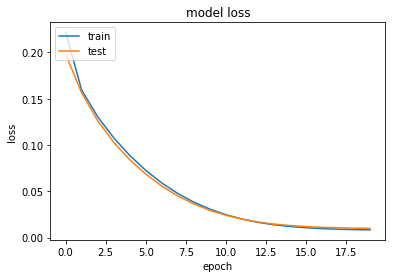

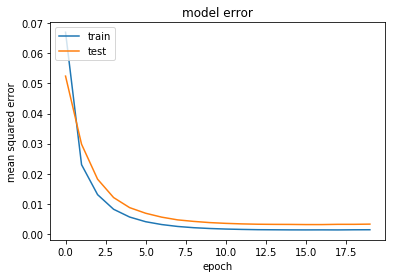

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6090 samples, validate on 930 samples
Epoch 1/20
6090/6090 [==============================] - 0s 75us/step - loss: 0.1838 - mean_squared_error: 0.0323 - val_loss: 0.1566 - val_mean_squared_error: 0.0225
Epoch 2/20
6090/6090 [==============================] - 0s 41us/step - loss: 0.1336 - mean_squared_error: 0.0151 - val_loss: 0.1164 - val_mean_squared_error: 0.0135
Epoch 3/20
6090/6090 [==============================] - 0s 38us/step - loss: 0.0971 - mean_squared_error: 0.0079 - val_loss: 0.0833 - val_mean_squared_error: 0

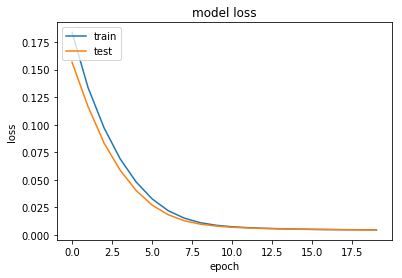

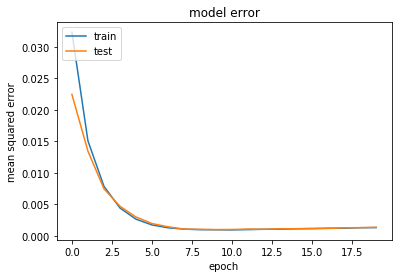

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6090 samples, validate on 930 samples
Epoch 1/20
6090/6090 [==============================] - 0s 73us/step - loss: 0.2193 - mean_squared_error: 0.0599 - val_loss: 0.1931 - val_mean_squared_error: 0.0490
Epoch 2/20
6090/6090 [==============================] - 0s 40us/step - loss: 0.1503 - mean_squared_error: 0.0207 - val_loss: 0.1355 - val_mean_squared_error: 0.0209
Epoch 3/20
6090/6090 [==============================] - 0s 41us/step - loss: 0.1098 - mean_squared_error: 0.0089 - val_loss: 0.0985 - val_mean_squared_error: 0

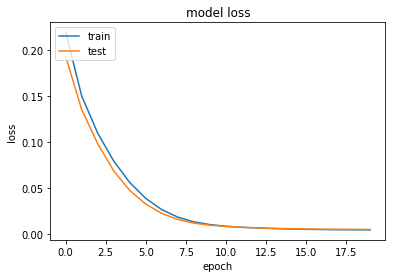

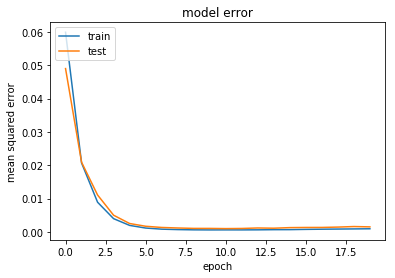

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2436 samples, validate on 372 samples
Epoch 1/20
2436/2436 [==============================] - 0s 125us/step - loss: 0.2776 - mean_squared_error: 0.1180 - val_loss: 0.3196 - val_mean_squared_error: 0.1660
Epoch 2/20
2436/2436 [==============================] - 0s 41us/step - loss: 0.1976 - mean_squared_error: 0.0496 - val_loss: 0.2346 - val_mean_squared_error: 0.0929
Epoch 3/20
2436/2436 [==============================] - 0s 39us/step - loss: 0.1699 - mean_squared_error: 0.0339 - val_loss: 0.2075 - val_mean_squared_error: 

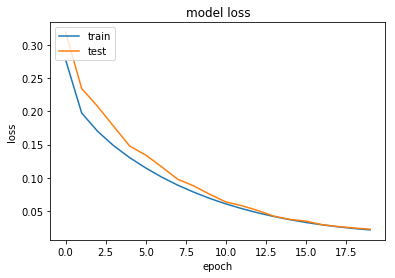

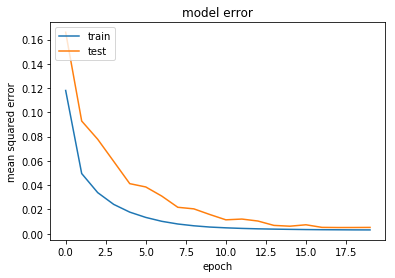

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3654 samples, validate on 558 samples
Epoch 1/20
3654/3654 [==============================] - 0s 100us/step - loss: 0.1832 - mean_squared_error: 0.0387 - val_loss: 0.1712 - val_mean_squared_error: 0.0368
Epoch 2/20
3654/3654 [==============================] - 0s 42us/step - loss: 0.1473 - mean_squared_error: 0.0217 - val_loss: 0.1375 - val_mean_squared_error: 0.0210
Epoch 3/20
3654/3654 [==============================] - 0s 39us/step - loss: 0.1208 - mean_squared_error: 0.0127 - val_loss: 0.1120 - val_mean_squared_error: 

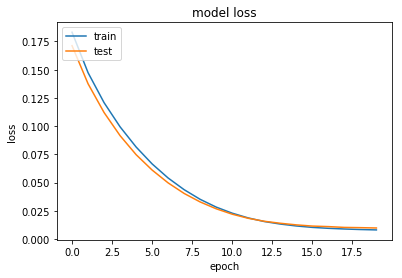

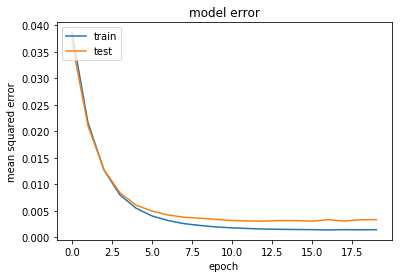

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6120 samples, validate on 900 samples
Epoch 1/20
6120/6120 [==============================] - 0s 76us/step - loss: 0.2187 - mean_squared_error: 0.0646 - val_loss: 0.1848 - val_mean_squared_error: 0.0450
Epoch 2/20
6120/6120 [==============================] - 0s 41us/step - loss: 0.1489 - mean_squared_error: 0.0229 - val_loss: 0.1354 - val_mean_squared_error: 0.0234
Epoch 3/20
6120/6120 [==============================] - 0s 38us/step - loss: 0.1087 - mean_squared_error: 0.0098 - val_loss: 0.0972 - val_mean_squared_error: 0

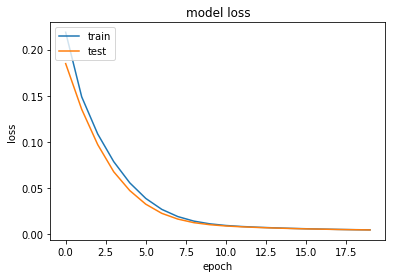

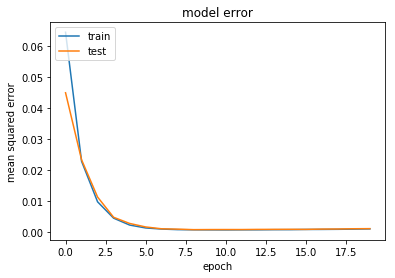

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6120 samples, validate on 900 samples
Epoch 1/20
6120/6120 [==============================] - 0s 77us/step - loss: 0.1856 - mean_squared_error: 0.0379 - val_loss: 0.1512 - val_mean_squared_error: 0.0186
Epoch 2/20
6120/6120 [==============================] - 0s 43us/step - loss: 0.1343 - mean_squared_error: 0.0161 - val_loss: 0.1116 - val_mean_squared_error: 0.0078
Epoch 3/20
6120/6120 [==============================] - 0s 41us/step - loss: 0.0975 - mean_squared_error: 0.0068 - val_loss: 0.0814 - val_mean_squared_error: 0

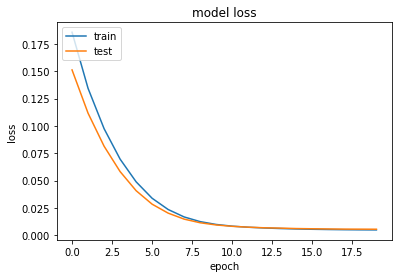

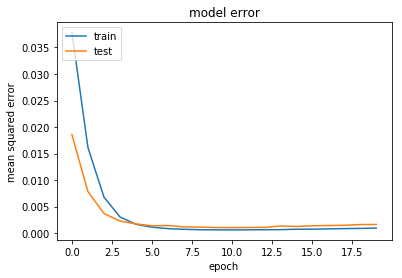

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2448 samples, validate on 360 samples
Epoch 1/20
2448/2448 [==============================] - 0s 126us/step - loss: 0.2773 - mean_squared_error: 0.1025 - val_loss: 0.2547 - val_mean_squared_error: 0.0860
Epoch 2/20
2448/2448 [==============================] - 0s 44us/step - loss: 0.2386 - mean_squared_error: 0.0751 - val_loss: 0.2193 - val_mean_squared_error: 0.0613
Epoch 3/20
2448/2448 [==============================] - 0s 41us/step - loss: 0.2090 - mean_squared_error: 0.0559 - val_loss: 0.1939 - val_mean_squared_error: 

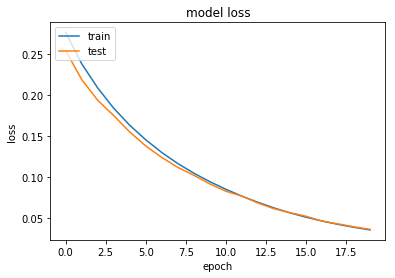

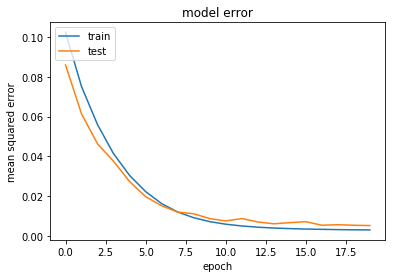

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3672 samples, validate on 540 samples
Epoch 1/20
3672/3672 [==============================] - 0s 97us/step - loss: 0.2161 - mean_squared_error: 0.0532 - val_loss: 0.2019 - val_mean_squared_error: 0.0487
Epoch 2/20
3672/3672 [==============================] - 0s 44us/step - loss: 0.1730 - mean_squared_error: 0.0283 - val_loss: 0.1646 - val_mean_squared_error: 0.0290
Epoch 3/20
3672/3672 [==============================] - 0s 39us/step - loss: 0.1428 - mean_squared_error: 0.0156 - val_loss: 0.1355 - val_mean_squared_error: 0

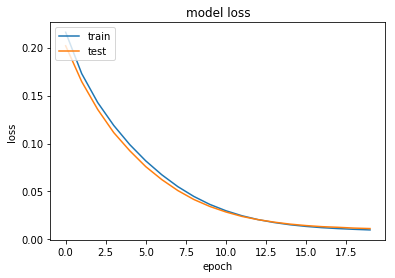

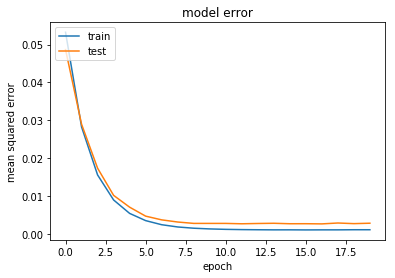

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6150 samples, validate on 870 samples
Epoch 1/20
6150/6150 [==============================] - 0s 74us/step - loss: 0.2602 - mean_squared_error: 0.1083 - val_loss: 0.1861 - val_mean_squared_error: 0.0473
Epoch 2/20
6150/6150 [==============================] - 0s 46us/step - loss: 0.1437 - mean_squared_error: 0.0201 - val_loss: 0.1308 - val_mean_squared_error: 0.0226
Epoch 3/20
6150/6150 [==============================] - 0s 40us/step - loss: 0.1040 - mean_squared_error: 0.0094 - val_loss: 0.0904 - val_mean_squared_error: 0

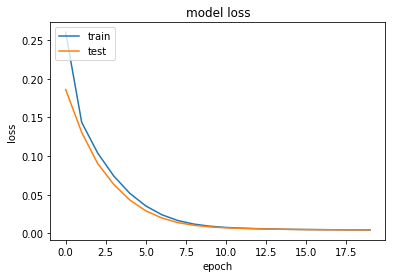

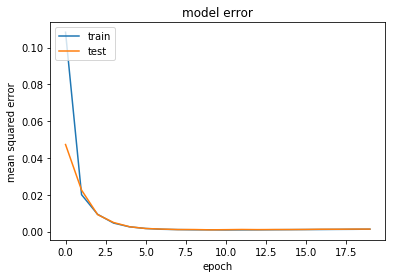

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6150 samples, validate on 870 samples
Epoch 1/20
6150/6150 [==============================] - 0s 76us/step - loss: 0.2918 - mean_squared_error: 0.1333 - val_loss: 0.2135 - val_mean_squared_error: 0.0673
Epoch 2/20
6150/6150 [==============================] - 0s 42us/step - loss: 0.1639 - mean_squared_error: 0.0308 - val_loss: 0.1508 - val_mean_squared_error: 0.0314
Epoch 3/20
6150/6150 [==============================] - 0s 42us/step - loss: 0.1189 - mean_squared_error: 0.0124 - val_loss: 0.1071 - val_mean_squared_error: 0

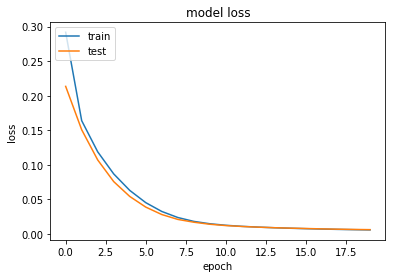

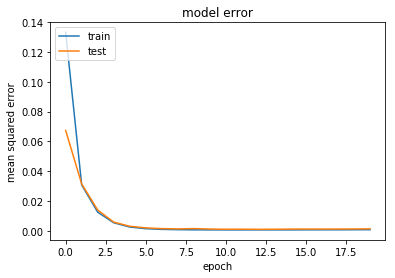

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2460 samples, validate on 348 samples
Epoch 1/20
2460/2460 [==============================] - 0s 122us/step - loss: 0.2232 - mean_squared_error: 0.0636 - val_loss: 0.2154 - val_mean_squared_error: 0.0632
Epoch 2/20
2460/2460 [==============================] - 0s 45us/step - loss: 0.1946 - mean_squared_error: 0.0486 - val_loss: 0.1903 - val_mean_squared_error: 0.0510
Epoch 3/20
2460/2460 [==============================] - 0s 39us/step - loss: 0.1713 - mean_squared_error: 0.0378 - val_loss: 0.1689 - val_mean_squared_error: 

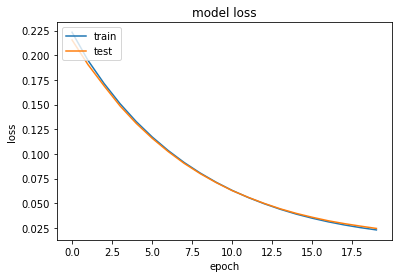

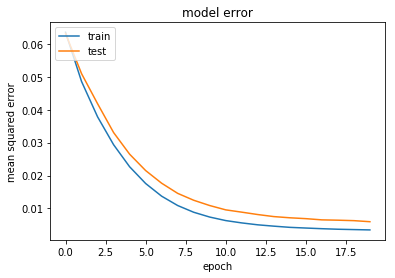

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3690 samples, validate on 522 samples
Epoch 1/20
3690/3690 [==============================] - 0s 100us/step - loss: 0.2239 - mean_squared_error: 0.0698 - val_loss: 0.1963 - val_mean_squared_error: 0.0511
Epoch 2/20
3690/3690 [==============================] - 0s 44us/step - loss: 0.1747 - mean_squared_error: 0.0377 - val_loss: 0.1553 - val_mean_squared_error: 0.0268
Epoch 3/20
3690/3690 [==============================] - 0s 39us/step - loss: 0.1411 - mean_squared_error: 0.0206 - val_loss: 0.1263 - val_mean_squared_error: 

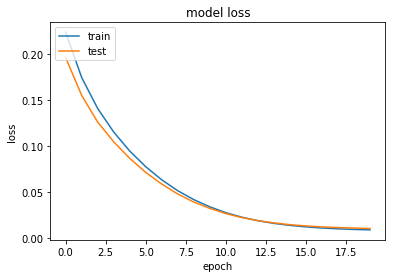

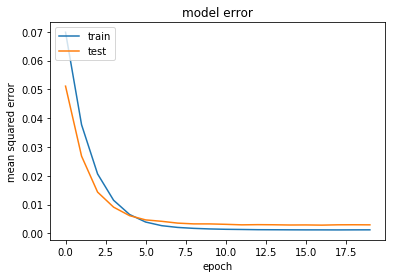

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6180 samples, validate on 840 samples
Epoch 1/20
6180/6180 [==============================] - 0s 72us/step - loss: 0.2028 - mean_squared_error: 0.0415 - val_loss: 0.1649 - val_mean_squared_error: 0.0202
Epoch 2/20
6180/6180 [==============================] - 0s 43us/step - loss: 0.1494 - mean_squared_error: 0.0199 - val_loss: 0.1252 - val_mean_squared_error: 0.0107
Epoch 3/20
6180/6180 [==============================] - 0s 40us/step - loss: 0.1107 - mean_squared_error: 0.0098 - val_loss: 0.0938 - val_mean_squared_error: 0

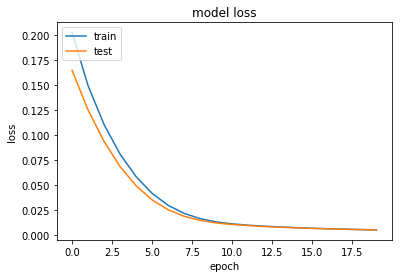

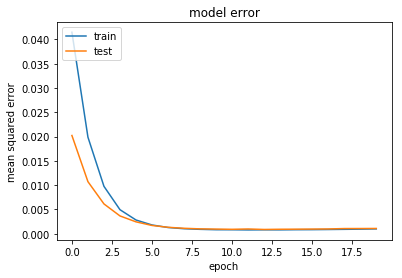

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6180 samples, validate on 840 samples
Epoch 1/20
6180/6180 [==============================] - 0s 73us/step - loss: 0.2534 - mean_squared_error: 0.1033 - val_loss: 0.1735 - val_mean_squared_error: 0.0373
Epoch 2/20
6180/6180 [==============================] - 0s 40us/step - loss: 0.1462 - mean_squared_error: 0.0246 - val_loss: 0.1316 - val_mean_squared_error: 0.0248
Epoch 3/20
6180/6180 [==============================] - 0s 39us/step - loss: 0.1038 - mean_squared_error: 0.0105 - val_loss: 0.0948 - val_mean_squared_error: 0

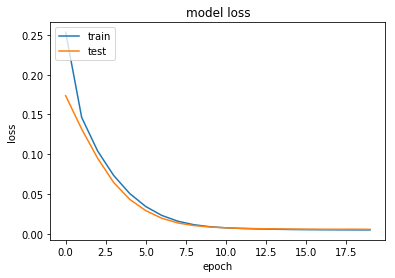

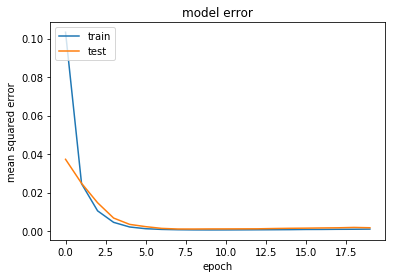

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2472 samples, validate on 336 samples
Epoch 1/20
2472/2472 [==============================] - 0s 121us/step - loss: 0.2689 - mean_squared_error: 0.1133 - val_loss: 0.2192 - val_mean_squared_error: 0.0703
Epoch 2/20
2472/2472 [==============================] - 0s 46us/step - loss: 0.1814 - mean_squared_error: 0.0386 - val_loss: 0.1750 - val_mean_squared_error: 0.0392
Epoch 3/20
2472/2472 [==============================] - 0s 42us/step - loss: 0.1526 - mean_squared_error: 0.0232 - val_loss: 0.1527 - val_mean_squared_error: 

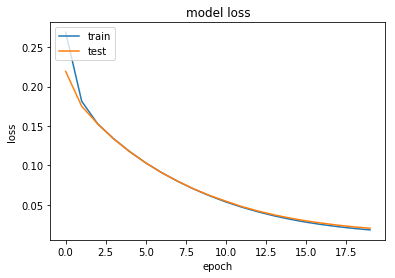

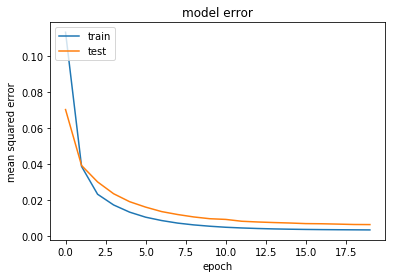

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3708 samples, validate on 504 samples
Epoch 1/20
3708/3708 [==============================] - 0s 94us/step - loss: 0.3040 - mean_squared_error: 0.1342 - val_loss: 0.2790 - val_mean_squared_error: 0.1170
Epoch 2/20
3708/3708 [==============================] - 0s 40us/step - loss: 0.2077 - mean_squared_error: 0.0537 - val_loss: 0.2093 - val_mean_squared_error: 0.0636
Epoch 3/20
3708/3708 [==============================] - 0s 38us/step - loss: 0.1668 - mean_squared_error: 0.0291 - val_loss: 0.1632 - val_mean_squared_error: 0

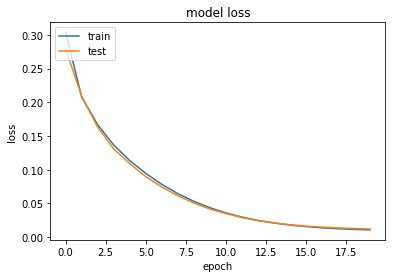

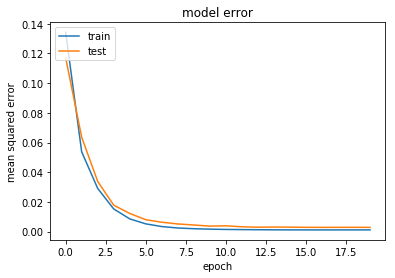

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6210 samples, validate on 810 samples
Epoch 1/20
6210/6210 [==============================] - 0s 77us/step - loss: 0.3887 - mean_squared_error: 0.2029 - val_loss: 0.2525 - val_mean_squared_error: 0.0754
Epoch 2/20
6210/6210 [==============================] - 0s 42us/step - loss: 0.2293 - mean_squared_error: 0.0615 - val_loss: 0.1885 - val_mean_squared_error: 0.0311
Epoch 3/20
6210/6210 [==============================] - 0s 38us/step - loss: 0.1672 - mean_squared_error: 0.0208 - val_loss: 0.1498 - val_mean_squared_error: 0

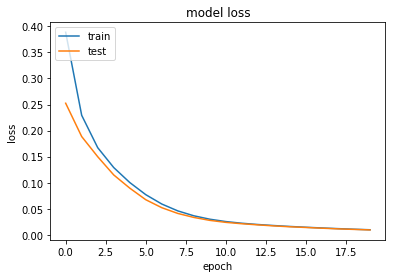

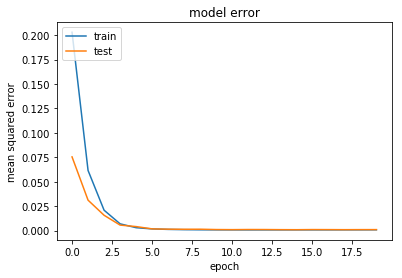

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6210 samples, validate on 810 samples
Epoch 1/20
6210/6210 [==============================] - 0s 73us/step - loss: 0.3501 - mean_squared_error: 0.1813 - val_loss: 0.2083 - val_mean_squared_error: 0.0500
Epoch 2/20
6210/6210 [==============================] - 0s 42us/step - loss: 0.1750 - mean_squared_error: 0.0300 - val_loss: 0.1566 - val_mean_squared_error: 0.0256
Epoch 3/20
6210/6210 [==============================] - 0s 39us/step - loss: 0.1304 - mean_squared_error: 0.0127 - val_loss: 0.1113 - val_mean_squared_error: 0

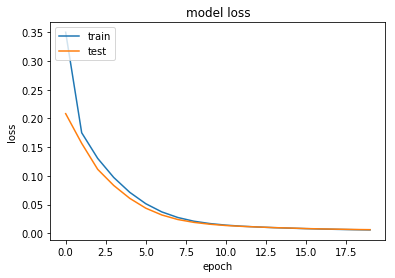

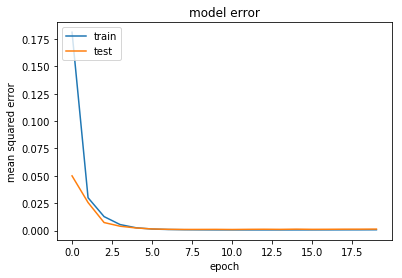

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2484 samples, validate on 324 samples
Epoch 1/20
2484/2484 [==============================] - 0s 134us/step - loss: 0.2925 - mean_squared_error: 0.1266 - val_loss: 0.2209 - val_mean_squared_error: 0.0605
Epoch 2/20
2484/2484 [==============================] - 0s 44us/step - loss: 0.2114 - mean_squared_error: 0.0563 - val_loss: 0.1930 - val_mean_squared_error: 0.0437
Epoch 3/20
2484/2484 [==============================] - 0s 40us/step - loss: 0.1811 - mean_squared_error: 0.0372 - val_loss: 0.1672 - val_mean_squared_error: 

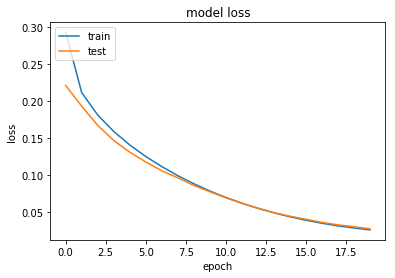

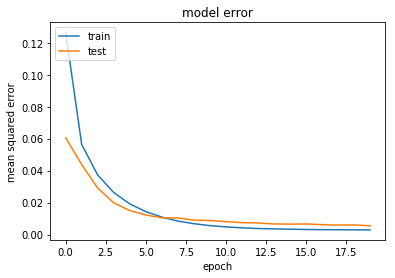

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3726 samples, validate on 486 samples
Epoch 1/20
3726/3726 [==============================] - 0s 98us/step - loss: 0.2118 - mean_squared_error: 0.0566 - val_loss: 0.1878 - val_mean_squared_error: 0.0430
Epoch 2/20
3726/3726 [==============================] - 0s 51us/step - loss: 0.1678 - mean_squared_error: 0.0321 - val_loss: 0.1515 - val_mean_squared_error: 0.0253
Epoch 3/20
3726/3726 [==============================] - 0s 42us/step - loss: 0.1368 - mean_squared_error: 0.0193 - val_loss: 0.1254 - val_mean_squared_error: 0

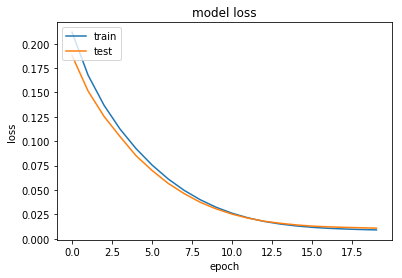

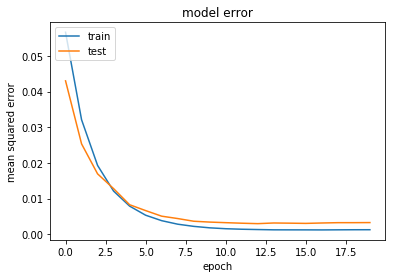

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6240 samples, validate on 780 samples
Epoch 1/20
6240/6240 [==============================] - 0s 74us/step - loss: 0.2553 - mean_squared_error: 0.1005 - val_loss: 0.1771 - val_mean_squared_error: 0.0349
Epoch 2/20
6240/6240 [==============================] - 0s 42us/step - loss: 0.1551 - mean_squared_error: 0.0266 - val_loss: 0.1339 - val_mean_squared_error: 0.0193
Epoch 3/20
6240/6240 [==============================] - 0s 41us/step - loss: 0.1138 - mean_squared_error: 0.0123 - val_loss: 0.0990 - val_mean_squared_error: 0

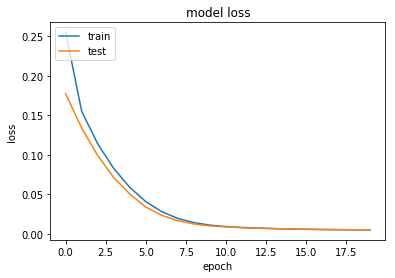

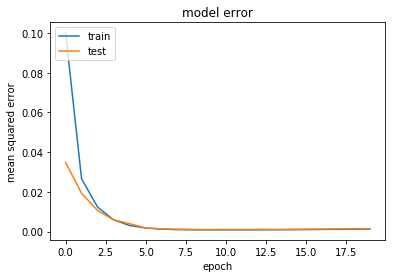

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6240 samples, validate on 780 samples
Epoch 1/20
6240/6240 [==============================] - 0s 77us/step - loss: 0.2442 - mean_squared_error: 0.0905 - val_loss: 0.1977 - val_mean_squared_error: 0.0586
Epoch 2/20
6240/6240 [==============================] - 0s 39us/step - loss: 0.1569 - mean_squared_error: 0.0318 - val_loss: 0.1398 - val_mean_squared_error: 0.0288
Epoch 3/20
6240/6240 [==============================] - 0s 38us/step - loss: 0.1108 - mean_squared_error: 0.0129 - val_loss: 0.0995 - val_mean_squared_error: 0

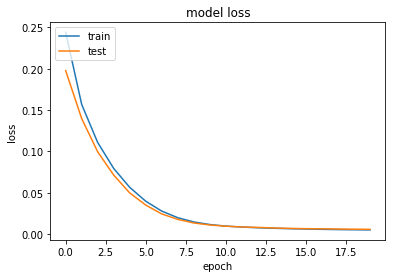

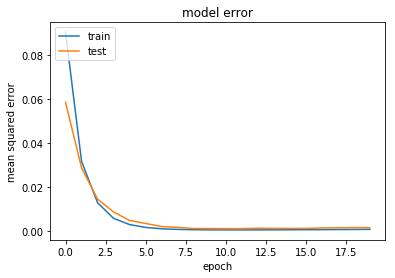

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2496 samples, validate on 312 samples
Epoch 1/20
2496/2496 [==============================] - 0s 129us/step - loss: 0.2177 - mean_squared_error: 0.0676 - val_loss: 0.2144 - val_mean_squared_error: 0.0712
Epoch 2/20
2496/2496 [==============================] - 0s 42us/step - loss: 0.1807 - mean_squared_error: 0.0436 - val_loss: 0.1792 - val_mean_squared_error: 0.0482
Epoch 3/20
2496/2496 [==============================] - 0s 38us/step - loss: 0.1536 - mean_squared_error: 0.0284 - val_loss: 0.1526 - val_mean_squared_error: 

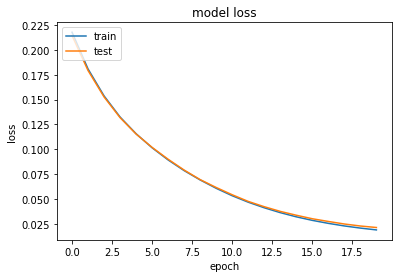

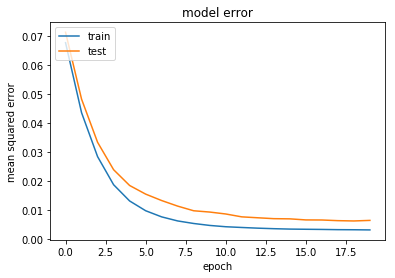

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3744 samples, validate on 468 samples
Epoch 1/20
3744/3744 [==============================] - 0s 93us/step - loss: 0.5071 - mean_squared_error: 0.3487 - val_loss: 0.4738 - val_mean_squared_error: 0.3210
Epoch 2/20
3744/3744 [==============================] - 0s 44us/step - loss: 0.2539 - mean_squared_error: 0.1074 - val_loss: 0.2358 - val_mean_squared_error: 0.0965
Epoch 3/20
3744/3744 [==============================] - 0s 40us/step - loss: 0.1774 - mean_squared_error: 0.0456 - val_loss: 0.1710 - val_mean_squared_error: 0

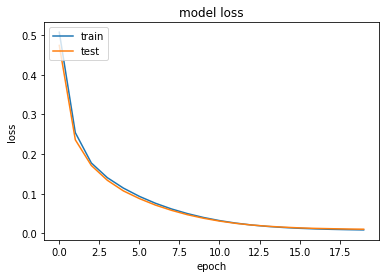

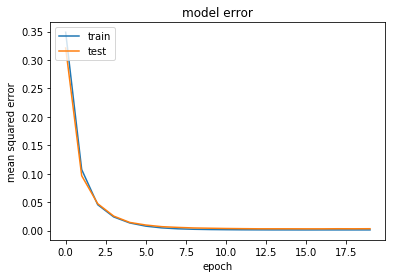

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6270 samples, validate on 750 samples
Epoch 1/20
6270/6270 [==============================] - 0s 73us/step - loss: 0.1822 - mean_squared_error: 0.0391 - val_loss: 0.1490 - val_mean_squared_error: 0.0235
Epoch 2/20
6270/6270 [==============================] - 0s 39us/step - loss: 0.1246 - mean_squared_error: 0.0150 - val_loss: 0.1058 - val_mean_squared_error: 0.0115
Epoch 3/20
6270/6270 [==============================] - 0s 38us/step - loss: 0.0881 - mean_squared_error: 0.0070 - val_loss: 0.0743 - val_mean_squared_error: 0

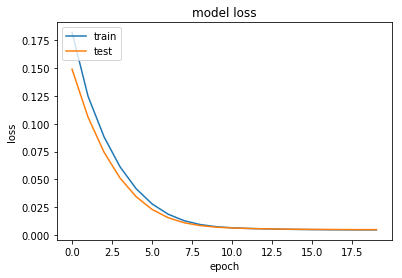

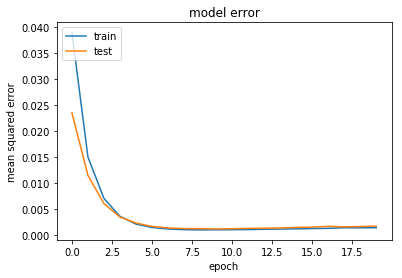

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6270 samples, validate on 750 samples
Epoch 1/20
6270/6270 [==============================] - 0s 76us/step - loss: 0.3476 - mean_squared_error: 0.1718 - val_loss: 0.2343 - val_mean_squared_error: 0.0684
Epoch 2/20
6270/6270 [==============================] - 0s 41us/step - loss: 0.1988 - mean_squared_error: 0.0437 - val_loss: 0.1682 - val_mean_squared_error: 0.0249
Epoch 3/20
6270/6270 [==============================] - 0s 38us/step - loss: 0.1466 - mean_squared_error: 0.0157 - val_loss: 0.1287 - val_mean_squared_error: 0

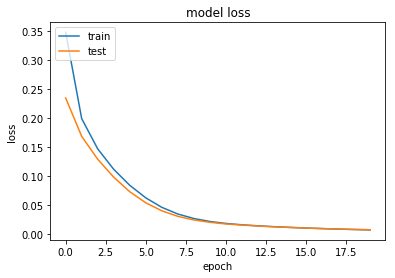

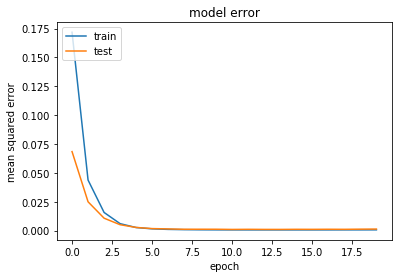

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2508 samples, validate on 300 samples
Epoch 1/20
2508/2508 [==============================] - 0s 119us/step - loss: 0.2345 - mean_squared_error: 0.0804 - val_loss: 0.2094 - val_mean_squared_error: 0.0618
Epoch 2/20
2508/2508 [==============================] - 0s 45us/step - loss: 0.1943 - mean_squared_error: 0.0521 - val_loss: 0.1786 - val_mean_squared_error: 0.0424
Epoch 3/20
2508/2508 [==============================] - 0s 37us/step - loss: 0.1671 - mean_squared_error: 0.0364 - val_loss: 0.1560 - val_mean_squared_error: 

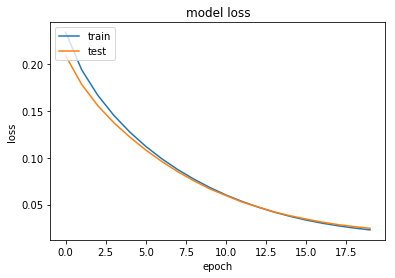

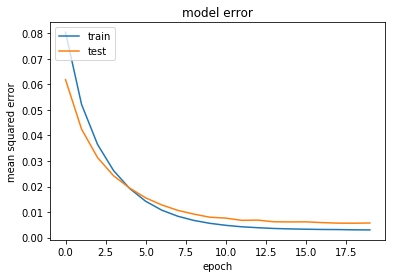

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3762 samples, validate on 450 samples
Epoch 1/20
3762/3762 [==============================] - 0s 95us/step - loss: 0.2015 - mean_squared_error: 0.0434 - val_loss: 0.1885 - val_mean_squared_error: 0.0415
Epoch 2/20
3762/3762 [==============================] - 0s 43us/step - loss: 0.1643 - mean_squared_error: 0.0270 - val_loss: 0.1533 - val_mean_squared_error: 0.0262
Epoch 3/20
3762/3762 [==============================] - 0s 40us/step - loss: 0.1358 - mean_squared_error: 0.0180 - val_loss: 0.1262 - val_mean_squared_error: 0

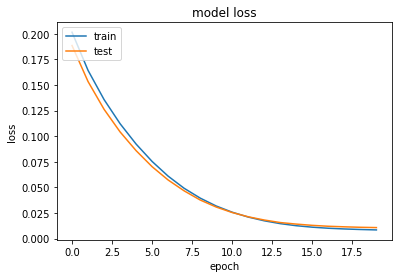

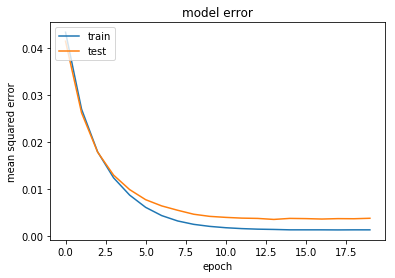

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6300 samples, validate on 720 samples
Epoch 1/20
6300/6300 [==============================] - 0s 73us/step - loss: 0.2015 - mean_squared_error: 0.0501 - val_loss: 0.1708 - val_mean_squared_error: 0.0351
Epoch 2/20
6300/6300 [==============================] - 0s 41us/step - loss: 0.1458 - mean_squared_error: 0.0245 - val_loss: 0.1256 - val_mean_squared_error: 0.0189
Epoch 3/20
6300/6300 [==============================] - 0s 37us/step - loss: 0.1054 - mean_squared_error: 0.0117 - val_loss: 0.0906 - val_mean_squared_error: 0

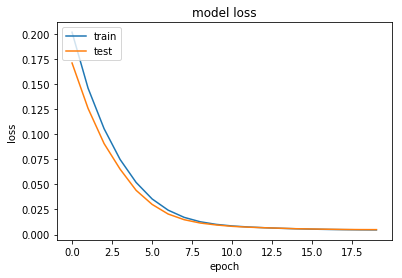

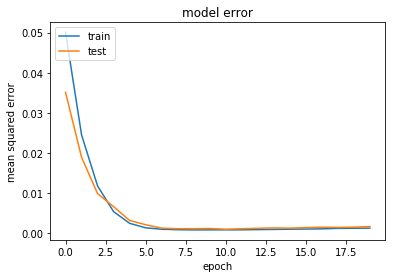

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6300 samples, validate on 720 samples
Epoch 1/20
6300/6300 [==============================] - 0s 75us/step - loss: 0.1883 - mean_squared_error: 0.0420 - val_loss: 0.1635 - val_mean_squared_error: 0.0330
Epoch 2/20
6300/6300 [==============================] - 0s 44us/step - loss: 0.1323 - mean_squared_error: 0.0167 - val_loss: 0.1146 - val_mean_squared_error: 0.0141
Epoch 3/20
6300/6300 [==============================] - 0s 37us/step - loss: 0.0940 - mean_squared_error: 0.0070 - val_loss: 0.0799 - val_mean_squared_error: 0

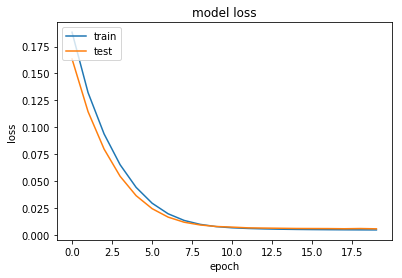

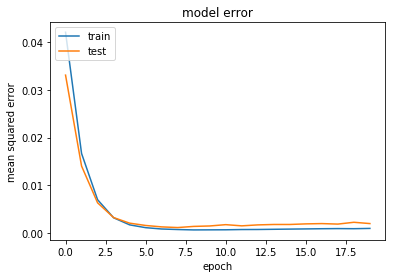

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2520 samples, validate on 288 samples
Epoch 1/20
2520/2520 [==============================] - 0s 118us/step - loss: 0.2837 - mean_squared_error: 0.1243 - val_loss: 0.2652 - val_mean_squared_error: 0.1117
Epoch 2/20
2520/2520 [==============================] - 0s 46us/step - loss: 0.2040 - mean_squared_error: 0.0557 - val_loss: 0.2115 - val_mean_squared_error: 0.0692
Epoch 3/20
2520/2520 [==============================] - 0s 39us/step - loss: 0.1715 - mean_squared_error: 0.0346 - val_loss: 0.1769 - val_mean_squared_error: 

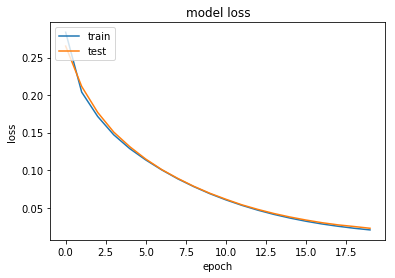

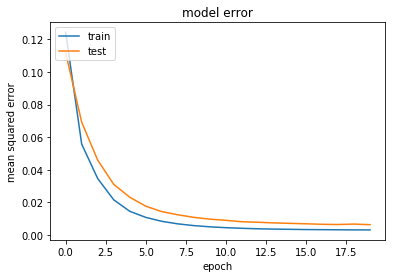

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3780 samples, validate on 432 samples
Epoch 1/20
3780/3780 [==============================] - 0s 99us/step - loss: 0.3194 - mean_squared_error: 0.1538 - val_loss: 0.2356 - val_mean_squared_error: 0.0775
Epoch 2/20
3780/3780 [==============================] - 0s 46us/step - loss: 0.2102 - mean_squared_error: 0.0597 - val_loss: 0.1882 - val_mean_squared_error: 0.0458
Epoch 3/20
3780/3780 [==============================] - 0s 43us/step - loss: 0.1691 - mean_squared_error: 0.0346 - val_loss: 0.1568 - val_mean_squared_error: 0

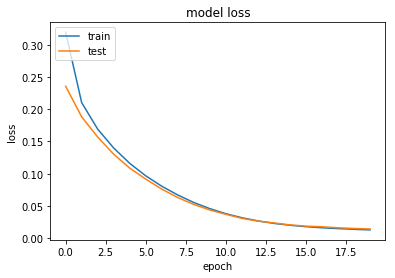

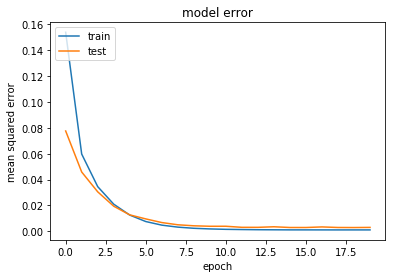

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6330 samples, validate on 690 samples
Epoch 1/20
6330/6330 [==============================] - 0s 72us/step - loss: 0.2300 - mean_squared_error: 0.0731 - val_loss: 0.1729 - val_mean_squared_error: 0.0311
Epoch 2/20
6330/6330 [==============================] - 0s 45us/step - loss: 0.1446 - mean_squared_error: 0.0184 - val_loss: 0.1252 - val_mean_squared_error: 0.0146
Epoch 3/20
6330/6330 [==============================] - 0s 39us/step - loss: 0.1039 - mean_squared_error: 0.0077 - val_loss: 0.0895 - val_mean_squared_error: 0

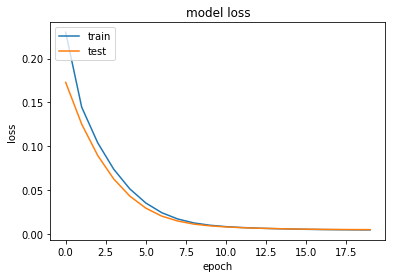

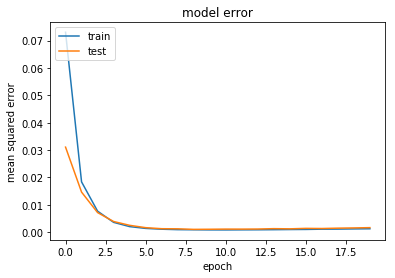

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6330 samples, validate on 690 samples
Epoch 1/20
6330/6330 [==============================] - 0s 72us/step - loss: 0.2295 - mean_squared_error: 0.0675 - val_loss: 0.1759 - val_mean_squared_error: 0.0286
Epoch 2/20
6330/6330 [==============================] - 0s 42us/step - loss: 0.1565 - mean_squared_error: 0.0234 - val_loss: 0.1301 - val_mean_squared_error: 0.0115
Epoch 3/20
6330/6330 [==============================] - 0s 37us/step - loss: 0.1151 - mean_squared_error: 0.0098 - val_loss: 0.0964 - val_mean_squared_error: 0

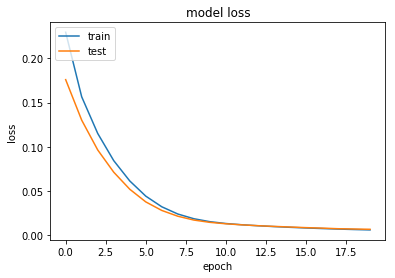

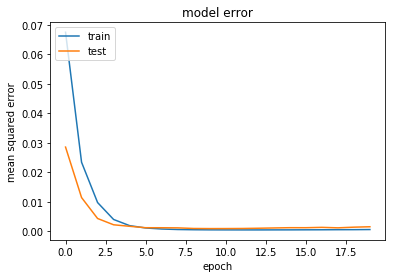

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2532 samples, validate on 276 samples
Epoch 1/20
2532/2532 [==============================] - 0s 122us/step - loss: 0.2359 - mean_squared_error: 0.0667 - val_loss: 0.2164 - val_mean_squared_error: 0.0538
Epoch 2/20
2532/2532 [==============================] - 0s 51us/step - loss: 0.1974 - mean_squared_error: 0.0404 - val_loss: 0.1889 - val_mean_squared_error: 0.0380
Epoch 3/20
2532/2532 [==============================] - 0s 38us/step - loss: 0.1728 - mean_squared_error: 0.0276 - val_loss: 0.1669 - val_mean_squared_error: 

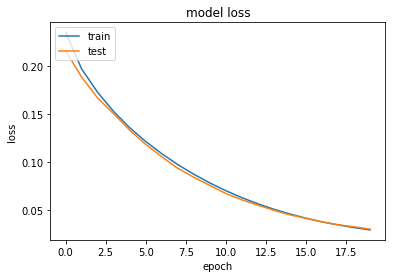

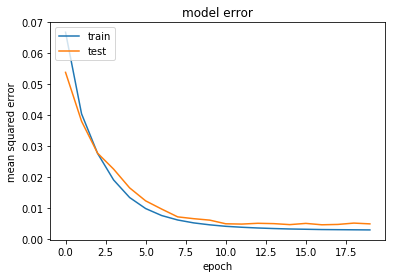

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3798 samples, validate on 414 samples
Epoch 1/20
3798/3798 [==============================] - 0s 93us/step - loss: 0.2237 - mean_squared_error: 0.0607 - val_loss: 0.1974 - val_mean_squared_error: 0.0446
Epoch 2/20
3798/3798 [==============================] - 0s 40us/step - loss: 0.1778 - mean_squared_error: 0.0342 - val_loss: 0.1591 - val_mean_squared_error: 0.0250
Epoch 3/20
3798/3798 [==============================] - 0s 38us/step - loss: 0.1454 - mean_squared_error: 0.0202 - val_loss: 0.1319 - val_mean_squared_error: 0

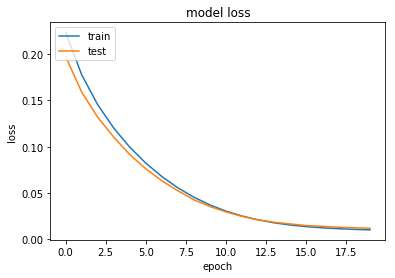

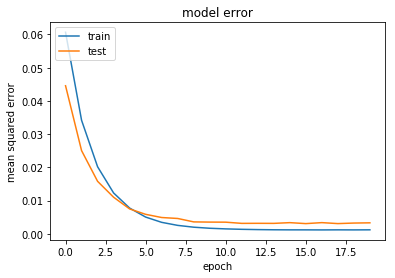

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6360 samples, validate on 660 samples
Epoch 1/20
6360/6360 [==============================] - 0s 74us/step - loss: 0.1667 - mean_squared_error: 0.0306 - val_loss: 0.1478 - val_mean_squared_error: 0.0296
Epoch 2/20
6360/6360 [==============================] - 0s 43us/step - loss: 0.1117 - mean_squared_error: 0.0098 - val_loss: 0.0988 - val_mean_squared_error: 0.0129
Epoch 3/20
6360/6360 [==============================] - 0s 40us/step - loss: 0.0776 - mean_squared_error: 0.0050 - val_loss: 0.0676 - val_mean_squared_error: 0

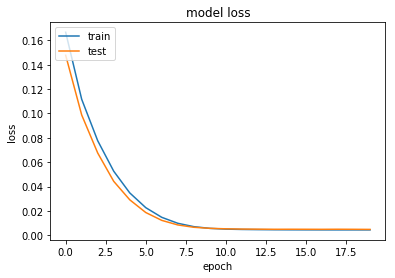

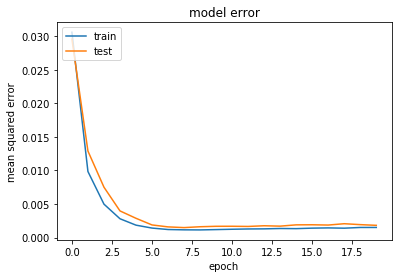

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6360 samples, validate on 660 samples
Epoch 1/20
6360/6360 [==============================] - 0s 70us/step - loss: 0.2592 - mean_squared_error: 0.0951 - val_loss: 0.2157 - val_mean_squared_error: 0.0641
Epoch 2/20
6360/6360 [==============================] - 0s 40us/step - loss: 0.1697 - mean_squared_error: 0.0310 - val_loss: 0.1488 - val_mean_squared_error: 0.0237
Epoch 3/20
6360/6360 [==============================] - 0s 40us/step - loss: 0.1241 - mean_squared_error: 0.0124 - val_loss: 0.1078 - val_mean_squared_error: 0

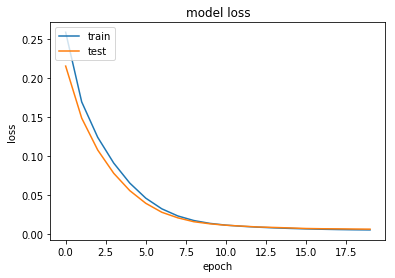

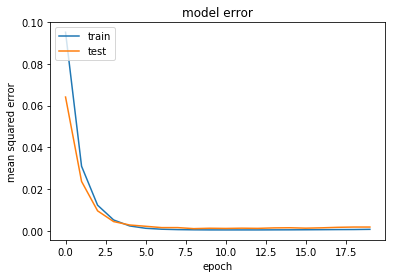

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2544 samples, validate on 264 samples
Epoch 1/20
2544/2544 [==============================] - 0s 118us/step - loss: 0.4705 - mean_squared_error: 0.2963 - val_loss: 0.3336 - val_mean_squared_error: 0.1634
Epoch 2/20
2544/2544 [==============================] - 0s 46us/step - loss: 0.2743 - mean_squared_error: 0.1083 - val_loss: 0.2524 - val_mean_squared_error: 0.0912
Epoch 3/20
2544/2544 [==============================] - 0s 39us/step - loss: 0.2297 - mean_squared_error: 0.0732 - val_loss: 0.2168 - val_mean_squared_error: 

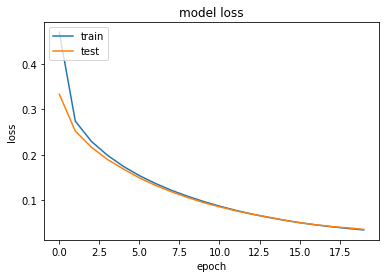

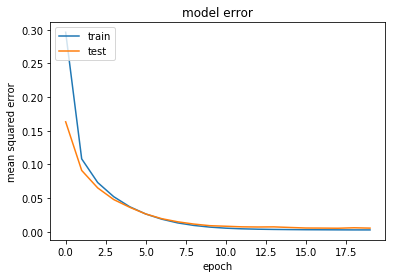

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3816 samples, validate on 396 samples
Epoch 1/20
3816/3816 [==============================] - 0s 91us/step - loss: 0.2336 - mean_squared_error: 0.0670 - val_loss: 0.1942 - val_mean_squared_error: 0.0370
Epoch 2/20
3816/3816 [==============================] - 0s 45us/step - loss: 0.1802 - mean_squared_error: 0.0320 - val_loss: 0.1582 - val_mean_squared_error: 0.0194
Epoch 3/20
3816/3816 [==============================] - 0s 40us/step - loss: 0.1468 - mean_squared_error: 0.0171 - val_loss: 0.1323 - val_mean_squared_error: 0

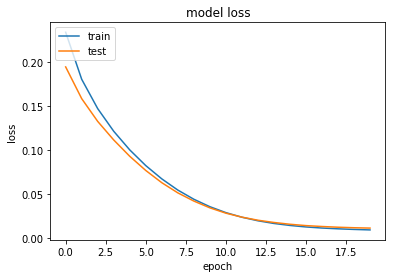

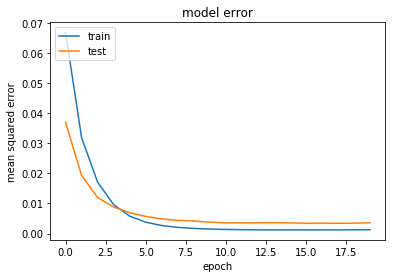

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6390 samples, validate on 630 samples
Epoch 1/20
6390/6390 [==============================] - 0s 71us/step - loss: 0.2405 - mean_squared_error: 0.0753 - val_loss: 0.2012 - val_mean_squared_error: 0.0483
Epoch 2/20
6390/6390 [==============================] - 0s 41us/step - loss: 0.1667 - mean_squared_error: 0.0267 - val_loss: 0.1462 - val_mean_squared_error: 0.0197
Epoch 3/20
6390/6390 [==============================] - 0s 39us/step - loss: 0.1237 - mean_squared_error: 0.0106 - val_loss: 0.1072 - val_mean_squared_error: 0

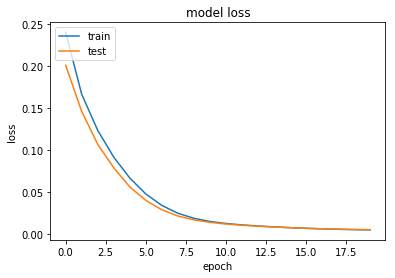

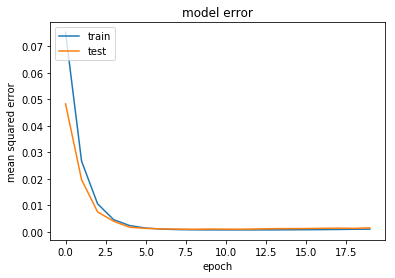

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6390 samples, validate on 630 samples
Epoch 1/20
6390/6390 [==============================] - 0s 74us/step - loss: 0.2397 - mean_squared_error: 0.0738 - val_loss: 0.1841 - val_mean_squared_error: 0.0317
Epoch 2/20
6390/6390 [==============================] - 0s 40us/step - loss: 0.1641 - mean_squared_error: 0.0254 - val_loss: 0.1361 - val_mean_squared_error: 0.0116
Epoch 3/20
6390/6390 [==============================] - 0s 37us/step - loss: 0.1209 - mean_squared_error: 0.0099 - val_loss: 0.1019 - val_mean_squared_error: 0

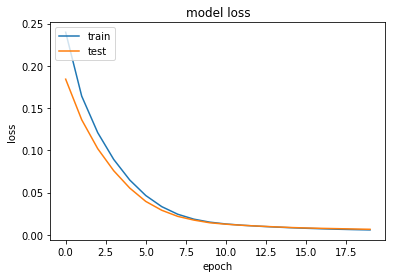

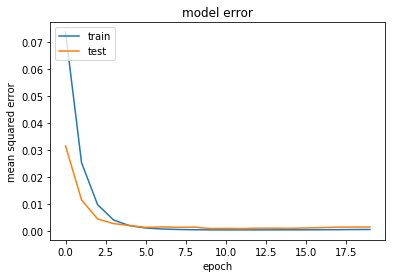

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2556 samples, validate on 252 samples
Epoch 1/20
2556/2556 [==============================] - 0s 118us/step - loss: 0.3123 - mean_squared_error: 0.1340 - val_loss: 0.3597 - val_mean_squared_error: 0.1871
Epoch 2/20
2556/2556 [==============================] - 0s 43us/step - loss: 0.2577 - mean_squared_error: 0.0901 - val_loss: 0.3154 - val_mean_squared_error: 0.1531
Epoch 3/20
2556/2556 [==============================] - 0s 38us/step - loss: 0.2199 - mean_squared_error: 0.0626 - val_loss: 0.2672 - val_mean_squared_error: 

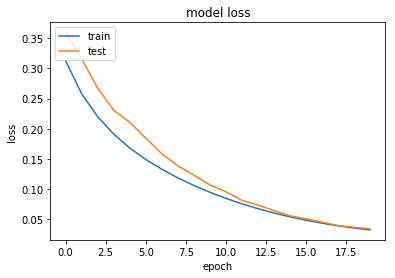

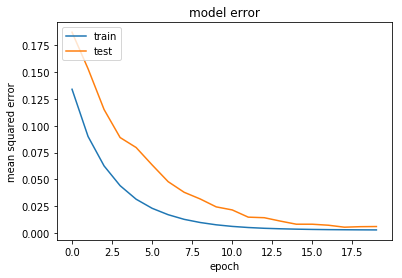

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3834 samples, validate on 378 samples
Epoch 1/20
3834/3834 [==============================] - 0s 97us/step - loss: 0.2804 - mean_squared_error: 0.1193 - val_loss: 0.2158 - val_mean_squared_error: 0.0616
Epoch 2/20
3834/3834 [==============================] - 0s 42us/step - loss: 0.1802 - mean_squared_error: 0.0339 - val_loss: 0.1664 - val_mean_squared_error: 0.0285
Epoch 3/20
3834/3834 [==============================] - 0s 41us/step - loss: 0.1474 - mean_squared_error: 0.0179 - val_loss: 0.1357 - val_mean_squared_error: 0

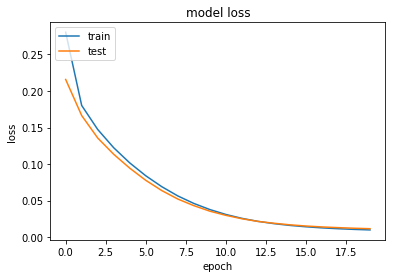

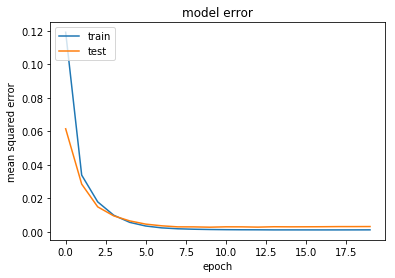

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6420 samples, validate on 600 samples
Epoch 1/20
6420/6420 [==============================] - 0s 74us/step - loss: 0.1898 - mean_squared_error: 0.0344 - val_loss: 0.1563 - val_mean_squared_error: 0.0185
Epoch 2/20
6420/6420 [==============================] - 0s 41us/step - loss: 0.1383 - mean_squared_error: 0.0164 - val_loss: 0.1140 - val_mean_squared_error: 0.0079
Epoch 3/20
6420/6420 [==============================] - 0s 39us/step - loss: 0.1002 - mean_squared_error: 0.0080 - val_loss: 0.0825 - val_mean_squared_error: 0

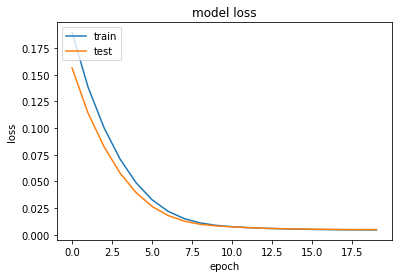

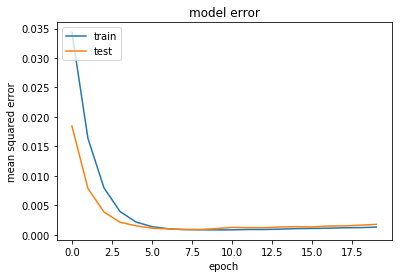

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6420 samples, validate on 600 samples
Epoch 1/20
6420/6420 [==============================] - 0s 74us/step - loss: 0.2147 - mean_squared_error: 0.0662 - val_loss: 0.1615 - val_mean_squared_error: 0.0296
Epoch 2/20
6420/6420 [==============================] - 0s 42us/step - loss: 0.1339 - mean_squared_error: 0.0182 - val_loss: 0.1127 - val_mean_squared_error: 0.0128
Epoch 3/20
6420/6420 [==============================] - 0s 43us/step - loss: 0.0942 - mean_squared_error: 0.0081 - val_loss: 0.0786 - val_mean_squared_error: 0

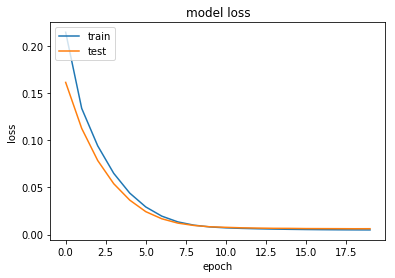

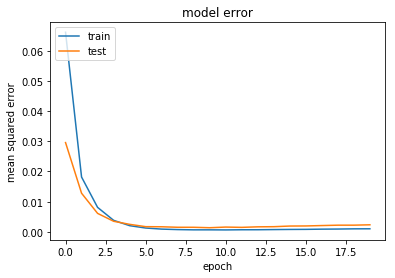

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2568 samples, validate on 240 samples
Epoch 1/20
2568/2568 [==============================] - 0s 122us/step - loss: 0.2469 - mean_squared_error: 0.0919 - val_loss: 0.2145 - val_mean_squared_error: 0.0662
Epoch 2/20
2568/2568 [==============================] - 0s 44us/step - loss: 0.1996 - mean_squared_error: 0.0573 - val_loss: 0.2016 - val_mean_squared_error: 0.0656
Epoch 3/20
2568/2568 [==============================] - 0s 43us/step - loss: 0.1734 - mean_squared_error: 0.0429 - val_loss: 0.1801 - val_mean_squared_error: 

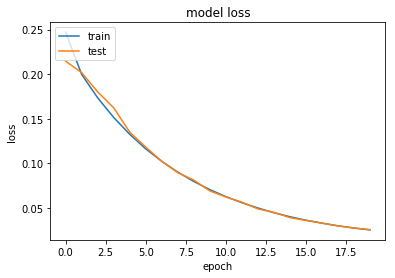

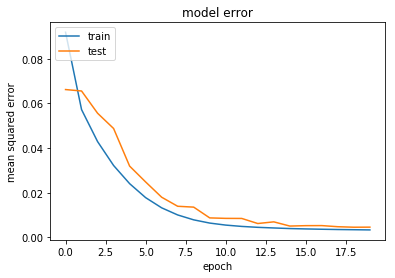

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3852 samples, validate on 360 samples
Epoch 1/20
3852/3852 [==============================] - 0s 93us/step - loss: 0.2898 - mean_squared_error: 0.1311 - val_loss: 0.2345 - val_mean_squared_error: 0.0848
Epoch 2/20
3852/3852 [==============================] - 0s 43us/step - loss: 0.2081 - mean_squared_error: 0.0668 - val_loss: 0.1874 - val_mean_squared_error: 0.0547
Epoch 3/20
3852/3852 [==============================] - 0s 41us/step - loss: 0.1632 - mean_squared_error: 0.0384 - val_loss: 0.1455 - val_mean_squared_error: 0

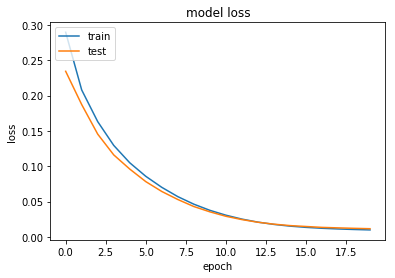

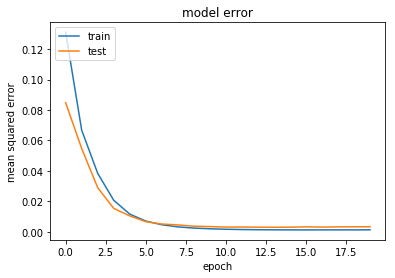

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6450 samples, validate on 570 samples
Epoch 1/20
6450/6450 [==============================] - 0s 73us/step - loss: 0.3603 - mean_squared_error: 0.1944 - val_loss: 0.2049 - val_mean_squared_error: 0.0502
Epoch 2/20
6450/6450 [==============================] - 0s 40us/step - loss: 0.1739 - mean_squared_error: 0.0337 - val_loss: 0.1475 - val_mean_squared_error: 0.0223
Epoch 3/20
6450/6450 [==============================] - 0s 38us/step - loss: 0.1267 - mean_squared_error: 0.0156 - val_loss: 0.1063 - val_mean_squared_error: 0

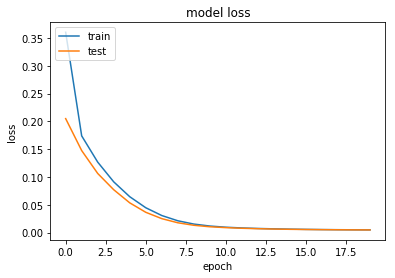

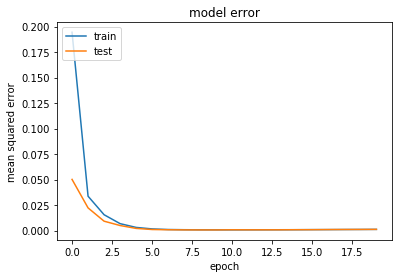

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6450 samples, validate on 570 samples
Epoch 1/20
6450/6450 [==============================] - 0s 71us/step - loss: 0.2705 - mean_squared_error: 0.1085 - val_loss: 0.1957 - val_mean_squared_error: 0.0483
Epoch 2/20
6450/6450 [==============================] - 0s 39us/step - loss: 0.1656 - mean_squared_error: 0.0328 - val_loss: 0.1392 - val_mean_squared_error: 0.0210
Epoch 3/20
6450/6450 [==============================] - 0s 38us/step - loss: 0.1205 - mean_squared_error: 0.0155 - val_loss: 0.1026 - val_mean_squared_error: 0

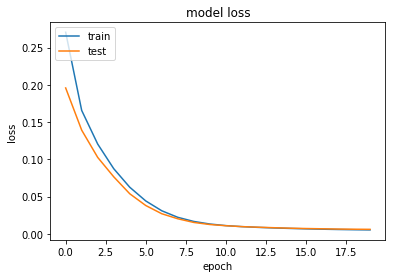

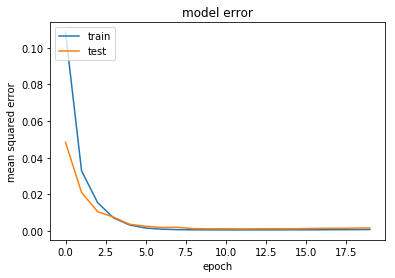

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2580 samples, validate on 228 samples
Epoch 1/20
2580/2580 [==============================] - 0s 118us/step - loss: 1.0648 - mean_squared_error: 0.8904 - val_loss: 0.8938 - val_mean_squared_error: 0.7228
Epoch 2/20
2580/2580 [==============================] - 0s 45us/step - loss: 0.5252 - mean_squared_error: 0.3574 - val_loss: 0.4108 - val_mean_squared_error: 0.2467
Epoch 3/20
2580/2580 [==============================] - 0s 37us/step - loss: 0.2843 - mean_squared_error: 0.1243 - val_loss: 0.2246 - val_mean_squared_error: 

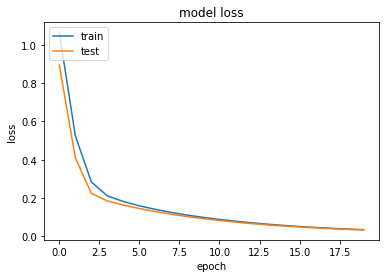

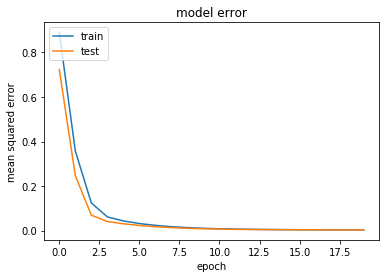

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3870 samples, validate on 342 samples
Epoch 1/20
3870/3870 [==============================] - 0s 92us/step - loss: 0.2598 - mean_squared_error: 0.1020 - val_loss: 0.2043 - val_mean_squared_error: 0.0560
Epoch 2/20
3870/3870 [==============================] - 0s 45us/step - loss: 0.1690 - mean_squared_error: 0.0304 - val_loss: 0.1625 - val_mean_squared_error: 0.0338
Epoch 3/20
3870/3870 [==============================] - 0s 39us/step - loss: 0.1382 - mean_squared_error: 0.0188 - val_loss: 0.1319 - val_mean_squared_error: 0

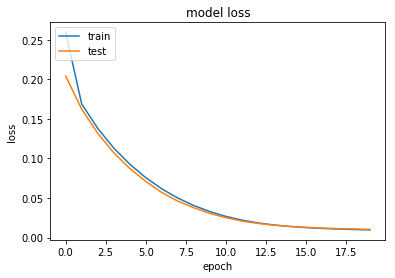

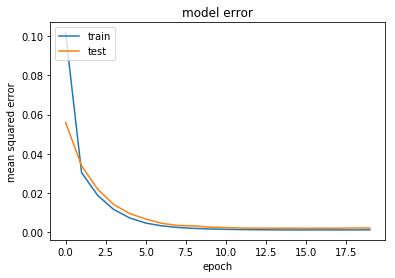

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6480 samples, validate on 540 samples
Epoch 1/20
6480/6480 [==============================] - 0s 72us/step - loss: 0.2245 - mean_squared_error: 0.0647 - val_loss: 0.1953 - val_mean_squared_error: 0.0507
Epoch 2/20
6480/6480 [==============================] - 0s 39us/step - loss: 0.1556 - mean_squared_error: 0.0254 - val_loss: 0.1407 - val_mean_squared_error: 0.0251
Epoch 3/20
6480/6480 [==============================] - 0s 38us/step - loss: 0.1147 - mean_squared_error: 0.0125 - val_loss: 0.1003 - val_mean_squared_error: 0

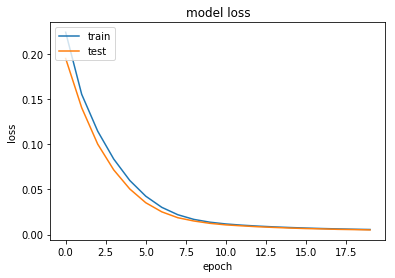

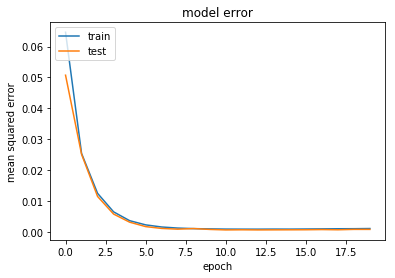

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6480 samples, validate on 540 samples
Epoch 1/20
6480/6480 [==============================] - 0s 73us/step - loss: 0.2023 - mean_squared_error: 0.0569 - val_loss: 0.1642 - val_mean_squared_error: 0.0347
Epoch 2/20
6480/6480 [==============================] - 0s 39us/step - loss: 0.1311 - mean_squared_error: 0.0165 - val_loss: 0.1133 - val_mean_squared_error: 0.0136
Epoch 3/20
6480/6480 [==============================] - 0s 37us/step - loss: 0.0923 - mean_squared_error: 0.0060 - val_loss: 0.0776 - val_mean_squared_error: 0

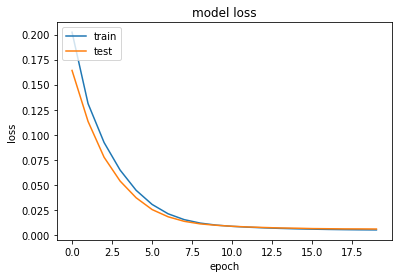

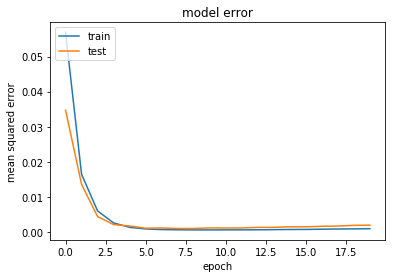

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2592 samples, validate on 216 samples
Epoch 1/20
2592/2592 [==============================] - 0s 122us/step - loss: 0.3924 - mean_squared_error: 0.2243 - val_loss: 0.3267 - val_mean_squared_error: 0.1634
Epoch 2/20
2592/2592 [==============================] - 0s 43us/step - loss: 0.2481 - mean_squared_error: 0.0895 - val_loss: 0.2311 - val_mean_squared_error: 0.0777
Epoch 3/20
2592/2592 [==============================] - 0s 40us/step - loss: 0.2008 - mean_squared_error: 0.0526 - val_loss: 0.1861 - val_mean_squared_error: 

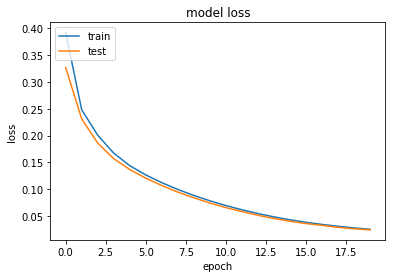

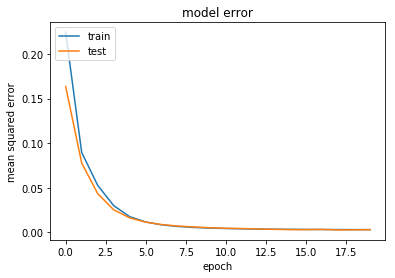

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3888 samples, validate on 324 samples
Epoch 1/20
3888/3888 [==============================] - 0s 94us/step - loss: 0.2741 - mean_squared_error: 0.1102 - val_loss: 0.2893 - val_mean_squared_error: 0.1337
Epoch 2/20
3888/3888 [==============================] - 0s 44us/step - loss: 0.2009 - mean_squared_error: 0.0532 - val_loss: 0.2080 - val_mean_squared_error: 0.0685
Epoch 3/20
3888/3888 [==============================] - 0s 43us/step - loss: 0.1605 - mean_squared_error: 0.0289 - val_loss: 0.1648 - val_mean_squared_error: 0

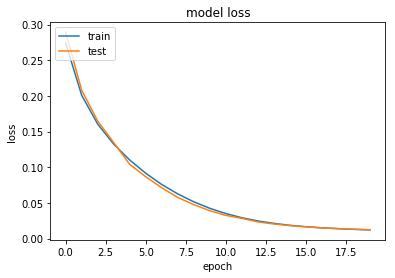

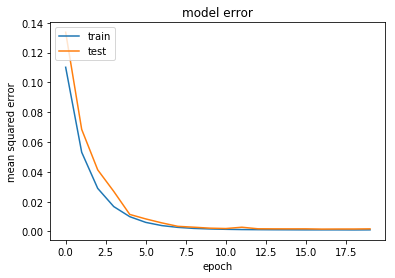

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6510 samples, validate on 510 samples
Epoch 1/20
6510/6510 [==============================] - 0s 73us/step - loss: 0.1843 - mean_squared_error: 0.0341 - val_loss: 0.1586 - val_mean_squared_error: 0.0270
Epoch 2/20
6510/6510 [==============================] - 0s 40us/step - loss: 0.1299 - mean_squared_error: 0.0148 - val_loss: 0.1113 - val_mean_squared_error: 0.0125
Epoch 3/20
6510/6510 [==============================] - 0s 38us/step - loss: 0.0912 - mean_squared_error: 0.0067 - val_loss: 0.0759 - val_mean_squared_error: 0

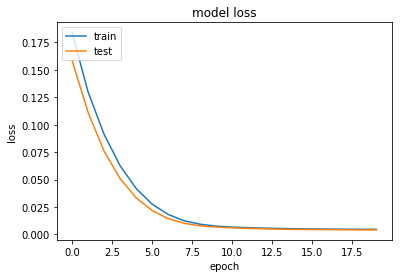

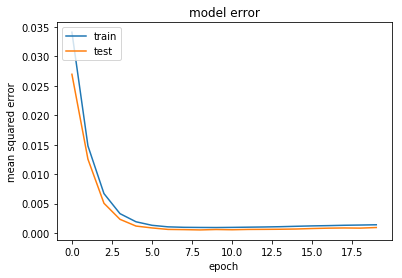

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6510 samples, validate on 510 samples
Epoch 1/20
6510/6510 [==============================] - 0s 72us/step - loss: 0.2328 - mean_squared_error: 0.0627 - val_loss: 0.1893 - val_mean_squared_error: 0.0324
Epoch 2/20
6510/6510 [==============================] - 0s 36us/step - loss: 0.1665 - mean_squared_error: 0.0228 - val_loss: 0.1373 - val_mean_squared_error: 0.0075
Epoch 3/20
6510/6510 [==============================] - 0s 37us/step - loss: 0.1238 - mean_squared_error: 0.0078 - val_loss: 0.1056 - val_mean_squared_error: 0

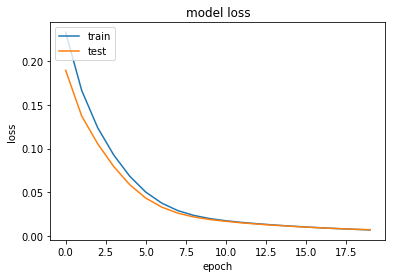

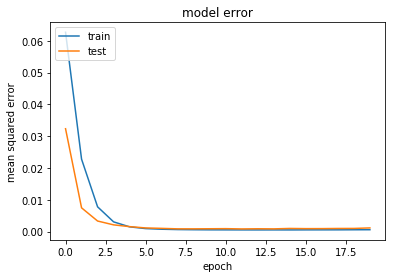

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2604 samples, validate on 204 samples
Epoch 1/20
2604/2604 [==============================] - 0s 122us/step - loss: 0.2309 - mean_squared_error: 0.0680 - val_loss: 0.2118 - val_mean_squared_error: 0.0561
Epoch 2/20
2604/2604 [==============================] - 0s 42us/step - loss: 0.1980 - mean_squared_error: 0.0484 - val_loss: 0.1887 - val_mean_squared_error: 0.0456
Epoch 3/20
2604/2604 [==============================] - 0s 42us/step - loss: 0.1730 - mean_squared_error: 0.0357 - val_loss: 0.1651 - val_mean_squared_error: 

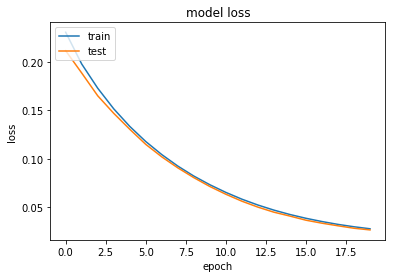

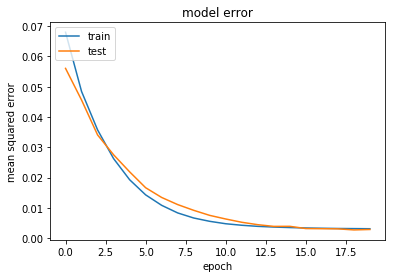

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3906 samples, validate on 306 samples
Epoch 1/20
3906/3906 [==============================] - 0s 89us/step - loss: 0.2511 - mean_squared_error: 0.0814 - val_loss: 0.2375 - val_mean_squared_error: 0.0768
Epoch 2/20
3906/3906 [==============================] - 0s 44us/step - loss: 0.1932 - mean_squared_error: 0.0408 - val_loss: 0.1756 - val_mean_squared_error: 0.0321
Epoch 3/20
3906/3906 [==============================] - 0s 44us/step - loss: 0.1559 - mean_squared_error: 0.0208 - val_loss: 0.1478 - val_mean_squared_error: 0

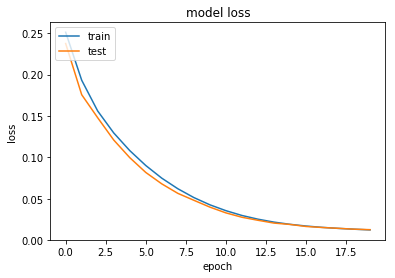

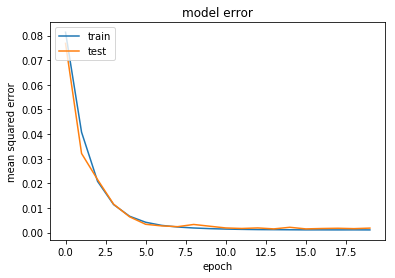

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6540 samples, validate on 480 samples
Epoch 1/20
6540/6540 [==============================] - 0s 71us/step - loss: 0.1842 - mean_squared_error: 0.0368 - val_loss: 0.1557 - val_mean_squared_error: 0.0265
Epoch 2/20
6540/6540 [==============================] - 0s 46us/step - loss: 0.1269 - mean_squared_error: 0.0141 - val_loss: 0.1071 - val_mean_squared_error: 0.0108
Epoch 3/20
6540/6540 [==============================] - 0s 40us/step - loss: 0.0880 - mean_squared_error: 0.0060 - val_loss: 0.0734 - val_mean_squared_error: 0

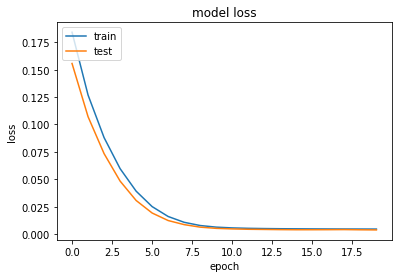

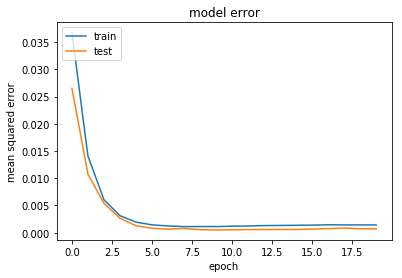

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6540 samples, validate on 480 samples
Epoch 1/20
6540/6540 [==============================] - 0s 75us/step - loss: 0.2437 - mean_squared_error: 0.0751 - val_loss: 0.2152 - val_mean_squared_error: 0.0585
Epoch 2/20
6540/6540 [==============================] - 0s 38us/step - loss: 0.1729 - mean_squared_error: 0.0283 - val_loss: 0.1505 - val_mean_squared_error: 0.0188
Epoch 3/20
6540/6540 [==============================] - 0s 38us/step - loss: 0.1285 - mean_squared_error: 0.0098 - val_loss: 0.1113 - val_mean_squared_error: 0

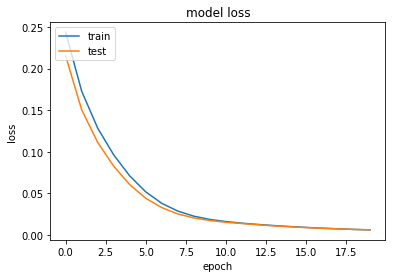

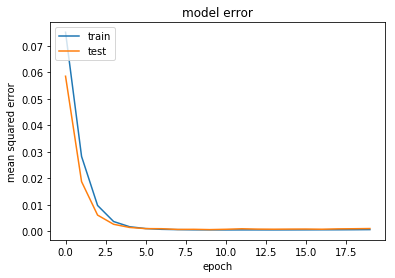

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2616 samples, validate on 192 samples
Epoch 1/20
2616/2616 [==============================] - 0s 118us/step - loss: 0.2677 - mean_squared_error: 0.0998 - val_loss: 0.3145 - val_mean_squared_error: 0.1526
Epoch 2/20
2616/2616 [==============================] - 0s 44us/step - loss: 0.2218 - mean_squared_error: 0.0653 - val_loss: 0.2698 - val_mean_squared_error: 0.1189
Epoch 3/20
2616/2616 [==============================] - 0s 37us/step - loss: 0.1914 - mean_squared_error: 0.0458 - val_loss: 0.2160 - val_mean_squared_error: 

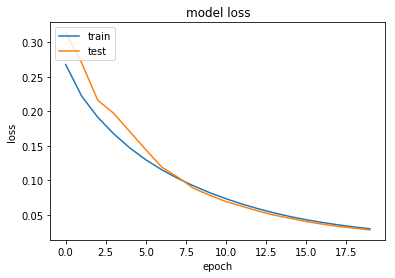

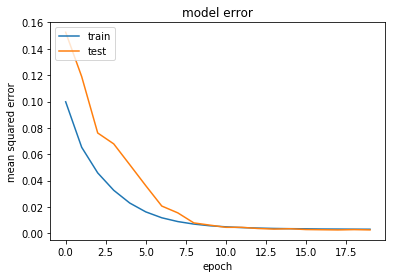

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3924 samples, validate on 288 samples
Epoch 1/20
3924/3924 [==============================] - 0s 90us/step - loss: 0.2919 - mean_squared_error: 0.1290 - val_loss: 0.2410 - val_mean_squared_error: 0.0856
Epoch 2/20
3924/3924 [==============================] - 0s 43us/step - loss: 0.1905 - mean_squared_error: 0.0431 - val_loss: 0.1901 - val_mean_squared_error: 0.0514
Epoch 3/20
3924/3924 [==============================] - 0s 38us/step - loss: 0.1539 - mean_squared_error: 0.0235 - val_loss: 0.1520 - val_mean_squared_error: 0

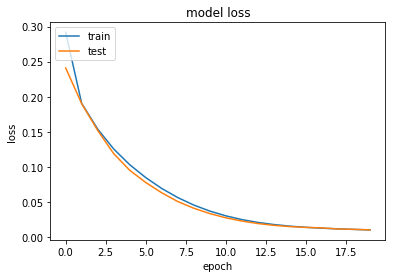

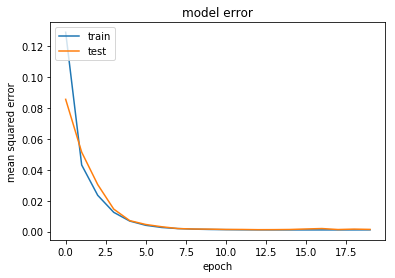

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6570 samples, validate on 450 samples
Epoch 1/20
6570/6570 [==============================] - 0s 71us/step - loss: 0.2046 - mean_squared_error: 0.0502 - val_loss: 0.1771 - val_mean_squared_error: 0.0378
Epoch 2/20
6570/6570 [==============================] - 0s 39us/step - loss: 0.1436 - mean_squared_error: 0.0188 - val_loss: 0.1256 - val_mean_squared_error: 0.0155
Epoch 3/20
6570/6570 [==============================] - 0s 37us/step - loss: 0.1039 - mean_squared_error: 0.0073 - val_loss: 0.0891 - val_mean_squared_error: 0

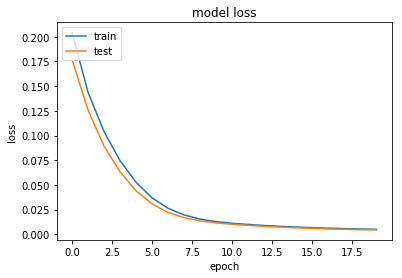

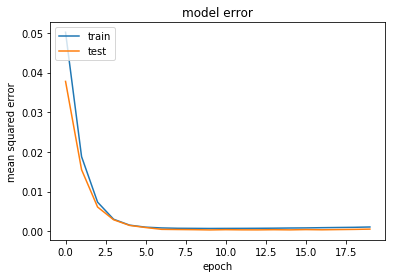

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6570 samples, validate on 450 samples
Epoch 1/20
6570/6570 [==============================] - 0s 69us/step - loss: 0.2103 - mean_squared_error: 0.0527 - val_loss: 0.1739 - val_mean_squared_error: 0.0307
Epoch 2/20
6570/6570 [==============================] - 0s 41us/step - loss: 0.1472 - mean_squared_error: 0.0183 - val_loss: 0.1246 - val_mean_squared_error: 0.0104
Epoch 3/20
6570/6570 [==============================] - 0s 40us/step - loss: 0.1076 - mean_squared_error: 0.0072 - val_loss: 0.0904 - val_mean_squared_error: 0

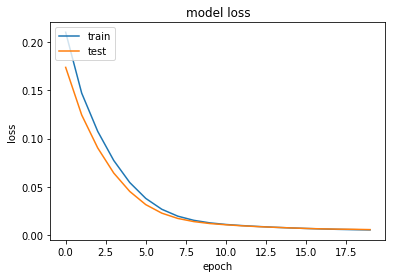

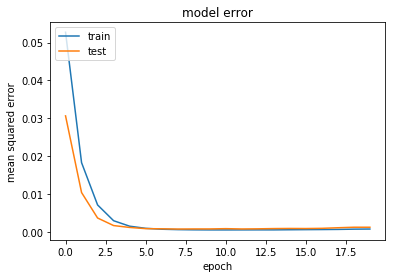

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2628 samples, validate on 180 samples
Epoch 1/20
2628/2628 [==============================] - 0s 121us/step - loss: 0.2284 - mean_squared_error: 0.0677 - val_loss: 0.1815 - val_mean_squared_error: 0.0280
Epoch 2/20
2628/2628 [==============================] - 0s 42us/step - loss: 0.1907 - mean_squared_error: 0.0430 - val_loss: 0.1636 - val_mean_squared_error: 0.0224
Epoch 3/20
2628/2628 [==============================] - 0s 36us/step - loss: 0.1653 - mean_squared_error: 0.0299 - val_loss: 0.1461 - val_mean_squared_error: 

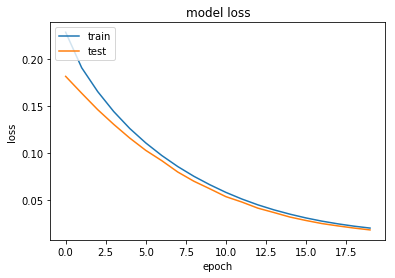

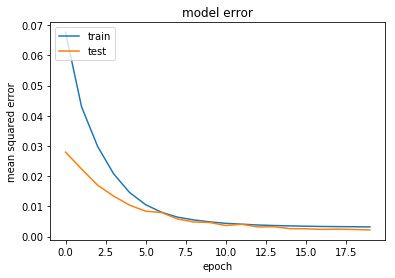

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3942 samples, validate on 270 samples
Epoch 1/20
3942/3942 [==============================] - 0s 94us/step - loss: 0.1915 - mean_squared_error: 0.0360 - val_loss: 0.1635 - val_mean_squared_error: 0.0203
Epoch 2/20
3942/3942 [==============================] - 0s 42us/step - loss: 0.1519 - mean_squared_error: 0.0195 - val_loss: 0.1342 - val_mean_squared_error: 0.0129
Epoch 3/20
3942/3942 [==============================] - 0s 37us/step - loss: 0.1230 - mean_squared_error: 0.0117 - val_loss: 0.1094 - val_mean_squared_error: 0

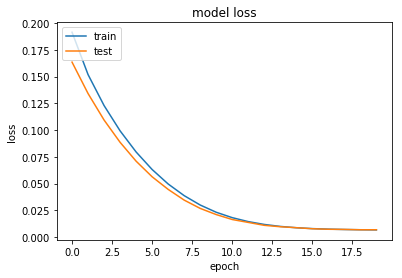

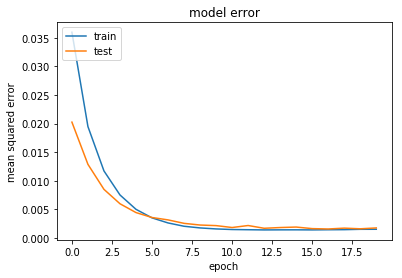

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6600 samples, validate on 420 samples
Epoch 1/20
6600/6600 [==============================] - 0s 71us/step - loss: 0.2636 - mean_squared_error: 0.0955 - val_loss: 0.2288 - val_mean_squared_error: 0.0737
Epoch 2/20
6600/6600 [==============================] - 0s 43us/step - loss: 0.1848 - mean_squared_error: 0.0423 - val_loss: 0.1572 - val_mean_squared_error: 0.0278
Epoch 3/20
6600/6600 [==============================] - 0s 39us/step - loss: 0.1341 - mean_squared_error: 0.0172 - val_loss: 0.1138 - val_mean_squared_error: 0

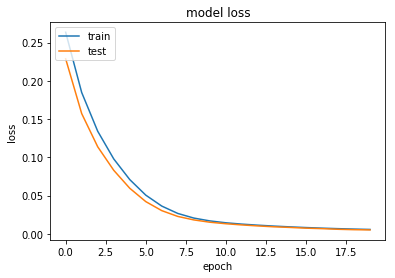

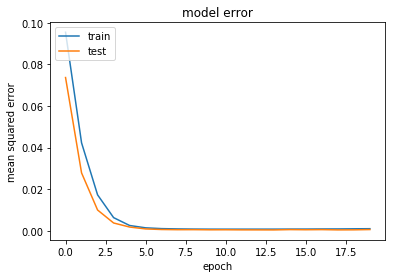

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6600 samples, validate on 420 samples
Epoch 1/20
6600/6600 [==============================] - 0s 73us/step - loss: 0.1990 - mean_squared_error: 0.0501 - val_loss: 0.1678 - val_mean_squared_error: 0.0349
Epoch 2/20
6600/6600 [==============================] - 0s 42us/step - loss: 0.1353 - mean_squared_error: 0.0176 - val_loss: 0.1166 - val_mean_squared_error: 0.0142
Epoch 3/20
6600/6600 [==============================] - 0s 39us/step - loss: 0.0962 - mean_squared_error: 0.0075 - val_loss: 0.0827 - val_mean_squared_error: 0

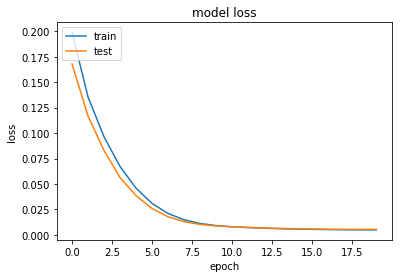

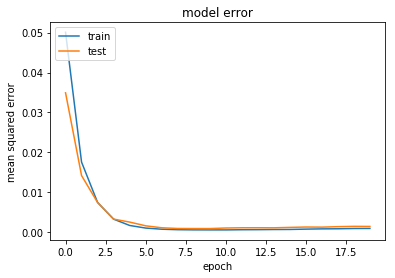

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2640 samples, validate on 168 samples
Epoch 1/20
2640/2640 [==============================] - 0s 123us/step - loss: 0.2290 - mean_squared_error: 0.0605 - val_loss: 0.2172 - val_mean_squared_error: 0.0557
Epoch 2/20
2640/2640 [==============================] - 0s 45us/step - loss: 0.1970 - mean_squared_error: 0.0415 - val_loss: 0.1912 - val_mean_squared_error: 0.0423
Epoch 3/20
2640/2640 [==============================] - 0s 40us/step - loss: 0.1722 - mean_squared_error: 0.0293 - val_loss: 0.1653 - val_mean_squared_error: 

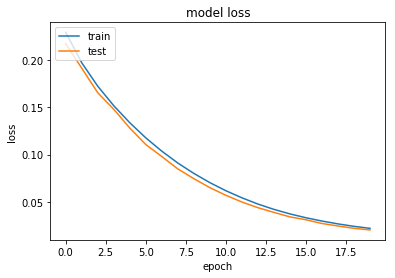

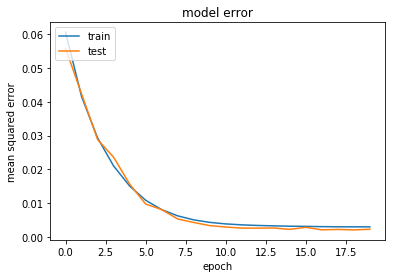

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3960 samples, validate on 252 samples
Epoch 1/20
3960/3960 [==============================] - 0s 93us/step - loss: 0.1842 - mean_squared_error: 0.0326 - val_loss: 0.1805 - val_mean_squared_error: 0.0398
Epoch 2/20
3960/3960 [==============================] - 0s 45us/step - loss: 0.1499 - mean_squared_error: 0.0193 - val_loss: 0.1455 - val_mean_squared_error: 0.0251
Epoch 3/20
3960/3960 [==============================] - 0s 41us/step - loss: 0.1227 - mean_squared_error: 0.0116 - val_loss: 0.1183 - val_mean_squared_error: 0

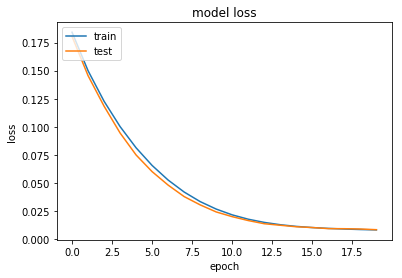

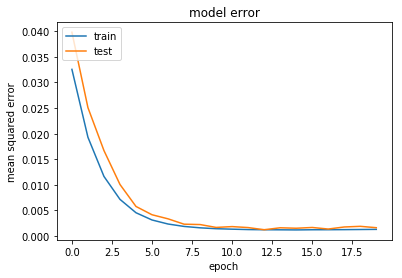

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6630 samples, validate on 390 samples
Epoch 1/20
6630/6630 [==============================] - 0s 71us/step - loss: 0.2417 - mean_squared_error: 0.0763 - val_loss: 0.2075 - val_mean_squared_error: 0.0554
Epoch 2/20
6630/6630 [==============================] - 0s 40us/step - loss: 0.1661 - mean_squared_error: 0.0272 - val_loss: 0.1494 - val_mean_squared_error: 0.0243
Epoch 3/20
6630/6630 [==============================] - 0s 39us/step - loss: 0.1232 - mean_squared_error: 0.0112 - val_loss: 0.1108 - val_mean_squared_error: 0

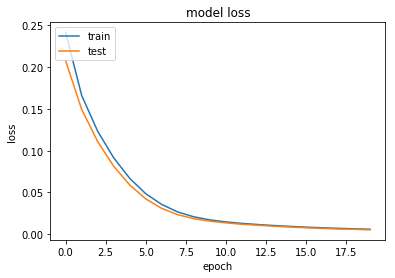

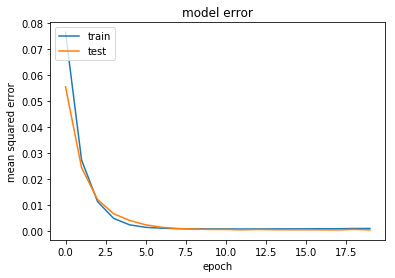

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6630 samples, validate on 390 samples
Epoch 1/20
6630/6630 [==============================] - 0s 69us/step - loss: 0.2501 - mean_squared_error: 0.0822 - val_loss: 0.2113 - val_mean_squared_error: 0.0573
Epoch 2/20
6630/6630 [==============================] - 0s 42us/step - loss: 0.1702 - mean_squared_error: 0.0301 - val_loss: 0.1473 - val_mean_squared_error: 0.0215
Epoch 3/20
6630/6630 [==============================] - 0s 36us/step - loss: 0.1235 - mean_squared_error: 0.0114 - val_loss: 0.1052 - val_mean_squared_error: 0

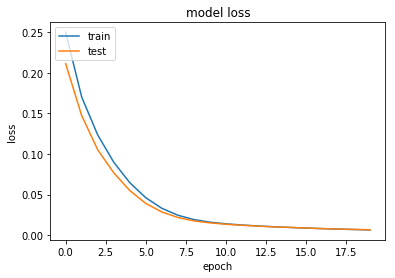

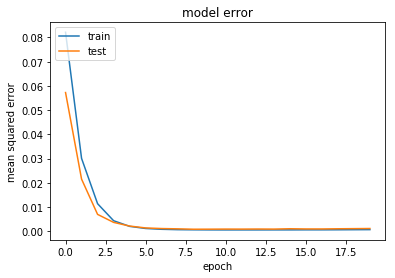

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2652 samples, validate on 156 samples
Epoch 1/20
2652/2652 [==============================] - 0s 114us/step - loss: 0.2201 - mean_squared_error: 0.0717 - val_loss: 0.1697 - val_mean_squared_error: 0.0291
Epoch 2/20
2652/2652 [==============================] - 0s 42us/step - loss: 0.1651 - mean_squared_error: 0.0315 - val_loss: 0.1400 - val_mean_squared_error: 0.0141
Epoch 3/20
2652/2652 [==============================] - 0s 38us/step - loss: 0.1397 - mean_squared_error: 0.0208 - val_loss: 0.1220 - val_mean_squared_error: 

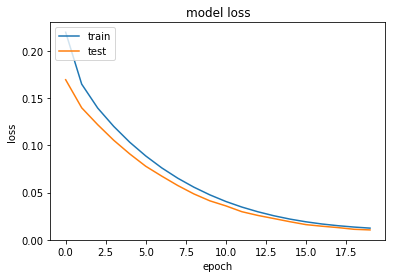

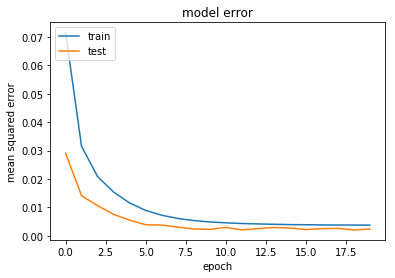

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3978 samples, validate on 234 samples
Epoch 1/20
3978/3978 [==============================] - 0s 94us/step - loss: 0.2102 - mean_squared_error: 0.0538 - val_loss: 0.2054 - val_mean_squared_error: 0.0594
Epoch 2/20
3978/3978 [==============================] - 0s 42us/step - loss: 0.1683 - mean_squared_error: 0.0316 - val_loss: 0.1653 - val_mean_squared_error: 0.0383
Epoch 3/20
3978/3978 [==============================] - 0s 41us/step - loss: 0.1379 - mean_squared_error: 0.0198 - val_loss: 0.1375 - val_mean_squared_error: 0

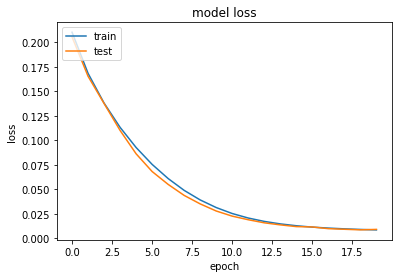

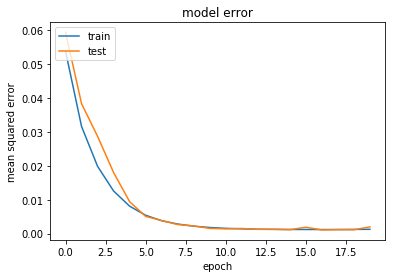

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6660 samples, validate on 360 samples
Epoch 1/20
6660/6660 [==============================] - 0s 74us/step - loss: 0.2333 - mean_squared_error: 0.0729 - val_loss: 0.1807 - val_mean_squared_error: 0.0343
Epoch 2/20
6660/6660 [==============================] - 0s 39us/step - loss: 0.1497 - mean_squared_error: 0.0179 - val_loss: 0.1356 - val_mean_squared_error: 0.0191
Epoch 3/20
6660/6660 [==============================] - 0s 37us/step - loss: 0.1089 - mean_squared_error: 0.0066 - val_loss: 0.0951 - val_mean_squared_error: 0

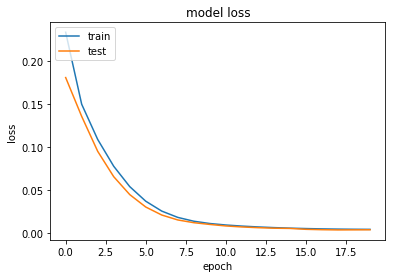

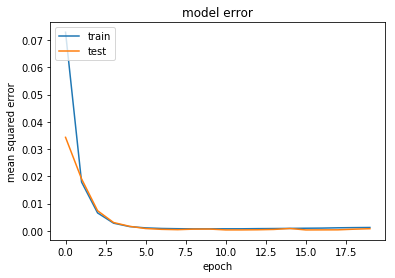

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6660 samples, validate on 360 samples
Epoch 1/20
6660/6660 [==============================] - 0s 71us/step - loss: 0.2358 - mean_squared_error: 0.0676 - val_loss: 0.1864 - val_mean_squared_error: 0.0319
Epoch 2/20
6660/6660 [==============================] - 0s 43us/step - loss: 0.1690 - mean_squared_error: 0.0276 - val_loss: 0.1410 - val_mean_squared_error: 0.0134
Epoch 3/20
6660/6660 [==============================] - 0s 38us/step - loss: 0.1265 - mean_squared_error: 0.0117 - val_loss: 0.1077 - val_mean_squared_error: 0

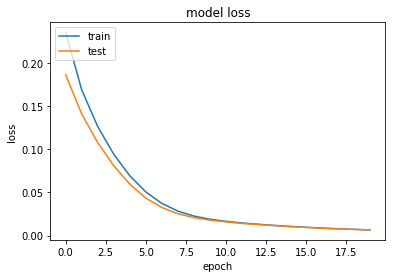

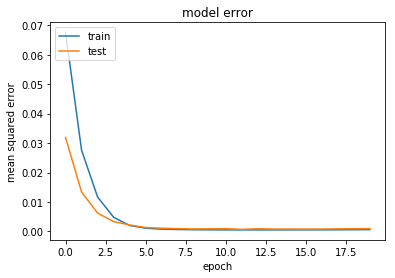

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2664 samples, validate on 144 samples
Epoch 1/20
2664/2664 [==============================] - 0s 120us/step - loss: 0.2834 - mean_squared_error: 0.1097 - val_loss: 0.2532 - val_mean_squared_error: 0.0842
Epoch 2/20
2664/2664 [==============================] - 0s 39us/step - loss: 0.2020 - mean_squared_error: 0.0384 - val_loss: 0.2220 - val_mean_squared_error: 0.0644
Epoch 3/20
2664/2664 [==============================] - 0s 36us/step - loss: 0.1778 - mean_squared_error: 0.0259 - val_loss: 0.1892 - val_mean_squared_error: 

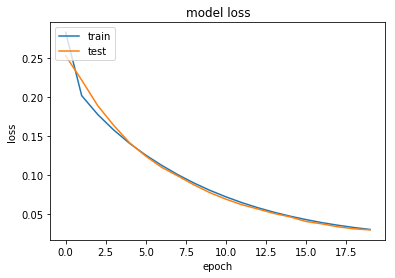

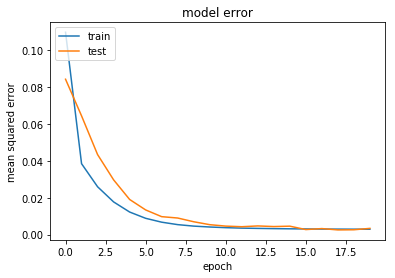

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 3996 samples, validate on 216 samples
Epoch 1/20
3996/3996 [==============================] - 0s 89us/step - loss: 0.2231 - mean_squared_error: 0.0677 - val_loss: 0.1923 - val_mean_squared_error: 0.0469
Epoch 2/20
3996/3996 [==============================] - 0s 45us/step - loss: 0.1694 - mean_squared_error: 0.0331 - val_loss: 0.1589 - val_mean_squared_error: 0.0320
Epoch 3/20
3996/3996 [==============================] - 0s 39us/step - loss: 0.1362 - mean_squared_error: 0.0181 - val_loss: 0.1322 - val_mean_squared_error: 0

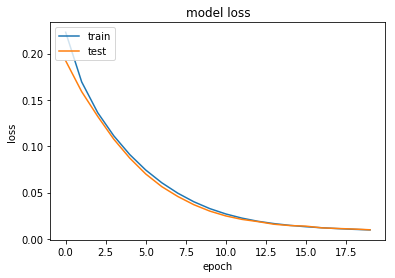

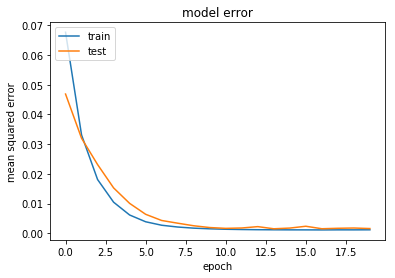

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6690 samples, validate on 330 samples
Epoch 1/20
6690/6690 [==============================] - 0s 72us/step - loss: 0.2055 - mean_squared_error: 0.0563 - val_loss: 0.1639 - val_mean_squared_error: 0.0320
Epoch 2/20
6690/6690 [==============================] - 0s 41us/step - loss: 0.1334 - mean_squared_error: 0.0179 - val_loss: 0.1144 - val_mean_squared_error: 0.0151
Epoch 3/20
6690/6690 [==============================] - 0s 39us/step - loss: 0.0931 - mean_squared_error: 0.0080 - val_loss: 0.0784 - val_mean_squared_error: 0

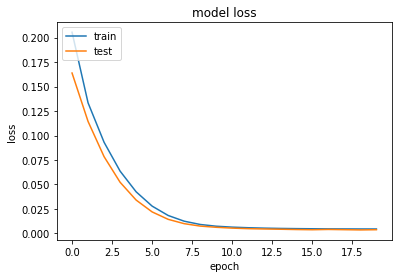

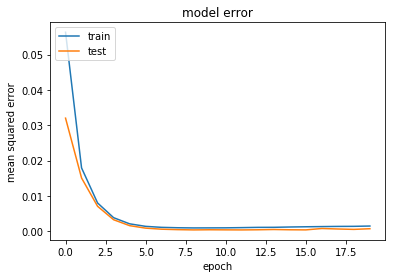

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6690 samples, validate on 330 samples
Epoch 1/20
6690/6690 [==============================] - 0s 71us/step - loss: 0.2010 - mean_squared_error: 0.0435 - val_loss: 0.1675 - val_mean_squared_error: 0.0262
Epoch 2/20
6690/6690 [==============================] - 0s 41us/step - loss: 0.1419 - mean_squared_error: 0.0162 - val_loss: 0.1219 - val_mean_squared_error: 0.0121
Epoch 3/20
6690/6690 [==============================] - 0s 42us/step - loss: 0.1018 - mean_squared_error: 0.0065 - val_loss: 0.0849 - val_mean_squared_error: 0

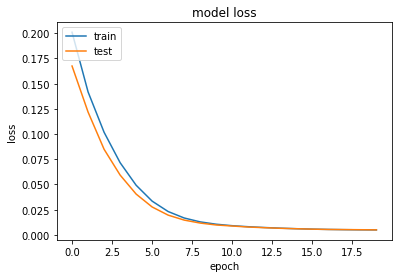

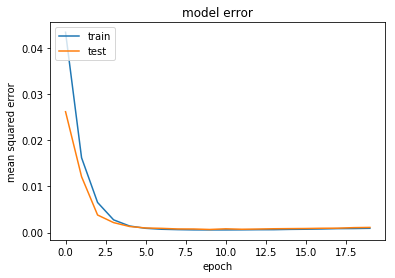

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2676 samples, validate on 132 samples
Epoch 1/20
2676/2676 [==============================] - 0s 119us/step - loss: 0.3836 - mean_squared_error: 0.2236 - val_loss: 0.2771 - val_mean_squared_error: 0.1222
Epoch 2/20
2676/2676 [==============================] - 0s 44us/step - loss: 0.2313 - mean_squared_error: 0.0820 - val_loss: 0.1870 - val_mean_squared_error: 0.0437
Epoch 3/20
2676/2676 [==============================] - 0s 43us/step - loss: 0.1855 - mean_squared_error: 0.0483 - val_loss: 0.1606 - val_mean_squared_error: 

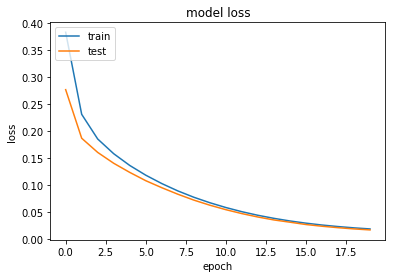

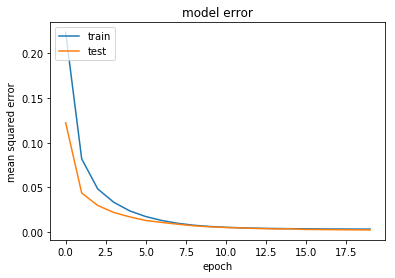

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4014 samples, validate on 198 samples
Epoch 1/20
4014/4014 [==============================] - 0s 94us/step - loss: 0.2276 - mean_squared_error: 0.0741 - val_loss: 0.2176 - val_mean_squared_error: 0.0734
Epoch 2/20
4014/4014 [==============================] - 0s 44us/step - loss: 0.1697 - mean_squared_error: 0.0341 - val_loss: 0.1726 - val_mean_squared_error: 0.0459
Epoch 3/20
4014/4014 [==============================] - 0s 41us/step - loss: 0.1352 - mean_squared_error: 0.0171 - val_loss: 0.1390 - val_mean_squared_error: 0

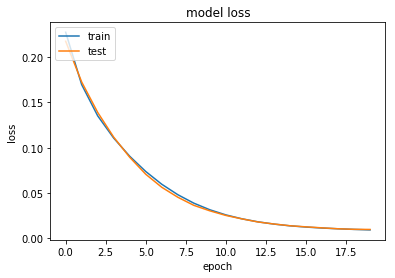

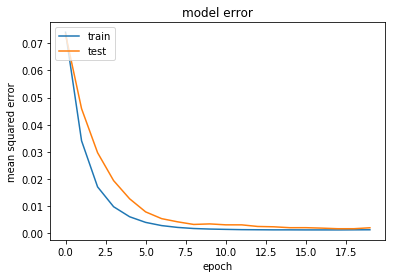

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6720 samples, validate on 300 samples
Epoch 1/20
6720/6720 [==============================] - 0s 74us/step - loss: 0.1936 - mean_squared_error: 0.0454 - val_loss: 0.1585 - val_mean_squared_error: 0.0259
Epoch 2/20
6720/6720 [==============================] - 0s 37us/step - loss: 0.1378 - mean_squared_error: 0.0200 - val_loss: 0.1160 - val_mean_squared_error: 0.0129
Epoch 3/20
6720/6720 [==============================] - 0s 36us/step - loss: 0.0989 - mean_squared_error: 0.0092 - val_loss: 0.0830 - val_mean_squared_error: 0

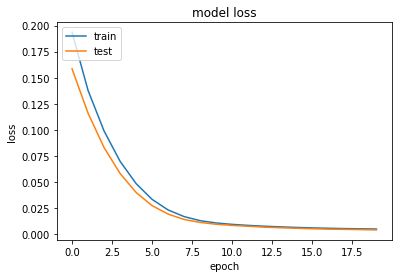

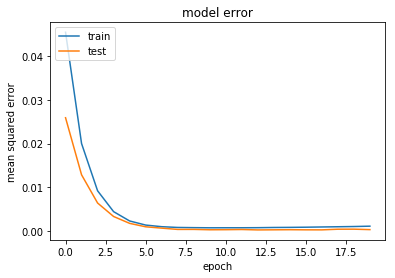

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6720 samples, validate on 300 samples
Epoch 1/20
6720/6720 [==============================] - 0s 73us/step - loss: 0.1958 - mean_squared_error: 0.0452 - val_loss: 0.1834 - val_mean_squared_error: 0.0489
Epoch 2/20
6720/6720 [==============================] - 0s 39us/step - loss: 0.1359 - mean_squared_error: 0.0171 - val_loss: 0.1237 - val_mean_squared_error: 0.0206
Epoch 3/20
6720/6720 [==============================] - 0s 37us/step - loss: 0.0961 - mean_squared_error: 0.0073 - val_loss: 0.0850 - val_mean_squared_error: 0

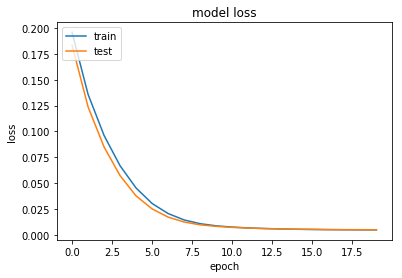

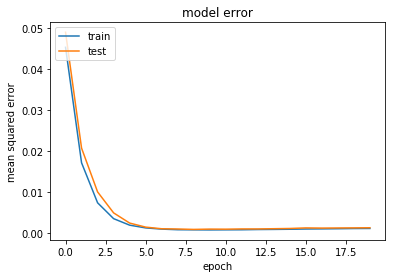

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2688 samples, validate on 120 samples
Epoch 1/20
2688/2688 [==============================] - 0s 117us/step - loss: 0.3079 - mean_squared_error: 0.1472 - val_loss: 0.1831 - val_mean_squared_error: 0.0290
Epoch 2/20
2688/2688 [==============================] - 0s 42us/step - loss: 0.2026 - mean_squared_error: 0.0550 - val_loss: 0.1642 - val_mean_squared_error: 0.0235
Epoch 3/20
2688/2688 [==============================] - 0s 40us/step - loss: 0.1668 - mean_squared_error: 0.0327 - val_loss: 0.1510 - val_mean_squared_error: 

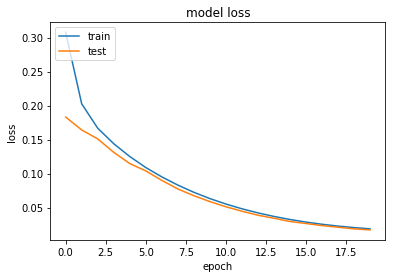

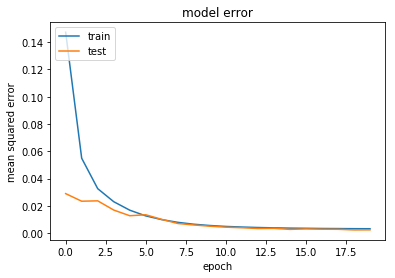

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4032 samples, validate on 180 samples
Epoch 1/20
4032/4032 [==============================] - 0s 106us/step - loss: 0.3219 - mean_squared_error: 0.1321 - val_loss: 0.2462 - val_mean_squared_error: 0.0638
Epoch 2/20
4032/4032 [==============================] - 0s 36us/step - loss: 0.2361 - mean_squared_error: 0.0611 - val_loss: 0.2073 - val_mean_squared_error: 0.0402
Epoch 3/20
4032/4032 [==============================] - 0s 36us/step - loss: 0.1904 - mean_squared_error: 0.0314 - val_loss: 0.1756 - val_mean_squared_error: 

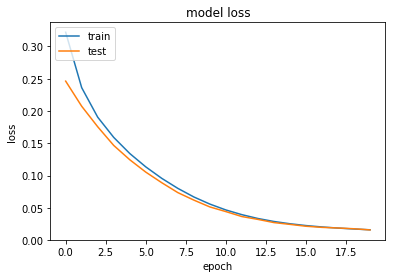

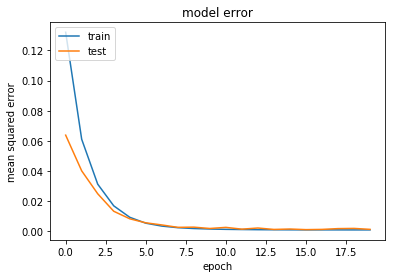

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6750 samples, validate on 270 samples
Epoch 1/20
6750/6750 [==============================] - 0s 71us/step - loss: 0.2164 - mean_squared_error: 0.0554 - val_loss: 0.1992 - val_mean_squared_error: 0.0527
Epoch 2/20
6750/6750 [==============================] - 0s 38us/step - loss: 0.1529 - mean_squared_error: 0.0204 - val_loss: 0.1408 - val_mean_squared_error: 0.0227
Epoch 3/20
6750/6750 [==============================] - 0s 36us/step - loss: 0.1121 - mean_squared_error: 0.0076 - val_loss: 0.1007 - val_mean_squared_error: 0

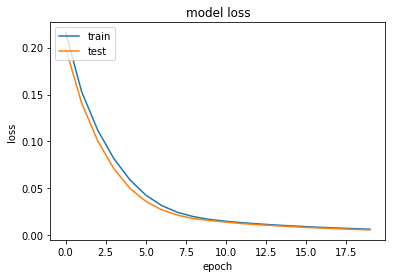

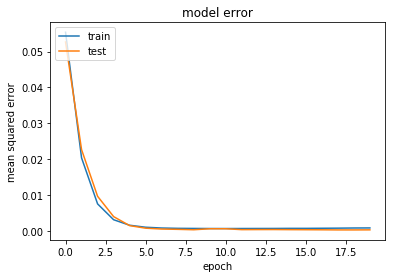

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6750 samples, validate on 270 samples
Epoch 1/20
6750/6750 [==============================] - 0s 71us/step - loss: 0.1710 - mean_squared_error: 0.0293 - val_loss: 0.1423 - val_mean_squared_error: 0.0187
Epoch 2/20
6750/6750 [==============================] - 0s 41us/step - loss: 0.1196 - mean_squared_error: 0.0119 - val_loss: 0.1000 - val_mean_squared_error: 0.0081
Epoch 3/20
6750/6750 [==============================] - 0s 37us/step - loss: 0.0834 - mean_squared_error: 0.0052 - val_loss: 0.0688 - val_mean_squared_error: 0

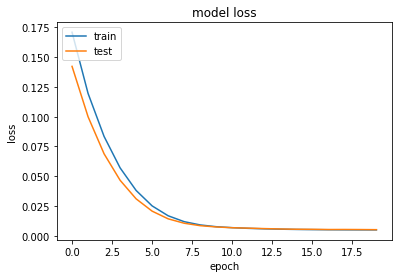

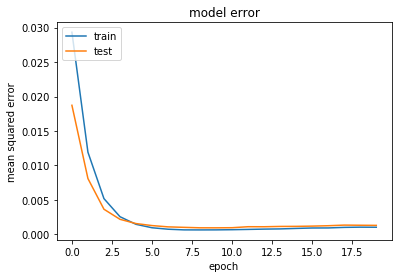

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2700 samples, validate on 108 samples
Epoch 1/20
2700/2700 [==============================] - 0s 115us/step - loss: 0.2618 - mean_squared_error: 0.1017 - val_loss: 0.2110 - val_mean_squared_error: 0.0565
Epoch 2/20
2700/2700 [==============================] - 0s 39us/step - loss: 0.1971 - mean_squared_error: 0.0481 - val_loss: 0.1827 - val_mean_squared_error: 0.0398
Epoch 3/20
2700/2700 [==============================] - 0s 37us/step - loss: 0.1690 - mean_squared_error: 0.0316 - val_loss: 0.1560 - val_mean_squared_error: 

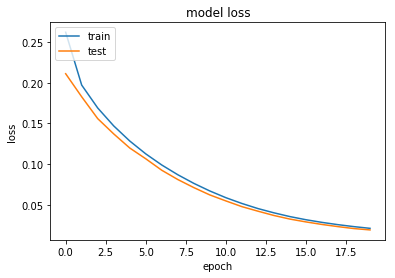

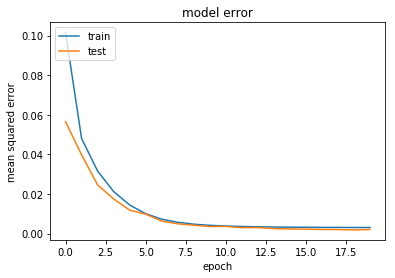

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4050 samples, validate on 162 samples
Epoch 1/20
4050/4050 [==============================] - 0s 89us/step - loss: 0.2240 - mean_squared_error: 0.0623 - val_loss: 0.2003 - val_mean_squared_error: 0.0492
Epoch 2/20
4050/4050 [==============================] - 0s 43us/step - loss: 0.1739 - mean_squared_error: 0.0325 - val_loss: 0.1507 - val_mean_squared_error: 0.0195
Epoch 3/20
4050/4050 [==============================] - 0s 37us/step - loss: 0.1407 - mean_squared_error: 0.0188 - val_loss: 0.1235 - val_mean_squared_error: 0

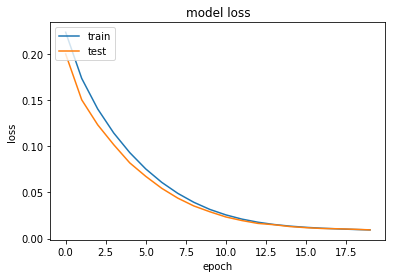

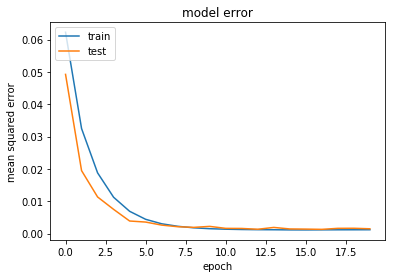

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6780 samples, validate on 240 samples
Epoch 1/20
6780/6780 [==============================] - 0s 68us/step - loss: 0.2214 - mean_squared_error: 0.0628 - val_loss: 0.1820 - val_mean_squared_error: 0.0384
Epoch 2/20
6780/6780 [==============================] - 0s 41us/step - loss: 0.1536 - mean_squared_error: 0.0247 - val_loss: 0.1345 - val_mean_squared_error: 0.0203
Epoch 3/20
6780/6780 [==============================] - 0s 37us/step - loss: 0.1099 - mean_squared_error: 0.0095 - val_loss: 0.0923 - val_mean_squared_error: 0

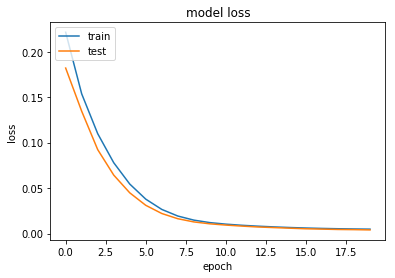

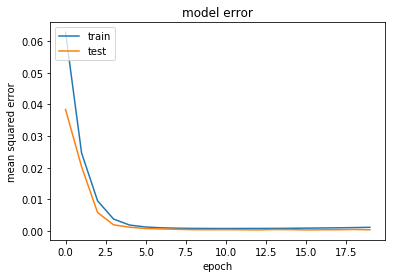

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6780 samples, validate on 240 samples
Epoch 1/20
6780/6780 [==============================] - 0s 70us/step - loss: 0.2304 - mean_squared_error: 0.0798 - val_loss: 0.1971 - val_mean_squared_error: 0.0605
Epoch 2/20
6780/6780 [==============================] - 0s 41us/step - loss: 0.1472 - mean_squared_error: 0.0244 - val_loss: 0.1291 - val_mean_squared_error: 0.0202
Epoch 3/20
6780/6780 [==============================] - 0s 37us/step - loss: 0.1055 - mean_squared_error: 0.0096 - val_loss: 0.0902 - val_mean_squared_error: 0

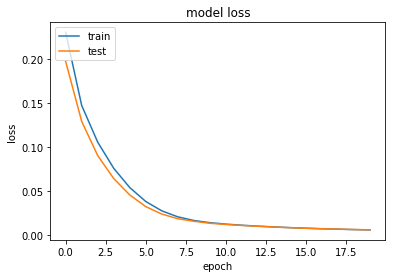

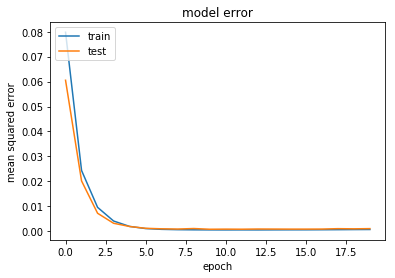

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2712 samples, validate on 96 samples
Epoch 1/20
2712/2712 [==============================] - 0s 115us/step - loss: 0.2616 - mean_squared_error: 0.1006 - val_loss: 0.1941 - val_mean_squared_error: 0.0400
Epoch 2/20
2712/2712 [==============================] - 0s 42us/step - loss: 0.1920 - mean_squared_error: 0.0446 - val_loss: 0.1717 - val_mean_squared_error: 0.0314
Epoch 3/20
2712/2712 [==============================] - 0s 38us/step - loss: 0.1650 - mean_squared_error: 0.0313 - val_loss: 0.1492 - val_mean_squared_error: 0

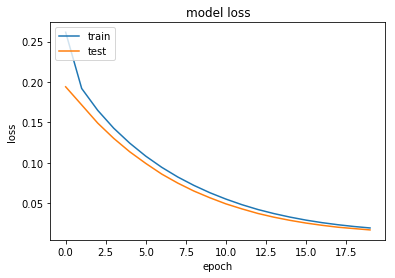

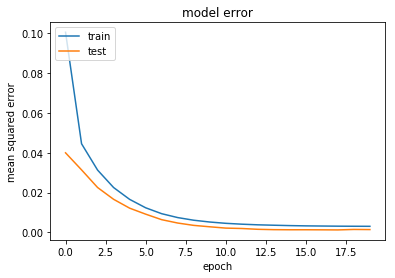

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4068 samples, validate on 144 samples
Epoch 1/20
4068/4068 [==============================] - 0s 87us/step - loss: 0.2438 - mean_squared_error: 0.0854 - val_loss: 0.2191 - val_mean_squared_error: 0.0711
Epoch 2/20
4068/4068 [==============================] - 0s 41us/step - loss: 0.1852 - mean_squared_error: 0.0466 - val_loss: 0.1702 - val_mean_squared_error: 0.0413
Epoch 3/20
4068/4068 [==============================] - 0s 36us/step - loss: 0.1467 - mean_squared_error: 0.0267 - val_loss: 0.1354 - val_mean_squared_error: 0

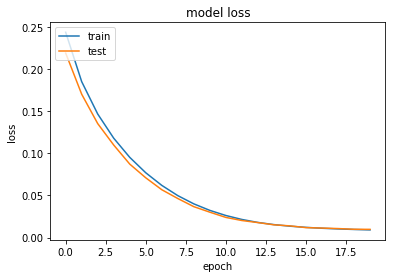

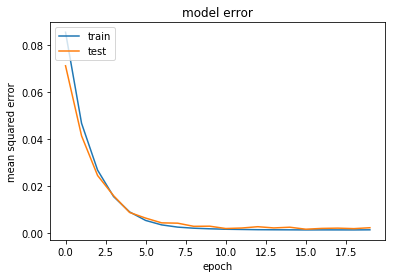

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6810 samples, validate on 210 samples
Epoch 1/20
6810/6810 [==============================] - 0s 70us/step - loss: 0.1965 - mean_squared_error: 0.0431 - val_loss: 0.1541 - val_mean_squared_error: 0.0190
Epoch 2/20
6810/6810 [==============================] - 0s 39us/step - loss: 0.1362 - mean_squared_error: 0.0178 - val_loss: 0.1092 - val_mean_squared_error: 0.0074
Epoch 3/20
6810/6810 [==============================] - 0s 37us/step - loss: 0.0947 - mean_squared_error: 0.0078 - val_loss: 0.0757 - val_mean_squared_error: 0

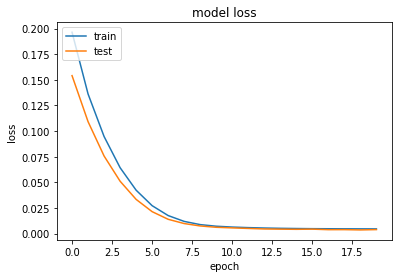

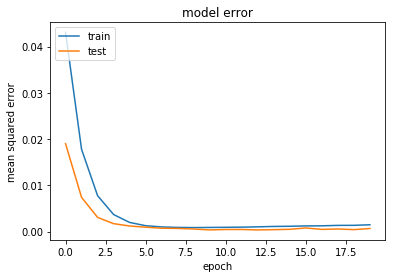

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6810 samples, validate on 210 samples
Epoch 1/20
6810/6810 [==============================] - 0s 68us/step - loss: 0.1945 - mean_squared_error: 0.0460 - val_loss: 0.1544 - val_mean_squared_error: 0.0220
Epoch 2/20
6810/6810 [==============================] - 0s 37us/step - loss: 0.1323 - mean_squared_error: 0.0151 - val_loss: 0.1107 - val_mean_squared_error: 0.0092
Epoch 3/20
6810/6810 [==============================] - 0s 41us/step - loss: 0.0932 - mean_squared_error: 0.0057 - val_loss: 0.0770 - val_mean_squared_error: 0

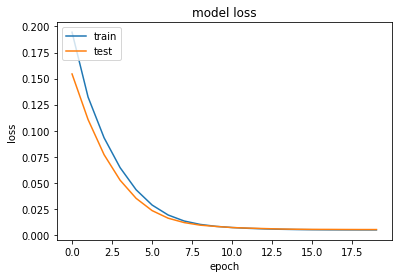

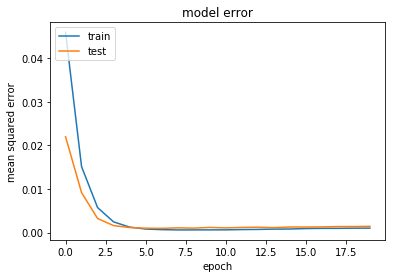

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2724 samples, validate on 84 samples
Epoch 1/20
2724/2724 [==============================] - 0s 115us/step - loss: 0.2739 - mean_squared_error: 0.1035 - val_loss: 0.2420 - val_mean_squared_error: 0.0775
Epoch 2/20
2724/2724 [==============================] - 0s 42us/step - loss: 0.2125 - mean_squared_error: 0.0537 - val_loss: 0.2255 - val_mean_squared_error: 0.0728
Epoch 3/20
2724/2724 [==============================] - 0s 36us/step - loss: 0.1824 - mean_squared_error: 0.0354 - val_loss: 0.1870 - val_mean_squared_error: 0

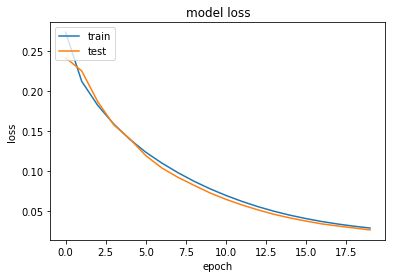

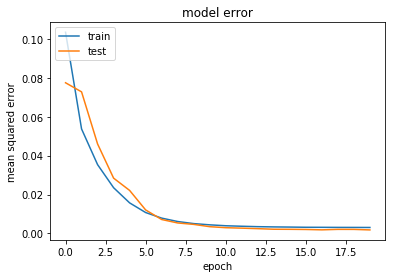

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4086 samples, validate on 126 samples
Epoch 1/20
4086/4086 [==============================] - 0s 87us/step - loss: 0.2586 - mean_squared_error: 0.0965 - val_loss: 0.1837 - val_mean_squared_error: 0.0300
Epoch 2/20
4086/4086 [==============================] - 0s 42us/step - loss: 0.1809 - mean_squared_error: 0.0361 - val_loss: 0.1531 - val_mean_squared_error: 0.0176
Epoch 3/20
4086/4086 [==============================] - 0s 38us/step - loss: 0.1478 - mean_squared_error: 0.0212 - val_loss: 0.1284 - val_mean_squared_error: 0

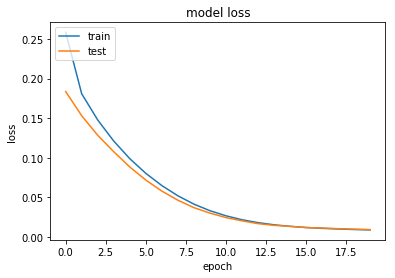

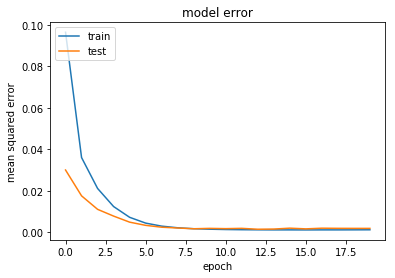

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6840 samples, validate on 180 samples
Epoch 1/20
6840/6840 [==============================] - 0s 69us/step - loss: 0.1920 - mean_squared_error: 0.0351 - val_loss: 0.1646 - val_mean_squared_error: 0.0262
Epoch 2/20
6840/6840 [==============================] - 0s 41us/step - loss: 0.1363 - mean_squared_error: 0.0148 - val_loss: 0.1177 - val_mean_squared_error: 0.0126
Epoch 3/20
6840/6840 [==============================] - 0s 37us/step - loss: 0.0973 - mean_squared_error: 0.0066 - val_loss: 0.0826 - val_mean_squared_error: 0

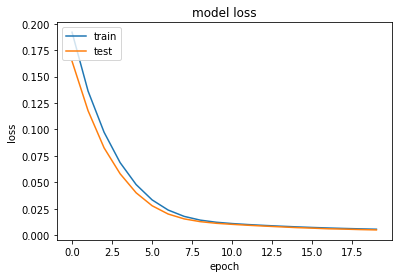

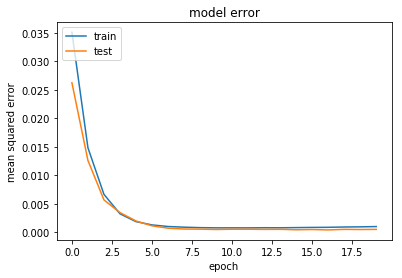

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6840 samples, validate on 180 samples
Epoch 1/20
6840/6840 [==============================] - 0s 68us/step - loss: 0.2148 - mean_squared_error: 0.0544 - val_loss: 0.1748 - val_mean_squared_error: 0.0294
Epoch 2/20
6840/6840 [==============================] - 0s 40us/step - loss: 0.1525 - mean_squared_error: 0.0219 - val_loss: 0.1265 - val_mean_squared_error: 0.0109
Epoch 3/20
6840/6840 [==============================] - 0s 36us/step - loss: 0.1106 - mean_squared_error: 0.0090 - val_loss: 0.0911 - val_mean_squared_error: 0

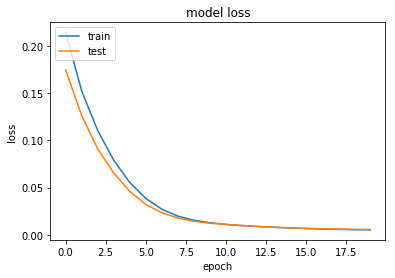

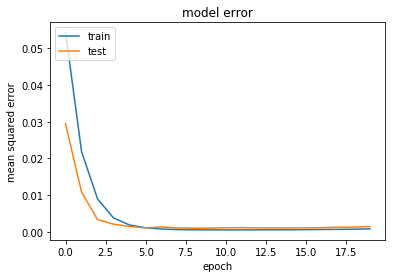

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2736 samples, validate on 72 samples
Epoch 1/20
2736/2736 [==============================] - 0s 119us/step - loss: 0.2302 - mean_squared_error: 0.0692 - val_loss: 0.1880 - val_mean_squared_error: 0.0334
Epoch 2/20
2736/2736 [==============================] - 0s 40us/step - loss: 0.1887 - mean_squared_error: 0.0402 - val_loss: 0.1670 - val_mean_squared_error: 0.0248
Epoch 3/20
2736/2736 [==============================] - 0s 37us/step - loss: 0.1635 - mean_squared_error: 0.0273 - val_loss: 0.1500 - val_mean_squared_error: 0

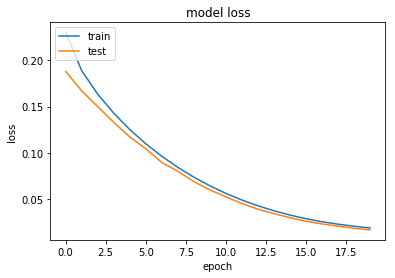

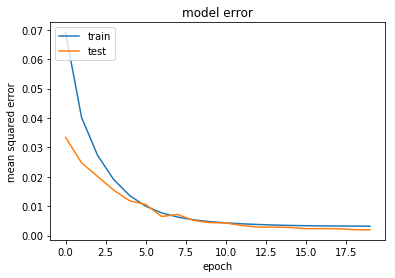

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4104 samples, validate on 108 samples
Epoch 1/20
4104/4104 [==============================] - 0s 86us/step - loss: 0.2529 - mean_squared_error: 0.0860 - val_loss: 0.2005 - val_mean_squared_error: 0.0442
Epoch 2/20
4104/4104 [==============================] - 0s 41us/step - loss: 0.1801 - mean_squared_error: 0.0336 - val_loss: 0.1676 - val_mean_squared_error: 0.0315
Epoch 3/20
4104/4104 [==============================] - 0s 40us/step - loss: 0.1440 - mean_squared_error: 0.0178 - val_loss: 0.1342 - val_mean_squared_error: 0

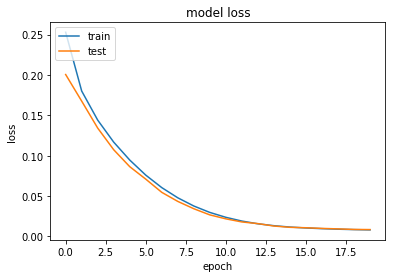

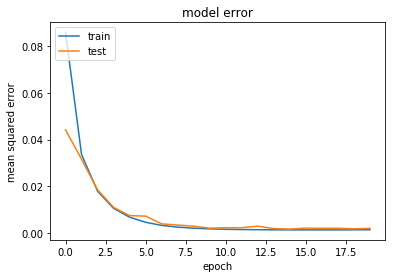

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6870 samples, validate on 150 samples
Epoch 1/20
6870/6870 [==============================] - 0s 71us/step - loss: 0.2342 - mean_squared_error: 0.0771 - val_loss: 0.1685 - val_mean_squared_error: 0.0261
Epoch 2/20
6870/6870 [==============================] - 0s 40us/step - loss: 0.1482 - mean_squared_error: 0.0209 - val_loss: 0.1247 - val_mean_squared_error: 0.0126
Epoch 3/20
6870/6870 [==============================] - 0s 38us/step - loss: 0.1071 - mean_squared_error: 0.0090 - val_loss: 0.0912 - val_mean_squared_error: 0

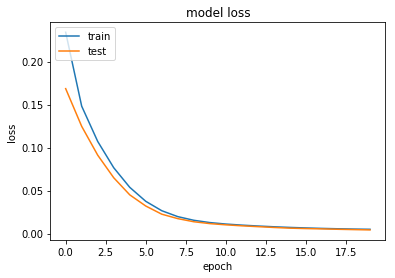

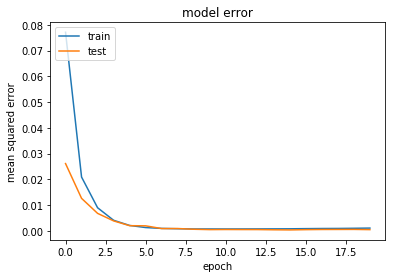

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6870 samples, validate on 150 samples
Epoch 1/20
6870/6870 [==============================] - 0s 69us/step - loss: 0.1966 - mean_squared_error: 0.0481 - val_loss: 0.1557 - val_mean_squared_error: 0.0238
Epoch 2/20
6870/6870 [==============================] - 0s 41us/step - loss: 0.1377 - mean_squared_error: 0.0209 - val_loss: 0.1111 - val_mean_squared_error: 0.0095
Epoch 3/20
6870/6870 [==============================] - 0s 36us/step - loss: 0.0965 - mean_squared_error: 0.0084 - val_loss: 0.0786 - val_mean_squared_error: 0

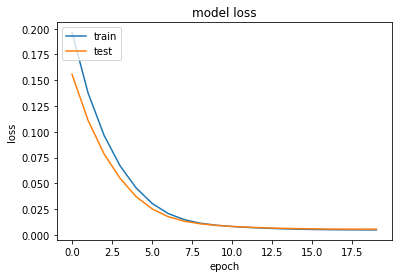

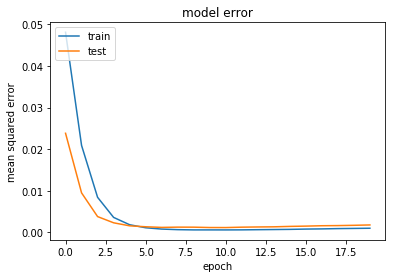

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2748 samples, validate on 60 samples
Epoch 1/20
2748/2748 [==============================] - 0s 119us/step - loss: 0.3828 - mean_squared_error: 0.2189 - val_loss: 0.2411 - val_mean_squared_error: 0.0823
Epoch 2/20
2748/2748 [==============================] - 0s 45us/step - loss: 0.2173 - mean_squared_error: 0.0641 - val_loss: 0.1796 - val_mean_squared_error: 0.0326
Epoch 3/20
2748/2748 [==============================] - 0s 38us/step - loss: 0.1769 - mean_squared_error: 0.0361 - val_loss: 0.1582 - val_mean_squared_error: 0

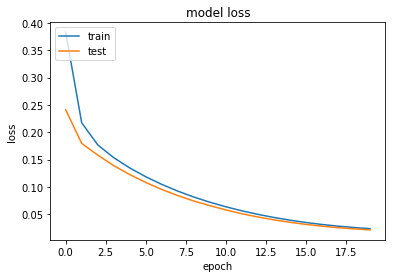

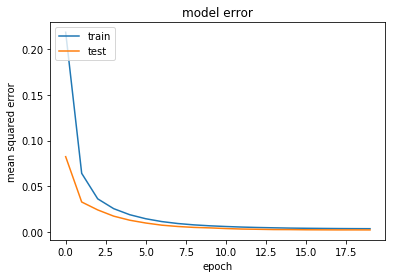

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4122 samples, validate on 90 samples
Epoch 1/20
4122/4122 [==============================] - 0s 91us/step - loss: 0.2028 - mean_squared_error: 0.0479 - val_loss: 0.1767 - val_mean_squared_error: 0.0331
Epoch 2/20
4122/4122 [==============================] - 0s 42us/step - loss: 0.1591 - mean_squared_error: 0.0261 - val_loss: 0.1447 - val_mean_squared_error: 0.0224
Epoch 3/20
4122/4122 [==============================] - 0s 37us/step - loss: 0.1288 - mean_squared_error: 0.0163 - val_loss: 0.1163 - val_mean_squared_error: 0.

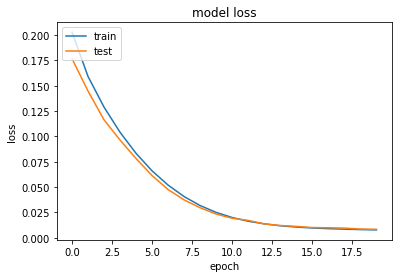

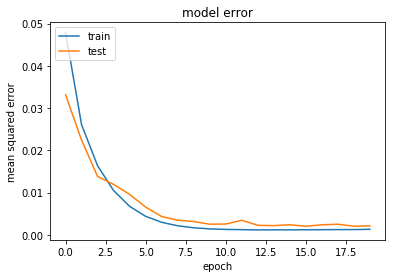

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6900 samples, validate on 120 samples
Epoch 1/20
6900/6900 [==============================] - 0s 71us/step - loss: 0.2974 - mean_squared_error: 0.1206 - val_loss: 0.2701 - val_mean_squared_error: 0.1063
Epoch 2/20
6900/6900 [==============================] - 0s 37us/step - loss: 0.2007 - mean_squared_error: 0.0500 - val_loss: 0.1913 - val_mean_squared_error: 0.0543
Epoch 3/20
6900/6900 [==============================] - 0s 36us/step - loss: 0.1443 - mean_squared_error: 0.0207 - val_loss: 0.1322 - val_mean_squared_error: 0

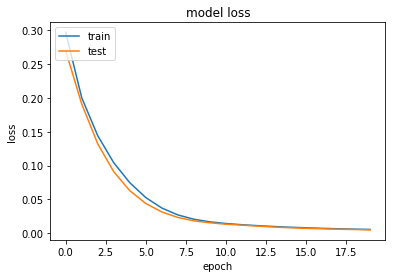

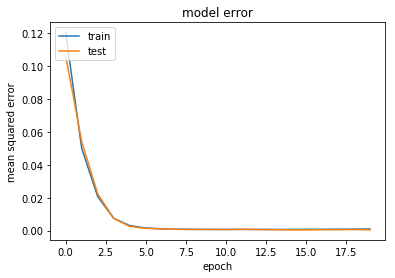

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6900 samples, validate on 120 samples
Epoch 1/20
6900/6900 [==============================] - 0s 69us/step - loss: 0.1975 - mean_squared_error: 0.0398 - val_loss: 0.1536 - val_mean_squared_error: 0.0122
Epoch 2/20
6900/6900 [==============================] - 0s 40us/step - loss: 0.1405 - mean_squared_error: 0.0148 - val_loss: 0.1150 - val_mean_squared_error: 0.0051
Epoch 3/20
6900/6900 [==============================] - 0s 38us/step - loss: 0.1007 - mean_squared_error: 0.0055 - val_loss: 0.0833 - val_mean_squared_error: 0

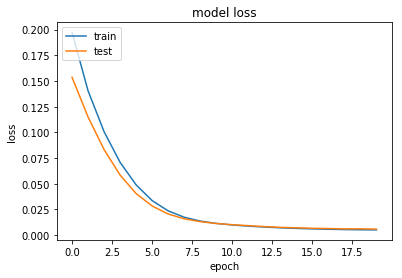

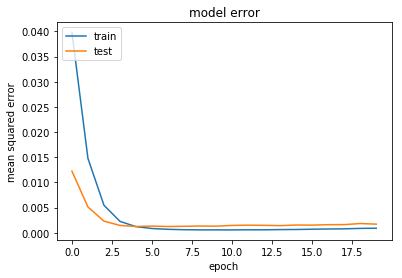

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2760 samples, validate on 48 samples
Epoch 1/20
2760/2760 [==============================] - 0s 112us/step - loss: 0.2193 - mean_squared_error: 0.0593 - val_loss: 0.2050 - val_mean_squared_error: 0.0531
Epoch 2/20
2760/2760 [==============================] - 0s 44us/step - loss: 0.1849 - mean_squared_error: 0.0398 - val_loss: 0.1721 - val_mean_squared_error: 0.0345
Epoch 3/20
2760/2760 [==============================] - 0s 38us/step - loss: 0.1592 - mean_squared_error: 0.0282 - val_loss: 0.1448 - val_mean_squared_error: 0

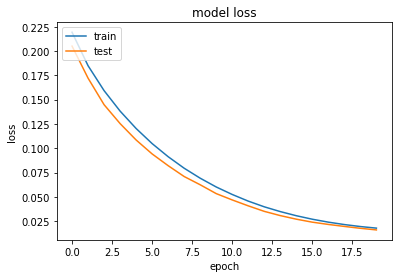

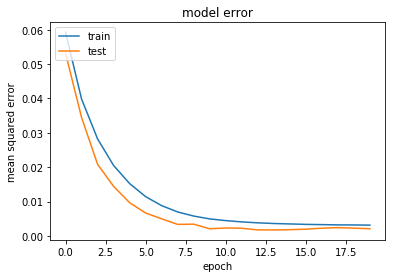

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4140 samples, validate on 72 samples
Epoch 1/20
4140/4140 [==============================] - 0s 91us/step - loss: 0.1968 - mean_squared_error: 0.0440 - val_loss: 0.2116 - val_mean_squared_error: 0.0697
Epoch 2/20
4140/4140 [==============================] - 0s 41us/step - loss: 0.1530 - mean_squared_error: 0.0213 - val_loss: 0.1646 - val_mean_squared_error: 0.0433
Epoch 3/20
4140/4140 [==============================] - 0s 38us/step - loss: 0.1232 - mean_squared_error: 0.0116 - val_loss: 0.1309 - val_mean_squared_error: 0.

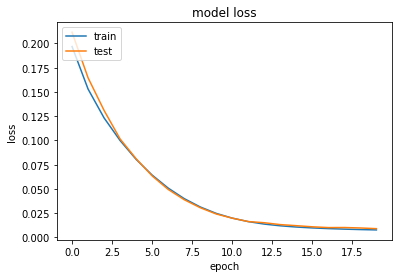

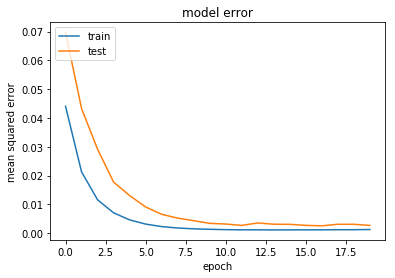

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6930 samples, validate on 90 samples
Epoch 1/20
6930/6930 [==============================] - 0s 66us/step - loss: 0.2280 - mean_squared_error: 0.0628 - val_loss: 0.2135 - val_mean_squared_error: 0.0618
Epoch 2/20
6930/6930 [==============================] - 0s 40us/step - loss: 0.1580 - mean_squared_error: 0.0200 - val_loss: 0.1366 - val_mean_squared_error: 0.0131
Epoch 3/20
6930/6930 [==============================] - 0s 38us/step - loss: 0.1157 - mean_squared_error: 0.0066 - val_loss: 0.0971 - val_mean_squared_error: 0.

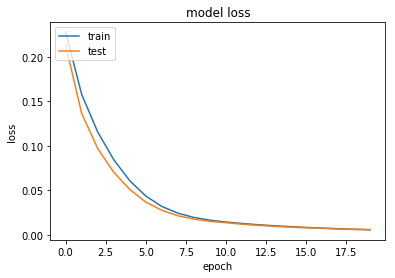

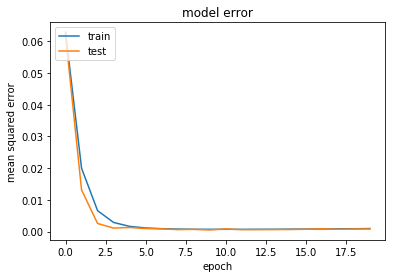

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6930 samples, validate on 90 samples
Epoch 1/20
6930/6930 [==============================] - 1s 78us/step - loss: 0.1750 - mean_squared_error: 0.0280 - val_loss: 0.1539 - val_mean_squared_error: 0.0263
Epoch 2/20
6930/6930 [==============================] - 0s 38us/step - loss: 0.1220 - mean_squared_error: 0.0115 - val_loss: 0.1048 - val_mean_squared_error: 0.0111
Epoch 3/20
6930/6930 [==============================] - 0s 37us/step - loss: 0.0842 - mean_squared_error: 0.0049 - val_loss: 0.0709 - val_mean_squared_error: 0.

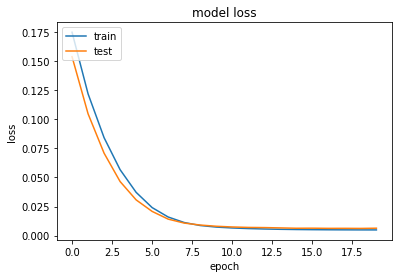

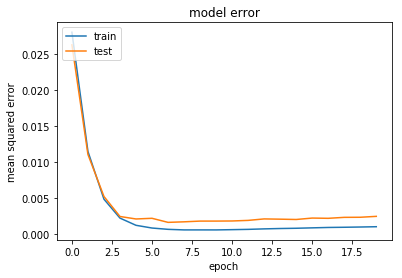

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2772 samples, validate on 36 samples
Epoch 1/20
2772/2772 [==============================] - 0s 110us/step - loss: 0.2402 - mean_squared_error: 0.0837 - val_loss: 0.1824 - val_mean_squared_error: 0.0330
Epoch 2/20
2772/2772 [==============================] - 0s 43us/step - loss: 0.1937 - mean_squared_error: 0.0507 - val_loss: 0.1650 - val_mean_squared_error: 0.0291
Epoch 3/20
2772/2772 [==============================] - 0s 42us/step - loss: 0.1671 - mean_squared_error: 0.0375 - val_loss: 0.1487 - val_mean_squared_error: 0

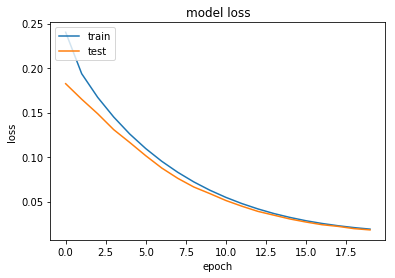

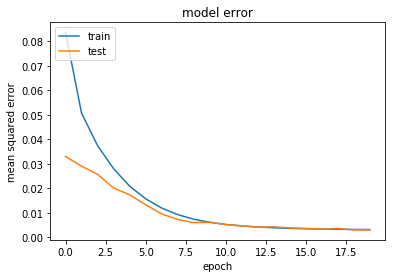

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4158 samples, validate on 54 samples
Epoch 1/20
4158/4158 [==============================] - 0s 91us/step - loss: 0.2345 - mean_squared_error: 0.0747 - val_loss: 0.2069 - val_mean_squared_error: 0.0570
Epoch 2/20
4158/4158 [==============================] - 0s 42us/step - loss: 0.1794 - mean_squared_error: 0.0389 - val_loss: 0.1601 - val_mean_squared_error: 0.0294
Epoch 3/20
4158/4158 [==============================] - 0s 40us/step - loss: 0.1445 - mean_squared_error: 0.0230 - val_loss: 0.1334 - val_mean_squared_error: 0.

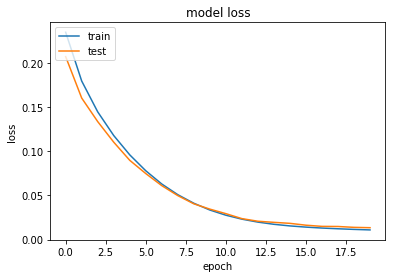

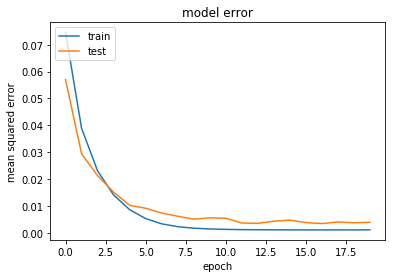

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6960 samples, validate on 60 samples
Epoch 1/20
6960/6960 [==============================] - 0s 70us/step - loss: 0.2120 - mean_squared_error: 0.0543 - val_loss: 0.2726 - val_mean_squared_error: 0.1301
Epoch 2/20
6960/6960 [==============================] - 0s 40us/step - loss: 0.1463 - mean_squared_error: 0.0188 - val_loss: 0.1504 - val_mean_squared_error: 0.0383
Epoch 3/20
6960/6960 [==============================] - 0s 37us/step - loss: 0.1045 - mean_squared_error: 0.0071 - val_loss: 0.0902 - val_mean_squared_error: 0.

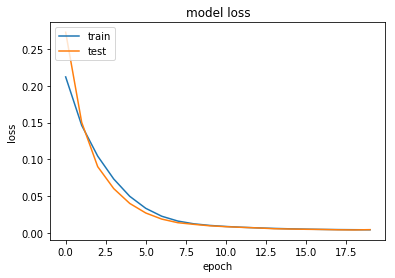

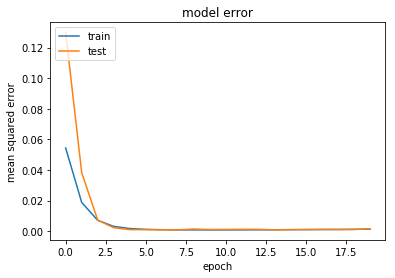

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6960 samples, validate on 60 samples
Epoch 1/20
6960/6960 [==============================] - 0s 68us/step - loss: 0.2172 - mean_squared_error: 0.0644 - val_loss: 0.1546 - val_mean_squared_error: 0.0193
Epoch 2/20
6960/6960 [==============================] - 0s 41us/step - loss: 0.1409 - mean_squared_error: 0.0218 - val_loss: 0.1138 - val_mean_squared_error: 0.0107
Epoch 3/20
6960/6960 [==============================] - 0s 36us/step - loss: 0.0983 - mean_squared_error: 0.0092 - val_loss: 0.0817 - val_mean_squared_error: 0.

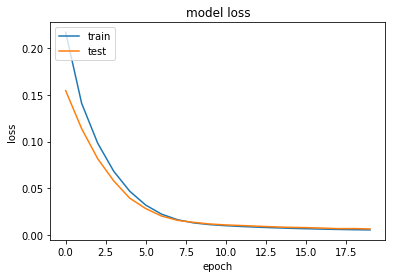

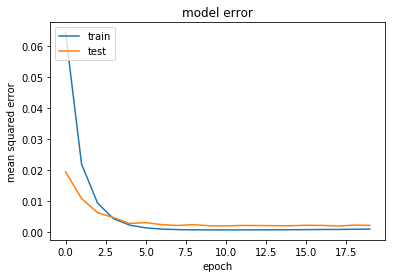

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2784 samples, validate on 24 samples
Epoch 1/20
2784/2784 [==============================] - 0s 111us/step - loss: 0.1706 - mean_squared_error: 0.0254 - val_loss: 0.1422 - val_mean_squared_error: 0.0062
Epoch 2/20
2784/2784 [==============================] - 0s 43us/step - loss: 0.1461 - mean_squared_error: 0.0178 - val_loss: 0.1240 - val_mean_squared_error: 0.0038
Epoch 3/20
2784/2784 [==============================] - 0s 43us/step - loss: 0.1262 - mean_squared_error: 0.0132 - val_loss: 0.1082 - val_mean_squared_error: 0

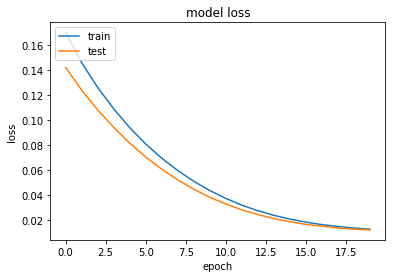

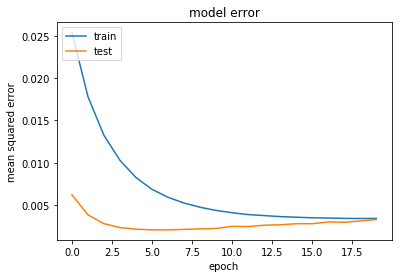

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4176 samples, validate on 36 samples
Epoch 1/20
4176/4176 [==============================] - 0s 88us/step - loss: 0.2486 - mean_squared_error: 0.0778 - val_loss: 0.1977 - val_mean_squared_error: 0.0355
Epoch 2/20
4176/4176 [==============================] - 0s 42us/step - loss: 0.1887 - mean_squared_error: 0.0347 - val_loss: 0.1646 - val_mean_squared_error: 0.0196
Epoch 3/20
4176/4176 [==============================] - 0s 37us/step - loss: 0.1530 - mean_squared_error: 0.0169 - val_loss: 0.1396 - val_mean_squared_error: 0.

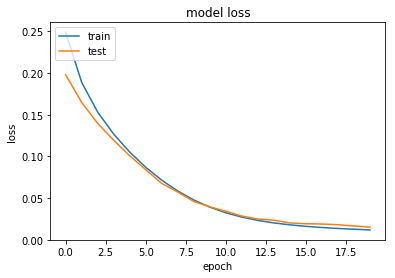

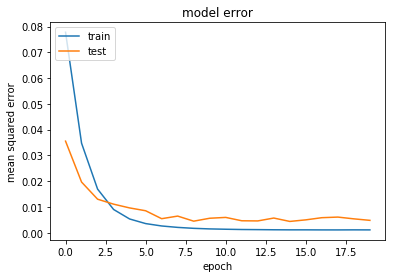

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6990 samples, validate on 30 samples
Epoch 1/20
6990/6990 [==============================] - 0s 65us/step - loss: 0.2289 - mean_squared_error: 0.0666 - val_loss: 0.2747 - val_mean_squared_error: 0.1265
Epoch 2/20
6990/6990 [==============================] - 0s 40us/step - loss: 0.1600 - mean_squared_error: 0.0254 - val_loss: 0.1570 - val_mean_squared_error: 0.0365
Epoch 3/20
6990/6990 [==============================] - 0s 36us/step - loss: 0.1160 - mean_squared_error: 0.0090 - val_loss: 0.1011 - val_mean_squared_error: 0.

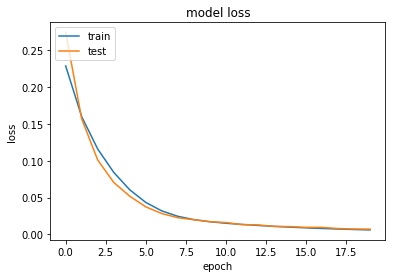

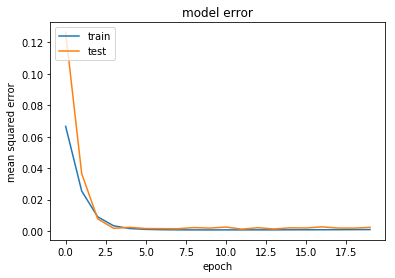

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 6990 samples, validate on 30 samples
Epoch 1/20
6990/6990 [==============================] - 0s 69us/step - loss: 0.2529 - mean_squared_error: 0.0998 - val_loss: 0.1795 - val_mean_squared_error: 0.0402
Epoch 2/20
6990/6990 [==============================] - 0s 42us/step - loss: 0.1517 - mean_squared_error: 0.0262 - val_loss: 0.1333 - val_mean_squared_error: 0.0222
Epoch 3/20
6990/6990 [==============================] - 0s 47us/step - loss: 0.1036 - mean_squared_error: 0.0069 - val_loss: 0.0897 - val_mean_squared_error: 0.

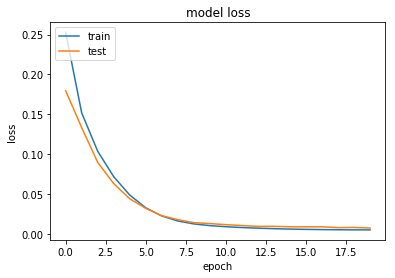

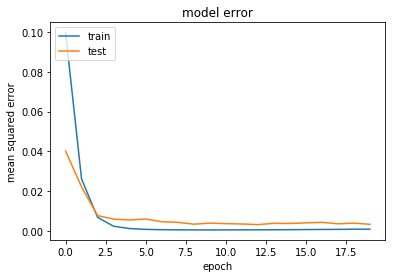

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 2796 samples, validate on 12 samples
Epoch 1/20
2796/2796 [==============================] - 0s 111us/step - loss: 0.2292 - mean_squared_error: 0.0720 - val_loss: 0.1642 - val_mean_squared_error: 0.0149
Epoch 2/20
2796/2796 [==============================] - 0s 38us/step - loss: 0.1868 - mean_squared_error: 0.0443 - val_loss: 0.1435 - val_mean_squared_error: 0.0081
Epoch 3/20
2796/2796 [==============================] - 0s 37us/step - loss: 0.1563 - mean_squared_error: 0.0276 - val_loss: 0.1278 - val_mean_squared_error: 0

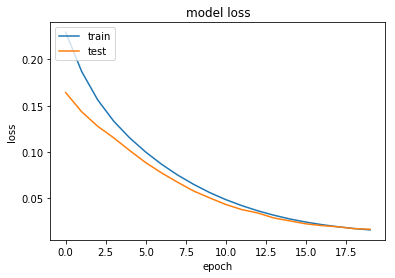

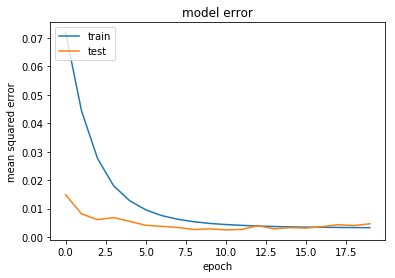

C:\Users\Alex\Anaconda3\envs\tf_gpu\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 1760      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 9         
Total params: 1,769
Trainable params: 1,769
Non-trainable params: 0
_________________________________________________________________
Train on 4194 samples, validate on 18 samples
Epoch 1/20
4194/4194 [==============================] - 0s 92us/step - loss: 0.2336 - mean_squared_error: 0.0715 - val_loss: 0.1758 - val_mean_squared_error: 0.0228
Epoch 2/20
4194/4194 [==============================] - 0s 40us/step - loss: 0.1767 - mean_squared_error: 0.0327 - val_loss: 0.1464 - val_mean_squared_error: 0.0119
Epoch 3/20
4194/4194 [==============================] - 0s 39us/step - loss: 0.1428 - mean_squared_error: 0.0171 - val_loss: 0.1281 - val_mean_squared_error: 0.

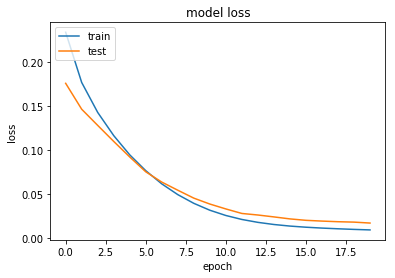

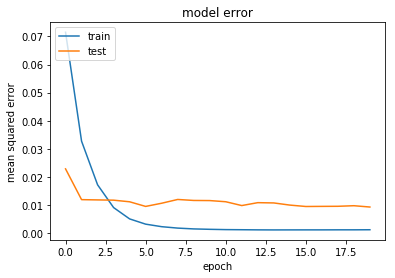

2068.173357963562


In [24]:
#2 dataframes, one for N+1 and one for N+2
start = time.time()
"the code you want to test stays here"

Nplus1 = pd.DataFrame(columns=['testWeek', 'DC', 'Nplus1CUBEPrediction', 'Nplus1CUBE'])
Nplus2 = pd.DataFrame(columns=['testWeek', 'DC', 'Nplus2CUBEPrediction', 'Nplus2CUBE'])
targets = [['Nplus1CUBE'],['Nplus2CUBE']]
modelType = 'Global'
for targetVar in targets:
    for testWeek in range(247,299):
        for DC in DCRegionPairs.keys():
        #for DC in range(4,5):
            #targetVar = [targetVar]
            pred = DCPrediction(modelType, testWeek, DC, targetVar)
            if (targetVar == targets[0]):
                Nplus1 = Nplus1.append(pred,ignore_index=True)
            else:
                Nplus2 = Nplus2.append(pred,ignore_index=True)
end = time.time()
duration = end - start
print(duration)

In [25]:
Nplus1

,testWeek,DC,Nplus1CUBEPrediction,Nplus1CUBE
0,247,4,483755.312500,397818.799674
1,247,5,289267.593750,299361.761218
2,247,7,178320.718750,218772.545399
3,247,8,449450.343750,442294.119701
4,248,4,479936.781250,382216.414893
5,248,5,325071.593750,315313.392527
6,248,7,198103.468750,224483.515719
7,248,8,462808.937500,485248.742811
8,249,4,400880.843750,385696.502809
9,249,5,310929.000000,374914.918715


## Section 4: Calculate MAPE

In [26]:
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [27]:
def summaryMAPE(Nplus1, Nplus2, targets):
    # dictionary of 8 values: 4 DCs by 2 weeks
    DCYearlyMAPE = {}
    for DC in DCRegionPairs.keys():
        DCNplus1 = Nplus1.loc[Nplus1['DC'] == DC]
        DCNplus2 = Nplus2.loc[Nplus2['DC'] == DC]
        DCYearlyMAPE['DC'+str(DC)+'Nplus1MAPE'] = mean_absolute_percentage_error(DCNplus1[['Nplus1CUBE']].values, DCNplus1[['Nplus1CUBEPrediction']].values)
        DCYearlyMAPE['DC'+str(DC)+'Nplus2MAPE'] = mean_absolute_percentage_error(DCNplus2[['Nplus2CUBE']].values, DCNplus2[['Nplus2CUBEPrediction']].values)
    return DCYearlyMAPE

In [28]:
DCYearlyMAPE = summaryMAPE(Nplus1,Nplus2,targets)

In [29]:
DCYearlyMAPE

{'DC4Nplus1MAPE': 13.912686217892253,
 'DC4Nplus2MAPE': 15.62690342577335,
 'DC5Nplus1MAPE': 8.419763630263025,
 'DC5Nplus2MAPE': 9.594091048963001,
 'DC7Nplus1MAPE': 17.684508413094832,
 'DC7Nplus2MAPE': 15.472375398413913,
 'DC8Nplus1MAPE': 10.555568581924902,
 'DC8Nplus2MAPE': 13.518148246482106}

In [30]:
import openpyxl

In [31]:
#Write results to excel
writer = pd.ExcelWriter('output.xlsx')
Nplus1.to_excel(writer,'Nplus1CUBE')
Nplus2.to_excel(writer,'Nplus2CUBE')
writer.save()